## Data Preparation

In [2]:
import numpy as np
from pathlib import Path
import pandas as pd
import time
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split


In [3]:
df_combine = pd.read_excel('data_ekstraksi_fitur.xlsx')
df_combine.drop('Unnamed: 0',inplace=True, axis =1)
df_combine

,MFCC Means,MFCC std,MFCC max,MFCC min,Entropy,Wavelet Means,Wavelet std,Wavelet max,Wavelet min,Med_mfcc,...,Med_wavelet,Var_wavelet,Skew_wavelet,Q1_wavelet,Q3_wavelet,IQR_wavelet,MinMax_wavelet,Kurt_wavelet,Annotation,Label
0,-36.678809,201.694061,212.236206,-938.331787,13.400012,-7.728091e-08,0.000306,0.011636,-0.010880,1.496959,...,-1.147631e-08,9.356884e-08,1.613227,-0.000007,0.000007,0.000014,0.022515,418.606333,1,MI
1,-39.232468,223.005539,127.303085,-1039.210693,13.400133,-1.878137e-08,0.000246,0.002946,-0.003826,4.389492,...,-3.155773e-09,6.055543e-08,-0.641351,-0.000006,0.000006,0.000012,0.006772,41.560283,1,MI
2,-37.112969,214.030426,167.961395,-1002.397705,13.399989,2.572571e-08,0.000447,0.005566,-0.005214,6.168247,...,1.332484e-08,2.000804e-07,-0.507514,-0.000010,0.000010,0.000020,0.010779,29.429487,1,MI
3,-34.888764,192.099609,228.022308,-892.935242,13.400480,4.358653e-08,0.001195,0.038946,-0.026688,2.161711,...,2.578417e-09,1.427957e-06,3.953869,-0.000010,0.000011,0.000021,0.065634,236.341009,1,MI
4,-40.347881,221.986404,176.611816,-1047.209961,13.399878,-2.001091e-08,0.000272,0.004847,-0.005081,3.742413,...,5.775855e-09,7.417933e-08,-0.002854,-0.000008,0.000008,0.000016,0.009928,41.556179,1,MI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555,-40.171440,212.366180,177.526321,-984.905029,13.400049,5.682776e-08,0.000409,0.008677,-0.010058,0.121728,...,1.826697e-08,2.481067e-08,-1.830285,-0.000008,0.000008,0.000016,0.010824,65.836710,0,Normal
556,-34.351629,191.448502,235.921875,-897.360107,13.400322,1.793516e-07,0.000917,0.062172,-0.051494,1.646094,...,-8.562095e-09,1.785476e-08,0.960469,-0.000004,0.000004,0.000007,0.004879,55.845105,0,Normal
557,-37.142624,206.061218,203.988678,-967.146240,13.400315,1.140980e-07,0.000874,0.006571,-0.008417,0.721306,...,1.731472e-08,3.796947e-08,2.413781,-0.000006,0.000007,0.000013,0.013367,375.537171,0,Normal
558,-36.267398,211.922684,150.811371,-994.028564,13.400025,4.139168e-08,0.000789,0.008981,-0.013399,4.042179,...,-1.295093e-09,1.205511e-08,-0.337720,-0.000004,0.000004,0.000007,0.005612,81.082611,0,Normal


In [4]:
# Memisahkan kolom fitur (numerik) dan label
feature_df = df_combine.drop(columns=['Annotation', 'Label'])
labels_df = df_combine[['Label']]

In [5]:
from sklearn.preprocessing import StandardScaler

# Memilih hanya kolom numerik untuk normalisasi
numeric_features = feature_df.select_dtypes(include=[float, int])

# Menggunakan StandardScaler untuk normalisasi
scaler = StandardScaler()
feature_df_scaled = pd.DataFrame(scaler.fit_transform(numeric_features), columns=numeric_features.columns)

# Menggabungkan kembali dengan kolom label
df_combine_scaled = pd.concat([feature_df_scaled, labels_df.reset_index(drop=True)], axis=1)

df_combine_scaled

,MFCC Means,MFCC std,MFCC max,MFCC min,Entropy,Wavelet Means,Wavelet std,Wavelet max,Wavelet min,Med_mfcc,...,Kurt_mfcc,Med_wavelet,Var_wavelet,Skew_wavelet,Q1_wavelet,Q3_wavelet,IQR_wavelet,MinMax_wavelet,Kurt_wavelet,Label
0,0.805298,-0.893321,0.727190,0.942132,0.063608,-1.137174,-0.430682,0.024031,0.004692,-0.598371,...,0.334547,-0.889833,-0.218548,1.146071,-0.076698,0.026616,0.051833,0.226780,1.470453,MI
1,-0.228878,0.601932,-2.114222,-0.483793,0.064888,-0.388901,-0.565070,-0.549047,0.441349,1.257240,...,0.964492,-0.241600,-0.239203,-0.594643,0.178925,-0.172615,-0.176615,-0.536473,-0.367429,MI
2,0.629472,-0.027778,-0.754010,0.036559,0.063367,0.180394,-0.112938,-0.376300,0.355416,2.398342,...,0.758335,1.042363,-0.151908,-0.491310,-0.838081,0.944422,0.895745,-0.342184,-0.426560,MI
3,1.530227,-1.566485,1.255310,1.583813,0.068559,0.408853,1.567008,1.825143,-0.973889,-0.171921,...,0.690955,0.205136,0.616326,2.953232,-0.848416,0.973499,0.915575,2.317193,0.582014,MI
4,-0.680597,0.530428,-0.464613,-0.596863,0.062193,-0.404628,-0.506024,-0.423697,0.363664,0.842127,...,0.007908,0.454240,-0.230679,-0.101673,-0.313961,0.340572,0.328898,-0.383486,-0.367449,MI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555,-0.609142,-0.144545,-0.434018,0.283818,0.063993,0.578223,-0.198366,-0.171118,0.055580,-1.480606,...,0.799267,1.427391,-0.261567,-1.512594,-0.246284,0.377290,0.313500,-0.340024,-0.249096,Normal
556,1.747755,-1.612168,1.519587,1.521268,0.066883,2.145437,0.942271,3.356855,-2.509400,-0.502698,...,-0.320527,-0.662793,-0.265919,0.642089,0.719230,-0.792981,-0.759893,-0.628227,-0.297799,Normal
557,0.617463,-0.586913,0.451272,0.534839,0.066816,1.310772,0.844857,-0.309999,0.157151,-1.095966,...,-0.556578,1.353204,-0.253334,1.764162,0.088257,0.009107,-0.039621,-0.216743,1.260515,Normal
558,0.971910,-0.175661,-1.327759,0.154857,0.063749,0.380779,0.653838,-0.151057,-0.151286,1.034433,...,0.107386,-0.096640,-0.269548,-0.360215,0.775826,-0.773674,-0.778514,-0.592723,-0.174781,Normal


In [6]:
X = df_combine_scaled.drop('Label', axis=1).values
y = df_combine_scaled['Label'].values
print(y)
print(y.shape)

['MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI' 'MI'
 'MI' 

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Menampilkan jumlah data dalam setiap set
print("Jumlah data latih:", X_train.shape[0])
print("Jumlah data uji:", X_test.shape[0])

Jumlah data latih: 448
Jumlah data uji: 112


## Spectral with Transformer Encoder

In [8]:
selected_columns = ['MFCC Means', 'MFCC std', 'MFCC max', 'MFCC min', 'Med_mfcc', 'Var_mfcc', 'Skew_mfcc', 'Q1_mfcc', 'Q3_mfcc', 'IQR_mfcc', 'MinMax_mfcc', 'Kurt_mfcc', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_spectral = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_spectral.head())

   MFCC Means  MFCC std  MFCC max  MFCC min  Med_mfcc  Var_mfcc  Skew_mfcc  \
0    0.805298 -0.893321  0.727190  0.942132 -0.598371 -0.921706  -0.321473   
1   -0.228878  0.601932 -2.114222 -0.483793  1.257240  0.594724  -0.971689   
2    0.629472 -0.027778 -0.754010  0.036559  2.398342 -0.062456  -0.766293   
3    1.530227 -1.566485  1.255310  1.583813 -0.171921 -1.554723  -0.653024   
4   -0.680597  0.530428 -0.464613 -0.596863  0.842127  0.518742  -0.035472   

    Q1_mfcc   Q3_mfcc  IQR_mfcc  MinMax_mfcc  Kurt_mfcc Label  
0  0.734321 -0.816269 -1.060130    -0.538695   0.334547    MI  
1  0.669311  0.773221  0.321963    -0.347450   0.964492    MI  
2  0.749218  1.135122  0.589301    -0.301331   0.758335    MI  
3  0.715255 -0.219460 -0.543864    -0.893826   0.690955    MI  
4 -0.499815  0.770667  0.904191     0.339870   0.007908    MI  


In [9]:
X = df_spectral.drop('Label', axis=1).values
y = df_spectral['Label'].values

In [10]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class TransformerModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerModel, self).__init__()
        self.embedding = nn.Linear(input_dim, dim_feedforward)
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(0)  # Transformer expects a sequence, so add a sequence dimension
        x = self.transformer_encoder(x)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6583, Accuracy: 60.61%, Recall: 0.61, Validation Loss: 0.6151, Validation Accuracy: 75.56%, Validation Recall: 0.75
Epoch 2/50, Loss: 0.6020, Accuracy: 70.95%, Recall: 0.71, Validation Loss: 0.5484, Validation Accuracy: 67.78%, Validation Recall: 0.68
Epoch 3/50, Loss: 0.5629, Accuracy: 69.27%, Recall: 0.69, Validation Loss: 0.5509, Validation Accuracy: 71.11%, Validation Recall: 0.71
Epoch 4/50, Loss: 0.5353, Accuracy: 72.91%, Recall: 0.73, Validation Loss: 0.6235, Validation Accuracy: 67.78%, Validation Recall: 0.68
Epoch 5/50, Loss: 0.5195, Accuracy: 74.86%, Recall: 0.75, Validation Loss: 0.5595, Validation Accuracy: 72.22%, Validation Recall: 0.72
Epoch 6/50, Loss: 0.5496, Accuracy: 67.88%, Recall: 0.68, Validation Loss: 0.6247, Validation Accuracy: 66.67%, Validation Recall: 0.67
Epoch 7/50, Loss: 0.5070, Accuracy: 71.79%, Recall: 0.72, Validation Loss: 0.5945, Validation Accuracy: 68.89%, Validation Recall: 0.68
Epoch 8/50, Loss: 0.5250, Accuracy: 71.23%, Reca

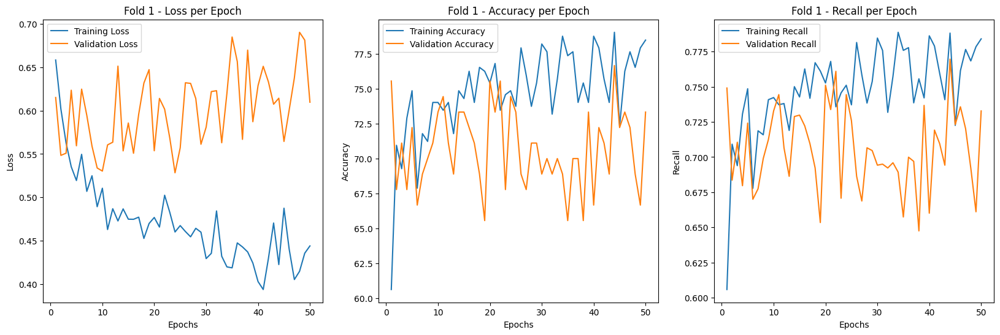

Fold 2


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6439, Accuracy: 67.32%, Recall: 0.67, Validation Loss: 0.8839, Validation Accuracy: 53.33%, Validation Recall: 0.53
Epoch 2/50, Loss: 0.6224, Accuracy: 63.97%, Recall: 0.64, Validation Loss: 0.6625, Validation Accuracy: 66.67%, Validation Recall: 0.67
Epoch 3/50, Loss: 0.5736, Accuracy: 68.16%, Recall: 0.68, Validation Loss: 0.6199, Validation Accuracy: 68.89%, Validation Recall: 0.69
Epoch 4/50, Loss: 0.5544, Accuracy: 67.88%, Recall: 0.68, Validation Loss: 0.5560, Validation Accuracy: 68.89%, Validation Recall: 0.68
Epoch 5/50, Loss: 0.5314, Accuracy: 72.63%, Recall: 0.73, Validation Loss: 0.5512, Validation Accuracy: 75.56%, Validation Recall: 0.75
Epoch 6/50, Loss: 0.5537, Accuracy: 71.51%, Recall: 0.72, Validation Loss: 0.5355, Validation Accuracy: 76.67%, Validation Recall: 0.77
Epoch 7/50, Loss: 0.5151, Accuracy: 73.18%, Recall: 0.73, Validation Loss: 0.5124, Validation Accuracy: 73.33%, Validation Recall: 0.73
Epoch 8/50, Loss: 0.5455, Accuracy: 69.27%, Reca

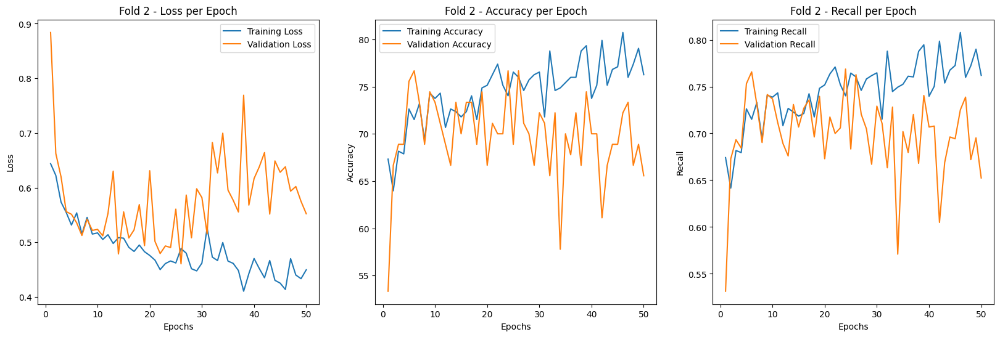

Fold 3


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6816, Accuracy: 63.97%, Recall: 0.64, Validation Loss: 0.6574, Validation Accuracy: 66.67%, Validation Recall: 0.66
Epoch 2/50, Loss: 0.5910, Accuracy: 70.39%, Recall: 0.70, Validation Loss: 0.5703, Validation Accuracy: 61.11%, Validation Recall: 0.61
Epoch 3/50, Loss: 0.5686, Accuracy: 70.95%, Recall: 0.71, Validation Loss: 0.5869, Validation Accuracy: 64.44%, Validation Recall: 0.65
Epoch 4/50, Loss: 0.5128, Accuracy: 75.14%, Recall: 0.75, Validation Loss: 0.6949, Validation Accuracy: 60.00%, Validation Recall: 0.61
Epoch 5/50, Loss: 0.5066, Accuracy: 74.30%, Recall: 0.74, Validation Loss: 0.6070, Validation Accuracy: 61.11%, Validation Recall: 0.62
Epoch 6/50, Loss: 0.5255, Accuracy: 73.46%, Recall: 0.74, Validation Loss: 0.5818, Validation Accuracy: 64.44%, Validation Recall: 0.64
Epoch 7/50, Loss: 0.4723, Accuracy: 77.65%, Recall: 0.78, Validation Loss: 0.7404, Validation Accuracy: 64.44%, Validation Recall: 0.64
Epoch 8/50, Loss: 0.5068, Accuracy: 77.93%, Reca

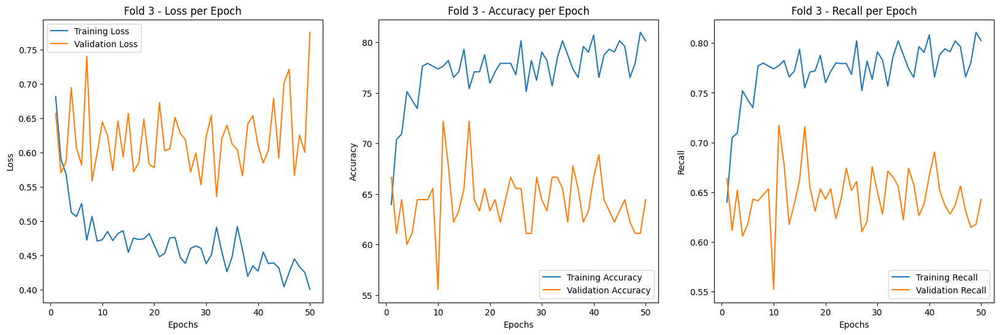

Fold 4


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6662, Accuracy: 61.00%, Recall: 0.61, Validation Loss: 0.6779, Validation Accuracy: 66.29%, Validation Recall: 0.68
Epoch 2/50, Loss: 0.6000, Accuracy: 68.25%, Recall: 0.68, Validation Loss: 0.5471, Validation Accuracy: 71.91%, Validation Recall: 0.73
Epoch 3/50, Loss: 0.5558, Accuracy: 69.08%, Recall: 0.69, Validation Loss: 0.5300, Validation Accuracy: 67.42%, Validation Recall: 0.67
Epoch 4/50, Loss: 0.5595, Accuracy: 69.08%, Recall: 0.69, Validation Loss: 0.5416, Validation Accuracy: 73.03%, Validation Recall: 0.74
Epoch 5/50, Loss: 0.5343, Accuracy: 69.64%, Recall: 0.70, Validation Loss: 0.5475, Validation Accuracy: 66.29%, Validation Recall: 0.66
Epoch 6/50, Loss: 0.5283, Accuracy: 69.64%, Recall: 0.70, Validation Loss: 0.5577, Validation Accuracy: 70.79%, Validation Recall: 0.71
Epoch 7/50, Loss: 0.5473, Accuracy: 70.19%, Recall: 0.70, Validation Loss: 0.5513, Validation Accuracy: 65.17%, Validation Recall: 0.64
Epoch 8/50, Loss: 0.5304, Accuracy: 73.26%, Reca

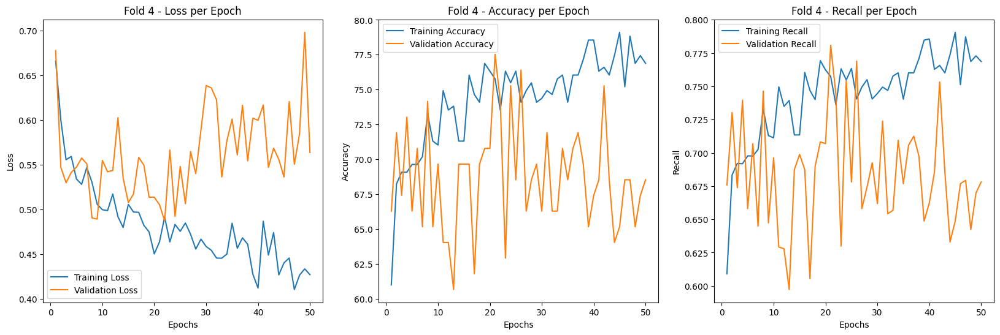

Fold 5


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6460, Accuracy: 63.23%, Recall: 0.63, Validation Loss: 0.6352, Validation Accuracy: 62.92%, Validation Recall: 0.62
Epoch 2/50, Loss: 0.5701, Accuracy: 68.25%, Recall: 0.68, Validation Loss: 0.6392, Validation Accuracy: 60.67%, Validation Recall: 0.63
Epoch 3/50, Loss: 0.5350, Accuracy: 71.03%, Recall: 0.71, Validation Loss: 0.5738, Validation Accuracy: 66.29%, Validation Recall: 0.66
Epoch 4/50, Loss: 0.5553, Accuracy: 71.03%, Recall: 0.71, Validation Loss: 0.5817, Validation Accuracy: 59.55%, Validation Recall: 0.61
Epoch 5/50, Loss: 0.5883, Accuracy: 66.57%, Recall: 0.67, Validation Loss: 0.6052, Validation Accuracy: 62.92%, Validation Recall: 0.64
Epoch 6/50, Loss: 0.5086, Accuracy: 73.54%, Recall: 0.74, Validation Loss: 0.5674, Validation Accuracy: 69.66%, Validation Recall: 0.70
Epoch 7/50, Loss: 0.5010, Accuracy: 69.64%, Recall: 0.70, Validation Loss: 0.5614, Validation Accuracy: 71.91%, Validation Recall: 0.71
Epoch 8/50, Loss: 0.4937, Accuracy: 71.03%, Reca

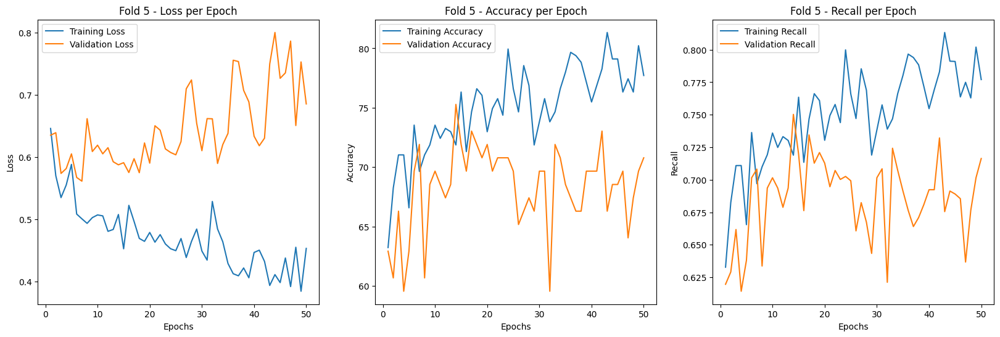

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.4441 - Train Accuracy: 78.49% - Train Recall: 0.78
           - Validation Loss: 0.6096 - Validation Accuracy: 73.33% - Validation Recall: 0.73
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.4496 - Train Accuracy: 76.26% - Train Recall: 0.76
           - Validation Loss: 0.5522 - Validation Accuracy: 65.56% - Validation Recall: 0.65
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.4001 - Train Accuracy: 80.17% - Train Recall: 0.80
           - Validation Loss: 0.7755 - Validation Accuracy: 64.44% - Validation Recall: 0.64
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.4272 - Train Accuracy: 76.88% - Train Recall: 0.77
           - Validation Loss: 0.5640 

In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score
import numpy as np
import os
import matplotlib.pyplot as plt

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
train_recall_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []
val_recall_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('spectral_transformer_encoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss, akurasi, dan recall per epoch
    train_losses = []
    train_accuracies = []
    train_recalls = []
    val_losses = []
    val_accuracies = []
    val_recalls = []

    # Training loop untuk fold ini
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0
        all_train_preds = []
        all_train_labels = []

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

            # Simpan prediksi dan label untuk perhitungan recall
            all_train_preds.extend(predicted.cpu().numpy())
            all_train_labels.extend(y_batch.cpu().numpy())

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train
        train_recall = recall_score(all_train_labels, all_train_preds, average='macro')

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        all_val_preds = []
        all_val_labels = []
        
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

                # Simpan prediksi dan label untuk perhitungan recall
                all_val_preds.extend(predicted.cpu().numpy())
                all_val_labels.extend(y_batch.cpu().numpy())

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val
        val_recall = recall_score(all_val_labels, all_val_preds, average='macro')

        # Simpan loss, akurasi, dan recall per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        train_recalls.append(train_recall)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)
        val_recalls.append(val_recall)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, Recall: {train_recall:.2f}, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%, Validation Recall: {val_recall:.2f}')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    train_recall_per_fold.append(train_recall)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)
    val_recall_per_fold.append(val_recall)

    # Simpan model
    model_filename = f'spectral_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss, akurasi, dan recall
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(20, 6))

    plt.subplot(1, 3, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs_range, train_recalls, label='Training Recall')
    plt.plot(epochs_range, val_recalls, label='Validation Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.title(f'Fold {fold_no} - Recall per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}% - Train Recall: {train_recall_per_fold[i]:.2f}')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}% - Validation Recall: {val_recall_per_fold[i]:.2f}')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Recall: {np.mean(train_recall_per_fold):.2f}')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Recall: {np.mean(val_recall_per_fold):.2f}')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6579, Accuracy: 60.89%, Validation Loss: 0.6290, Validation Accuracy: 67.78%
Epoch 2/50, Loss: 0.5968, Accuracy: 65.64%, Validation Loss: 0.6454, Validation Accuracy: 65.56%
Epoch 3/50, Loss: 0.5998, Accuracy: 65.92%, Validation Loss: 0.6027, Validation Accuracy: 67.78%
Epoch 4/50, Loss: 0.5534, Accuracy: 70.95%, Validation Loss: 0.5494, Validation Accuracy: 74.44%
Epoch 5/50, Loss: 0.5277, Accuracy: 69.27%, Validation Loss: 0.6459, Validation Accuracy: 66.67%
Epoch 6/50, Loss: 0.5024, Accuracy: 74.86%, Validation Loss: 0.5122, Validation Accuracy: 81.11%
Epoch 7/50, Loss: 0.5422, Accuracy: 68.99%, Validation Loss: 0.5819, Validation Accuracy: 68.89%
Epoch 8/50, Loss: 0.5034, Accuracy: 72.07%, Validation Loss: 0.5729, Validation Accuracy: 68.89%
Epoch 9/50, Loss: 0.5311, Accuracy: 73.18%, Validation Loss: 0.5222, Validation Accuracy: 74.44%
Epoch 10/50, Loss: 0.5034, Accuracy: 72.91%, Validation Loss: 0.5704, Validation Accuracy: 71.11%
Epoch 11/50, Loss: 0.5134, Ac

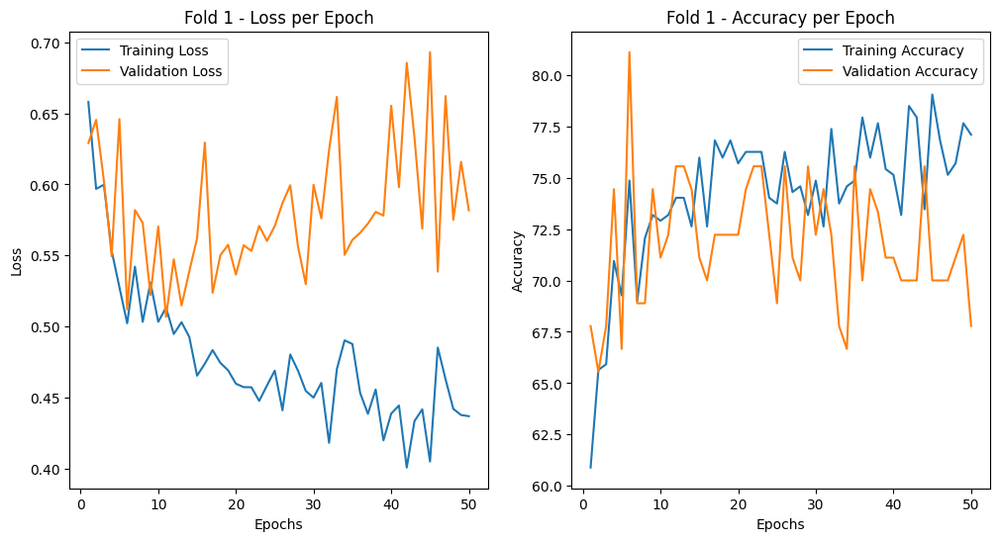

Fold 2


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6956, Accuracy: 63.97%, Validation Loss: 0.5853, Validation Accuracy: 67.78%
Epoch 2/50, Loss: 0.5801, Accuracy: 66.76%, Validation Loss: 0.5173, Validation Accuracy: 77.78%
Epoch 3/50, Loss: 0.5670, Accuracy: 70.95%, Validation Loss: 0.5887, Validation Accuracy: 67.78%
Epoch 4/50, Loss: 0.5498, Accuracy: 69.83%, Validation Loss: 0.4895, Validation Accuracy: 76.67%
Epoch 5/50, Loss: 0.5622, Accuracy: 67.88%, Validation Loss: 0.5843, Validation Accuracy: 63.33%
Epoch 6/50, Loss: 0.5318, Accuracy: 69.27%, Validation Loss: 0.4769, Validation Accuracy: 77.78%
Epoch 7/50, Loss: 0.5246, Accuracy: 70.39%, Validation Loss: 0.4864, Validation Accuracy: 72.22%
Epoch 8/50, Loss: 0.5134, Accuracy: 72.07%, Validation Loss: 0.4837, Validation Accuracy: 77.78%
Epoch 9/50, Loss: 0.5205, Accuracy: 72.07%, Validation Loss: 0.4897, Validation Accuracy: 74.44%
Epoch 10/50, Loss: 0.5045, Accuracy: 74.86%, Validation Loss: 0.4910, Validation Accuracy: 76.67%
Epoch 11/50, Loss: 0.4917, Ac

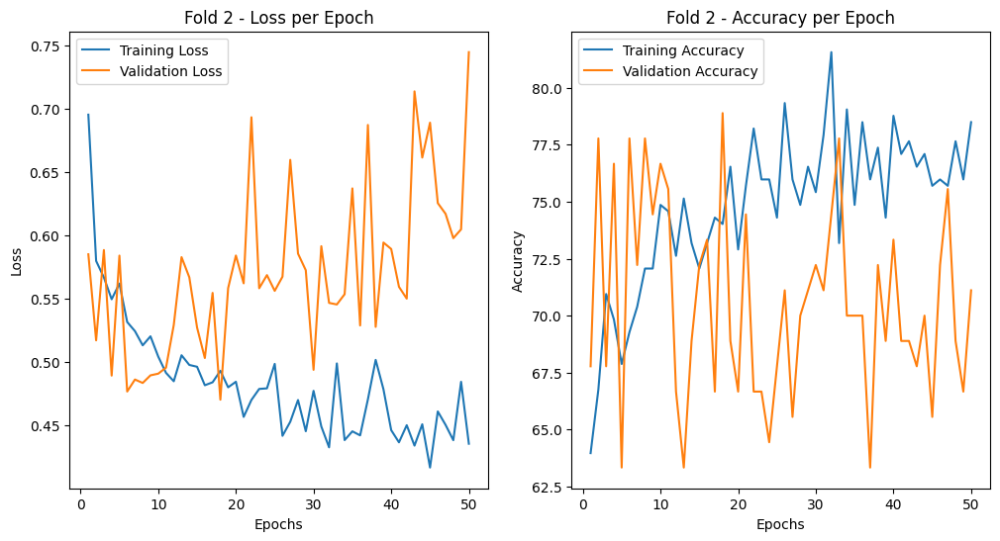

Fold 3
Epoch 1/50, Loss: 0.6254, Accuracy: 69.83%, Validation Loss: 0.7226, Validation Accuracy: 56.67%
Epoch 2/50, Loss: 0.5725, Accuracy: 69.27%, Validation Loss: 0.6239, Validation Accuracy: 58.89%
Epoch 3/50, Loss: 0.5593, Accuracy: 70.67%, Validation Loss: 0.6410, Validation Accuracy: 61.11%
Epoch 4/50, Loss: 0.5528, Accuracy: 70.11%, Validation Loss: 0.5765, Validation Accuracy: 61.11%
Epoch 5/50, Loss: 0.5294, Accuracy: 75.42%, Validation Loss: 0.6605, Validation Accuracy: 63.33%
Epoch 6/50, Loss: 0.5009, Accuracy: 75.14%, Validation Loss: 0.5682, Validation Accuracy: 60.00%
Epoch 7/50, Loss: 0.5016, Accuracy: 74.30%, Validation Loss: 0.6255, Validation Accuracy: 68.89%
Epoch 8/50, Loss: 0.4849, Accuracy: 75.42%, Validation Loss: 0.6237, Validation Accuracy: 62.22%
Epoch 9/50, Loss: 0.5088, Accuracy: 76.82%, Validation Loss: 0.5871, Validation Accuracy: 70.00%
Epoch 10/50, Loss: 0.5052, Accuracy: 72.63%, Validation Loss: 0.5720, Validation Accuracy: 65.56%
Epoch 11/50, Loss: 0.4

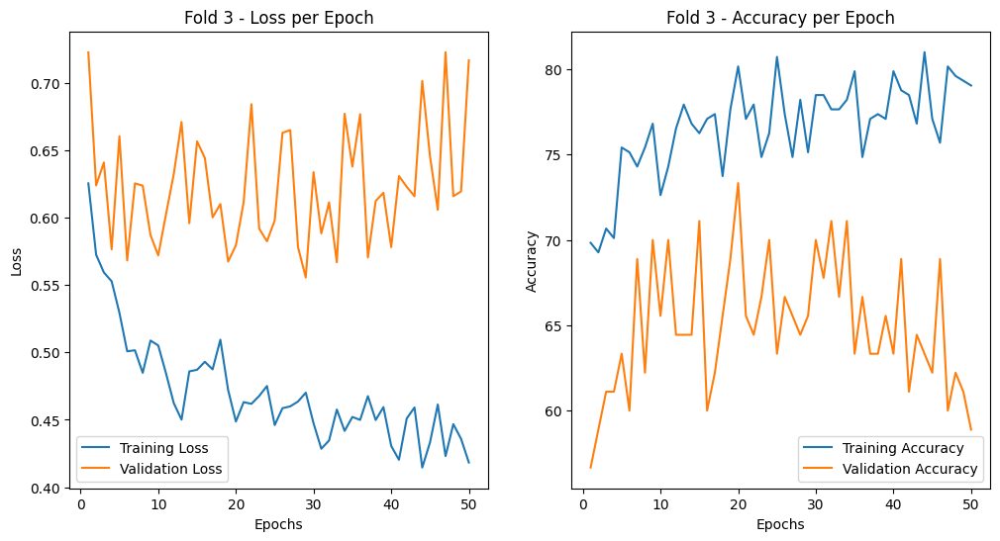

Fold 4
Epoch 1/50, Loss: 0.6463, Accuracy: 63.79%, Validation Loss: 0.5730, Validation Accuracy: 66.29%
Epoch 2/50, Loss: 0.6013, Accuracy: 65.46%, Validation Loss: 0.5514, Validation Accuracy: 66.29%
Epoch 3/50, Loss: 0.5584, Accuracy: 69.08%, Validation Loss: 0.4991, Validation Accuracy: 74.16%
Epoch 4/50, Loss: 0.5289, Accuracy: 71.03%, Validation Loss: 0.5430, Validation Accuracy: 69.66%
Epoch 5/50, Loss: 0.5349, Accuracy: 73.54%, Validation Loss: 0.5789, Validation Accuracy: 59.55%
Epoch 6/50, Loss: 0.5173, Accuracy: 74.65%, Validation Loss: 0.4766, Validation Accuracy: 74.16%
Epoch 7/50, Loss: 0.5459, Accuracy: 70.47%, Validation Loss: 0.6638, Validation Accuracy: 65.17%
Epoch 8/50, Loss: 0.5295, Accuracy: 71.87%, Validation Loss: 0.5426, Validation Accuracy: 67.42%
Epoch 9/50, Loss: 0.5159, Accuracy: 71.59%, Validation Loss: 0.5190, Validation Accuracy: 70.79%
Epoch 10/50, Loss: 0.4908, Accuracy: 73.26%, Validation Loss: 0.5204, Validation Accuracy: 65.17%
Epoch 11/50, Loss: 0.5

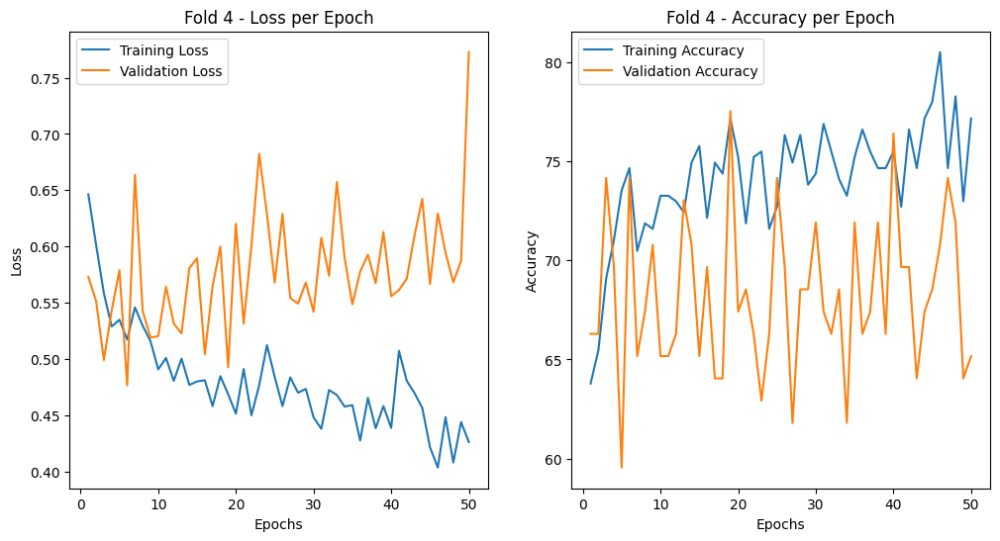

Fold 5
Epoch 1/50, Loss: 0.6164, Accuracy: 67.41%, Validation Loss: 0.6703, Validation Accuracy: 64.04%
Epoch 2/50, Loss: 0.5744, Accuracy: 67.97%, Validation Loss: 0.5985, Validation Accuracy: 69.66%
Epoch 3/50, Loss: 0.5440, Accuracy: 70.47%, Validation Loss: 0.6792, Validation Accuracy: 66.29%
Epoch 4/50, Loss: 0.5163, Accuracy: 72.70%, Validation Loss: 0.5695, Validation Accuracy: 70.79%
Epoch 5/50, Loss: 0.5325, Accuracy: 70.47%, Validation Loss: 0.6208, Validation Accuracy: 62.92%
Epoch 6/50, Loss: 0.5269, Accuracy: 72.70%, Validation Loss: 0.6262, Validation Accuracy: 64.04%
Epoch 7/50, Loss: 0.4831, Accuracy: 72.98%, Validation Loss: 0.6621, Validation Accuracy: 64.04%
Epoch 8/50, Loss: 0.5176, Accuracy: 71.03%, Validation Loss: 0.6285, Validation Accuracy: 70.79%
Epoch 9/50, Loss: 0.4908, Accuracy: 73.82%, Validation Loss: 0.5722, Validation Accuracy: 70.79%
Epoch 10/50, Loss: 0.4892, Accuracy: 73.54%, Validation Loss: 0.5888, Validation Accuracy: 68.54%
Epoch 11/50, Loss: 0.4

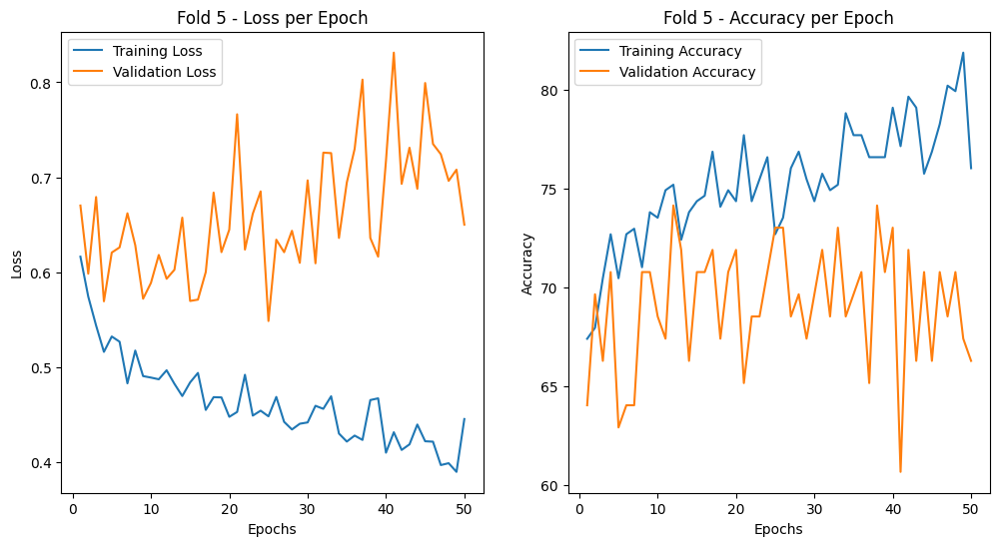

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.4371 - Train Accuracy: 77.09%
           - Validation Loss: 0.5818 - Validation Accuracy: 67.78%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.4357 - Train Accuracy: 78.49%
           - Validation Loss: 0.7449 - Validation Accuracy: 71.11%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.4183 - Train Accuracy: 79.05%
           - Validation Loss: 0.7167 - Validation Accuracy: 58.89%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.4263 - Train Accuracy: 77.16%
           - Validation Loss: 0.7727 - Validation Accuracy: 65.17%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.4456 - Train Accuracy: 76.04%
    

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('spectral_transformer_encoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'spectral_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [13]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'spectral_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\773896332.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\asu

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.68      0.72      0.70        47
      Normal       0.68      0.63      0.65        43

    accuracy                           0.68        90
   macro avg       0.68      0.68      0.68        90
weighted avg       0.68      0.68      0.68        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.71      0.74      0.73        47
      Normal       0.71      0.67      0.69        43

    accuracy                           0.71        90
   macro avg       0.71      0.71      0.71        90
weighted avg       0.71      0.71      0.71        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\773896332.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.55      0.67      0.60        42
      Normal       0.64      0.52      0.57        48

    accuracy                           0.59        90
   macro avg       0.60      0.59      0.59        90
weighted avg       0.60      0.59      0.59        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\773896332.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.65      0.57      0.61        42
      Normal       0.65      0.72      0.69        47

    accuracy                           0.65        89
   macro avg       0.65      0.65      0.65        89
weighted avg       0.65      0.65      0.65        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.60      0.72      0.66        40
      Normal       0.73      0.61      0.67        49

    accuracy                           0.66        89
   macro avg       0.67      0.67      0.66        89
weighted avg       0.67      0.66      0.66        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\773896332.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

In [17]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'spectral_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\598228904.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Metrics for Fold 1
Accuracy: 0.6778
Precision: 0.6775
F1-Score: 0.6758
Sensitivity (Recall for MI): 0.6279
Specificity (True Negative Rate): 0.7234
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.7111
Precision: 0.7108
F1-Score: 0.7098
Sensitivity (Recall for MI): 0.6744
Specificity (True Negative Rate): 0.7447
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\598228904.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Metrics for Fold 3
Accuracy: 0.5889
Precision: 0.5950
F1-Score: 0.5884
Sensitivity (Recall for MI): 0.5208
Specificity (True Negative Rate): 0.6667
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.6517
Precision: 0.6512
F1-Score: 0.6472
Sensitivity (Recall for MI): 0.7234
Specificity (True Negative Rate): 0.5714
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\598228904.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Metrics for Fold 5
Accuracy: 0.6629
Precision: 0.6679
F1-Score: 0.6629
Sensitivity (Recall for MI): 0.6122
Specificity (True Negative Rate): 0.7250
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\634219257.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

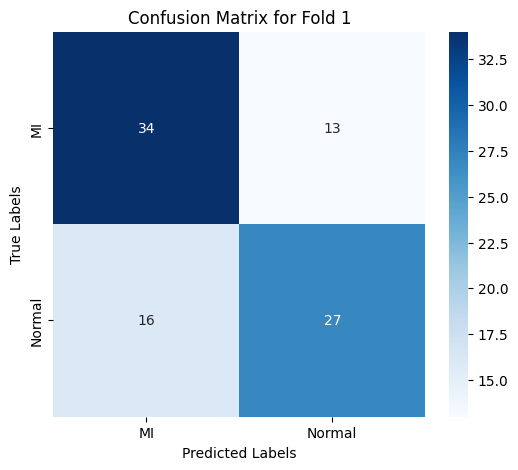

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\634219257.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

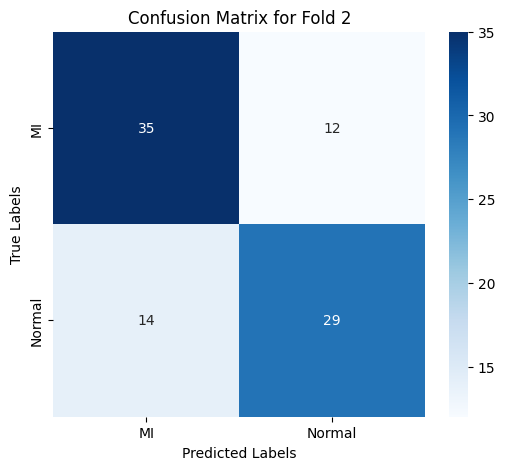

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\634219257.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

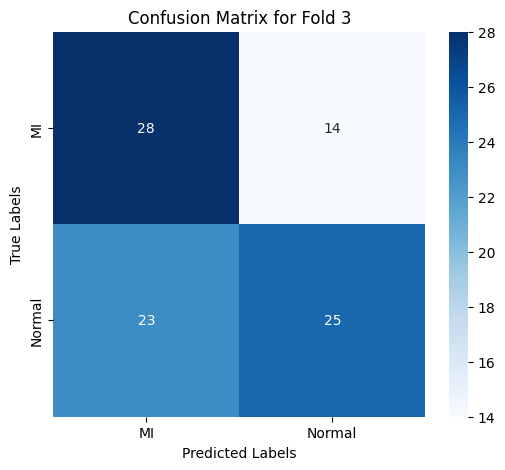

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\634219257.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

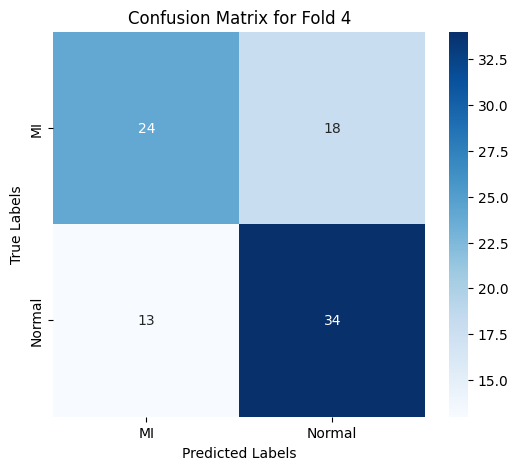

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\634219257.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

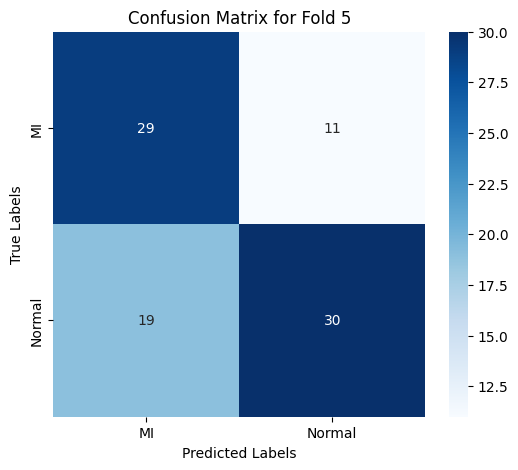

--------------------------------------------------------------------------------


In [15]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'spectral_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## Temporal with Transformer Encoder

In [18]:
selected_columns = ['Entropy', 'Wavelet Means', 'Wavelet std', 'Wavelet max', 'Wavelet min', 'Med_wavelet', 'Var_wavelet', 'Skew_wavelet', 'Q1_wavelet', 'Q3_wavelet', 'IQR_wavelet', 'MinMax_wavelet', 'Kurt_wavelet', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_temporal = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_temporal.head())

    Entropy  Wavelet Means  Wavelet std  Wavelet max  Wavelet min  \
0  0.063608      -1.137174    -0.430682     0.024031     0.004692   
1  0.064888      -0.388901    -0.565070    -0.549047     0.441349   
2  0.063367       0.180394    -0.112938    -0.376300     0.355416   
3  0.068559       0.408853     1.567008     1.825143    -0.973889   
4  0.062193      -0.404628    -0.506024    -0.423697     0.363664   

   Med_wavelet  Var_wavelet  Skew_wavelet  Q1_wavelet  Q3_wavelet  \
0    -0.889833    -0.218548      1.146071   -0.076698    0.026616   
1    -0.241600    -0.239203     -0.594643    0.178925   -0.172615   
2     1.042363    -0.151908     -0.491310   -0.838081    0.944422   
3     0.205136     0.616326      2.953232   -0.848416    0.973499   
4     0.454240    -0.230679     -0.101673   -0.313961    0.340572   

   IQR_wavelet  MinMax_wavelet  Kurt_wavelet Label  
0     0.051833        0.226780      1.470453    MI  
1    -0.176615       -0.536473     -0.367429    MI  
2     0.895

In [19]:
X = df_temporal.drop('Label', axis=1).values
y = df_temporal['Label'].values

In [20]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class TransformerModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerModel, self).__init__()
        self.embedding = nn.Linear(input_dim, dim_feedforward)
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(0)  # Transformer expects a sequence, so add a sequence dimension
        x = self.transformer_encoder(x)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.7852, Accuracy: 53.63%, Validation Loss: 0.7377, Validation Accuracy: 50.00%
Epoch 2/50, Loss: 0.6235, Accuracy: 60.61%, Validation Loss: 0.4940, Validation Accuracy: 80.00%
Epoch 3/50, Loss: 0.5503, Accuracy: 70.95%, Validation Loss: 0.5030, Validation Accuracy: 73.33%
Epoch 4/50, Loss: 0.4719, Accuracy: 75.14%, Validation Loss: 0.3391, Validation Accuracy: 83.33%
Epoch 5/50, Loss: 0.5115, Accuracy: 77.09%, Validation Loss: 0.5685, Validation Accuracy: 72.22%
Epoch 6/50, Loss: 0.3805, Accuracy: 82.12%, Validation Loss: 0.3468, Validation Accuracy: 85.56%
Epoch 7/50, Loss: 0.3579, Accuracy: 84.08%, Validation Loss: 0.4142, Validation Accuracy: 78.89%
Epoch 8/50, Loss: 0.3729, Accuracy: 83.80%, Validation Loss: 0.3128, Validation Accuracy: 84.44%
Epoch 9/50, Loss: 0.3284, Accuracy: 86.59%, Validation Loss: 0.3172, Validation Accuracy: 87.78%
Epoch 10/50, Loss: 0.3005, Accuracy: 86.59%, Validation Loss: 0.2701, Validation Accuracy: 86.67%
Epoch 11/50, Loss: 0.2633, Ac

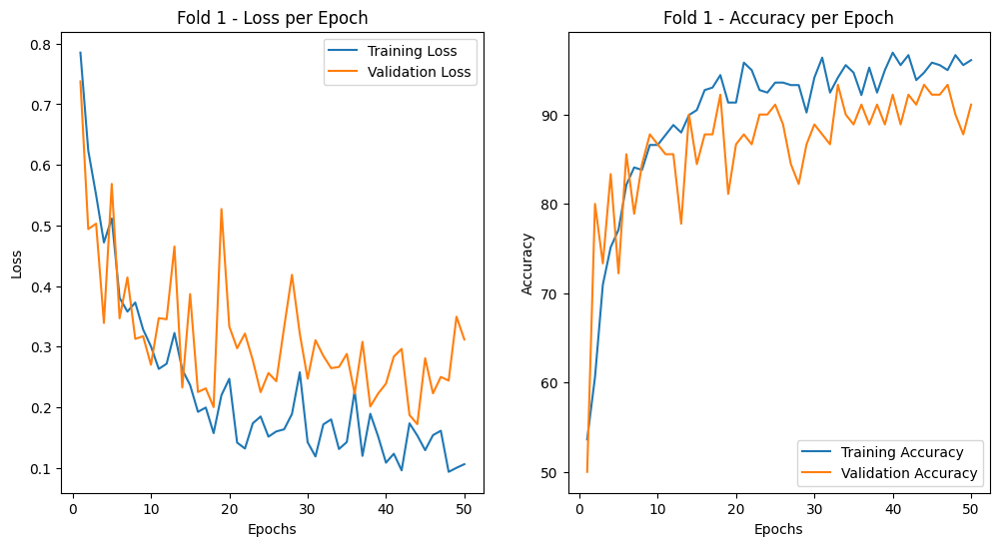

Fold 2
Epoch 1/50, Loss: 0.7466, Accuracy: 53.07%, Validation Loss: 0.6219, Validation Accuracy: 61.11%
Epoch 2/50, Loss: 0.6039, Accuracy: 62.29%, Validation Loss: 0.4841, Validation Accuracy: 76.67%
Epoch 3/50, Loss: 0.5210, Accuracy: 72.91%, Validation Loss: 0.4424, Validation Accuracy: 78.89%
Epoch 4/50, Loss: 0.4230, Accuracy: 80.45%, Validation Loss: 0.6567, Validation Accuracy: 65.56%
Epoch 5/50, Loss: 0.4514, Accuracy: 78.21%, Validation Loss: 0.4389, Validation Accuracy: 77.78%
Epoch 6/50, Loss: 0.3365, Accuracy: 84.64%, Validation Loss: 0.3434, Validation Accuracy: 86.67%
Epoch 7/50, Loss: 0.3526, Accuracy: 84.64%, Validation Loss: 0.4102, Validation Accuracy: 84.44%
Epoch 8/50, Loss: 0.3057, Accuracy: 87.99%, Validation Loss: 0.3348, Validation Accuracy: 86.67%
Epoch 9/50, Loss: 0.2690, Accuracy: 88.55%, Validation Loss: 0.3025, Validation Accuracy: 85.56%
Epoch 10/50, Loss: 0.3106, Accuracy: 86.31%, Validation Loss: 0.2983, Validation Accuracy: 90.00%
Epoch 11/50, Loss: 0.3

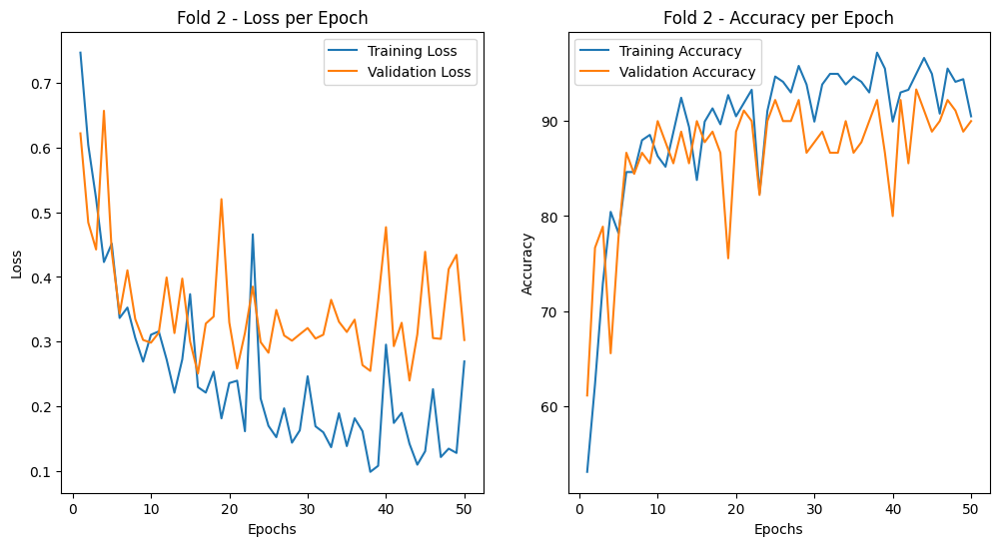

Fold 3
Epoch 1/50, Loss: 0.7643, Accuracy: 53.35%, Validation Loss: 0.7211, Validation Accuracy: 47.78%
Epoch 2/50, Loss: 0.6378, Accuracy: 60.61%, Validation Loss: 0.6820, Validation Accuracy: 61.11%
Epoch 3/50, Loss: 0.6142, Accuracy: 65.08%, Validation Loss: 0.5842, Validation Accuracy: 64.44%
Epoch 4/50, Loss: 0.5175, Accuracy: 74.30%, Validation Loss: 0.4312, Validation Accuracy: 73.33%
Epoch 5/50, Loss: 0.5348, Accuracy: 72.07%, Validation Loss: 0.4754, Validation Accuracy: 76.67%
Epoch 6/50, Loss: 0.3960, Accuracy: 80.17%, Validation Loss: 0.3206, Validation Accuracy: 88.89%
Epoch 7/50, Loss: 0.3566, Accuracy: 84.92%, Validation Loss: 0.3437, Validation Accuracy: 87.78%
Epoch 8/50, Loss: 0.3318, Accuracy: 86.03%, Validation Loss: 0.3219, Validation Accuracy: 82.22%
Epoch 9/50, Loss: 0.2971, Accuracy: 86.59%, Validation Loss: 0.3772, Validation Accuracy: 82.22%
Epoch 10/50, Loss: 0.3470, Accuracy: 84.36%, Validation Loss: 0.4674, Validation Accuracy: 81.11%
Epoch 11/50, Loss: 0.2

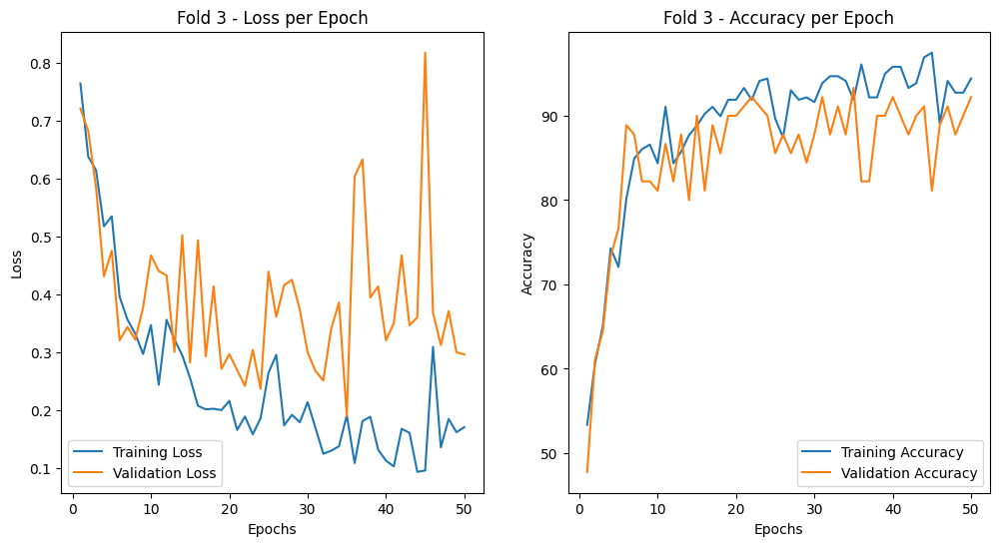

Fold 4
Epoch 1/50, Loss: 0.7383, Accuracy: 53.20%, Validation Loss: 0.6932, Validation Accuracy: 57.30%
Epoch 2/50, Loss: 0.6562, Accuracy: 59.61%, Validation Loss: 0.6692, Validation Accuracy: 56.18%
Epoch 3/50, Loss: 0.5730, Accuracy: 68.25%, Validation Loss: 0.5576, Validation Accuracy: 71.91%
Epoch 4/50, Loss: 0.4965, Accuracy: 76.04%, Validation Loss: 0.5288, Validation Accuracy: 70.79%
Epoch 5/50, Loss: 0.4338, Accuracy: 81.89%, Validation Loss: 0.5486, Validation Accuracy: 75.28%
Epoch 6/50, Loss: 0.4172, Accuracy: 83.01%, Validation Loss: 0.5048, Validation Accuracy: 78.65%
Epoch 7/50, Loss: 0.3287, Accuracy: 85.79%, Validation Loss: 0.3391, Validation Accuracy: 85.39%
Epoch 8/50, Loss: 0.3321, Accuracy: 85.52%, Validation Loss: 0.4514, Validation Accuracy: 76.40%
Epoch 9/50, Loss: 0.2712, Accuracy: 89.42%, Validation Loss: 0.3323, Validation Accuracy: 84.27%
Epoch 10/50, Loss: 0.3173, Accuracy: 88.30%, Validation Loss: 0.3282, Validation Accuracy: 87.64%
Epoch 11/50, Loss: 0.2

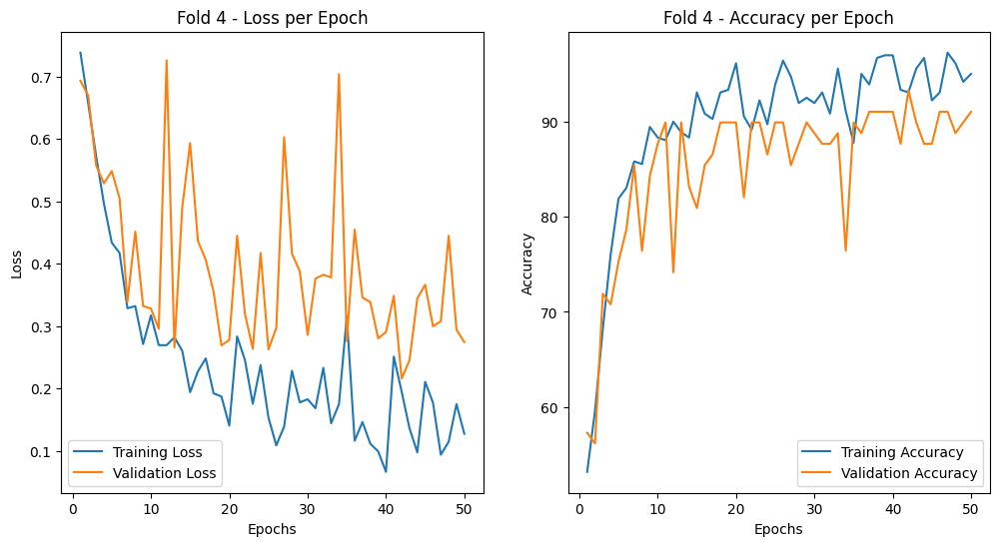

Fold 5
Epoch 1/50, Loss: 0.7615, Accuracy: 56.55%, Validation Loss: 0.7366, Validation Accuracy: 52.81%
Epoch 2/50, Loss: 0.6029, Accuracy: 67.13%, Validation Loss: 0.6692, Validation Accuracy: 64.04%
Epoch 3/50, Loss: 0.5476, Accuracy: 71.87%, Validation Loss: 0.6220, Validation Accuracy: 67.42%
Epoch 4/50, Loss: 0.4860, Accuracy: 75.77%, Validation Loss: 0.5902, Validation Accuracy: 67.42%
Epoch 5/50, Loss: 0.4690, Accuracy: 77.44%, Validation Loss: 0.4882, Validation Accuracy: 76.40%
Epoch 6/50, Loss: 0.3482, Accuracy: 82.17%, Validation Loss: 0.4034, Validation Accuracy: 82.02%
Epoch 7/50, Loss: 0.3390, Accuracy: 84.12%, Validation Loss: 0.3888, Validation Accuracy: 79.78%
Epoch 8/50, Loss: 0.2955, Accuracy: 88.02%, Validation Loss: 0.2810, Validation Accuracy: 87.64%
Epoch 9/50, Loss: 0.2496, Accuracy: 91.09%, Validation Loss: 0.3314, Validation Accuracy: 88.76%
Epoch 10/50, Loss: 0.3537, Accuracy: 84.96%, Validation Loss: 0.3196, Validation Accuracy: 86.52%
Epoch 11/50, Loss: 0.3

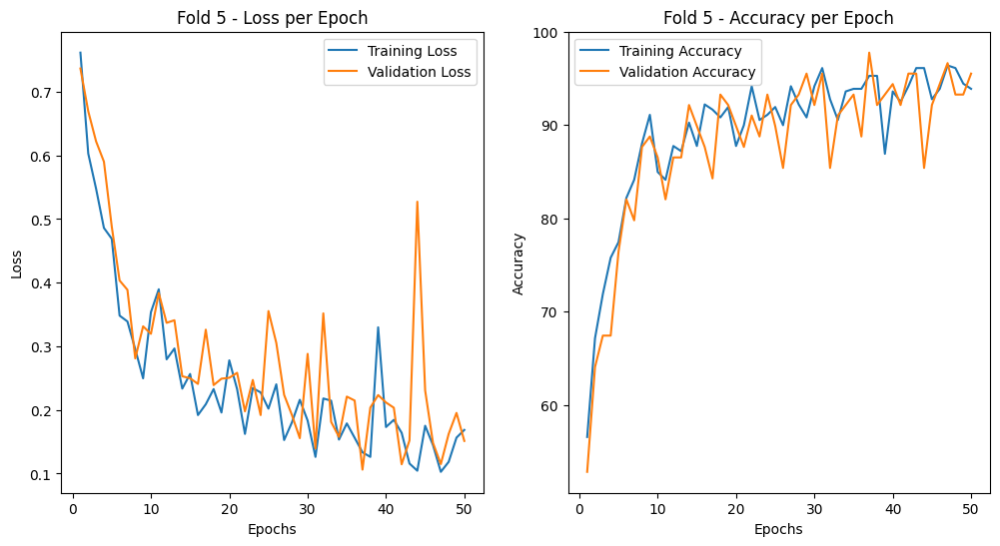

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.1061 - Train Accuracy: 96.09%
           - Validation Loss: 0.3119 - Validation Accuracy: 91.11%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.2693 - Train Accuracy: 90.50%
           - Validation Loss: 0.3025 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.1707 - Train Accuracy: 94.41%
           - Validation Loss: 0.2963 - Validation Accuracy: 92.22%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.1276 - Train Accuracy: 94.99%
           - Validation Loss: 0.2744 - Validation Accuracy: 91.01%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.1686 - Train Accuracy: 93.87%
    

In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('temporal_transformer_encoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [24]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3922957936.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.93      0.89      0.91        47
      Normal       0.89      0.93      0.91        43

    accuracy                           0.91        90
   macro avg       0.91      0.91      0.91        90
weighted avg       0.91      0.91      0.91        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.84      1.00      0.91        47
      Normal       1.00      0.79      0.88        43

    accuracy                           0.90        90
   macro avg       0.92      0.90      0.90        90
weighted avg       0.92      0.90      0.90        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3922957936.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.86      1.00      0.92        42
      Normal       1.00      0.85      0.92        48

    accuracy                           0.92        90
   macro avg       0.93      0.93      0.92        90
weighted avg       0.93      0.92      0.92        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.84      1.00      0.91        42
      Normal       1.00      0.83      0.91        47

    accuracy                           0.91        89
   macro avg       0.92      0.91      0.91        89
weighted avg       0.92      0.91      0.91        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.93      0

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3922957936.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

In [25]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2730751564.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Metrics for Fold 1
Accuracy: 0.9111
Precision: 0.9111
F1-Score: 0.9111
Sensitivity (Recall for MI): 0.9302
Specificity (True Negative Rate): 0.8936
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.9000
Precision: 0.9196
F1-Score: 0.8979
Sensitivity (Recall for MI): 0.7907
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2730751564.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Metrics for Fold 3
Accuracy: 0.9222
Precision: 0.9286
F1-Score: 0.9222
Sensitivity (Recall for MI): 0.8542
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.9101
Precision: 0.9200
F1-Score: 0.9100
Sensitivity (Recall for MI): 0.8298
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.9551
Precision: 0.9536
F1-Score: 0.9548
Sensitivity (Recall for MI): 0.9388
Specificity (True Negative Rate): 0.9750
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2730751564.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\899154088.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

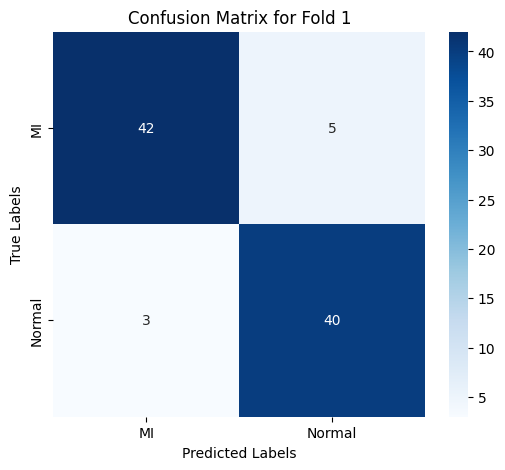

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\899154088.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

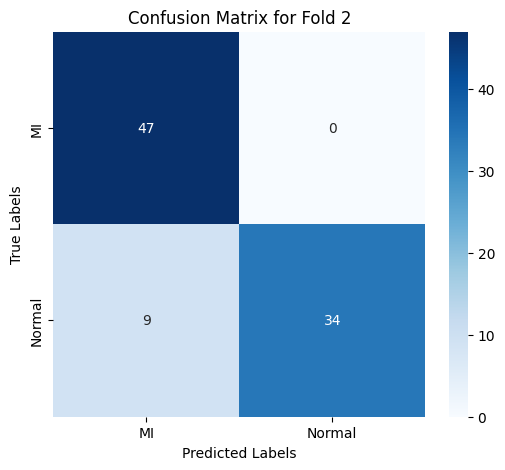

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\899154088.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

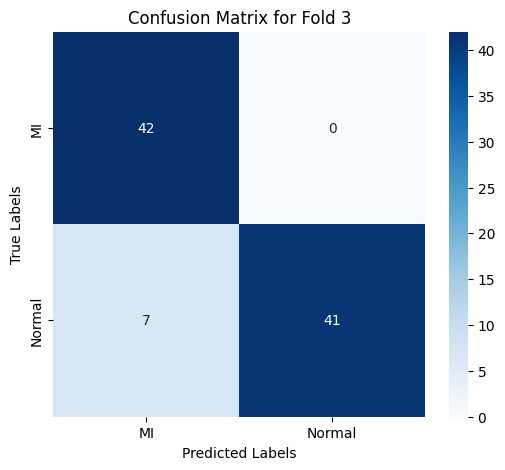

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\899154088.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

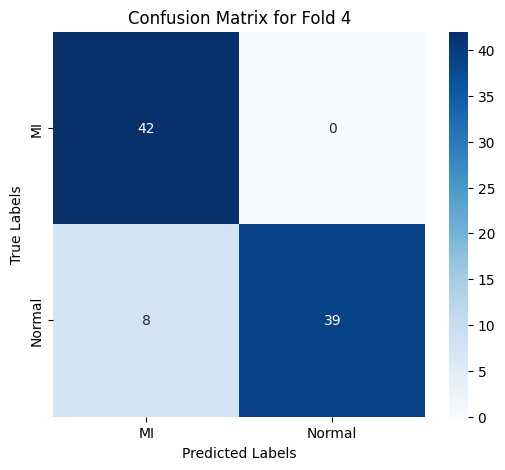

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\899154088.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

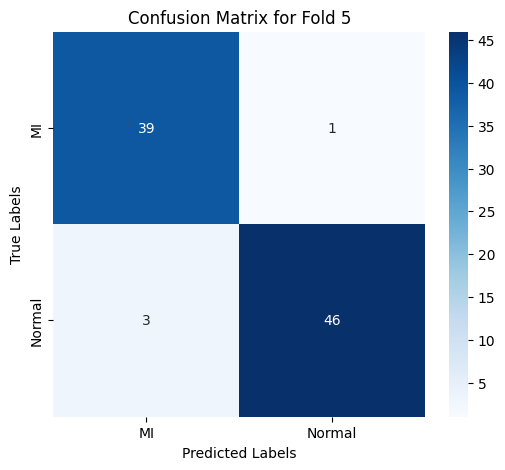

--------------------------------------------------------------------------------


In [26]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## Multi Scale with Transformer Encoder

In [27]:
X = df_combine_scaled.drop('Label', axis=1).values
y = df_combine_scaled['Label'].values

In [28]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [30]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class TransformerModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerModel, self).__init__()
        self.embedding = nn.Linear(input_dim, dim_feedforward)
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(0)  # Transformer expects a sequence, so add a sequence dimension
        x = self.transformer_encoder(x)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.6736, Accuracy: 60.06%, Validation Loss: 0.5865, Validation Accuracy: 68.89%
Epoch 2/50, Loss: 0.5162, Accuracy: 72.91%, Validation Loss: 0.4573, Validation Accuracy: 73.33%
Epoch 3/50, Loss: 0.4130, Accuracy: 81.84%, Validation Loss: 0.5538, Validation Accuracy: 77.78%
Epoch 4/50, Loss: 0.3733, Accuracy: 82.40%, Validation Loss: 0.4508, Validation Accuracy: 82.22%
Epoch 5/50, Loss: 0.3305, Accuracy: 86.59%, Validation Loss: 0.4457, Validation Accuracy: 80.00%
Epoch 6/50, Loss: 0.2761, Accuracy: 88.55%, Validation Loss: 0.4214, Validation Accuracy: 82.22%
Epoch 7/50, Loss: 0.2236, Accuracy: 90.50%, Validation Loss: 0.4892, Validation Accuracy: 81.11%
Epoch 8/50, Loss: 0.2235, Accuracy: 91.90%, Validation Loss: 0.4345, Validation Accuracy: 82.22%
Epoch 9/50, Loss: 0.2122, Accuracy: 90.50%, Validation Loss: 0.3019, Validation Accuracy: 86.67%
Epoch 10/50, Loss: 0.2040, Accuracy: 91.06%, Validation Loss: 0.3449, Validation Accuracy: 82.22%
Epoch 11/50, Loss: 0.2161, Ac

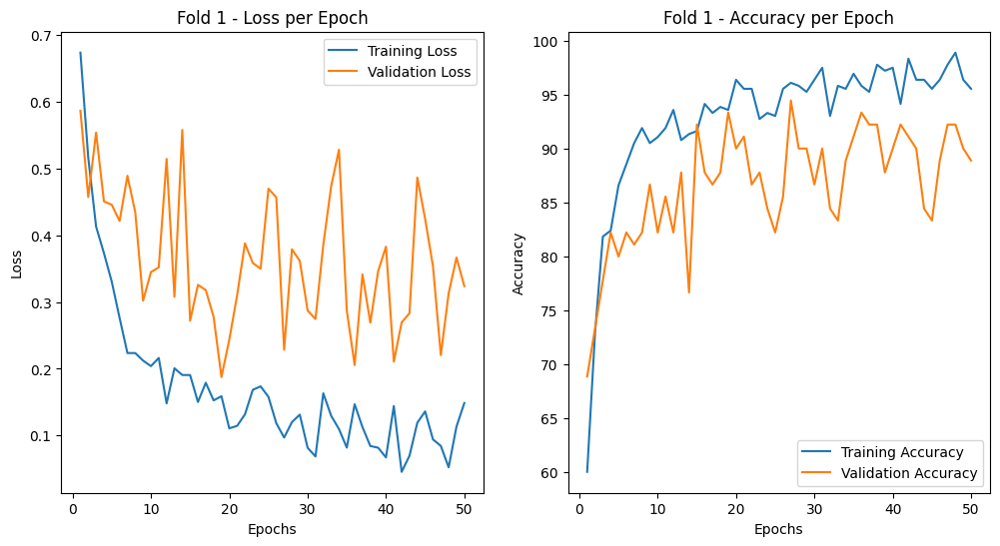

Fold 2
Epoch 1/50, Loss: 0.6049, Accuracy: 67.88%, Validation Loss: 0.6199, Validation Accuracy: 63.33%
Epoch 2/50, Loss: 0.4924, Accuracy: 74.02%, Validation Loss: 0.4844, Validation Accuracy: 73.33%
Epoch 3/50, Loss: 0.3854, Accuracy: 83.24%, Validation Loss: 0.3675, Validation Accuracy: 83.33%
Epoch 4/50, Loss: 0.3668, Accuracy: 85.47%, Validation Loss: 0.3196, Validation Accuracy: 85.56%
Epoch 5/50, Loss: 0.2934, Accuracy: 88.55%, Validation Loss: 0.2636, Validation Accuracy: 90.00%
Epoch 6/50, Loss: 0.2723, Accuracy: 88.55%, Validation Loss: 0.4095, Validation Accuracy: 82.22%
Epoch 7/50, Loss: 0.3100, Accuracy: 85.75%, Validation Loss: 0.3133, Validation Accuracy: 84.44%
Epoch 8/50, Loss: 0.2203, Accuracy: 91.34%, Validation Loss: 0.2429, Validation Accuracy: 90.00%
Epoch 9/50, Loss: 0.2222, Accuracy: 91.90%, Validation Loss: 0.1944, Validation Accuracy: 92.22%
Epoch 10/50, Loss: 0.1839, Accuracy: 93.02%, Validation Loss: 0.6594, Validation Accuracy: 73.33%
Epoch 11/50, Loss: 0.2

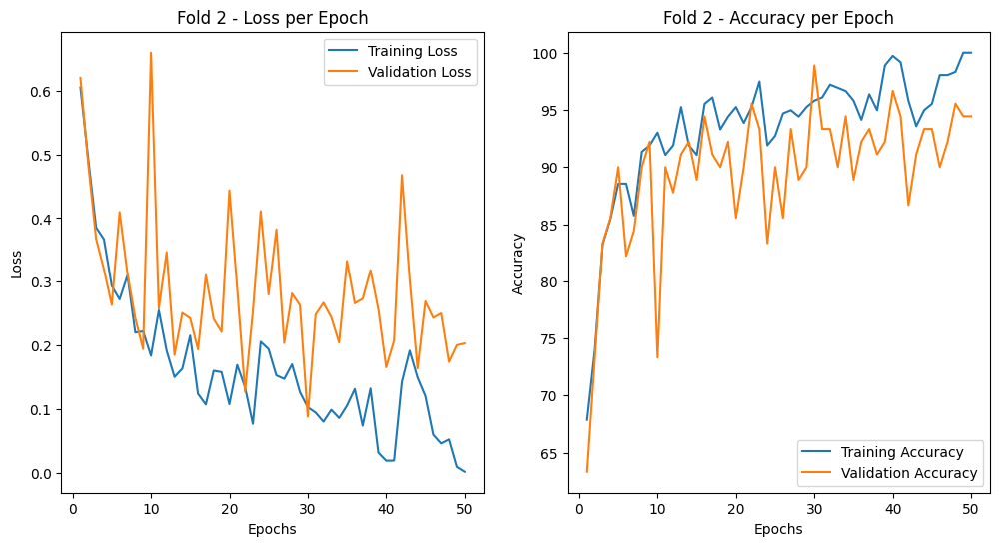

Fold 3
Epoch 1/50, Loss: 0.6379, Accuracy: 65.08%, Validation Loss: 0.5947, Validation Accuracy: 63.33%
Epoch 2/50, Loss: 0.4884, Accuracy: 76.54%, Validation Loss: 0.4866, Validation Accuracy: 71.11%
Epoch 3/50, Loss: 0.3631, Accuracy: 82.40%, Validation Loss: 0.4974, Validation Accuracy: 77.78%
Epoch 4/50, Loss: 0.3729, Accuracy: 82.96%, Validation Loss: 0.3993, Validation Accuracy: 77.78%
Epoch 5/50, Loss: 0.3175, Accuracy: 87.15%, Validation Loss: 0.5481, Validation Accuracy: 80.00%
Epoch 6/50, Loss: 0.2774, Accuracy: 88.55%, Validation Loss: 0.3779, Validation Accuracy: 82.22%
Epoch 7/50, Loss: 0.2635, Accuracy: 89.39%, Validation Loss: 0.4551, Validation Accuracy: 83.33%
Epoch 8/50, Loss: 0.2478, Accuracy: 89.66%, Validation Loss: 0.3406, Validation Accuracy: 86.67%
Epoch 9/50, Loss: 0.2017, Accuracy: 91.06%, Validation Loss: 0.3222, Validation Accuracy: 86.67%
Epoch 10/50, Loss: 0.1445, Accuracy: 95.25%, Validation Loss: 0.1956, Validation Accuracy: 88.89%
Epoch 11/50, Loss: 0.1

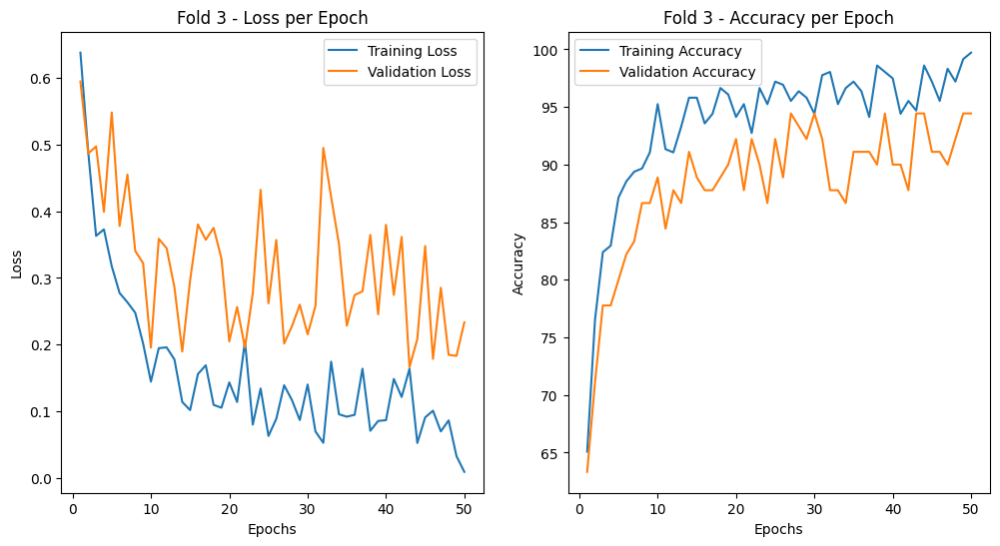

Fold 4
Epoch 1/50, Loss: 0.5951, Accuracy: 66.57%, Validation Loss: 0.5970, Validation Accuracy: 71.91%
Epoch 2/50, Loss: 0.4795, Accuracy: 77.44%, Validation Loss: 0.5194, Validation Accuracy: 69.66%
Epoch 3/50, Loss: 0.3664, Accuracy: 82.45%, Validation Loss: 0.5330, Validation Accuracy: 75.28%
Epoch 4/50, Loss: 0.3242, Accuracy: 85.79%, Validation Loss: 0.5486, Validation Accuracy: 74.16%
Epoch 5/50, Loss: 0.2845, Accuracy: 87.47%, Validation Loss: 0.4522, Validation Accuracy: 76.40%
Epoch 6/50, Loss: 0.2516, Accuracy: 90.25%, Validation Loss: 0.4118, Validation Accuracy: 83.15%
Epoch 7/50, Loss: 0.2255, Accuracy: 91.36%, Validation Loss: 0.5154, Validation Accuracy: 78.65%
Epoch 8/50, Loss: 0.2634, Accuracy: 88.58%, Validation Loss: 0.5108, Validation Accuracy: 78.65%
Epoch 9/50, Loss: 0.2118, Accuracy: 91.36%, Validation Loss: 0.4821, Validation Accuracy: 82.02%
Epoch 10/50, Loss: 0.2485, Accuracy: 90.81%, Validation Loss: 0.3268, Validation Accuracy: 86.52%
Epoch 11/50, Loss: 0.1

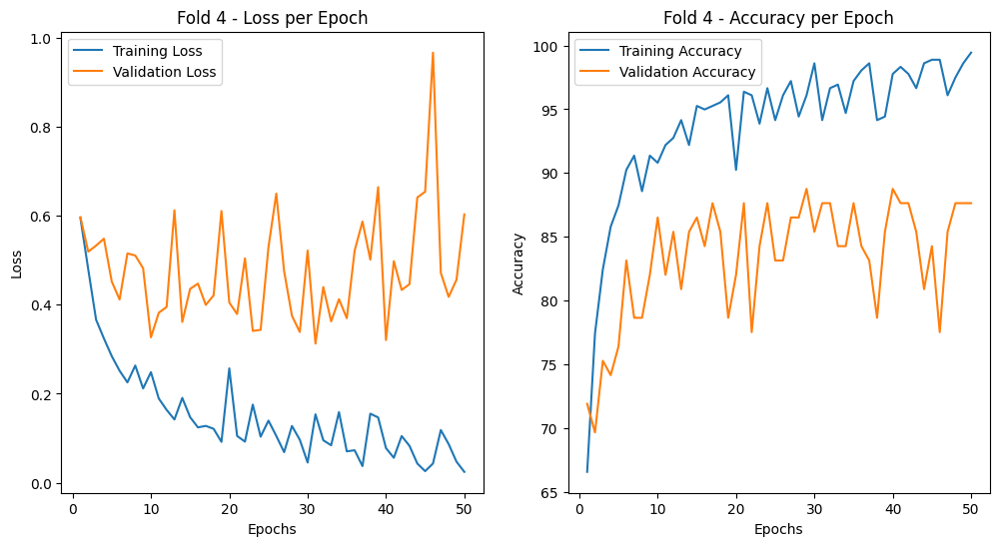

Fold 5
Epoch 1/50, Loss: 0.6310, Accuracy: 66.85%, Validation Loss: 0.5437, Validation Accuracy: 74.16%
Epoch 2/50, Loss: 0.4913, Accuracy: 75.49%, Validation Loss: 0.4776, Validation Accuracy: 74.16%
Epoch 3/50, Loss: 0.3923, Accuracy: 84.40%, Validation Loss: 0.5928, Validation Accuracy: 75.28%
Epoch 4/50, Loss: 0.3288, Accuracy: 86.07%, Validation Loss: 0.4242, Validation Accuracy: 77.53%
Epoch 5/50, Loss: 0.3000, Accuracy: 88.30%, Validation Loss: 0.4740, Validation Accuracy: 79.78%
Epoch 6/50, Loss: 0.2654, Accuracy: 89.42%, Validation Loss: 0.4913, Validation Accuracy: 76.40%
Epoch 7/50, Loss: 0.2497, Accuracy: 90.53%, Validation Loss: 0.5672, Validation Accuracy: 78.65%
Epoch 8/50, Loss: 0.2659, Accuracy: 89.42%, Validation Loss: 0.3739, Validation Accuracy: 78.65%
Epoch 9/50, Loss: 0.2120, Accuracy: 92.20%, Validation Loss: 0.3668, Validation Accuracy: 84.27%
Epoch 10/50, Loss: 0.2001, Accuracy: 93.59%, Validation Loss: 0.3368, Validation Accuracy: 84.27%
Epoch 11/50, Loss: 0.2

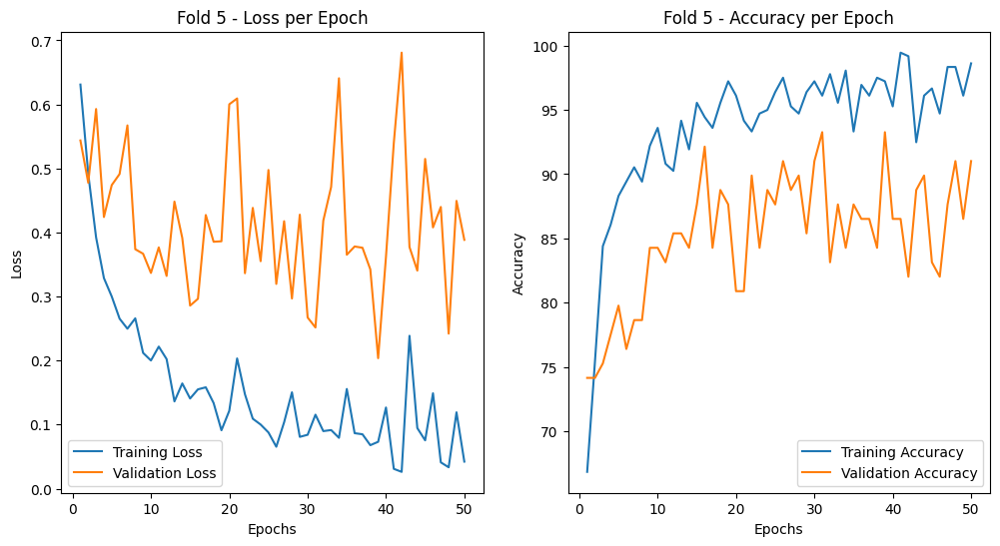

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.1486 - Train Accuracy: 95.53%
           - Validation Loss: 0.3238 - Validation Accuracy: 88.89%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.0019 - Train Accuracy: 100.00%
           - Validation Loss: 0.2033 - Validation Accuracy: 94.44%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.0092 - Train Accuracy: 99.72%
           - Validation Loss: 0.2334 - Validation Accuracy: 94.44%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.0243 - Train Accuracy: 99.44%
           - Validation Loss: 0.6032 - Validation Accuracy: 87.64%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.0422 - Train Accuracy: 98.61%
   

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('multi_scale_transformer_encoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [32]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\218939914.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\asu

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.88      0.91      0.90        47
      Normal       0.90      0.86      0.88        43

    accuracy                           0.89        90
   macro avg       0.89      0.89      0.89        90
weighted avg       0.89      0.89      0.89        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.94      0.96      0.95        47
      Normal       0.95      0.93      0.94        43

    accuracy                           0.94        90
   macro avg       0.94      0.94      0.94        90
weighted avg       0.94      0.94      0.94        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\218939914.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.89      1.00      0.94        42
      Normal       1.00      0.90      0.95        48

    accuracy                           0.94        90
   macro avg       0.95      0.95      0.94        90
weighted avg       0.95      0.94      0.94        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.84      0.90      0.87        42
      Normal       0.91      0.85      0.88        47

    accuracy                           0.88        89
   macro avg       0.88      0.88      0.88        89
weighted avg       0.88      0.88      0.88        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.92      0

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\218939914.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

In [33]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2527314652.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Metrics for Fold 1
Accuracy: 0.8889
Precision: 0.8900
F1-Score: 0.8884
Sensitivity (Recall for MI): 0.8605
Specificity (True Negative Rate): 0.9149
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.9444
Precision: 0.9449
F1-Score: 0.9443
Sensitivity (Recall for MI): 0.9302
Specificity (True Negative Rate): 0.9574
--------------------------------------------------------------------------------
Metrics for Fold 3
Accuracy: 0.9444
Precision: 0.9468
F1-Score: 0.9444
Sensitivity (Recall for MI): 0.8958
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2527314652.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Metrics for Fold 4
Accuracy: 0.8764
Precision: 0.8768
F1-Score: 0.8763
Sensitivity (Recall for MI): 0.8511
Specificity (True Negative Rate): 0.9048
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.9101
Precision: 0.9115
F1-Score: 0.9087
Sensitivity (Recall for MI): 0.9388
Specificity (True Negative Rate): 0.8750
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2527314652.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3178215828.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

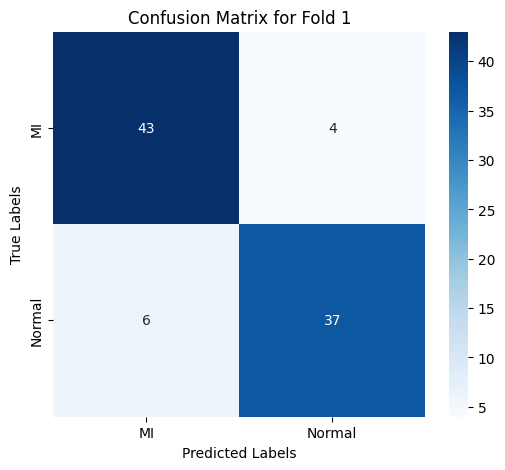

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3178215828.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

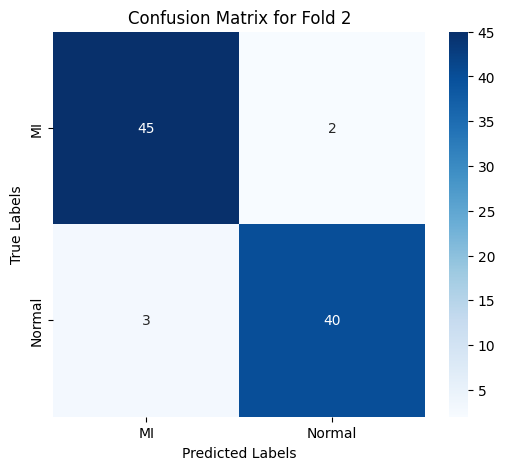

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3178215828.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

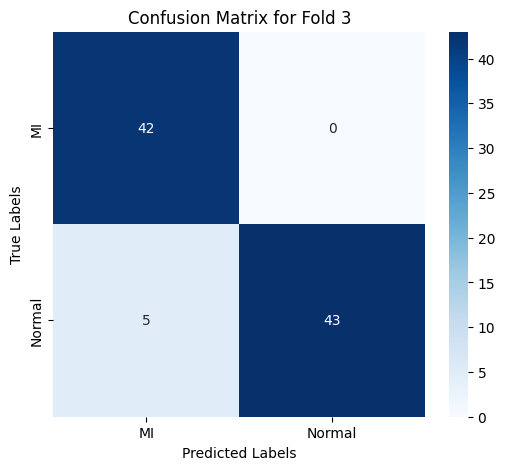

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3178215828.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

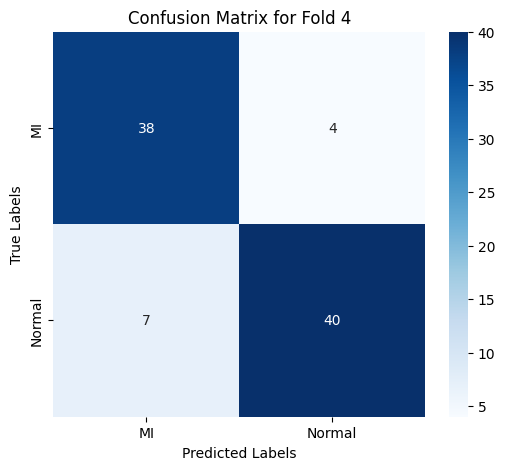

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3178215828.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

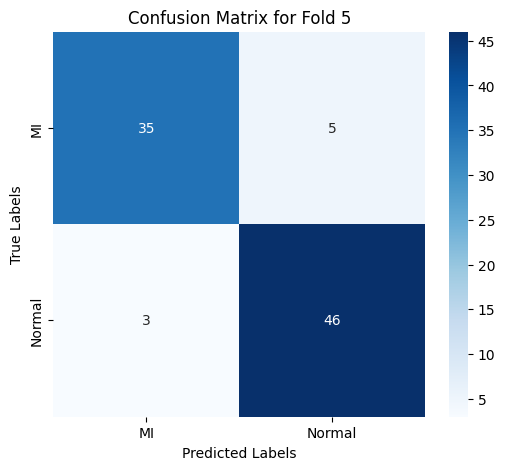

--------------------------------------------------------------------------------


In [34]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## Spectral with Transformer Decoder

In [35]:
selected_columns = ['MFCC Means', 'MFCC std', 'MFCC max', 'MFCC min', 'Med_mfcc', 'Var_mfcc', 'Skew_mfcc', 'Q1_mfcc', 'Q3_mfcc', 'IQR_mfcc', 'MinMax_mfcc', 'Kurt_mfcc', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_spectral = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_spectral.head())

   MFCC Means  MFCC std  MFCC max  MFCC min  Med_mfcc  Var_mfcc  Skew_mfcc  \
0    0.805298 -0.893321  0.727190  0.942132 -0.598371 -0.921706  -0.321473   
1   -0.228878  0.601932 -2.114222 -0.483793  1.257240  0.594724  -0.971689   
2    0.629472 -0.027778 -0.754010  0.036559  2.398342 -0.062456  -0.766293   
3    1.530227 -1.566485  1.255310  1.583813 -0.171921 -1.554723  -0.653024   
4   -0.680597  0.530428 -0.464613 -0.596863  0.842127  0.518742  -0.035472   

    Q1_mfcc   Q3_mfcc  IQR_mfcc  MinMax_mfcc  Kurt_mfcc Label  
0  0.734321 -0.816269 -1.060130    -0.538695   0.334547    MI  
1  0.669311  0.773221  0.321963    -0.347450   0.964492    MI  
2  0.749218  1.135122  0.589301    -0.301331   0.758335    MI  
3  0.715255 -0.219460 -0.543864    -0.893826   0.690955    MI  
4 -0.499815  0.770667  0.904191     0.339870   0.007908    MI  


In [36]:
X = df_spectral.drop('Label', axis=1).values
y = df_spectral['Label'].values

In [37]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [39]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


class TransformerDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerDecoderModel, self).__init__()
        # Embed input sesuai dengan input_dim yang sesuai dari data
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Adding an encoder representation as memory for the decoder
        self.memory_projection = nn.Linear(dim_feedforward, dim_feedforward)

        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        # Embed input
        x = self.embedding(x)

        # Ensure proper shape for sequence dimension
        x = x.unsqueeze(0)  # Adding sequence dimension

        # Prepare memory
        memory = self.memory_projection(x)

        # Forward through TransformerDecoder with memory
        x = self.transformer_decoder(x, memory)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x



# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/50, Loss: 0.6632, Accuracy: 65.36%, Validation Loss: 0.5699, Validation Accuracy: 65.56%
Epoch 2/50, Loss: 0.5696, Accuracy: 67.88%, Validation Loss: 0.5633, Validation Accuracy: 72.22%
Epoch 3/50, Loss: 0.5620, Accuracy: 68.44%, Validation Loss: 0.5319, Validation Accuracy: 75.56%
Epoch 4/50, Loss: 0.5308, Accuracy: 68.99%, Validation Loss: 0.5942, Validation Accuracy: 71.11%
Epoch 5/50, Loss: 0.5196, Accuracy: 70.67%, Validation Loss: 0.6015, Validation Accuracy: 64.44%
Epoch 6/50, Loss: 0.5092, Accuracy: 73.46%, Validation Loss: 0.5701, Validation Accuracy: 74.44%
Epoch 7/50, Loss: 0.5018, Accuracy: 71.79%, Validation Loss: 0.5629, Validation Accuracy: 78.89%
Epoch 8/50, Loss: 0.5467, Accuracy: 71.23%, Validation Loss: 0.5673, Validation Accuracy: 73.33%
Epoch 9/50, Loss: 0.5076, Accuracy: 72.35%, Validation Loss: 0.6284, Validation Accuracy: 64.44%
Epoch 10/50, Loss: 0.5136, Accuracy: 73.18%, Validation Loss: 0.5641, Validation Accuracy: 72.22%
Epoch 11/50, Loss: 0.5

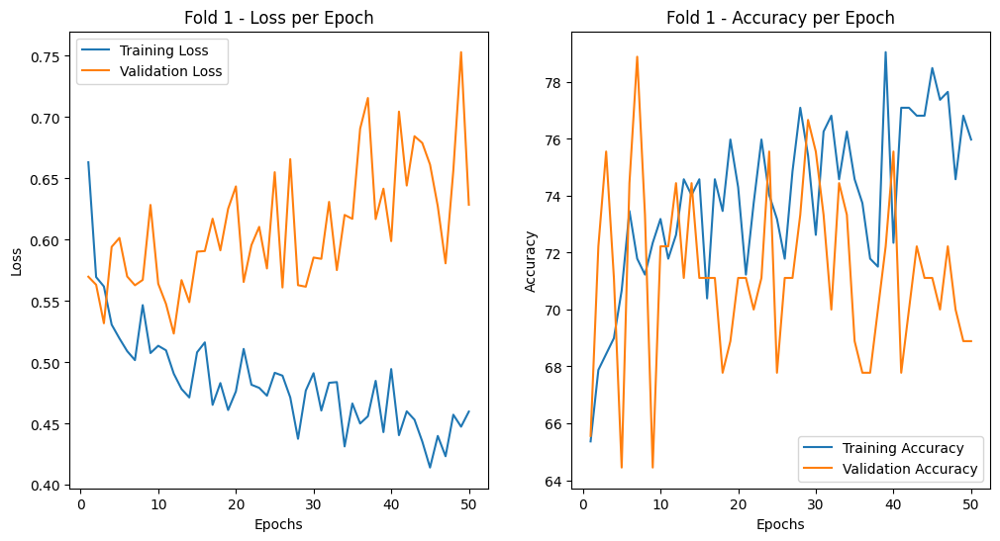

Fold 2
Epoch 1/50, Loss: 0.7354, Accuracy: 63.13%, Validation Loss: 0.5929, Validation Accuracy: 70.00%
Epoch 2/50, Loss: 0.5694, Accuracy: 69.55%, Validation Loss: 0.6820, Validation Accuracy: 57.78%
Epoch 3/50, Loss: 0.5821, Accuracy: 65.64%, Validation Loss: 0.5489, Validation Accuracy: 73.33%
Epoch 4/50, Loss: 0.5737, Accuracy: 67.88%, Validation Loss: 0.5141, Validation Accuracy: 77.78%
Epoch 5/50, Loss: 0.5304, Accuracy: 73.46%, Validation Loss: 0.5480, Validation Accuracy: 75.56%
Epoch 6/50, Loss: 0.5563, Accuracy: 69.83%, Validation Loss: 0.5307, Validation Accuracy: 72.22%
Epoch 7/50, Loss: 0.5205, Accuracy: 74.86%, Validation Loss: 0.5144, Validation Accuracy: 73.33%
Epoch 8/50, Loss: 0.5147, Accuracy: 73.46%, Validation Loss: 0.4821, Validation Accuracy: 76.67%
Epoch 9/50, Loss: 0.4860, Accuracy: 73.18%, Validation Loss: 0.6193, Validation Accuracy: 65.56%
Epoch 10/50, Loss: 0.5184, Accuracy: 75.42%, Validation Loss: 0.4965, Validation Accuracy: 73.33%
Epoch 11/50, Loss: 0.5

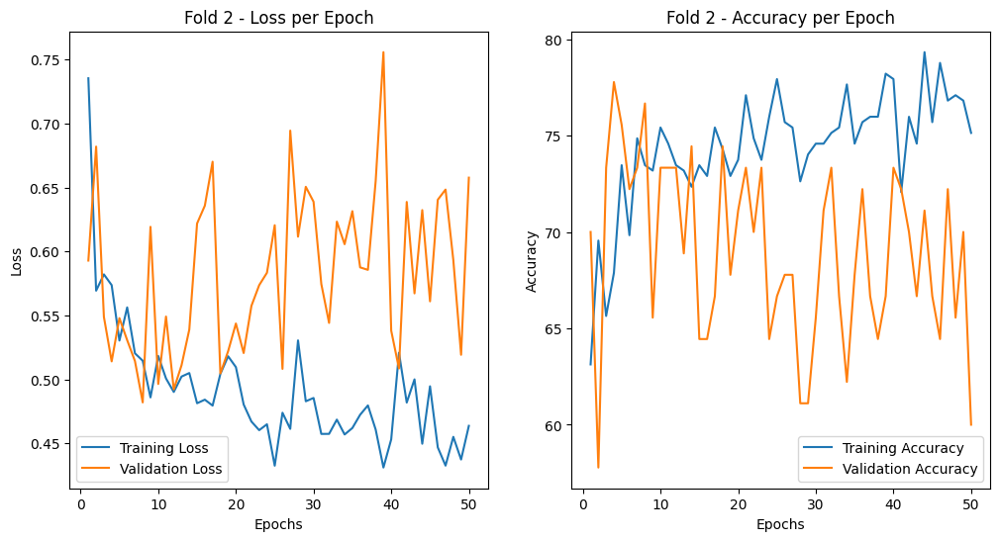

Fold 3
Epoch 1/50, Loss: 0.6273, Accuracy: 67.88%, Validation Loss: 0.6469, Validation Accuracy: 62.22%
Epoch 2/50, Loss: 0.5845, Accuracy: 67.60%, Validation Loss: 0.5956, Validation Accuracy: 62.22%
Epoch 3/50, Loss: 0.5488, Accuracy: 72.91%, Validation Loss: 0.5904, Validation Accuracy: 62.22%
Epoch 4/50, Loss: 0.5289, Accuracy: 74.58%, Validation Loss: 0.5855, Validation Accuracy: 68.89%
Epoch 5/50, Loss: 0.5200, Accuracy: 74.30%, Validation Loss: 0.6250, Validation Accuracy: 62.22%
Epoch 6/50, Loss: 0.5568, Accuracy: 74.86%, Validation Loss: 0.6080, Validation Accuracy: 64.44%
Epoch 7/50, Loss: 0.5207, Accuracy: 73.74%, Validation Loss: 0.6024, Validation Accuracy: 68.89%
Epoch 8/50, Loss: 0.5003, Accuracy: 75.42%, Validation Loss: 0.5892, Validation Accuracy: 65.56%
Epoch 9/50, Loss: 0.5001, Accuracy: 75.14%, Validation Loss: 0.5926, Validation Accuracy: 63.33%
Epoch 10/50, Loss: 0.4988, Accuracy: 75.70%, Validation Loss: 0.5931, Validation Accuracy: 64.44%
Epoch 11/50, Loss: 0.4

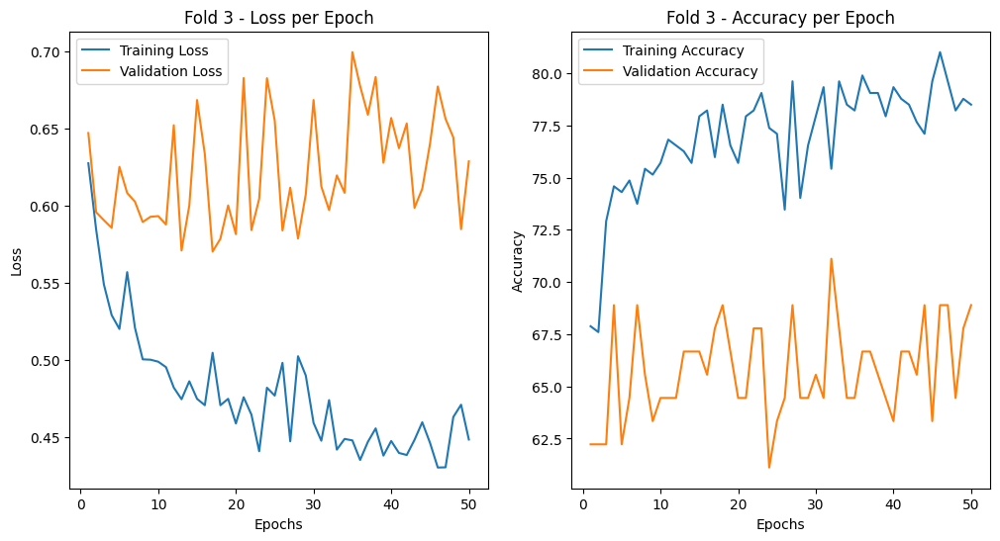

Fold 4
Epoch 1/50, Loss: 0.6684, Accuracy: 65.18%, Validation Loss: 0.5144, Validation Accuracy: 70.79%
Epoch 2/50, Loss: 0.5466, Accuracy: 71.03%, Validation Loss: 0.6451, Validation Accuracy: 71.91%
Epoch 3/50, Loss: 0.5422, Accuracy: 69.92%, Validation Loss: 0.5807, Validation Accuracy: 70.79%
Epoch 4/50, Loss: 0.5399, Accuracy: 71.03%, Validation Loss: 0.5259, Validation Accuracy: 71.91%
Epoch 5/50, Loss: 0.5241, Accuracy: 73.26%, Validation Loss: 0.6113, Validation Accuracy: 60.67%
Epoch 6/50, Loss: 0.5295, Accuracy: 69.08%, Validation Loss: 0.5781, Validation Accuracy: 61.80%
Epoch 7/50, Loss: 0.5201, Accuracy: 72.14%, Validation Loss: 0.5312, Validation Accuracy: 66.29%
Epoch 8/50, Loss: 0.5051, Accuracy: 72.14%, Validation Loss: 0.5348, Validation Accuracy: 62.92%
Epoch 9/50, Loss: 0.5066, Accuracy: 73.54%, Validation Loss: 0.5883, Validation Accuracy: 62.92%
Epoch 10/50, Loss: 0.5130, Accuracy: 74.37%, Validation Loss: 0.6208, Validation Accuracy: 65.17%
Epoch 11/50, Loss: 0.4

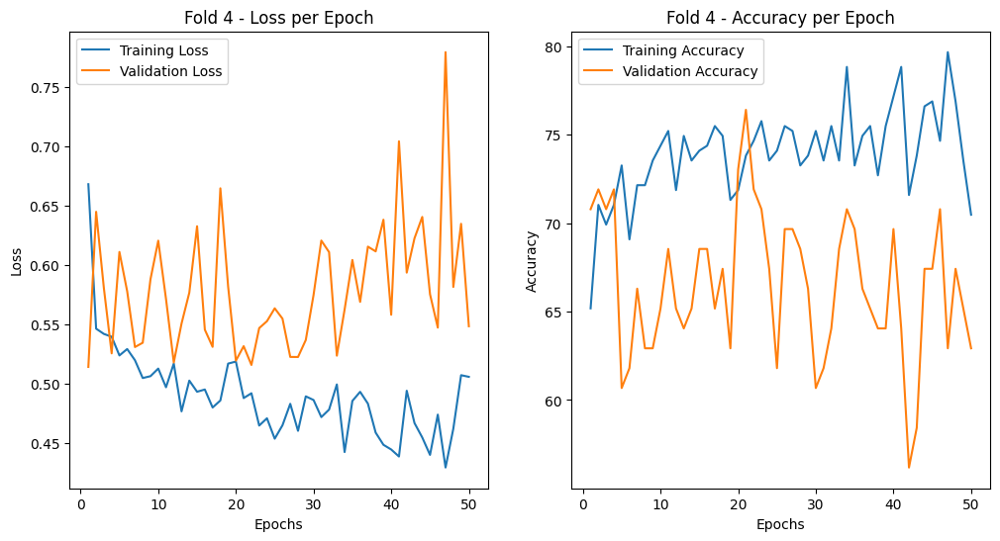

Fold 5
Epoch 1/50, Loss: 0.7380, Accuracy: 60.45%, Validation Loss: 0.5755, Validation Accuracy: 73.03%
Epoch 2/50, Loss: 0.5684, Accuracy: 69.08%, Validation Loss: 0.5426, Validation Accuracy: 71.91%
Epoch 3/50, Loss: 0.5454, Accuracy: 71.59%, Validation Loss: 0.5647, Validation Accuracy: 64.04%
Epoch 4/50, Loss: 0.5143, Accuracy: 72.14%, Validation Loss: 0.6254, Validation Accuracy: 66.29%
Epoch 5/50, Loss: 0.5788, Accuracy: 67.97%, Validation Loss: 0.5938, Validation Accuracy: 66.29%
Epoch 6/50, Loss: 0.5450, Accuracy: 71.03%, Validation Loss: 0.5619, Validation Accuracy: 69.66%
Epoch 7/50, Loss: 0.5634, Accuracy: 67.97%, Validation Loss: 0.6725, Validation Accuracy: 55.06%
Epoch 8/50, Loss: 0.5049, Accuracy: 72.14%, Validation Loss: 0.5853, Validation Accuracy: 70.79%
Epoch 9/50, Loss: 0.4986, Accuracy: 74.37%, Validation Loss: 0.6036, Validation Accuracy: 71.91%
Epoch 10/50, Loss: 0.4852, Accuracy: 72.14%, Validation Loss: 0.6029, Validation Accuracy: 69.66%
Epoch 11/50, Loss: 0.4

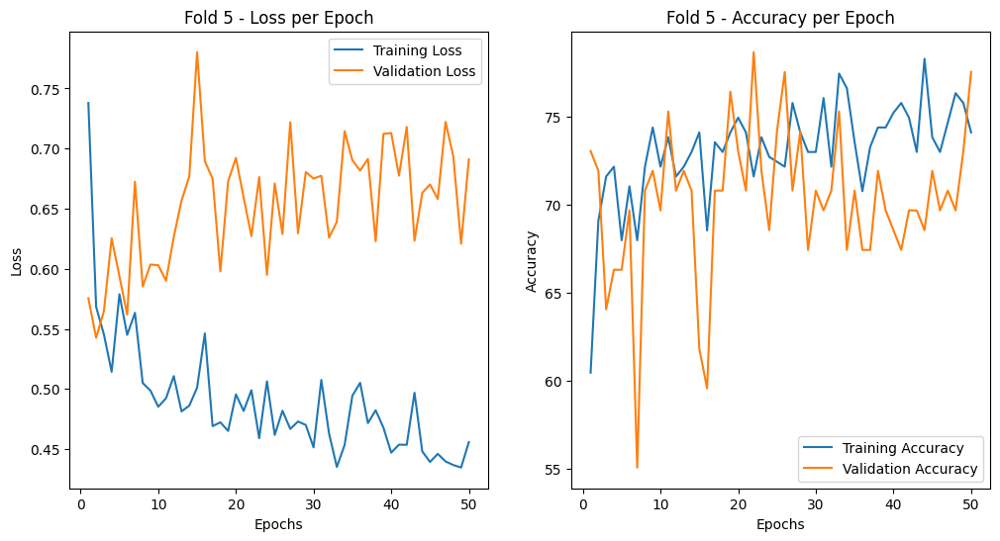

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.4599 - Train Accuracy: 75.98%
           - Validation Loss: 0.6286 - Validation Accuracy: 68.89%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.4638 - Train Accuracy: 75.14%
           - Validation Loss: 0.6577 - Validation Accuracy: 60.00%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.4484 - Train Accuracy: 78.49%
           - Validation Loss: 0.6285 - Validation Accuracy: 68.89%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.5061 - Train Accuracy: 70.47%
           - Validation Loss: 0.5487 - Validation Accuracy: 62.92%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.4558 - Train Accuracy: 74.09%
    

In [40]:
# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Store results for each fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Create directory to save models if not exists
os.makedirs('spectral_transformer_decoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Split data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Create TensorDataset for train and validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Initialize model and optimizer for each fold
    model = TransformerDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Store loss and accuracy per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop for this fold
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluate on validation data
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Save loss and accuracy per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Save model
    model_filename = f'spectral_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot loss and accuracy graphs
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Display final results
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')

In [41]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'spectral_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3453588631.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.69      0.74      0.71        47
      Normal       0.69      0.63      0.66        43

    accuracy                           0.69        90
   macro avg       0.69      0.69      0.69        90
weighted avg       0.69      0.69      0.69        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3453588631.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.65      0.51      0.57        47
      Normal       0.57      0.70      0.62        43

    accuracy                           0.60        90
   macro avg       0.61      0.60      0.60        90
weighted avg       0.61      0.60      0.60        90

--------------------------------------------------------------------------------
Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.65      0.71      0.68        42
      Normal       0.73      0.67      0.70        48

    accuracy                           0.69        90
   macro avg       0.69      0.69      0.69        90
weighted avg       0.69      0.69      0.69        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3453588631.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.60      0.64      0.62        42
      Normal       0.66      0.62      0.64        47

    accuracy                           0.63        89
   macro avg       0.63      0.63      0.63        89
weighted avg       0.63      0.63      0.63        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.75      0.75      0.75        40
      Normal       0.80      0.80      0.80        49

    accuracy                           0.78        89
   macro avg       0.77      0.77      0.77        89
weighted avg       0.78      0.78      0.78        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3453588631.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


In [42]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'spectral_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\967880951.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Metrics for Fold 1
Accuracy: 0.6889
Precision: 0.6893
F1-Score: 0.6864
Sensitivity (Recall for MI): 0.6279
Specificity (True Negative Rate): 0.7447
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.6000
Precision: 0.6073
F1-Score: 0.5982
Sensitivity (Recall for MI): 0.6977
Specificity (True Negative Rate): 0.5106
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\967880951.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Metrics for Fold 3
Accuracy: 0.6889
Precision: 0.6897
F1-Score: 0.6887
Sensitivity (Recall for MI): 0.6667
Specificity (True Negative Rate): 0.7143
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.6292
Precision: 0.6295
F1-Score: 0.6290
Sensitivity (Recall for MI): 0.6170
Specificity (True Negative Rate): 0.6429
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\967880951.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Metrics for Fold 5
Accuracy: 0.7753
Precision: 0.7730
F1-Score: 0.7730
Sensitivity (Recall for MI): 0.7959
Specificity (True Negative Rate): 0.7500
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\988205542.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


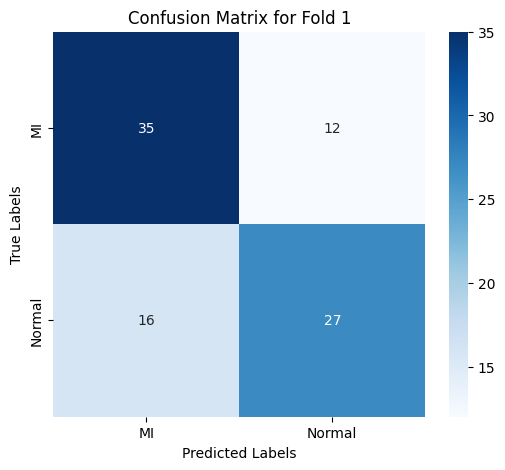

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\988205542.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


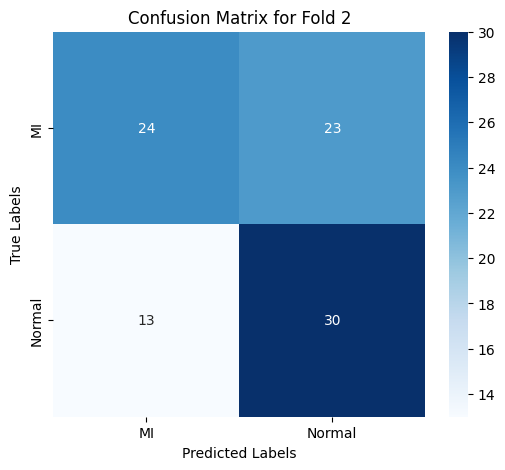

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\988205542.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


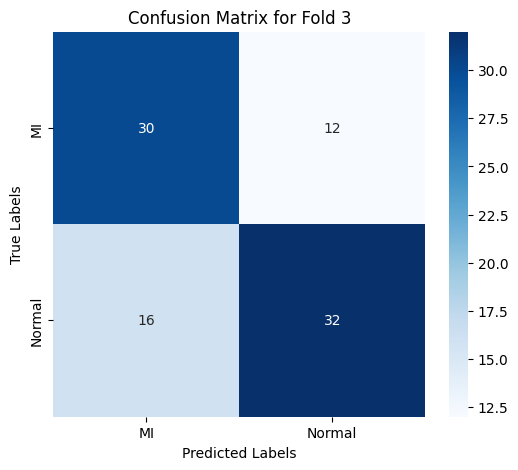

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\988205542.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


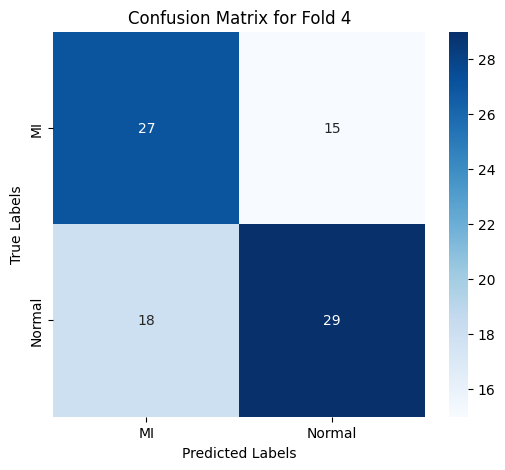

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\988205542.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


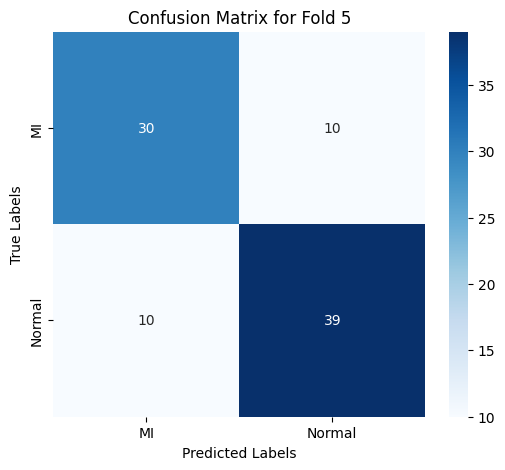

--------------------------------------------------------------------------------


In [43]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'spectral_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## Temporal with Transformer Decoder

In [44]:
selected_columns = ['Entropy', 'Wavelet Means', 'Wavelet std', 'Wavelet max', 'Wavelet min', 'Med_wavelet', 'Var_wavelet', 'Skew_wavelet', 'Q1_wavelet', 'Q3_wavelet', 'IQR_wavelet', 'MinMax_wavelet', 'Kurt_wavelet', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_temporal = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_temporal.head())

    Entropy  Wavelet Means  Wavelet std  Wavelet max  Wavelet min  \
0  0.063608      -1.137174    -0.430682     0.024031     0.004692   
1  0.064888      -0.388901    -0.565070    -0.549047     0.441349   
2  0.063367       0.180394    -0.112938    -0.376300     0.355416   
3  0.068559       0.408853     1.567008     1.825143    -0.973889   
4  0.062193      -0.404628    -0.506024    -0.423697     0.363664   

   Med_wavelet  Var_wavelet  Skew_wavelet  Q1_wavelet  Q3_wavelet  \
0    -0.889833    -0.218548      1.146071   -0.076698    0.026616   
1    -0.241600    -0.239203     -0.594643    0.178925   -0.172615   
2     1.042363    -0.151908     -0.491310   -0.838081    0.944422   
3     0.205136     0.616326      2.953232   -0.848416    0.973499   
4     0.454240    -0.230679     -0.101673   -0.313961    0.340572   

   IQR_wavelet  MinMax_wavelet  Kurt_wavelet Label  
0     0.051833        0.226780      1.470453    MI  
1    -0.176615       -0.536473     -0.367429    MI  
2     0.895

In [45]:
X = df_temporal.drop('Label', axis=1).values
y = df_temporal['Label'].values

In [46]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [48]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


class TransformerDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerDecoderModel, self).__init__()
        # Embed input sesuai dengan input_dim yang sesuai dari data
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Adding an encoder representation as memory for the decoder
        self.memory_projection = nn.Linear(dim_feedforward, dim_feedforward)

        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        # Embed input
        x = self.embedding(x)

        # Ensure proper shape for sequence dimension
        x = x.unsqueeze(0)  # Adding sequence dimension

        # Prepare memory
        memory = self.memory_projection(x)

        # Forward through TransformerDecoder with memory
        x = self.transformer_decoder(x, memory)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x



# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/50, Loss: 0.7716, Accuracy: 53.91%, Validation Loss: 0.6612, Validation Accuracy: 56.67%
Epoch 2/50, Loss: 0.6625, Accuracy: 57.26%, Validation Loss: 0.5948, Validation Accuracy: 60.00%
Epoch 3/50, Loss: 0.5516, Accuracy: 70.11%, Validation Loss: 0.4435, Validation Accuracy: 81.11%
Epoch 4/50, Loss: 0.4798, Accuracy: 75.70%, Validation Loss: 0.5559, Validation Accuracy: 70.00%
Epoch 5/50, Loss: 0.4589, Accuracy: 77.09%, Validation Loss: 0.4639, Validation Accuracy: 68.89%
Epoch 6/50, Loss: 0.5554, Accuracy: 68.44%, Validation Loss: 0.5233, Validation Accuracy: 73.33%
Epoch 7/50, Loss: 0.3650, Accuracy: 82.40%, Validation Loss: 0.3572, Validation Accuracy: 85.56%
Epoch 8/50, Loss: 0.3866, Accuracy: 83.24%, Validation Loss: 0.4846, Validation Accuracy: 78.89%
Epoch 9/50, Loss: 0.3706, Accuracy: 82.68%, Validation Loss: 0.2555, Validation Accuracy: 90.00%
Epoch 10/50, Loss: 0.2807, Accuracy: 88.55%, Validation Loss: 0.2687, Validation Accuracy: 90.00%
Epoch 11/50, Loss: 0.2

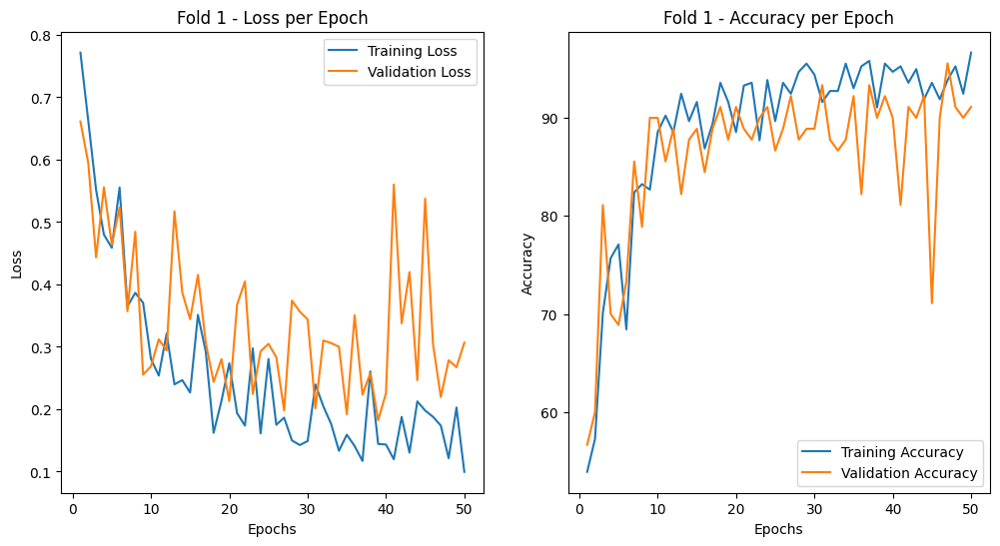

Fold 2
Epoch 1/50, Loss: 0.7676, Accuracy: 55.87%, Validation Loss: 0.7186, Validation Accuracy: 61.11%
Epoch 2/50, Loss: 0.6373, Accuracy: 62.01%, Validation Loss: 0.7620, Validation Accuracy: 51.11%
Epoch 3/50, Loss: 0.6182, Accuracy: 63.13%, Validation Loss: 0.5227, Validation Accuracy: 74.44%
Epoch 4/50, Loss: 0.5087, Accuracy: 75.98%, Validation Loss: 0.5634, Validation Accuracy: 73.33%
Epoch 5/50, Loss: 0.4830, Accuracy: 74.86%, Validation Loss: 0.5271, Validation Accuracy: 70.00%
Epoch 6/50, Loss: 0.4129, Accuracy: 78.49%, Validation Loss: 0.4640, Validation Accuracy: 81.11%
Epoch 7/50, Loss: 0.4653, Accuracy: 77.37%, Validation Loss: 0.3975, Validation Accuracy: 84.44%
Epoch 8/50, Loss: 0.4359, Accuracy: 80.45%, Validation Loss: 0.4460, Validation Accuracy: 77.78%
Epoch 9/50, Loss: 0.3360, Accuracy: 86.03%, Validation Loss: 0.3606, Validation Accuracy: 82.22%
Epoch 10/50, Loss: 0.2706, Accuracy: 88.83%, Validation Loss: 0.3407, Validation Accuracy: 86.67%
Epoch 11/50, Loss: 0.2

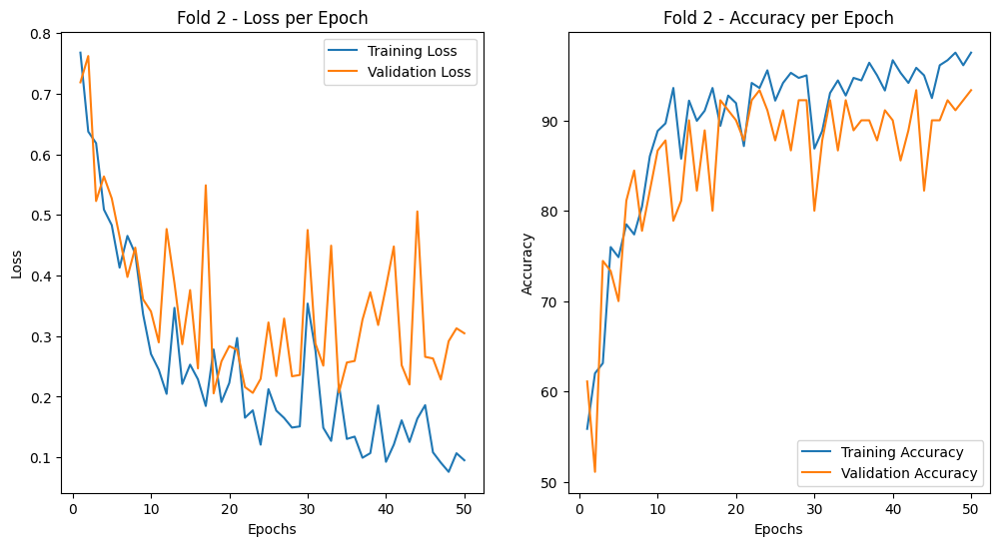

Fold 3
Epoch 1/50, Loss: 0.7350, Accuracy: 61.73%, Validation Loss: 0.7481, Validation Accuracy: 55.56%
Epoch 2/50, Loss: 0.6582, Accuracy: 62.29%, Validation Loss: 0.5669, Validation Accuracy: 65.56%
Epoch 3/50, Loss: 0.5520, Accuracy: 69.27%, Validation Loss: 0.4871, Validation Accuracy: 72.22%
Epoch 4/50, Loss: 0.4683, Accuracy: 76.54%, Validation Loss: 0.4850, Validation Accuracy: 77.78%
Epoch 5/50, Loss: 0.3947, Accuracy: 82.68%, Validation Loss: 0.3483, Validation Accuracy: 84.44%
Epoch 6/50, Loss: 0.3655, Accuracy: 85.75%, Validation Loss: 0.2662, Validation Accuracy: 92.22%
Epoch 7/50, Loss: 0.3519, Accuracy: 85.47%, Validation Loss: 0.3375, Validation Accuracy: 86.67%
Epoch 8/50, Loss: 0.2706, Accuracy: 90.50%, Validation Loss: 0.3775, Validation Accuracy: 87.78%
Epoch 9/50, Loss: 0.3504, Accuracy: 85.47%, Validation Loss: 0.4060, Validation Accuracy: 84.44%
Epoch 10/50, Loss: 0.3937, Accuracy: 81.01%, Validation Loss: 0.3553, Validation Accuracy: 80.00%
Epoch 11/50, Loss: 0.2

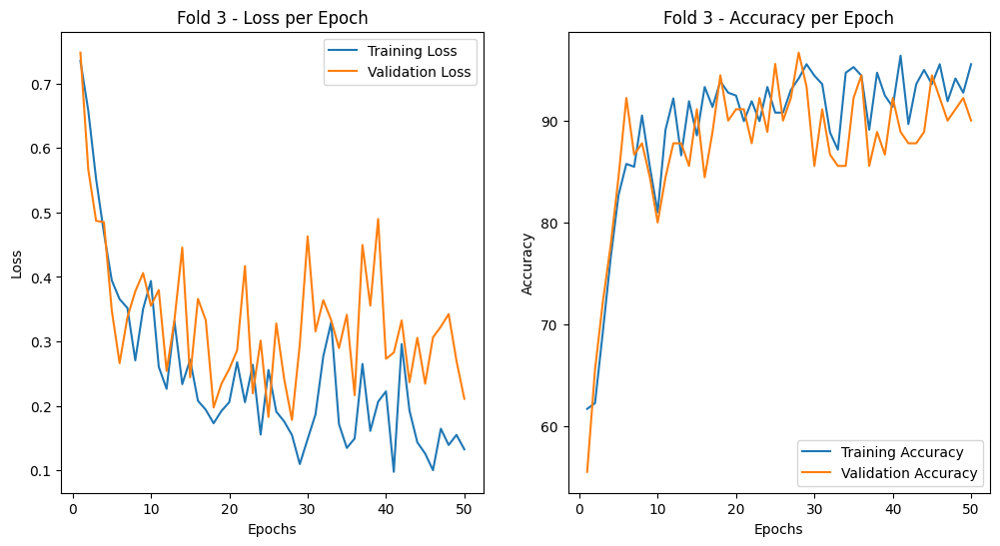

Fold 4
Epoch 1/50, Loss: 0.7767, Accuracy: 55.15%, Validation Loss: 0.7143, Validation Accuracy: 53.93%
Epoch 2/50, Loss: 0.6031, Accuracy: 66.02%, Validation Loss: 0.5451, Validation Accuracy: 74.16%
Epoch 3/50, Loss: 0.5635, Accuracy: 69.64%, Validation Loss: 0.5512, Validation Accuracy: 73.03%
Epoch 4/50, Loss: 0.4879, Accuracy: 77.72%, Validation Loss: 0.5884, Validation Accuracy: 66.29%
Epoch 5/50, Loss: 0.4246, Accuracy: 80.78%, Validation Loss: 0.5135, Validation Accuracy: 75.28%
Epoch 6/50, Loss: 0.3184, Accuracy: 85.79%, Validation Loss: 0.4468, Validation Accuracy: 79.78%
Epoch 7/50, Loss: 0.3088, Accuracy: 86.35%, Validation Loss: 0.3281, Validation Accuracy: 86.52%
Epoch 8/50, Loss: 0.3251, Accuracy: 85.52%, Validation Loss: 0.3723, Validation Accuracy: 79.78%
Epoch 9/50, Loss: 0.2966, Accuracy: 87.47%, Validation Loss: 0.5221, Validation Accuracy: 79.78%
Epoch 10/50, Loss: 0.3809, Accuracy: 83.29%, Validation Loss: 0.3533, Validation Accuracy: 85.39%
Epoch 11/50, Loss: 0.2

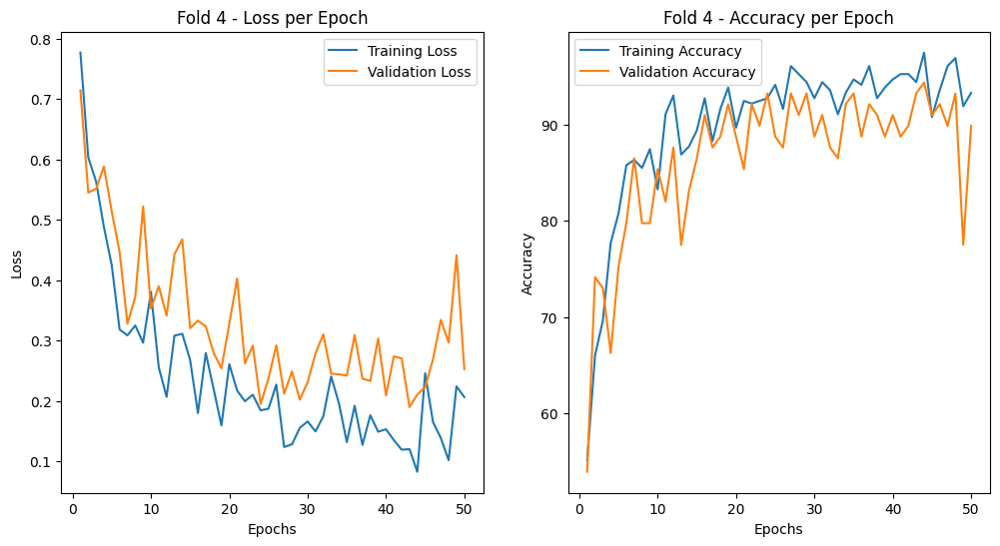

Fold 5
Epoch 1/50, Loss: 0.7445, Accuracy: 54.87%, Validation Loss: 0.6556, Validation Accuracy: 60.67%
Epoch 2/50, Loss: 0.6194, Accuracy: 66.57%, Validation Loss: 0.5053, Validation Accuracy: 70.79%
Epoch 3/50, Loss: 0.4306, Accuracy: 80.78%, Validation Loss: 0.4824, Validation Accuracy: 74.16%
Epoch 4/50, Loss: 0.5517, Accuracy: 74.09%, Validation Loss: 0.5087, Validation Accuracy: 76.40%
Epoch 5/50, Loss: 0.3809, Accuracy: 81.06%, Validation Loss: 0.2744, Validation Accuracy: 89.89%
Epoch 6/50, Loss: 0.3177, Accuracy: 87.19%, Validation Loss: 0.4317, Validation Accuracy: 77.53%
Epoch 7/50, Loss: 0.3609, Accuracy: 84.12%, Validation Loss: 0.2848, Validation Accuracy: 85.39%
Epoch 8/50, Loss: 0.3349, Accuracy: 85.52%, Validation Loss: 0.3345, Validation Accuracy: 83.15%
Epoch 9/50, Loss: 0.2761, Accuracy: 88.30%, Validation Loss: 0.2523, Validation Accuracy: 89.89%
Epoch 10/50, Loss: 0.2924, Accuracy: 88.02%, Validation Loss: 0.3659, Validation Accuracy: 89.89%
Epoch 11/50, Loss: 0.2

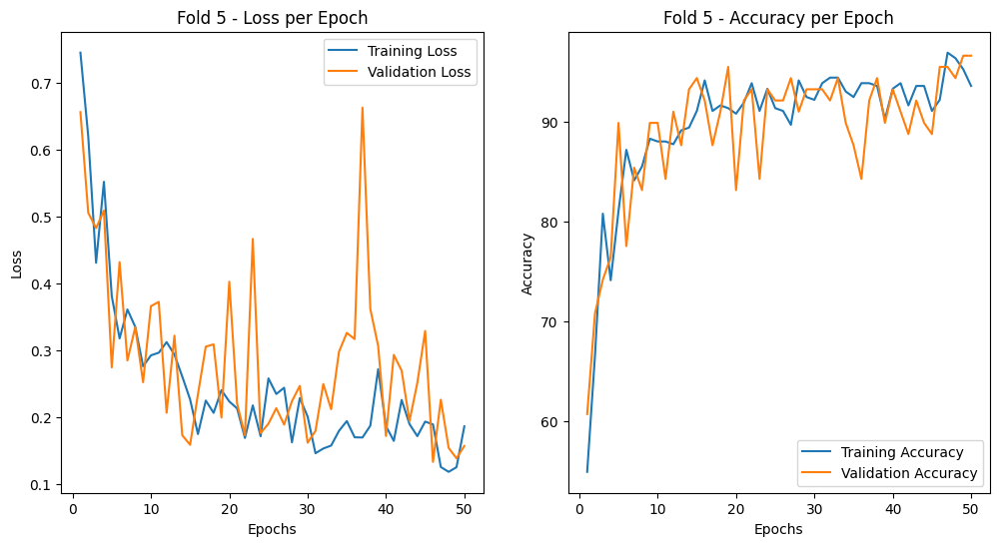

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.0996 - Train Accuracy: 96.65%
           - Validation Loss: 0.3067 - Validation Accuracy: 91.11%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.0952 - Train Accuracy: 97.49%
           - Validation Loss: 0.3046 - Validation Accuracy: 93.33%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.1325 - Train Accuracy: 95.53%
           - Validation Loss: 0.2110 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.2065 - Train Accuracy: 93.31%
           - Validation Loss: 0.2528 - Validation Accuracy: 89.89%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.1863 - Train Accuracy: 93.59%
    

In [49]:
# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Store results for each fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Create directory to save models if not exists
os.makedirs('temporal_transformer_decoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Split data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Create TensorDataset for train and validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Initialize model and optimizer for each fold
    model = TransformerDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Store loss and accuracy per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop for this fold
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluate on validation data
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Save loss and accuracy per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Save model
    model_filename = f'temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot loss and accuracy graphs
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Display final results
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')

In [50]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2230076881.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.93      0.89      0.91        47
      Normal       0.89      0.93      0.91        43

    accuracy                           0.91        90
   macro avg       0.91      0.91      0.91        90
weighted avg       0.91      0.91      0.91        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2230076881.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.89      1.00      0.94        47
      Normal       1.00      0.86      0.93        43

    accuracy                           0.93        90
   macro avg       0.94      0.93      0.93        90
weighted avg       0.94      0.93      0.93        90

--------------------------------------------------------------------------------
Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.85      0.95      0.90        42
      Normal       0.95      0.85      0.90        48

    accuracy                           0.90        90
   macro avg       0.90      0.90      0.90        90
weighted avg       0.91      0.90      0.90        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2230076881.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.84      0.98      0.90        42
      Normal       0.97      0.83      0.90        47

    accuracy                           0.90        89
   macro avg       0.91      0.90      0.90        89
weighted avg       0.91      0.90      0.90        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.95      0.97      0.96        40
      Normal       0.98      0.96      0.97        49

    accuracy                           0.97        89
   macro avg       0.97      0.97      0.97        89
weighted avg       0.97      0.97      0.97        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2230076881.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


In [51]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3875775118.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 1
Accuracy: 0.9111
Precision: 0.9111
F1-Score: 0.9111
Sensitivity (Recall for MI): 0.9302
Specificity (True Negative Rate): 0.8936
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.9333
Precision: 0.9434
F1-Score: 0.9325
Sensitivity (Recall for MI): 0.8605
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 3
Accuracy: 0.9000
Precision: 0.9023
F1-Score: 0.9000
Sensitivity (Recall for MI): 0.8542
Specificity (True Negative Rate): 0.9524
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3875775118.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 4
Accuracy: 0.8989
Precision: 0.9059
F1-Score: 0.8988
Sensitivity (Recall for MI): 0.8298
Specificity (True Negative Rate): 0.9762
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3875775118.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Metrics for Fold 5
Accuracy: 0.9663
Precision: 0.9652
F1-Score: 0.9660
Sensitivity (Recall for MI): 0.9592
Specificity (True Negative Rate): 0.9750
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3933290902.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


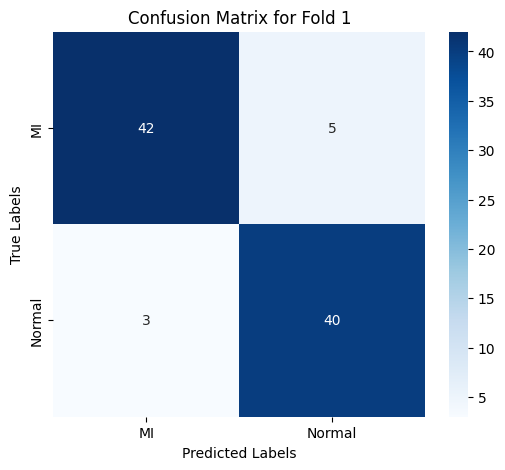

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3933290902.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


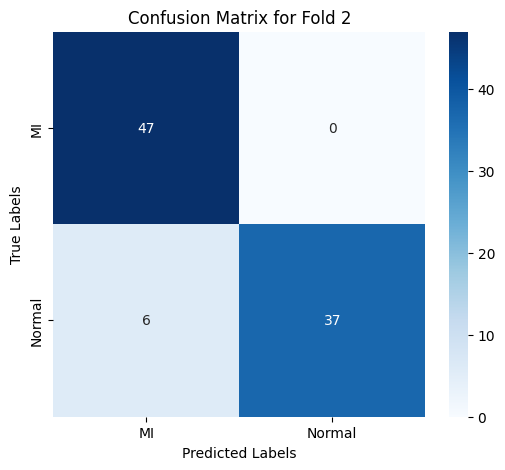

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3933290902.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


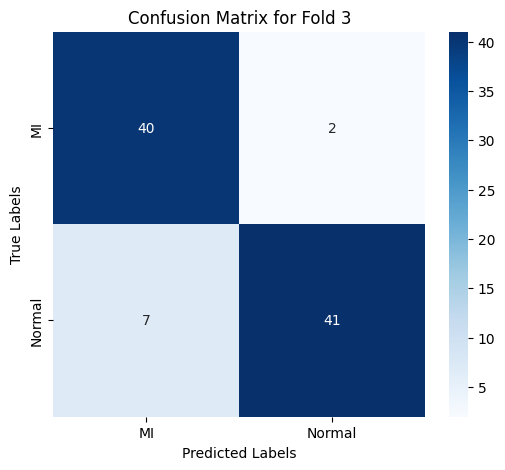

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3933290902.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


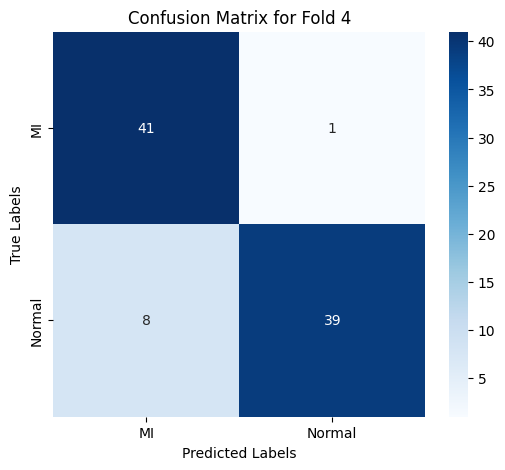

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3933290902.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


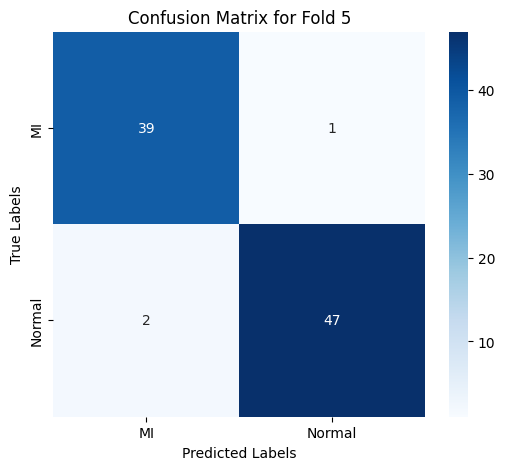

--------------------------------------------------------------------------------


In [52]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## Multi Scale with Transformer Decoder

In [53]:
X = df_combine_scaled.drop('Label', axis=1).values
y = df_combine_scaled['Label'].values

In [54]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [56]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [57]:
# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


class TransformerDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerDecoderModel, self).__init__()
        # Embed input sesuai dengan input_dim yang sesuai dari data
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Adding an encoder representation as memory for the decoder
        self.memory_projection = nn.Linear(dim_feedforward, dim_feedforward)

        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        # Embed input
        x = self.embedding(x)

        # Ensure proper shape for sequence dimension
        x = x.unsqueeze(0)  # Adding sequence dimension

        # Prepare memory
        memory = self.memory_projection(x)

        # Forward through TransformerDecoder with memory
        x = self.transformer_decoder(x, memory)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x



# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/50, Loss: 0.6492, Accuracy: 64.53%, Validation Loss: 0.4889, Validation Accuracy: 73.33%
Epoch 2/50, Loss: 0.4669, Accuracy: 76.82%, Validation Loss: 0.5235, Validation Accuracy: 68.89%
Epoch 3/50, Loss: 0.4303, Accuracy: 79.05%, Validation Loss: 0.3511, Validation Accuracy: 86.67%
Epoch 4/50, Loss: 0.3663, Accuracy: 83.24%, Validation Loss: 0.3101, Validation Accuracy: 84.44%
Epoch 5/50, Loss: 0.3195, Accuracy: 87.43%, Validation Loss: 0.3893, Validation Accuracy: 82.22%
Epoch 6/50, Loss: 0.2981, Accuracy: 88.83%, Validation Loss: 0.4380, Validation Accuracy: 78.89%
Epoch 7/50, Loss: 0.2557, Accuracy: 89.11%, Validation Loss: 0.3583, Validation Accuracy: 82.22%
Epoch 8/50, Loss: 0.2624, Accuracy: 89.94%, Validation Loss: 0.2867, Validation Accuracy: 86.67%
Epoch 9/50, Loss: 0.2373, Accuracy: 90.50%, Validation Loss: 0.3372, Validation Accuracy: 82.22%
Epoch 10/50, Loss: 0.2459, Accuracy: 89.66%, Validation Loss: 0.2512, Validation Accuracy: 87.78%
Epoch 11/50, Loss: 0.1

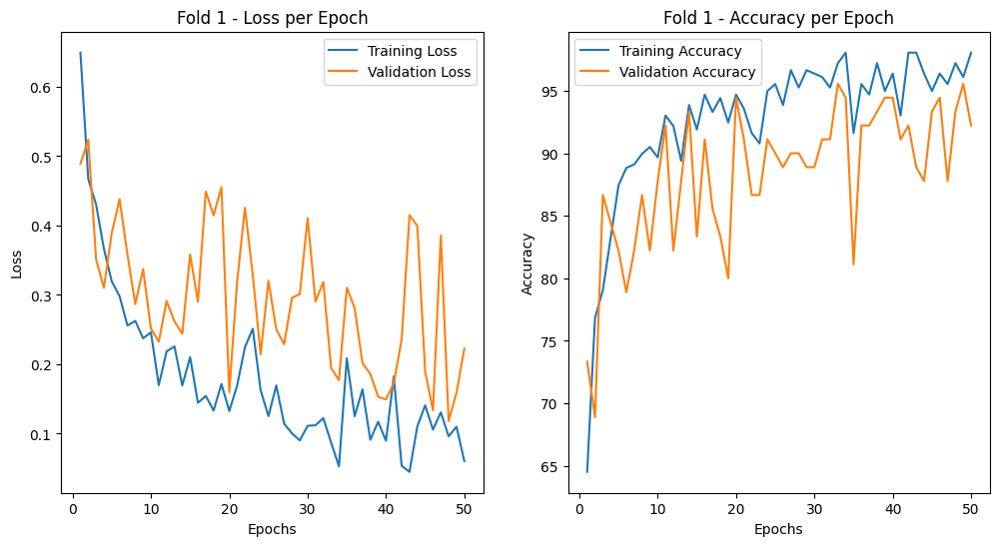

Fold 2
Epoch 1/50, Loss: 0.7724, Accuracy: 60.06%, Validation Loss: 0.5664, Validation Accuracy: 68.89%
Epoch 2/50, Loss: 0.5483, Accuracy: 68.16%, Validation Loss: 0.6449, Validation Accuracy: 60.00%
Epoch 3/50, Loss: 0.4159, Accuracy: 82.40%, Validation Loss: 0.3334, Validation Accuracy: 83.33%
Epoch 4/50, Loss: 0.3717, Accuracy: 82.68%, Validation Loss: 0.3828, Validation Accuracy: 82.22%
Epoch 5/50, Loss: 0.3448, Accuracy: 84.92%, Validation Loss: 0.3542, Validation Accuracy: 82.22%
Epoch 6/50, Loss: 0.3100, Accuracy: 86.03%, Validation Loss: 0.3342, Validation Accuracy: 87.78%
Epoch 7/50, Loss: 0.3018, Accuracy: 88.27%, Validation Loss: 0.2957, Validation Accuracy: 87.78%
Epoch 8/50, Loss: 0.3310, Accuracy: 87.71%, Validation Loss: 0.5361, Validation Accuracy: 76.67%
Epoch 9/50, Loss: 0.2340, Accuracy: 90.22%, Validation Loss: 0.2344, Validation Accuracy: 88.89%
Epoch 10/50, Loss: 0.2662, Accuracy: 90.22%, Validation Loss: 0.2221, Validation Accuracy: 92.22%
Epoch 11/50, Loss: 0.1

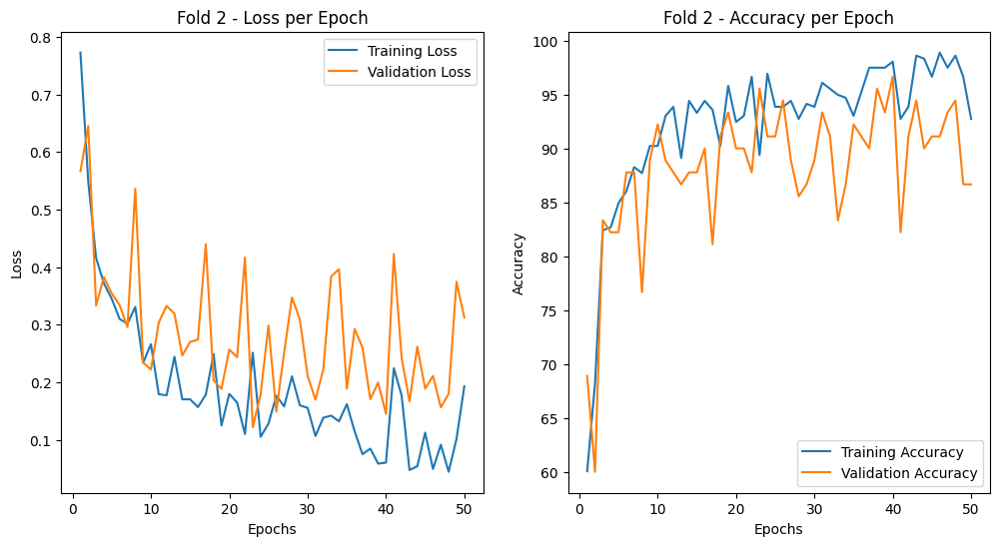

Fold 3
Epoch 1/50, Loss: 0.6325, Accuracy: 68.16%, Validation Loss: 0.5273, Validation Accuracy: 71.11%
Epoch 2/50, Loss: 0.4544, Accuracy: 77.65%, Validation Loss: 0.4294, Validation Accuracy: 78.89%
Epoch 3/50, Loss: 0.4407, Accuracy: 82.40%, Validation Loss: 0.4427, Validation Accuracy: 75.56%
Epoch 4/50, Loss: 0.3973, Accuracy: 82.40%, Validation Loss: 0.3764, Validation Accuracy: 84.44%
Epoch 5/50, Loss: 0.3494, Accuracy: 85.47%, Validation Loss: 0.3854, Validation Accuracy: 81.11%
Epoch 6/50, Loss: 0.3118, Accuracy: 86.31%, Validation Loss: 0.4827, Validation Accuracy: 80.00%
Epoch 7/50, Loss: 0.4247, Accuracy: 81.01%, Validation Loss: 0.3880, Validation Accuracy: 82.22%
Epoch 8/50, Loss: 0.2407, Accuracy: 91.06%, Validation Loss: 0.5048, Validation Accuracy: 80.00%
Epoch 9/50, Loss: 0.2413, Accuracy: 89.94%, Validation Loss: 0.2266, Validation Accuracy: 88.89%
Epoch 10/50, Loss: 0.1749, Accuracy: 93.85%, Validation Loss: 0.3956, Validation Accuracy: 86.67%
Epoch 11/50, Loss: 0.2

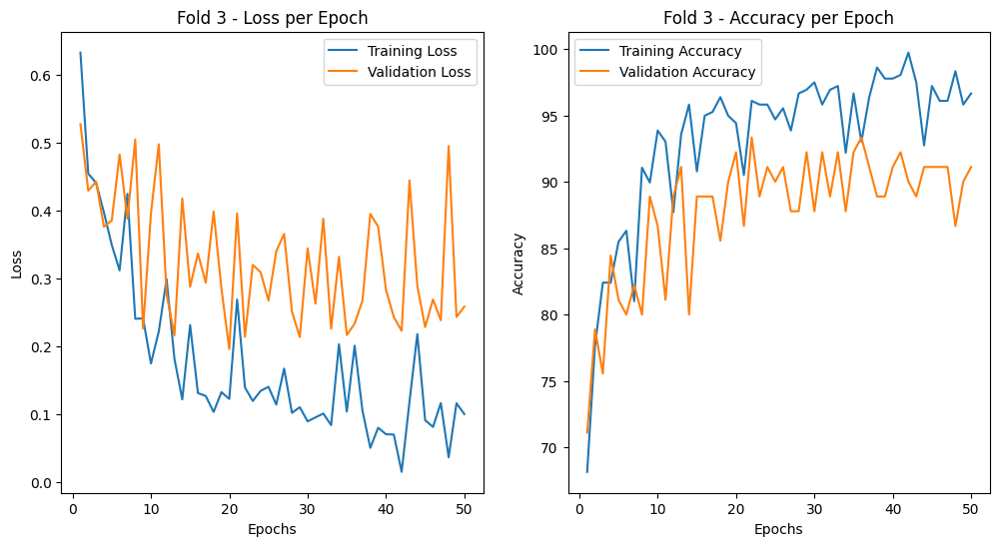

Fold 4
Epoch 1/50, Loss: 0.6850, Accuracy: 63.79%, Validation Loss: 0.5970, Validation Accuracy: 71.91%
Epoch 2/50, Loss: 0.5117, Accuracy: 75.49%, Validation Loss: 0.4554, Validation Accuracy: 83.15%
Epoch 3/50, Loss: 0.3925, Accuracy: 84.96%, Validation Loss: 0.7097, Validation Accuracy: 70.79%
Epoch 4/50, Loss: 0.3437, Accuracy: 85.79%, Validation Loss: 0.4473, Validation Accuracy: 86.52%
Epoch 5/50, Loss: 0.3514, Accuracy: 84.12%, Validation Loss: 0.4182, Validation Accuracy: 85.39%
Epoch 6/50, Loss: 0.2562, Accuracy: 89.42%, Validation Loss: 0.3628, Validation Accuracy: 82.02%
Epoch 7/50, Loss: 0.2623, Accuracy: 89.97%, Validation Loss: 0.4521, Validation Accuracy: 83.15%
Epoch 8/50, Loss: 0.2211, Accuracy: 90.53%, Validation Loss: 0.5028, Validation Accuracy: 77.53%
Epoch 9/50, Loss: 0.1663, Accuracy: 93.87%, Validation Loss: 0.4214, Validation Accuracy: 80.90%
Epoch 10/50, Loss: 0.2160, Accuracy: 92.76%, Validation Loss: 0.5168, Validation Accuracy: 84.27%
Epoch 11/50, Loss: 0.2

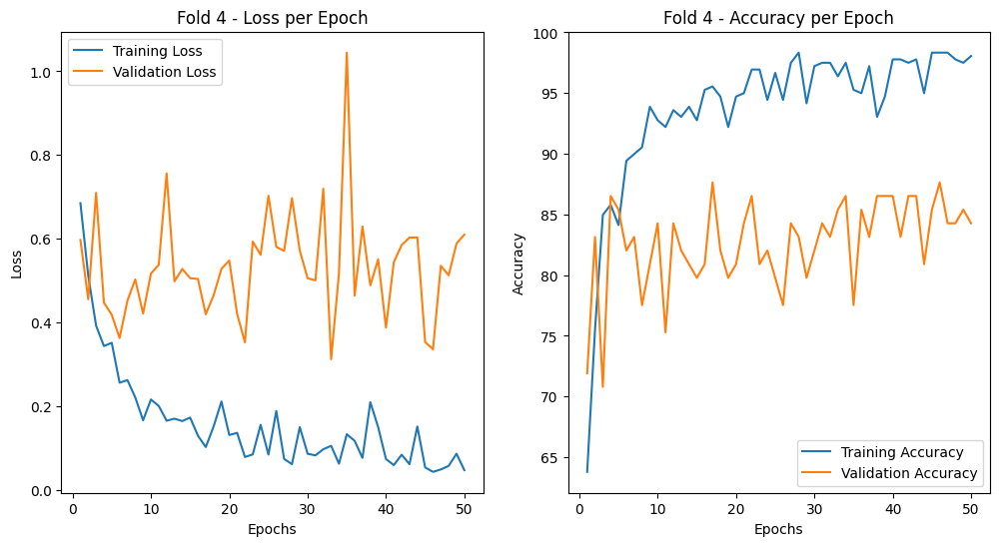

Fold 5
Epoch 1/50, Loss: 0.6342, Accuracy: 68.80%, Validation Loss: 0.4422, Validation Accuracy: 76.40%
Epoch 2/50, Loss: 0.4675, Accuracy: 75.21%, Validation Loss: 0.4403, Validation Accuracy: 74.16%
Epoch 3/50, Loss: 0.4210, Accuracy: 80.50%, Validation Loss: 0.4502, Validation Accuracy: 71.91%
Epoch 4/50, Loss: 0.4315, Accuracy: 79.94%, Validation Loss: 0.3974, Validation Accuracy: 84.27%
Epoch 5/50, Loss: 0.3448, Accuracy: 86.07%, Validation Loss: 0.3196, Validation Accuracy: 86.52%
Epoch 6/50, Loss: 0.2663, Accuracy: 88.02%, Validation Loss: 0.3502, Validation Accuracy: 85.39%
Epoch 7/50, Loss: 0.2536, Accuracy: 89.69%, Validation Loss: 0.2738, Validation Accuracy: 86.52%
Epoch 8/50, Loss: 0.2209, Accuracy: 90.25%, Validation Loss: 0.2700, Validation Accuracy: 89.89%
Epoch 9/50, Loss: 0.2430, Accuracy: 89.69%, Validation Loss: 0.3307, Validation Accuracy: 84.27%
Epoch 10/50, Loss: 0.2252, Accuracy: 89.69%, Validation Loss: 0.2309, Validation Accuracy: 93.26%
Epoch 11/50, Loss: 0.2

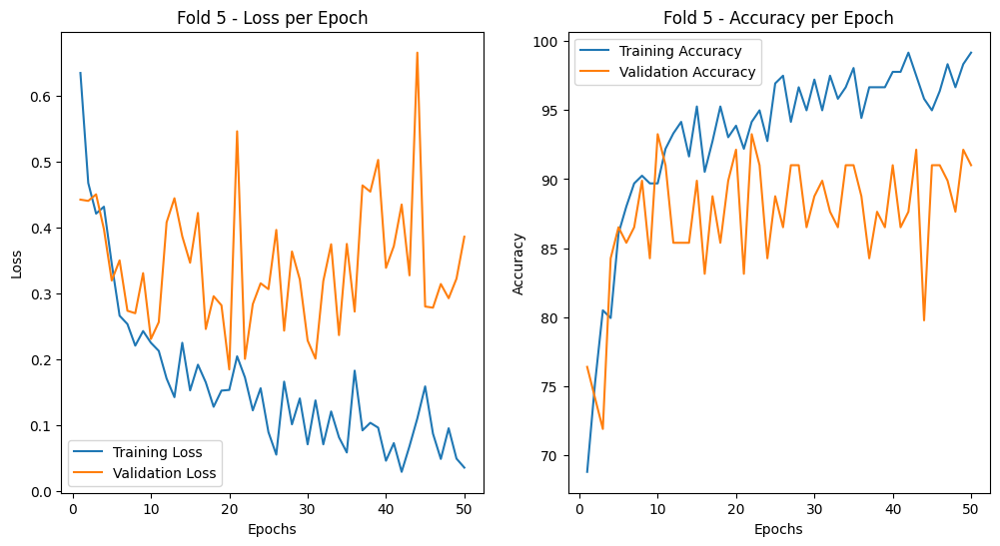

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.0604 - Train Accuracy: 98.04%
           - Validation Loss: 0.2226 - Validation Accuracy: 92.22%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.1931 - Train Accuracy: 92.74%
           - Validation Loss: 0.3126 - Validation Accuracy: 86.67%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.1004 - Train Accuracy: 96.65%
           - Validation Loss: 0.2586 - Validation Accuracy: 91.11%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.0474 - Train Accuracy: 98.05%
           - Validation Loss: 0.6099 - Validation Accuracy: 84.27%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.0360 - Train Accuracy: 99.16%
    

In [58]:
# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Store results for each fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Create directory to save models if not exists
os.makedirs('multi_scale_transformer_decoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Split data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Create TensorDataset for train and validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Initialize model and optimizer for each fold
    model = TransformerDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Store loss and accuracy per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop for this fold
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluate on validation data
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Save loss and accuracy per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Save model
    model_filename = f'multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot loss and accuracy graphs
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Display final results
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')

In [59]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3973886290.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.95      0.89      0.92        47
      Normal       0.89      0.95      0.92        43

    accuracy                           0.92        90
   macro avg       0.92      0.92      0.92        90
weighted avg       0.92      0.92      0.92        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3973886290.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.89      0.85      0.87        47
      Normal       0.84      0.88      0.86        43

    accuracy                           0.87        90
   macro avg       0.87      0.87      0.87        90
weighted avg       0.87      0.87      0.87        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3973886290.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.85      0.98      0.91        42
      Normal       0.98      0.85      0.91        48

    accuracy                           0.91        90
   macro avg       0.92      0.92      0.91        90
weighted avg       0.92      0.91      0.91        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.82      0.86      0.84        42
      Normal       0.87      0.83      0.85        47

    accuracy                           0.84        89
   macro avg       0.84      0.84      0.84        89
weighted avg       0.84      0.84      0.84        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3973886290.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.94      0.85      0.89        40
      Normal       0.89      0.96      0.92        49

    accuracy                           0.91        89
   macro avg       0.92      0.90      0.91        89
weighted avg       0.91      0.91      0.91        89

--------------------------------------------------------------------------------


In [60]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3620757880.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Metrics for Fold 1
Accuracy: 0.9222
Precision: 0.9229
F1-Score: 0.9222
Sensitivity (Recall for MI): 0.9535
Specificity (True Negative Rate): 0.8936
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.8667
Precision: 0.8667
F1-Score: 0.8666
Sensitivity (Recall for MI): 0.8837
Specificity (True Negative Rate): 0.8511
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3620757880.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 3
Accuracy: 0.9111
Precision: 0.9152
F1-Score: 0.9111
Sensitivity (Recall for MI): 0.8542
Specificity (True Negative Rate): 0.9762
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.8427
Precision: 0.8424
F1-Score: 0.8425
Sensitivity (Recall for MI): 0.8298
Specificity (True Negative Rate): 0.8571
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3620757880.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 5
Accuracy: 0.9101
Precision: 0.9156
F1-Score: 0.9082
Sensitivity (Recall for MI): 0.9592
Specificity (True Negative Rate): 0.8500
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3792025352.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


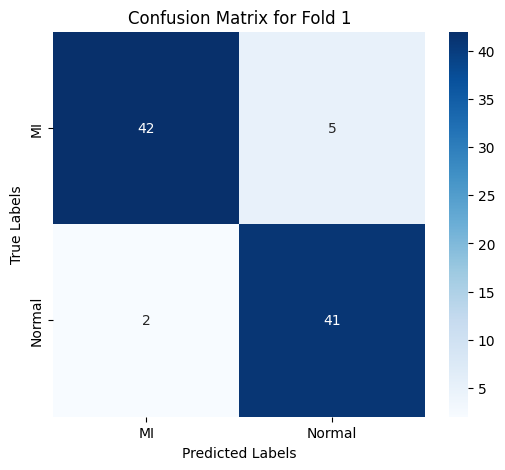

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3792025352.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


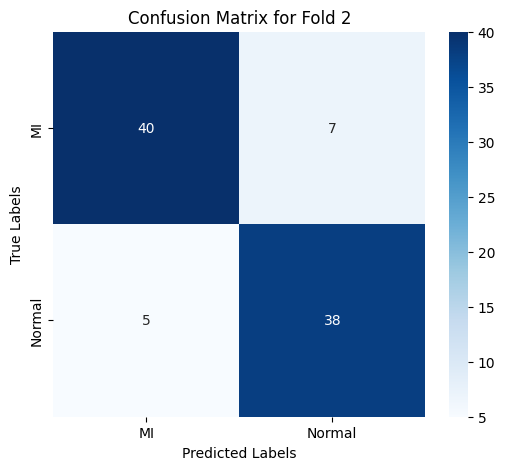

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3792025352.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


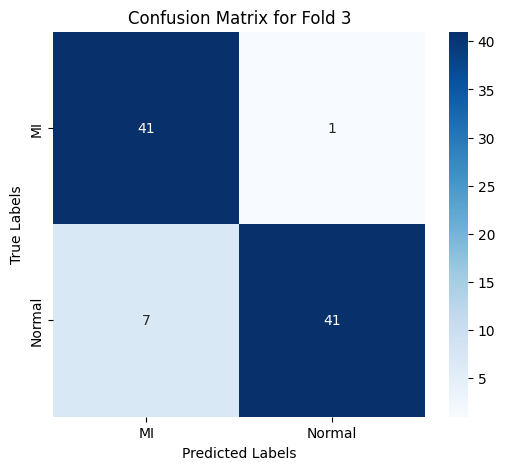

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3792025352.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


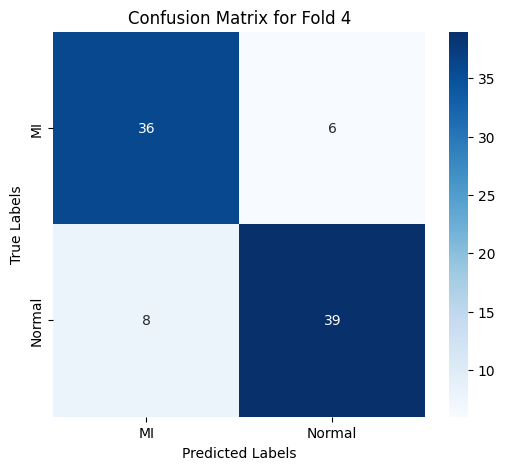

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3792025352.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


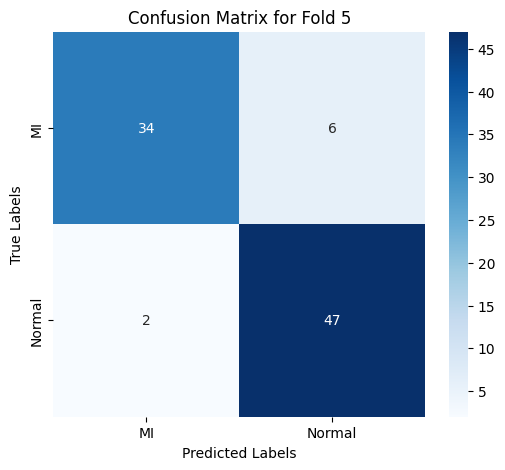

--------------------------------------------------------------------------------


In [61]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)

## Spectral Transformer Encoder Decoder

In [62]:
selected_columns = ['MFCC Means', 'MFCC std', 'MFCC max', 'MFCC min', 'Med_mfcc', 'Var_mfcc', 'Skew_mfcc', 'Q1_mfcc', 'Q3_mfcc', 'IQR_mfcc', 'MinMax_mfcc', 'Kurt_mfcc', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_spectral = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_spectral.head())

   MFCC Means  MFCC std  MFCC max  MFCC min  Med_mfcc  Var_mfcc  Skew_mfcc  \
0    0.805298 -0.893321  0.727190  0.942132 -0.598371 -0.921706  -0.321473   
1   -0.228878  0.601932 -2.114222 -0.483793  1.257240  0.594724  -0.971689   
2    0.629472 -0.027778 -0.754010  0.036559  2.398342 -0.062456  -0.766293   
3    1.530227 -1.566485  1.255310  1.583813 -0.171921 -1.554723  -0.653024   
4   -0.680597  0.530428 -0.464613 -0.596863  0.842127  0.518742  -0.035472   

    Q1_mfcc   Q3_mfcc  IQR_mfcc  MinMax_mfcc  Kurt_mfcc Label  
0  0.734321 -0.816269 -1.060130    -0.538695   0.334547    MI  
1  0.669311  0.773221  0.321963    -0.347450   0.964492    MI  
2  0.749218  1.135122  0.589301    -0.301331   0.758335    MI  
3  0.715255 -0.219460 -0.543864    -0.893826   0.690955    MI  
4 -0.499815  0.770667  0.904191     0.339870   0.007908    MI  


In [63]:
X = df_spectral.drop('Label', axis=1).values
y = df_spectral['Label'].values

In [64]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [66]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt


# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [67]:
# Definisikan Model dengan Encoder dan Decoder
class TransformerEncoderDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_encoder_layers=3, num_decoder_layers=3, dim_feedforward=128):
        super(TransformerEncoderDecoderModel, self).__init__()

        # Embedding untuk input dan target
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Transformer Encoder
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_encoder_layers
        )

        # Transformer Decoder
        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_decoder_layers
        )

        # Linear layer untuk mengubah output decoder menjadi logits
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, src, tgt):
        # src: input data (e.g., features or sequences)
        # tgt: target sequence (e.g., labels or tokens)

        # Encode the source input
        src = self.embedding(src)
        memory = self.transformer_encoder(src.unsqueeze(1))  # Add sequence dim if needed

        # Decode the target input
        tgt = self.embedding(tgt)
        output = self.transformer_decoder(tgt.unsqueeze(1), memory)  # Pass tgt and memory to decoder

        # Final output layer (logits)
        output = self.fc(output.squeeze(1))  # Squeeze sequence dimension

        return output

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

# Assume you have some input data and target data
# src = torch.randn((32, input_dim))  # batch_size=32, input_dim=128
# tgt = torch.randn((32, input_dim))  # Target tensor of the same dimension

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.7428, Accuracy: 55.03%, Validation Loss: 0.6102, Validation Accuracy: 65.56%
Epoch 2/50, Loss: 0.6429, Accuracy: 62.57%, Validation Loss: 0.6303, Validation Accuracy: 63.33%
Epoch 3/50, Loss: 0.6796, Accuracy: 59.50%, Validation Loss: 0.7936, Validation Accuracy: 47.78%
Epoch 4/50, Loss: 0.6184, Accuracy: 67.04%, Validation Loss: 0.6191, Validation Accuracy: 68.89%
Epoch 5/50, Loss: 0.6607, Accuracy: 61.17%, Validation Loss: 0.5905, Validation Accuracy: 74.44%
Epoch 6/50, Loss: 0.6469, Accuracy: 63.41%, Validation Loss: 0.5928, Validation Accuracy: 71.11%
Epoch 7/50, Loss: 0.5966, Accuracy: 67.60%, Validation Loss: 0.6068, Validation Accuracy: 63.33%
Epoch 8/50, Loss: 0.6123, Accuracy: 65.92%, Validation Loss: 0.5884, Validation Accuracy: 68.89%
Epoch 9/50, Loss: 0.5788, Accuracy: 62.57%, Validation Loss: 0.5730, Validation Accuracy: 71.11%
Epoch 10/50, Loss: 0.6226, Accuracy: 61.73%, Validation Loss: 0.6530, Validation Accuracy: 73.33%
Epoch 11/50, Loss: 0.6155, Ac

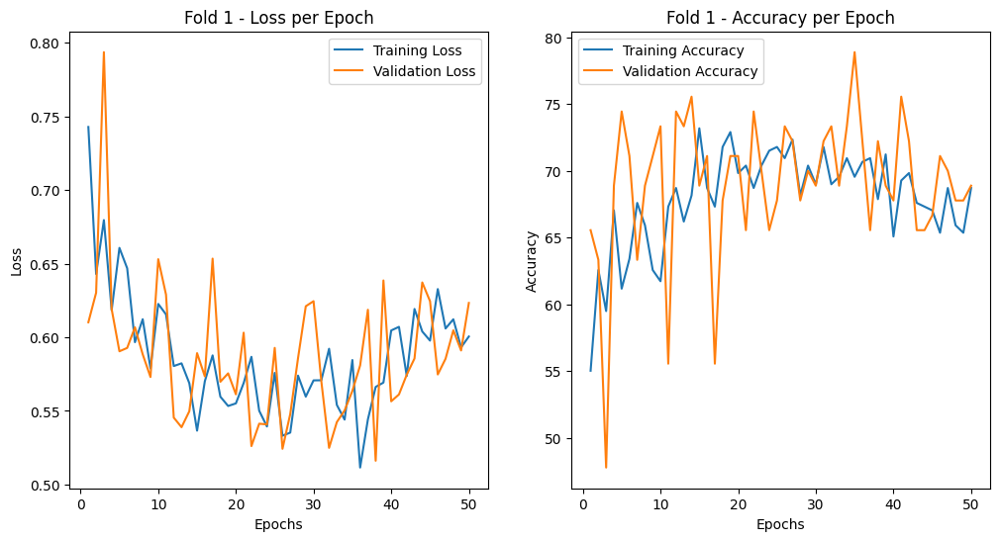

Fold 2
Epoch 1/50, Loss: 0.7300, Accuracy: 56.42%, Validation Loss: 0.6884, Validation Accuracy: 61.11%
Epoch 2/50, Loss: 0.6642, Accuracy: 60.06%, Validation Loss: 0.6696, Validation Accuracy: 61.11%
Epoch 3/50, Loss: 0.6340, Accuracy: 64.25%, Validation Loss: 0.7131, Validation Accuracy: 47.78%
Epoch 4/50, Loss: 0.5912, Accuracy: 69.55%, Validation Loss: 0.6419, Validation Accuracy: 66.67%
Epoch 5/50, Loss: 0.6219, Accuracy: 64.25%, Validation Loss: 0.5879, Validation Accuracy: 70.00%
Epoch 6/50, Loss: 0.5969, Accuracy: 69.83%, Validation Loss: 0.5830, Validation Accuracy: 70.00%
Epoch 7/50, Loss: 0.5878, Accuracy: 70.95%, Validation Loss: 0.5717, Validation Accuracy: 68.89%
Epoch 8/50, Loss: 0.5821, Accuracy: 66.76%, Validation Loss: 0.5251, Validation Accuracy: 75.56%
Epoch 9/50, Loss: 0.5720, Accuracy: 66.76%, Validation Loss: 0.5535, Validation Accuracy: 72.22%
Epoch 10/50, Loss: 0.5634, Accuracy: 72.63%, Validation Loss: 0.5371, Validation Accuracy: 74.44%
Epoch 11/50, Loss: 0.5

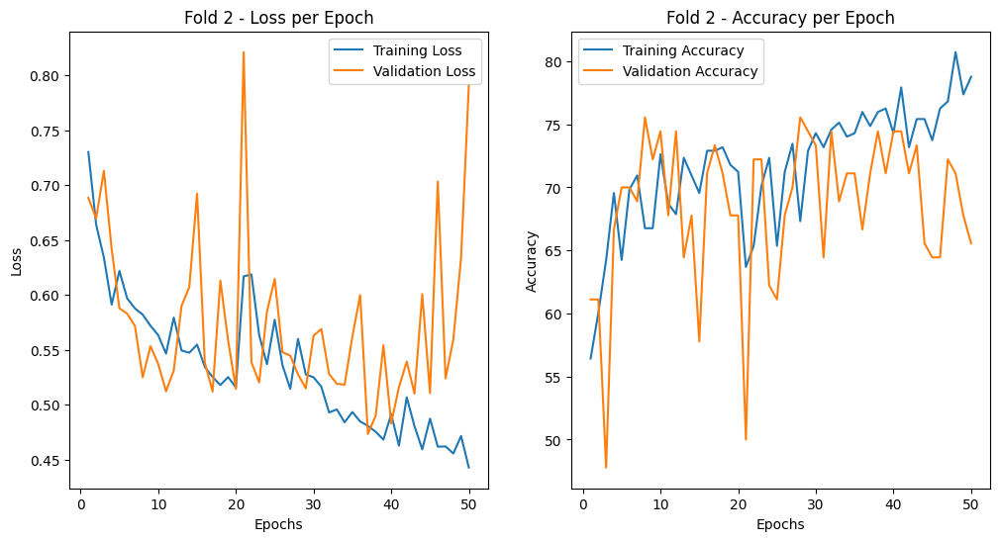

Fold 3
Epoch 1/50, Loss: 0.7496, Accuracy: 59.50%, Validation Loss: 0.6842, Validation Accuracy: 57.78%
Epoch 2/50, Loss: 0.6273, Accuracy: 62.29%, Validation Loss: 0.6338, Validation Accuracy: 58.89%
Epoch 3/50, Loss: 0.5821, Accuracy: 68.99%, Validation Loss: 0.6572, Validation Accuracy: 63.33%
Epoch 4/50, Loss: 0.6612, Accuracy: 62.57%, Validation Loss: 0.6159, Validation Accuracy: 57.78%
Epoch 5/50, Loss: 0.5976, Accuracy: 70.11%, Validation Loss: 0.6396, Validation Accuracy: 56.67%
Epoch 6/50, Loss: 0.5895, Accuracy: 68.72%, Validation Loss: 0.5848, Validation Accuracy: 64.44%
Epoch 7/50, Loss: 0.5448, Accuracy: 72.63%, Validation Loss: 0.6792, Validation Accuracy: 62.22%
Epoch 8/50, Loss: 0.6023, Accuracy: 68.44%, Validation Loss: 0.6323, Validation Accuracy: 63.33%
Epoch 9/50, Loss: 0.5353, Accuracy: 75.70%, Validation Loss: 0.6956, Validation Accuracy: 63.33%
Epoch 10/50, Loss: 0.5677, Accuracy: 72.35%, Validation Loss: 0.6249, Validation Accuracy: 64.44%
Epoch 11/50, Loss: 0.5

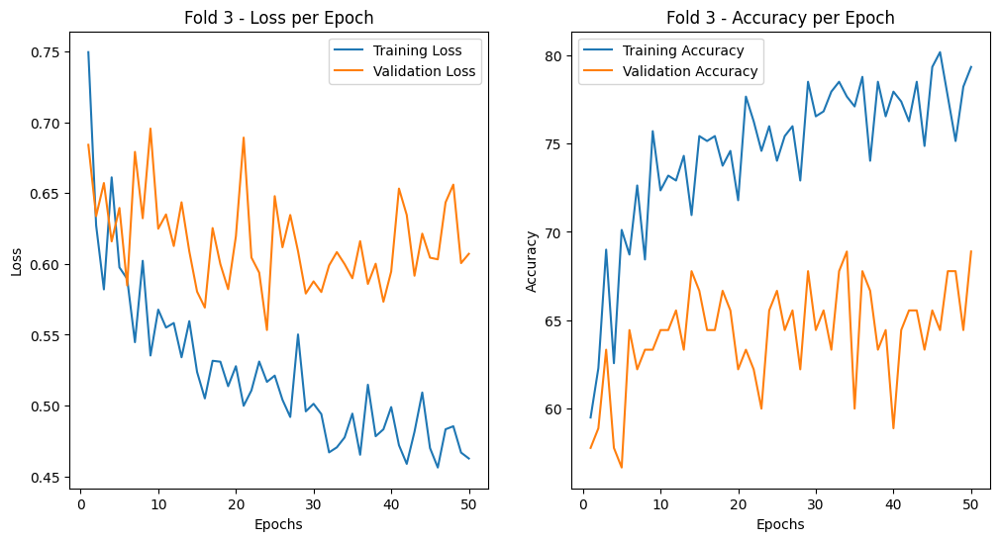

Fold 4
Epoch 1/50, Loss: 0.7545, Accuracy: 56.82%, Validation Loss: 0.6786, Validation Accuracy: 67.42%
Epoch 2/50, Loss: 0.6595, Accuracy: 65.18%, Validation Loss: 0.6622, Validation Accuracy: 58.43%
Epoch 3/50, Loss: 0.6458, Accuracy: 63.79%, Validation Loss: 0.6987, Validation Accuracy: 51.69%
Epoch 4/50, Loss: 0.6084, Accuracy: 67.41%, Validation Loss: 0.5973, Validation Accuracy: 67.42%
Epoch 5/50, Loss: 0.6391, Accuracy: 60.45%, Validation Loss: 0.6231, Validation Accuracy: 64.04%
Epoch 6/50, Loss: 0.5555, Accuracy: 69.64%, Validation Loss: 0.5866, Validation Accuracy: 64.04%
Epoch 7/50, Loss: 0.5696, Accuracy: 71.03%, Validation Loss: 0.6233, Validation Accuracy: 66.29%
Epoch 8/50, Loss: 0.6182, Accuracy: 64.90%, Validation Loss: 0.5620, Validation Accuracy: 70.79%
Epoch 9/50, Loss: 0.5344, Accuracy: 72.98%, Validation Loss: 0.5876, Validation Accuracy: 70.79%
Epoch 10/50, Loss: 0.5853, Accuracy: 69.64%, Validation Loss: 0.5576, Validation Accuracy: 69.66%
Epoch 11/50, Loss: 0.5

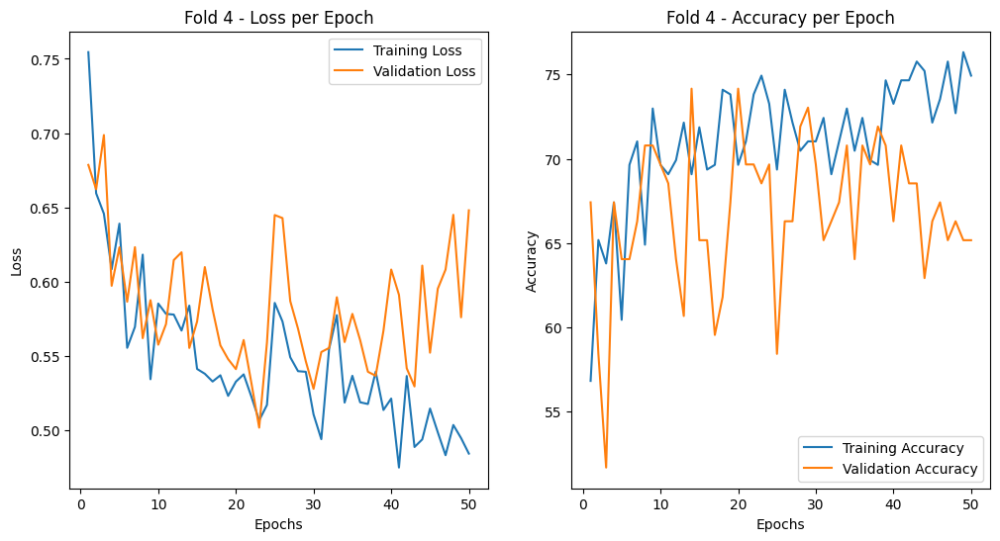

Fold 5
Epoch 1/50, Loss: 0.7625, Accuracy: 54.87%, Validation Loss: 0.6328, Validation Accuracy: 58.43%
Epoch 2/50, Loss: 0.6153, Accuracy: 63.51%, Validation Loss: 0.8563, Validation Accuracy: 58.43%
Epoch 3/50, Loss: 0.6228, Accuracy: 62.67%, Validation Loss: 0.8013, Validation Accuracy: 65.17%
Epoch 4/50, Loss: 0.6555, Accuracy: 64.07%, Validation Loss: 0.6300, Validation Accuracy: 53.93%
Epoch 5/50, Loss: 0.6080, Accuracy: 66.30%, Validation Loss: 0.6067, Validation Accuracy: 62.92%
Epoch 6/50, Loss: 0.5773, Accuracy: 66.85%, Validation Loss: 0.5832, Validation Accuracy: 65.17%
Epoch 7/50, Loss: 0.5859, Accuracy: 68.52%, Validation Loss: 0.6057, Validation Accuracy: 58.43%
Epoch 8/50, Loss: 0.6194, Accuracy: 64.07%, Validation Loss: 0.6258, Validation Accuracy: 60.67%
Epoch 9/50, Loss: 0.5892, Accuracy: 67.41%, Validation Loss: 0.6634, Validation Accuracy: 56.18%
Epoch 10/50, Loss: 0.6086, Accuracy: 64.35%, Validation Loss: 0.6784, Validation Accuracy: 66.29%
Epoch 11/50, Loss: 0.5

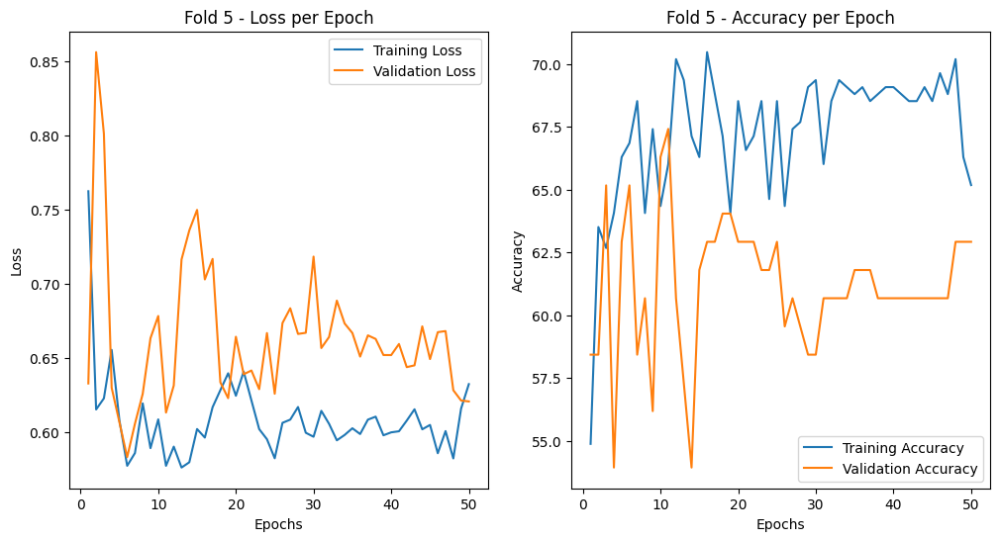

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.6005 - Train Accuracy: 68.72%
           - Validation Loss: 0.6233 - Validation Accuracy: 68.89%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.4430 - Train Accuracy: 78.77%
           - Validation Loss: 0.7912 - Validation Accuracy: 65.56%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.4626 - Train Accuracy: 79.33%
           - Validation Loss: 0.6072 - Validation Accuracy: 68.89%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.4844 - Train Accuracy: 74.93%
           - Validation Loss: 0.6480 - Validation Accuracy: 65.17%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.6324 - Train Accuracy: 65.18%
    

In [68]:
# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('spectral_transformer_encoder_decoder', exist_ok=True)

# Data Dummy (untuk mengganti dengan data asli)
# input_dim = 128  # Misal jumlah fitur
# num_classes = 10  # Misal jumlah kelas
input_dim = X_train.shape[1]
num_classes = len(set(y_train))
# X_train_tensor = torch.randn(500, input_dim)  # 500 sampel training
# y_train_tensor = torch.randint(0, num_classes, (500,))  # 500 label training

# Loop KFold
for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    # DataLoader
    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerEncoderDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
            outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [69]:
from sklearn.metrics import classification_report
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan classification report untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}:')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3647022555.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Classification Report for Fold 1:
              precision    recall  f1-score   support

          MI       0.67      0.77      0.71        47
      Normal       0.69      0.58      0.63        43

    accuracy                           0.68        90
   macro avg       0.68      0.67      0.67        90
weighted avg       0.68      0.68      0.67        90

--------------------------------------------------------------------------------
Classification Report for Fold 2:
              precision    recall  f1-score   support

          MI       0.72      0.66      0.69        47
      Normal       0.66      0.72      0.69        43

    accuracy                           0.69        90
   macro avg       0.69      0.69      0.69        90
weighted avg       0.69      0.69      0.69        90

--------------------------------------------------------------------------------
Classification Report for Fold 3:
              precision    recall  f1-score   support

          MI       0.67    

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\3647022555.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Classification Report for Fold 5:
              precision    recall  f1-score   support

          MI       0.56      0.88      0.68        40
      Normal       0.81      0.43      0.56        49

    accuracy                           0.63        89
   macro avg       0.68      0.65      0.62        89
weighted avg       0.69      0.63      0.61        89

--------------------------------------------------------------------------------


In [70]:
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix
import torch
from torch.utils.data import DataLoader, TensorDataset

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Loop untuk menampilkan metrik untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)  # Forward pass
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2564501277.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Metrics for Fold 1:
Accuracy: 0.6778
Precision: 0.6806
F1-Score: 0.6729
Sensitivity (Recall for MI): 0.5814
Specificity (True Negative Rate): 0.7660
--------------------------------------------------------------------------------
Metrics for Fold 2:
Accuracy: 0.6889
Precision: 0.6903
F1-Score: 0.6889
Sensitivity (Recall for MI): 0.7209
Specificity (True Negative Rate): 0.6596
--------------------------------------------------------------------------------
Metrics for Fold 3:
Accuracy: 0.6778
Precision: 0.6765
F1-Score: 0.6745
Sensitivity (Recall for MI): 0.7292
Specificity (True Negative Rate): 0.6190
--------------------------------------------------------------------------------
Metrics for Fold 4:
Accuracy: 0.6742
Precision: 0.6788
F1-Score: 0.6659
Sensitivity (Recall for MI): 0.7872
Specificity (True Negative Rate): 0.5476
--------------------------------------------------------------------------------
Metrics for Fold 5:
Accuracy: 0.6292
Precision: 0.6816
F1-Score: 0.6198
Sensitiv

C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2564501277.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\336258670.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

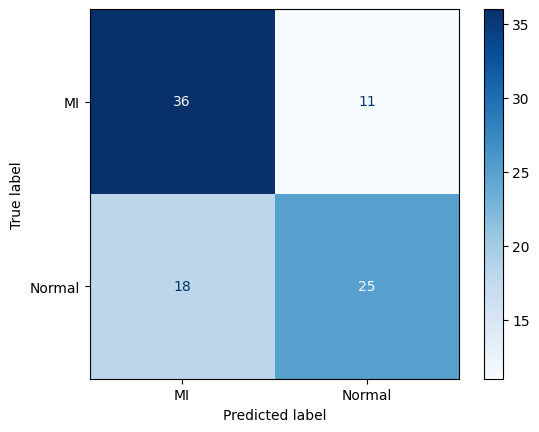

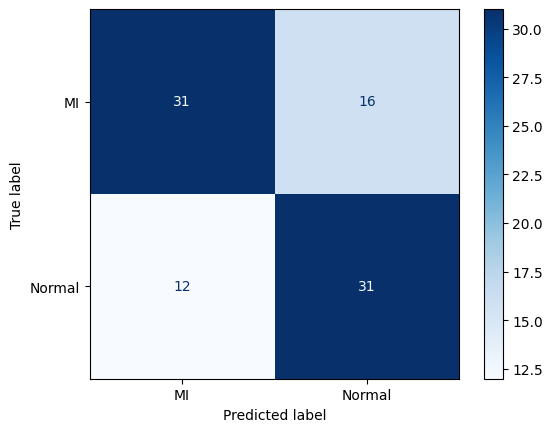

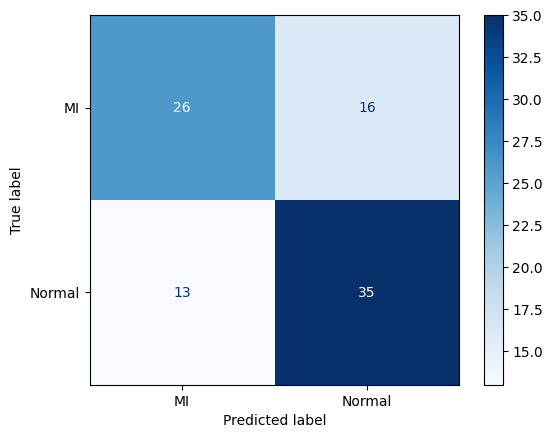

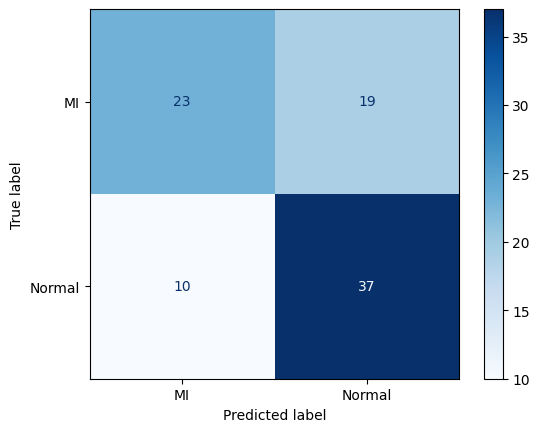

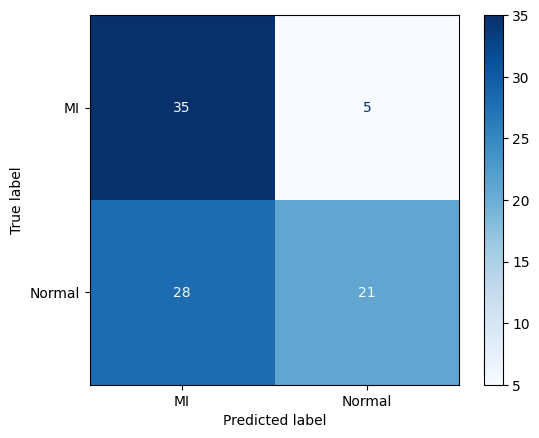

In [71]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs, labels=[0, 1])  # Misalnya label 0 dan 1 untuk 'MI' dan 'Normal'

    # Menampilkan confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['MI', 'Normal'])
    disp.plot(cmap=plt.cm.Blues, values_format='d')


## Temporal Transformer Encoder Decoder

In [72]:
selected_columns = ['Entropy', 'Wavelet Means', 'Wavelet std', 'Wavelet max', 'Wavelet min', 'Med_wavelet', 'Var_wavelet', 'Skew_wavelet', 'Q1_wavelet', 'Q3_wavelet', 'IQR_wavelet', 'MinMax_wavelet', 'Kurt_wavelet', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_temporal = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_temporal.head())

    Entropy  Wavelet Means  Wavelet std  Wavelet max  Wavelet min  \
0  0.063608      -1.137174    -0.430682     0.024031     0.004692   
1  0.064888      -0.388901    -0.565070    -0.549047     0.441349   
2  0.063367       0.180394    -0.112938    -0.376300     0.355416   
3  0.068559       0.408853     1.567008     1.825143    -0.973889   
4  0.062193      -0.404628    -0.506024    -0.423697     0.363664   

   Med_wavelet  Var_wavelet  Skew_wavelet  Q1_wavelet  Q3_wavelet  \
0    -0.889833    -0.218548      1.146071   -0.076698    0.026616   
1    -0.241600    -0.239203     -0.594643    0.178925   -0.172615   
2     1.042363    -0.151908     -0.491310   -0.838081    0.944422   
3     0.205136     0.616326      2.953232   -0.848416    0.973499   
4     0.454240    -0.230679     -0.101673   -0.313961    0.340572   

   IQR_wavelet  MinMax_wavelet  Kurt_wavelet Label  
0     0.051833        0.226780      1.470453    MI  
1    -0.176615       -0.536473     -0.367429    MI  
2     0.895

In [73]:
X = df_temporal.drop('Label', axis=1).values
y = df_temporal['Label'].values

In [74]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [76]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt


# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [77]:
# Definisikan Model dengan Encoder dan Decoder
class TransformerEncoderDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_encoder_layers=3, num_decoder_layers=3, dim_feedforward=128):
        super(TransformerEncoderDecoderModel, self).__init__()

        # Embedding untuk input dan target
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Transformer Encoder
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_encoder_layers
        )

        # Transformer Decoder
        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_decoder_layers
        )

        # Linear layer untuk mengubah output decoder menjadi logits
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, src, tgt):
        # src: input data (e.g., features or sequences)
        # tgt: target sequence (e.g., labels or tokens)

        # Encode the source input
        src = self.embedding(src)
        memory = self.transformer_encoder(src.unsqueeze(1))  # Add sequence dim if needed

        # Decode the target input
        tgt = self.embedding(tgt)
        output = self.transformer_decoder(tgt.unsqueeze(1), memory)  # Pass tgt and memory to decoder

        # Final output layer (logits)
        output = self.fc(output.squeeze(1))  # Squeeze sequence dimension

        return output

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

# Assume you have some input data and target data
# src = torch.randn((32, input_dim))  # batch_size=32, input_dim=128
# tgt = torch.randn((32, input_dim))  # Target tensor of the same dimension

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.7681, Accuracy: 52.23%, Validation Loss: 0.6797, Validation Accuracy: 54.44%
Epoch 2/50, Loss: 0.7128, Accuracy: 49.44%, Validation Loss: 0.7029, Validation Accuracy: 52.22%
Epoch 3/50, Loss: 0.7011, Accuracy: 50.84%, Validation Loss: 0.5956, Validation Accuracy: 62.22%
Epoch 4/50, Loss: 0.7172, Accuracy: 53.63%, Validation Loss: 0.7009, Validation Accuracy: 52.22%
Epoch 5/50, Loss: 0.7022, Accuracy: 51.12%, Validation Loss: 0.7546, Validation Accuracy: 47.78%
Epoch 6/50, Loss: 0.7214, Accuracy: 51.12%, Validation Loss: 0.6931, Validation Accuracy: 52.22%
Epoch 7/50, Loss: 0.7283, Accuracy: 48.60%, Validation Loss: 0.7127, Validation Accuracy: 52.22%
Epoch 8/50, Loss: 0.7018, Accuracy: 51.96%, Validation Loss: 0.6934, Validation Accuracy: 52.22%
Epoch 9/50, Loss: 0.6980, Accuracy: 47.77%, Validation Loss: 0.6948, Validation Accuracy: 45.56%
Epoch 10/50, Loss: 0.6999, Accuracy: 48.60%, Validation Loss: 0.7200, Validation Accuracy: 47.78%
Epoch 11/50, Loss: 0.7039, Ac

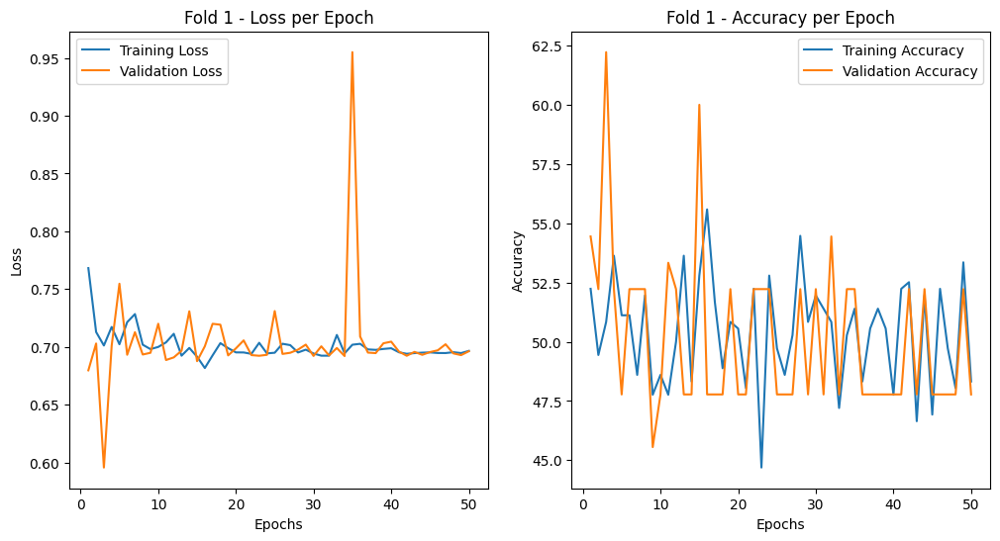

Fold 2
Epoch 1/50, Loss: 0.8019, Accuracy: 46.65%, Validation Loss: 0.7289, Validation Accuracy: 47.78%
Epoch 2/50, Loss: 0.7158, Accuracy: 53.35%, Validation Loss: 0.7058, Validation Accuracy: 47.78%
Epoch 3/50, Loss: 0.7073, Accuracy: 51.68%, Validation Loss: 0.6998, Validation Accuracy: 47.78%
Epoch 4/50, Loss: 0.7030, Accuracy: 43.85%, Validation Loss: 0.7025, Validation Accuracy: 47.78%
Epoch 5/50, Loss: 0.7148, Accuracy: 44.41%, Validation Loss: 0.7386, Validation Accuracy: 47.78%
Epoch 6/50, Loss: 0.7040, Accuracy: 50.00%, Validation Loss: 0.6895, Validation Accuracy: 52.22%
Epoch 7/50, Loss: 0.7013, Accuracy: 48.88%, Validation Loss: 0.7391, Validation Accuracy: 47.78%
Epoch 8/50, Loss: 0.7215, Accuracy: 48.60%, Validation Loss: 0.6987, Validation Accuracy: 52.22%
Epoch 9/50, Loss: 0.7192, Accuracy: 47.77%, Validation Loss: 0.6934, Validation Accuracy: 47.78%
Epoch 10/50, Loss: 0.7007, Accuracy: 48.88%, Validation Loss: 0.6914, Validation Accuracy: 52.22%
Epoch 11/50, Loss: 0.6

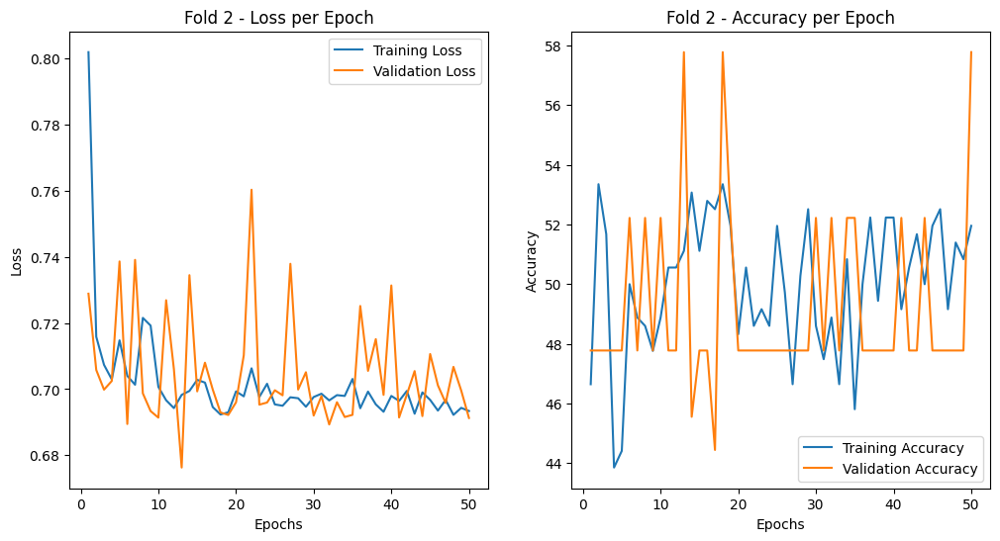

Fold 3
Epoch 1/50, Loss: 0.7684, Accuracy: 44.69%, Validation Loss: 0.6967, Validation Accuracy: 47.78%
Epoch 2/50, Loss: 0.7048, Accuracy: 50.28%, Validation Loss: 0.7066, Validation Accuracy: 46.67%
Epoch 3/50, Loss: 0.7025, Accuracy: 51.68%, Validation Loss: 0.6968, Validation Accuracy: 54.44%
Epoch 4/50, Loss: 0.6914, Accuracy: 55.59%, Validation Loss: 0.7133, Validation Accuracy: 46.67%
Epoch 5/50, Loss: 0.7128, Accuracy: 44.69%, Validation Loss: 0.7026, Validation Accuracy: 53.33%
Epoch 6/50, Loss: 0.7017, Accuracy: 48.88%, Validation Loss: 0.7017, Validation Accuracy: 46.67%
Epoch 7/50, Loss: 0.7065, Accuracy: 51.12%, Validation Loss: 0.6926, Validation Accuracy: 51.11%
Epoch 8/50, Loss: 0.6979, Accuracy: 47.21%, Validation Loss: 0.7012, Validation Accuracy: 53.33%
Epoch 9/50, Loss: 0.6980, Accuracy: 52.23%, Validation Loss: 0.6928, Validation Accuracy: 53.33%
Epoch 10/50, Loss: 0.7025, Accuracy: 46.93%, Validation Loss: 0.6981, Validation Accuracy: 46.67%
Epoch 11/50, Loss: 0.7

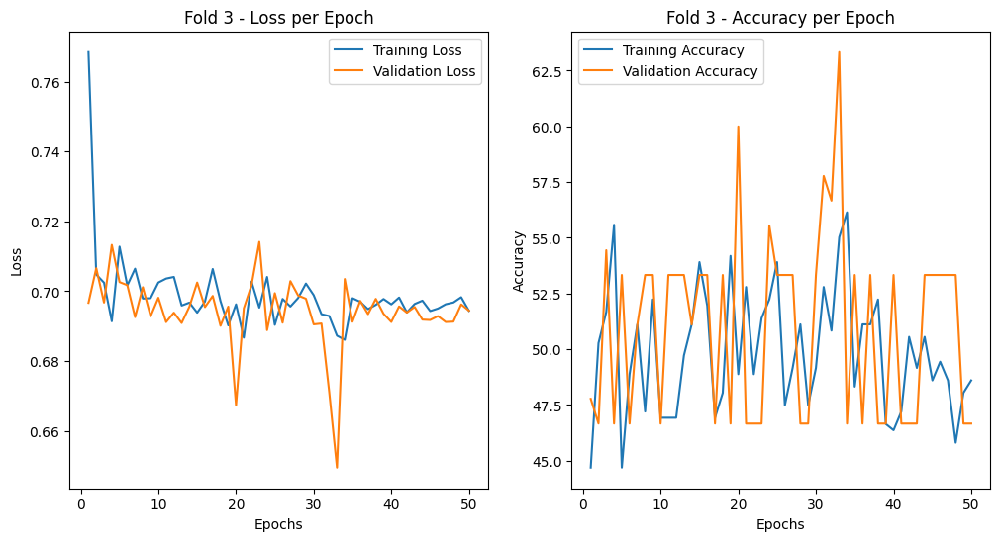

Fold 4
Epoch 1/50, Loss: 0.7710, Accuracy: 47.91%, Validation Loss: 0.7514, Validation Accuracy: 52.81%
Epoch 2/50, Loss: 0.7074, Accuracy: 50.42%, Validation Loss: 0.6953, Validation Accuracy: 47.19%
Epoch 3/50, Loss: 0.6876, Accuracy: 52.92%, Validation Loss: 0.7151, Validation Accuracy: 49.44%
Epoch 4/50, Loss: 0.6761, Accuracy: 59.89%, Validation Loss: 0.6882, Validation Accuracy: 48.31%
Epoch 5/50, Loss: 0.6854, Accuracy: 54.04%, Validation Loss: 0.6989, Validation Accuracy: 52.81%
Epoch 6/50, Loss: 0.6908, Accuracy: 52.37%, Validation Loss: 0.6986, Validation Accuracy: 50.56%
Epoch 7/50, Loss: 0.6874, Accuracy: 54.60%, Validation Loss: 0.6949, Validation Accuracy: 53.93%
Epoch 8/50, Loss: 0.6272, Accuracy: 61.84%, Validation Loss: 0.6564, Validation Accuracy: 58.43%
Epoch 9/50, Loss: 0.6470, Accuracy: 62.67%, Validation Loss: 0.6664, Validation Accuracy: 57.30%
Epoch 10/50, Loss: 0.6204, Accuracy: 64.90%, Validation Loss: 0.6959, Validation Accuracy: 51.69%
Epoch 11/50, Loss: 0.6

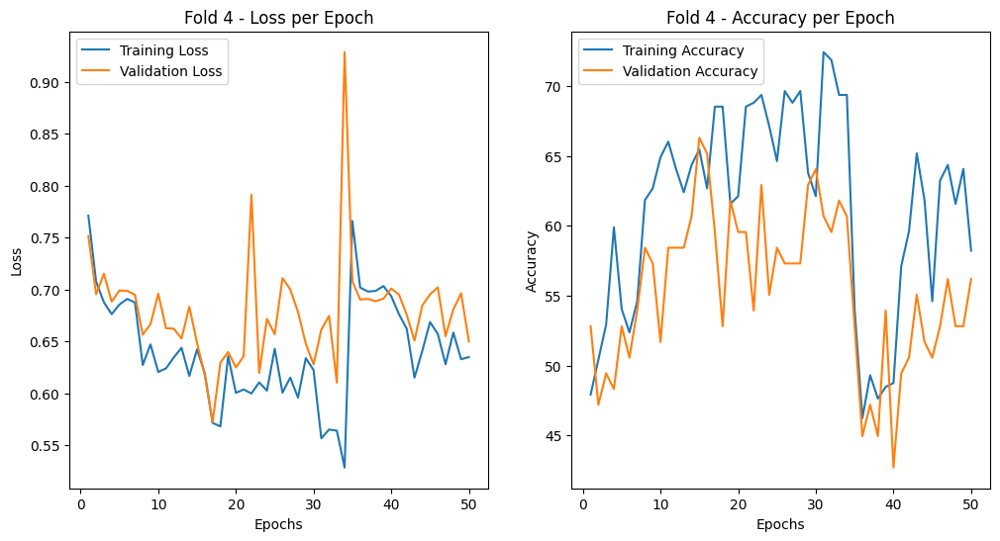

Fold 5
Epoch 1/50, Loss: 0.7526, Accuracy: 52.92%, Validation Loss: 0.7014, Validation Accuracy: 44.94%
Epoch 2/50, Loss: 0.6988, Accuracy: 51.81%, Validation Loss: 0.6885, Validation Accuracy: 47.19%
Epoch 3/50, Loss: 0.7077, Accuracy: 51.25%, Validation Loss: 0.6930, Validation Accuracy: 44.94%
Epoch 4/50, Loss: 0.6981, Accuracy: 54.04%, Validation Loss: 0.6755, Validation Accuracy: 61.80%
Epoch 5/50, Loss: 0.6773, Accuracy: 59.05%, Validation Loss: 0.7400, Validation Accuracy: 48.31%
Epoch 6/50, Loss: 0.6873, Accuracy: 57.94%, Validation Loss: 0.6892, Validation Accuracy: 59.55%
Epoch 7/50, Loss: 0.6996, Accuracy: 51.81%, Validation Loss: 0.6700, Validation Accuracy: 62.92%
Epoch 8/50, Loss: 0.6913, Accuracy: 55.15%, Validation Loss: 0.6746, Validation Accuracy: 57.30%
Epoch 9/50, Loss: 0.6698, Accuracy: 60.45%, Validation Loss: 0.7234, Validation Accuracy: 55.06%
Epoch 10/50, Loss: 0.6715, Accuracy: 58.77%, Validation Loss: 0.6793, Validation Accuracy: 55.06%
Epoch 11/50, Loss: 0.7

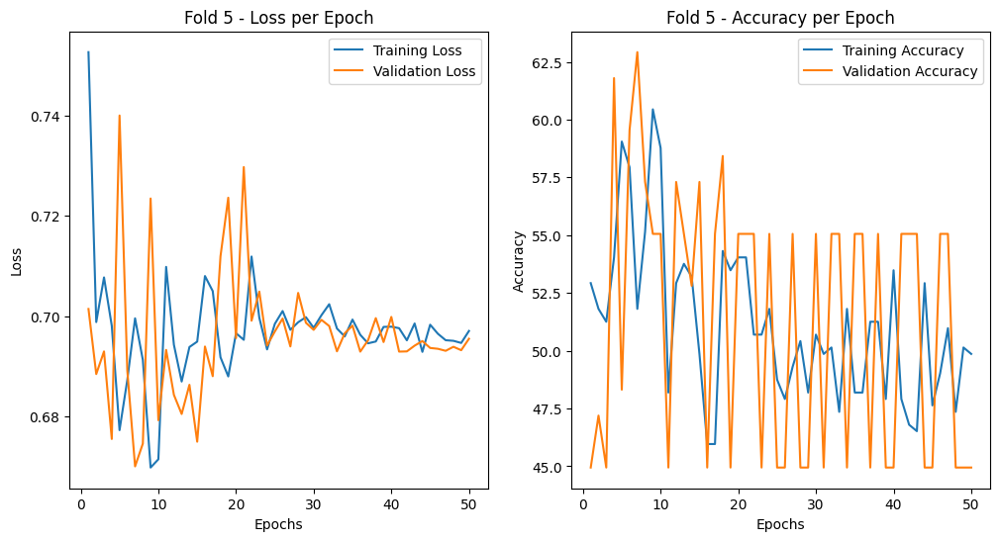

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.6965 - Train Accuracy: 48.32%
           - Validation Loss: 0.6962 - Validation Accuracy: 47.78%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.6934 - Train Accuracy: 51.96%
           - Validation Loss: 0.6913 - Validation Accuracy: 57.78%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.6944 - Train Accuracy: 48.60%
           - Validation Loss: 0.6944 - Validation Accuracy: 46.67%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.6348 - Train Accuracy: 58.22%
           - Validation Loss: 0.6499 - Validation Accuracy: 56.18%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.6970 - Train Accuracy: 49.86%
    

In [78]:
# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('temporal_transformer_encoder_decoder', exist_ok=True)

# Data Dummy (untuk mengganti dengan data asli)
# input_dim = 128  # Misal jumlah fitur
# num_classes = 10  # Misal jumlah kelas
input_dim = X_train.shape[1]
num_classes = len(set(y_train))
# X_train_tensor = torch.randn(500, input_dim)  # 500 sampel training
# y_train_tensor = torch.randint(0, num_classes, (500,))  # 500 label training

# Loop KFold
for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    # DataLoader
    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerEncoderDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
            outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [79]:
from sklearn.metrics import classification_report
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan classification report untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}:')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\1203024899.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Classification Report for Fold 1:
              precision    recall  f1-score   support

          MI       0.00      0.00      0.00        47
      Normal       0.48      1.00      0.65        43

    accuracy                           0.48        90
   macro avg       0.24      0.50      0.32        90
weighted avg       0.23      0.48      0.31        90

--------------------------------------------------------------------------------
Classification Report for Fold 2:
              precision    recall  f1-score   support

          MI       0.59      0.72      0.65        47
      Normal       0.59      0.44      0.51        43

    accuracy                           0.59        90
   macro avg       0.59      0.58      0.58        90
weighted avg       0.59      0.59      0.58        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor i

Classification Report for Fold 3:
              precision    recall  f1-score   support

          MI       0.47      1.00      0.64        42
      Normal       0.00      0.00      0.00        48

    accuracy                           0.47        90
   macro avg       0.23      0.50      0.32        90
weighted avg       0.22      0.47      0.30        90

--------------------------------------------------------------------------------
Classification Report for Fold 4:
              precision    recall  f1-score   support

          MI       0.50      0.93      0.65        42
      Normal       0.73      0.17      0.28        47

    accuracy                           0.53        89
   macro avg       0.61      0.55      0.46        89
weighted avg       0.62      0.53      0.45        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

Classification Report for Fold 5:
              precision    recall  f1-score   support

          MI       0.45      1.00      0.62        40
      Normal       0.00      0.00      0.00        49

    accuracy                           0.45        89
   macro avg       0.22      0.50      0.31        89
weighted avg       0.20      0.45      0.28        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

In [80]:
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix
import torch
from torch.utils.data import DataLoader, TensorDataset

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Loop untuk menampilkan metrik untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)  # Forward pass
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\255030113.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Metrics for Fold 1:
Accuracy: 0.4778
Precision: 0.2389
F1-Score: 0.3233
Sensitivity (Recall for MI): 1.0000
Specificity (True Negative Rate): 0.0000
--------------------------------------------------------------------------------
Metrics for Fold 2:
Accuracy: 0.5889
Precision: 0.5900
F1-Score: 0.5771
Sensitivity (Recall for MI): 0.4419
Specificity (True Negative Rate): 0.7234
--------------------------------------------------------------------------------
Metrics for Fold 3:
Accuracy: 0.4667
Precision: 0.2333
F1-Score: 0.3182
Sensitivity (Recall for MI): 0.0000
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 4:
Accuracy: 0.5281
Precision: 0.6136
F1-Score: 0.4629
Sensitivity (Recall for MI): 0.1702
Specificity (True Negative Rate): 0.9286
--------------------------------------------------------------------------------
Metrics for Fold 5:
Accuracy: 0.4494
Precision: 0.2247
F1-Score: 0.3101
Sensitiv

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\255030113.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\2422927058.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

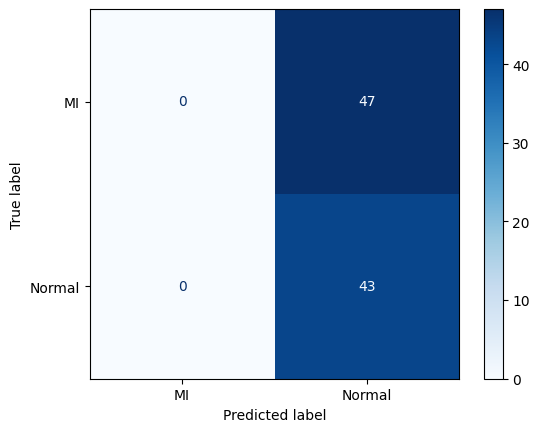

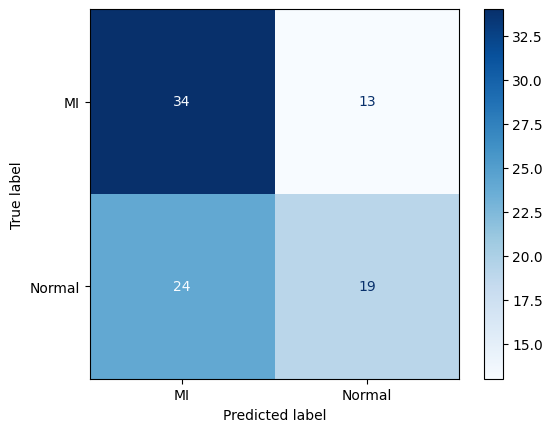

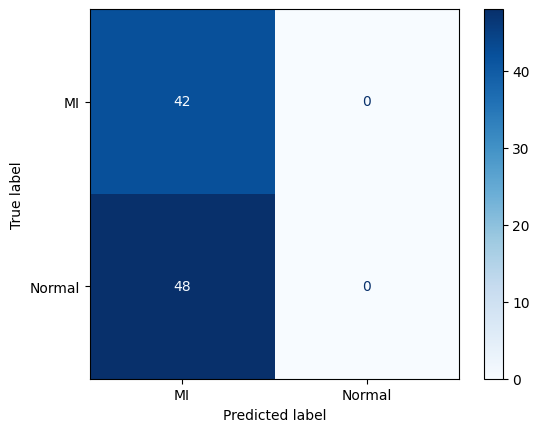

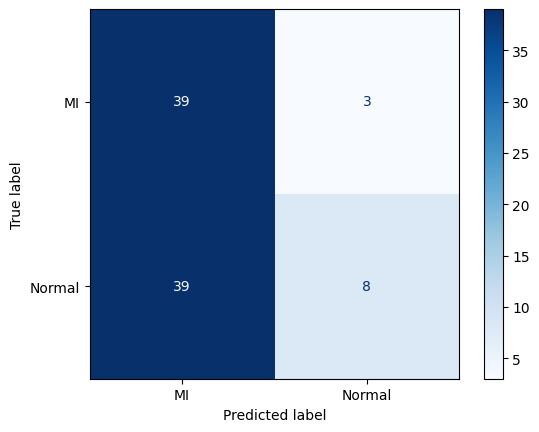

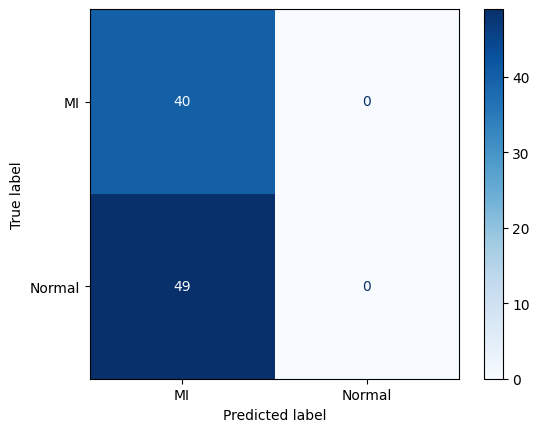

In [81]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs, labels=[0, 1])  # Misalnya label 0 dan 1 untuk 'MI' dan 'Normal'

    # Menampilkan confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['MI', 'Normal'])
    disp.plot(cmap=plt.cm.Blues, values_format='d')


## Multi Scale Transformer Encoder Decoder

In [82]:
X = df_combine_scaled.drop('Label', axis=1).values
y = df_combine_scaled['Label'].values

In [83]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [84]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [85]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

In [86]:
# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [87]:
# Definisikan Model dengan Encoder dan Decoder
class TransformerEncoderDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_encoder_layers=3, num_decoder_layers=3, dim_feedforward=128):
        super(TransformerEncoderDecoderModel, self).__init__()

        # Embedding untuk input dan target
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Transformer Encoder
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_encoder_layers
        )

        # Transformer Decoder
        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_decoder_layers
        )

        # Linear layer untuk mengubah output decoder menjadi logits
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, src, tgt):
        # src: input data (e.g., features or sequences)
        # tgt: target sequence (e.g., labels or tokens)

        # Encode the source input
        src = self.embedding(src)
        memory = self.transformer_encoder(src.unsqueeze(1))  # Add sequence dim if needed

        # Decode the target input
        tgt = self.embedding(tgt)
        output = self.transformer_decoder(tgt.unsqueeze(1), memory)  # Pass tgt and memory to decoder

        # Final output layer (logits)
        output = self.fc(output.squeeze(1))  # Squeeze sequence dimension

        return output

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

# Assume you have some input data and target data
# src = torch.randn((32, input_dim))  # batch_size=32, input_dim=128
# tgt = torch.randn((32, input_dim))  # Target tensor of the same dimension

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/50, Loss: 0.7578, Accuracy: 61.17%, Validation Loss: 0.7000, Validation Accuracy: 54.44%
Epoch 2/50, Loss: 0.6454, Accuracy: 63.13%, Validation Loss: 0.6054, Validation Accuracy: 63.33%
Epoch 3/50, Loss: 0.5920, Accuracy: 65.36%, Validation Loss: 0.5733, Validation Accuracy: 66.67%
Epoch 4/50, Loss: 0.5181, Accuracy: 71.79%, Validation Loss: 0.5655, Validation Accuracy: 73.33%
Epoch 5/50, Loss: 0.5165, Accuracy: 75.14%, Validation Loss: 0.6539, Validation Accuracy: 57.78%
Epoch 6/50, Loss: 0.4834, Accuracy: 74.58%, Validation Loss: 0.4396, Validation Accuracy: 75.56%
Epoch 7/50, Loss: 0.4753, Accuracy: 79.05%, Validation Loss: 0.4525, Validation Accuracy: 83.33%
Epoch 8/50, Loss: 0.3573, Accuracy: 85.75%, Validation Loss: 0.3854, Validation Accuracy: 85.56%
Epoch 9/50, Loss: 0.3541, Accuracy: 84.64%, Validation Loss: 0.4598, Validation Accuracy: 77.78%
Epoch 10/50, Loss: 0.3476, Accuracy: 86.87%, Validation Loss: 0.3510, Validation Accuracy: 82.22%
Epoch 11/50, Loss: 0.3261, Ac

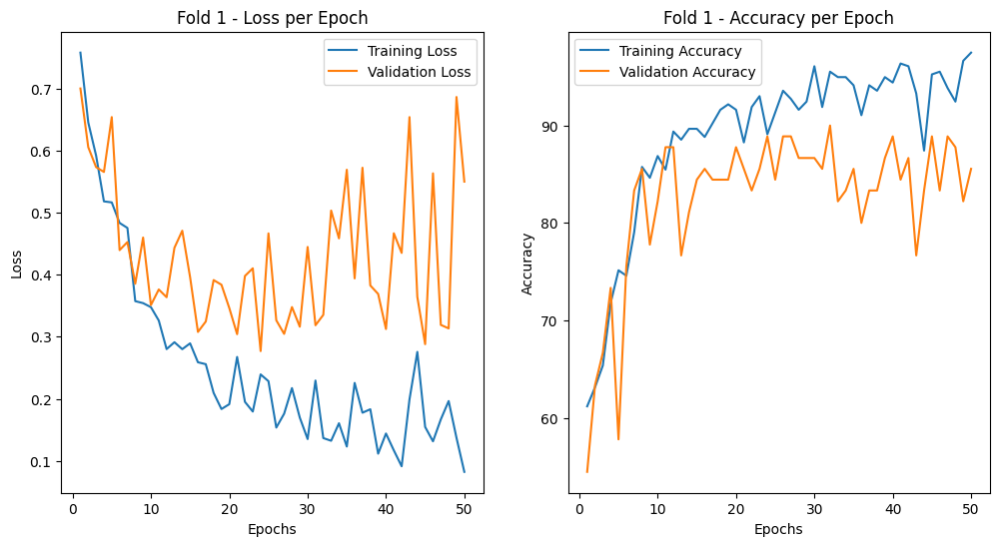

Fold 2
Epoch 1/50, Loss: 0.6974, Accuracy: 61.73%, Validation Loss: 0.6209, Validation Accuracy: 66.67%
Epoch 2/50, Loss: 0.6190, Accuracy: 63.97%, Validation Loss: 0.5511, Validation Accuracy: 72.22%
Epoch 3/50, Loss: 0.5575, Accuracy: 70.39%, Validation Loss: 0.6403, Validation Accuracy: 57.78%
Epoch 4/50, Loss: 0.5303, Accuracy: 71.51%, Validation Loss: 0.5490, Validation Accuracy: 73.33%
Epoch 5/50, Loss: 0.5242, Accuracy: 75.14%, Validation Loss: 0.5185, Validation Accuracy: 76.67%
Epoch 6/50, Loss: 0.4091, Accuracy: 81.56%, Validation Loss: 0.6625, Validation Accuracy: 74.44%
Epoch 7/50, Loss: 0.4713, Accuracy: 78.21%, Validation Loss: 0.6516, Validation Accuracy: 64.44%
Epoch 8/50, Loss: 0.4915, Accuracy: 77.37%, Validation Loss: 0.4535, Validation Accuracy: 78.89%
Epoch 9/50, Loss: 0.4714, Accuracy: 78.21%, Validation Loss: 0.4325, Validation Accuracy: 80.00%
Epoch 10/50, Loss: 0.4098, Accuracy: 81.84%, Validation Loss: 0.5094, Validation Accuracy: 74.44%
Epoch 11/50, Loss: 0.3

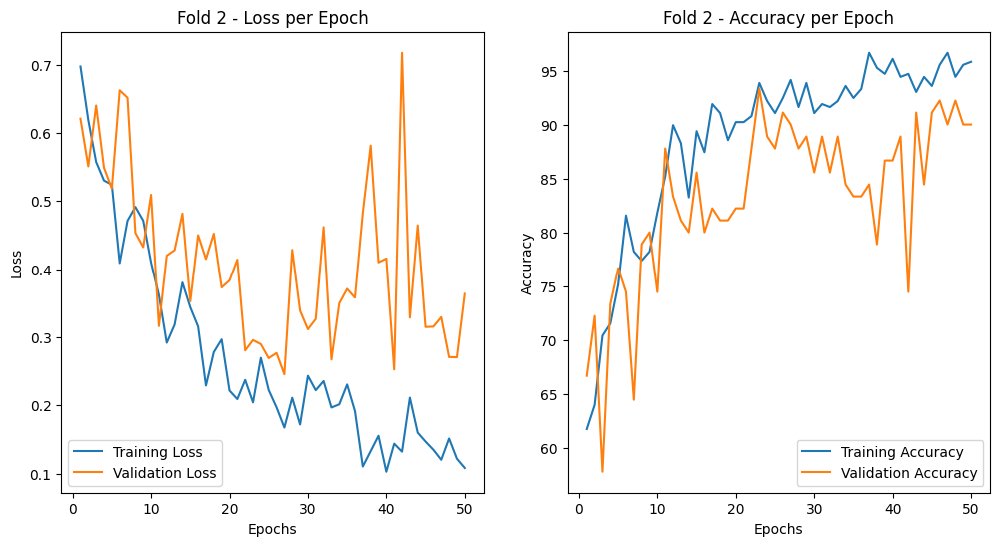

Fold 3
Epoch 1/50, Loss: 0.7832, Accuracy: 55.31%, Validation Loss: 0.7910, Validation Accuracy: 53.33%
Epoch 2/50, Loss: 0.6222, Accuracy: 66.20%, Validation Loss: 0.5888, Validation Accuracy: 63.33%
Epoch 3/50, Loss: 0.5908, Accuracy: 67.60%, Validation Loss: 0.5906, Validation Accuracy: 58.89%
Epoch 4/50, Loss: 0.5310, Accuracy: 74.02%, Validation Loss: 0.5845, Validation Accuracy: 66.67%
Epoch 5/50, Loss: 0.4681, Accuracy: 77.93%, Validation Loss: 0.5623, Validation Accuracy: 72.22%
Epoch 6/50, Loss: 0.4646, Accuracy: 78.21%, Validation Loss: 0.5018, Validation Accuracy: 75.56%
Epoch 7/50, Loss: 0.4542, Accuracy: 79.61%, Validation Loss: 0.4225, Validation Accuracy: 81.11%
Epoch 8/50, Loss: 0.4560, Accuracy: 78.77%, Validation Loss: 0.5442, Validation Accuracy: 73.33%
Epoch 9/50, Loss: 0.3883, Accuracy: 82.96%, Validation Loss: 0.4065, Validation Accuracy: 81.11%
Epoch 10/50, Loss: 0.3324, Accuracy: 86.59%, Validation Loss: 0.4919, Validation Accuracy: 81.11%
Epoch 11/50, Loss: 0.4

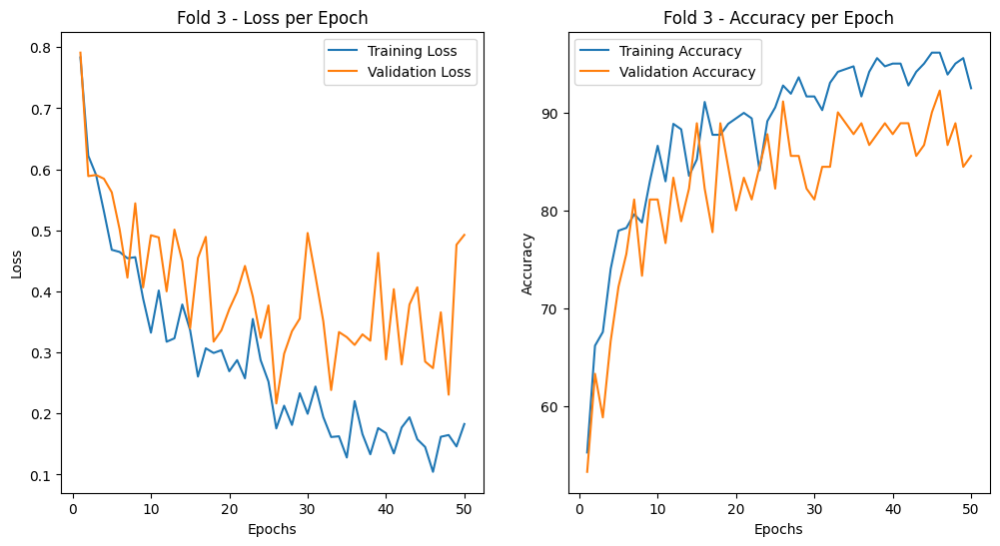

Fold 4
Epoch 1/50, Loss: 0.7583, Accuracy: 56.55%, Validation Loss: 0.6188, Validation Accuracy: 66.29%
Epoch 2/50, Loss: 0.5890, Accuracy: 68.52%, Validation Loss: 0.5603, Validation Accuracy: 69.66%
Epoch 3/50, Loss: 0.5070, Accuracy: 71.59%, Validation Loss: 0.5622, Validation Accuracy: 70.79%
Epoch 4/50, Loss: 0.5386, Accuracy: 72.98%, Validation Loss: 0.6055, Validation Accuracy: 65.17%
Epoch 5/50, Loss: 0.4875, Accuracy: 74.37%, Validation Loss: 0.5940, Validation Accuracy: 64.04%
Epoch 6/50, Loss: 0.4978, Accuracy: 72.98%, Validation Loss: 0.6145, Validation Accuracy: 74.16%
Epoch 7/50, Loss: 0.5081, Accuracy: 71.31%, Validation Loss: 0.5996, Validation Accuracy: 70.79%
Epoch 8/50, Loss: 0.4353, Accuracy: 75.77%, Validation Loss: 0.5315, Validation Accuracy: 75.28%
Epoch 9/50, Loss: 0.4381, Accuracy: 81.89%, Validation Loss: 0.5304, Validation Accuracy: 71.91%
Epoch 10/50, Loss: 0.4343, Accuracy: 81.62%, Validation Loss: 0.5684, Validation Accuracy: 73.03%
Epoch 11/50, Loss: 0.4

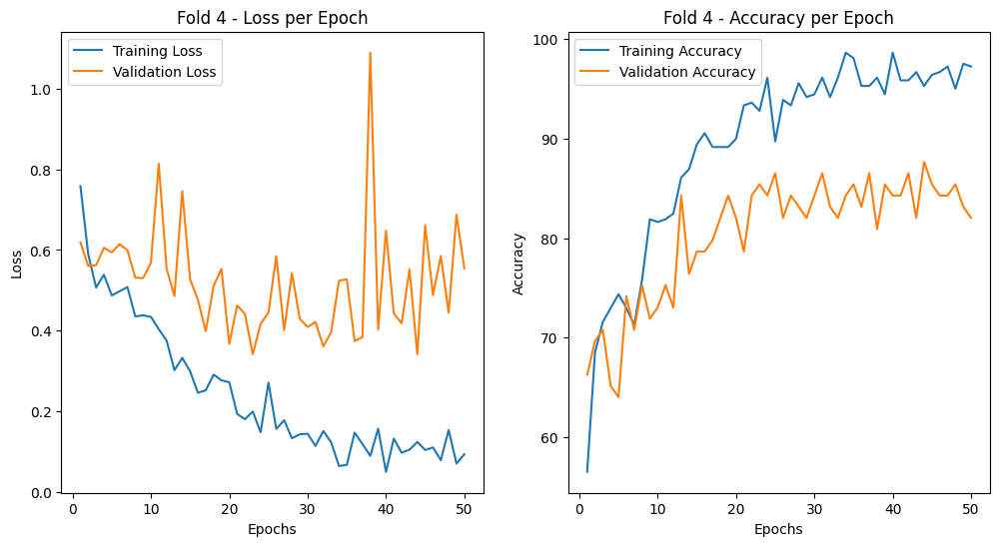

Fold 5
Epoch 1/50, Loss: 0.7790, Accuracy: 58.22%, Validation Loss: 0.7358, Validation Accuracy: 55.06%
Epoch 2/50, Loss: 0.6664, Accuracy: 63.79%, Validation Loss: 0.6596, Validation Accuracy: 57.30%
Epoch 3/50, Loss: 0.6129, Accuracy: 66.30%, Validation Loss: 0.6100, Validation Accuracy: 60.67%
Epoch 4/50, Loss: 0.5667, Accuracy: 71.31%, Validation Loss: 0.5832, Validation Accuracy: 74.16%
Epoch 5/50, Loss: 0.5438, Accuracy: 73.54%, Validation Loss: 0.5179, Validation Accuracy: 71.91%
Epoch 6/50, Loss: 0.4829, Accuracy: 75.49%, Validation Loss: 0.4297, Validation Accuracy: 78.65%
Epoch 7/50, Loss: 0.4805, Accuracy: 75.77%, Validation Loss: 0.4560, Validation Accuracy: 77.53%
Epoch 8/50, Loss: 0.4432, Accuracy: 80.50%, Validation Loss: 0.4572, Validation Accuracy: 80.90%
Epoch 9/50, Loss: 0.3922, Accuracy: 83.84%, Validation Loss: 0.4867, Validation Accuracy: 75.28%
Epoch 10/50, Loss: 0.4611, Accuracy: 78.55%, Validation Loss: 0.4958, Validation Accuracy: 77.53%
Epoch 11/50, Loss: 0.3

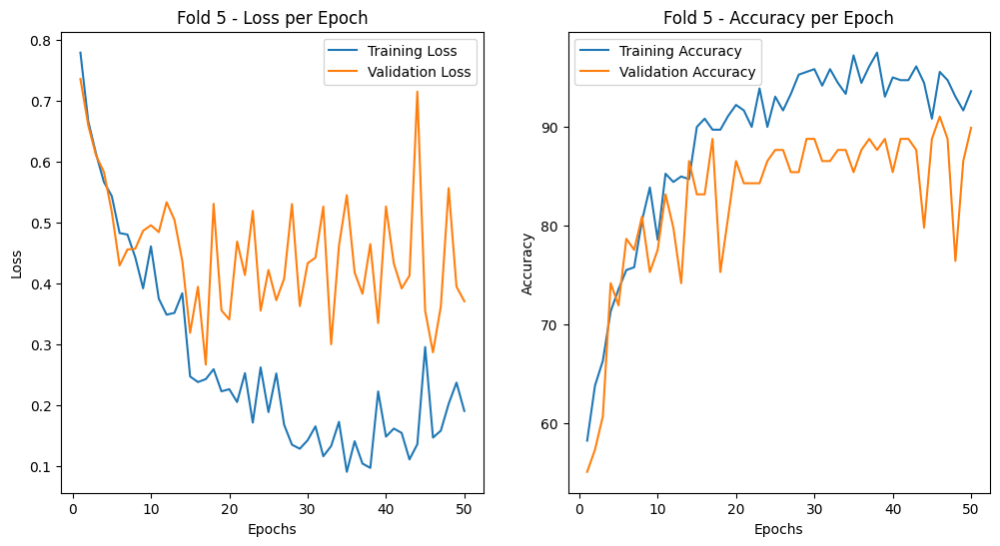

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.0822 - Train Accuracy: 97.49%
           - Validation Loss: 0.5499 - Validation Accuracy: 85.56%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.1084 - Train Accuracy: 95.81%
           - Validation Loss: 0.3638 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.1827 - Train Accuracy: 92.46%
           - Validation Loss: 0.4925 - Validation Accuracy: 85.56%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.0937 - Train Accuracy: 97.21%
           - Validation Loss: 0.5547 - Validation Accuracy: 82.02%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.1910 - Train Accuracy: 93.59%
    

In [88]:
# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('multi_scale_transformer_encoder_decoder', exist_ok=True)

# Data Dummy (untuk mengganti dengan data asli)
# input_dim = 128  # Misal jumlah fitur
# num_classes = 10  # Misal jumlah kelas
input_dim = X_train.shape[1]
num_classes = len(set(y_train))
# X_train_tensor = torch.randn(500, input_dim)  # 500 sampel training
# y_train_tensor = torch.randint(0, num_classes, (500,))  # 500 label training

# Loop KFold
for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    # DataLoader
    train_loader_fold = DataLoader(train_dataset_fold, batch_size=8, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=8, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerEncoderDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
            outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [89]:
from sklearn.metrics import classification_report
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan classification report untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}:')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_34784\832351196.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 1:
              precision    recall  f1-score   support

          MI       0.91      0.85      0.88        47
      Normal       0.85      0.91      0.88        43

    accuracy                           0.88        90
   macro avg       0.88      0.88      0.88        90
weighted avg       0.88      0.88      0.88        90

--------------------------------------------------------------------------------
Classification Report for Fold 2:
              precision    recall  f1-score   support

          MI       0.88      0.91      0.90        47
      Normal       0.90      0.86      0.88        43

    accuracy                           0.89        90
   macro avg       0.89      0.89      0.89        90
weighted avg       0.89      0.89      0.89        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\832351196.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Classification Report for Fold 3:
              precision    recall  f1-score   support

          MI       0.79      1.00      0.88        42
      Normal       1.00      0.77      0.87        48

    accuracy                           0.88        90
   macro avg       0.90      0.89      0.88        90
weighted avg       0.90      0.88      0.88        90

--------------------------------------------------------------------------------
Classification Report for Fold 4:
              precision    recall  f1-score   support

          MI       0.83      0.83      0.83        42
      Normal       0.85      0.85      0.85        47

    accuracy                           0.84        89
   macro avg       0.84      0.84      0.84        89
weighted avg       0.84      0.84      0.84        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\832351196.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Classification Report for Fold 5:
              precision    recall  f1-score   support

          MI       0.89      0.82      0.86        40
      Normal       0.87      0.92      0.89        49

    accuracy                           0.88        89
   macro avg       0.88      0.87      0.87        89
weighted avg       0.88      0.88      0.88        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\832351196.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

In [90]:
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix
import torch
from torch.utils.data import DataLoader, TensorDataset

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Loop untuk menampilkan metrik untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)  # Forward pass
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\829539672.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Metrics for Fold 1:
Accuracy: 0.8778
Precision: 0.8785
F1-Score: 0.8778
Sensitivity (Recall for MI): 0.9070
Specificity (True Negative Rate): 0.8511
--------------------------------------------------------------------------------
Metrics for Fold 2:
Accuracy: 0.8889
Precision: 0.8900
F1-Score: 0.8884
Sensitivity (Recall for MI): 0.8605
Specificity (True Negative Rate): 0.9149
--------------------------------------------------------------------------------
Metrics for Fold 3:
Accuracy: 0.8778
Precision: 0.8962
F1-Score: 0.8774
Sensitivity (Recall for MI): 0.7708
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 4:
Accuracy: 0.8427
Precision: 0.8422
F1-Score: 0.8422
Sensitivity (Recall for MI): 0.8511
Specificity (True Negative Rate): 0.8333
--------------------------------------------------------------------------------
Metrics for Fold 5:
Accuracy: 0.8764
Precision: 0.8786
F1-Score: 0.8741
Sensitiv

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\829539672.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_34784\74907233.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

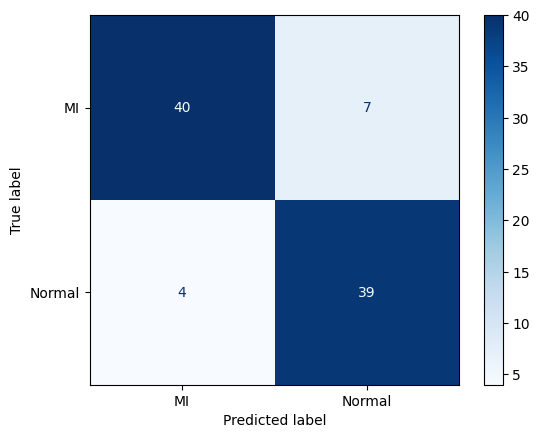

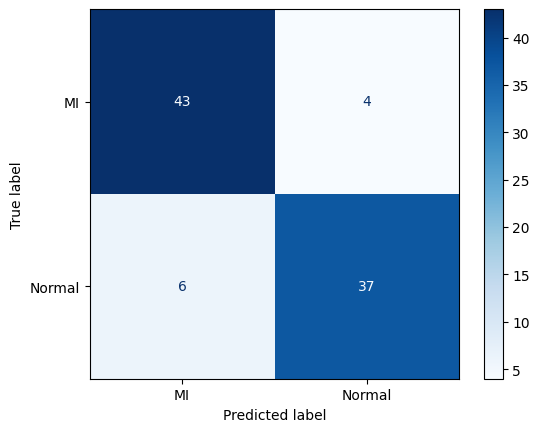

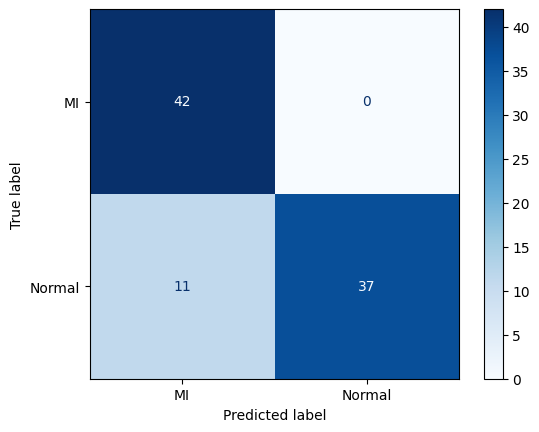

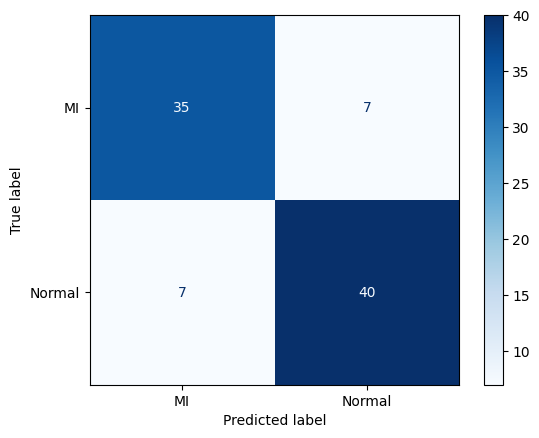

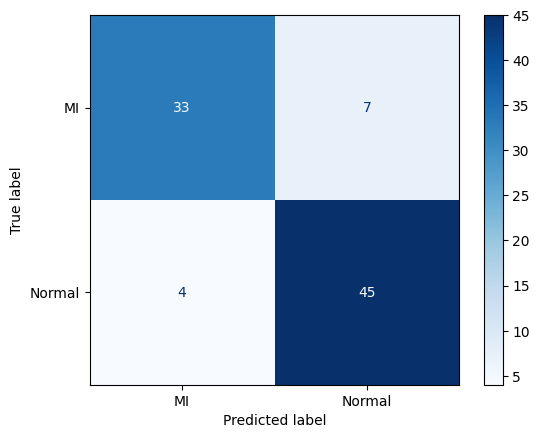

In [91]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs, labels=[0, 1])  # Misalnya label 0 dan 1 untuk 'MI' dan 'Normal'

    # Menampilkan confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['MI', 'Normal'])
    disp.plot(cmap=plt.cm.Blues, values_format='d')


In [ ]:
import shutil
import os

# Direktori tempat model disimpan
source_dir = 'models_transformer_encoder_decoder'
# Direktori unduhan di lokal
download_dir = r'E:\Proyek Riset\download'  # Ganti dengan direktori unduhan Anda

# Membuat direktori unduhan jika belum ada
os.makedirs(download_dir, exist_ok=True)

# Menyalin semua file model ke direktori unduhan
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    model_filename = f'transformer_encoder_decoder_model_fold_{fold_no}.pth'
    source_path = os.path.join(source_dir, model_filename)
    download_path = os.path.join(download_dir, model_filename)

    # Menyalin file model
    shutil.copy(source_path, download_path)
    print(f'Model {model_filename} telah disalin ke {download_dir}')

print('Semua model telah berhasil diunduh.')


Model transformer_encoder_decoder_model_fold_1.pth telah disalin ke E:\Proyek Riset\download
Model transformer_encoder_decoder_model_fold_2.pth telah disalin ke E:\Proyek Riset\download
Model transformer_encoder_decoder_model_fold_3.pth telah disalin ke E:\Proyek Riset\download
Model transformer_encoder_decoder_model_fold_4.pth telah disalin ke E:\Proyek Riset\download
Model transformer_encoder_decoder_model_fold_5.pth telah disalin ke E:\Proyek Riset\download
Semua model telah berhasil diunduh.


In [ ]:
import zipfile
import os

# Direktori tempat model disimpan
source_dir = 'models_transformer_encoder_decoder'

# Path untuk file ZIP
zip_filename = '/content/models.zip'

# Membuat file ZIP
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
        model_filename = f'transformer_encoder_decoder_model_fold_{fold_no}.pth'
        source_path = os.path.join(source_dir, model_filename)
        zipf.write(source_path, model_filename)

print('File ZIP telah dibuat.')


File ZIP telah dibuat.


## (Tuning) Spectral with Transformer Encoder 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
import itertools

# Hyperparameter yang ingin dicoba
param_grid = {
    'batch_size': [8, 16, 32, 64],
    'num_epochs': [10, 20, 50, 100]
}

# Semua kombinasi hyperparameter
param_combinations = list(itertools.product(param_grid['batch_size'], param_grid['num_epochs']))

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Fungsi untuk training model
def train_and_evaluate_model(batch_size, num_epochs):
    fold_no = 1
    val_accuracy_per_fold = []

    for train_index, val_index in kf.split(X_train_tensor):
        print(f'Fold {fold_no}')

        # Membagi data
        X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
        y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

        # Membuat TensorDataset untuk train dan validation fold
        train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
        val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

        train_loader_fold = DataLoader(train_dataset_fold, batch_size=batch_size, shuffle=True)
        val_loader_fold = DataLoader(val_dataset_fold, batch_size=batch_size, shuffle=False)

        # Inisialisasi model dan optimizer
        model = TransformerModel(input_dim, num_classes)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)  # Tetap gunakan lr yang sama

        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for X_batch, y_batch in train_loader_fold:
                optimizer.zero_grad()
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                loss.backward()
                optimizer.step()

        # Evaluasi pada data validasi
        model.eval()
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_accuracy_per_fold.append(val_accuracy)
        fold_no += 1

    # Rata-rata akurasi validasi
    avg_val_accuracy = sum(val_accuracy_per_fold) / len(val_accuracy_per_fold)
    return avg_val_accuracy

# Melakukan Grid Search
best_accuracy = 0
best_params = None

for (batch_size, num_epochs) in param_combinations:
    print(f'Trying hyperparameters: batch_size={batch_size}, num_epochs={num_epochs}')
    val_accuracy = train_and_evaluate_model(batch_size, num_epochs)
    print(f'Validation Accuracy: {val_accuracy:.2f}%')

    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = (batch_size, num_epochs)

print('Best Hyperparameters:')
print(f'Batch Size: {best_params[0]}, Epochs: {best_params[1]}')
print(f'Best Validation Accuracy: {best_accuracy:.2f}%')


Trying hyperparameters: batch_size=8, num_epochs=10
Fold 1


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 86.39%
Trying hyperparameters: batch_size=8, num_epochs=20
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 89.06%
Trying hyperparameters: batch_size=8, num_epochs=50
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 86.84%
Trying hyperparameters: batch_size=8, num_epochs=100
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 89.94%
Trying hyperparameters: batch_size=16, num_epochs=10
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 87.50%
Trying hyperparameters: batch_size=16, num_epochs=20
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 89.50%
Trying hyperparameters: batch_size=16, num_epochs=50
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 88.16%
Trying hyperparameters: batch_size=16, num_epochs=100
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 90.83%
Trying hyperparameters: batch_size=32, num_epochs=10
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 87.26%
Trying hyperparam

In [7]:
selected_columns = ['MFCC Means', 'MFCC std', 'MFCC max', 'MFCC min', 'Med_mfcc', 'Var_mfcc', 'Skew_mfcc', 'Q1_mfcc', 'Q3_mfcc', 'IQR_mfcc', 'MinMax_mfcc', 'Kurt_mfcc', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_spectral = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_spectral.head())

   MFCC Means  MFCC std  MFCC max  MFCC min  Med_mfcc  Var_mfcc  Skew_mfcc  \
0    0.805298 -0.893321  0.727190  0.942132 -0.598371 -0.921706  -0.321473   
1   -0.228878  0.601932 -2.114222 -0.483793  1.257240  0.594724  -0.971689   
2    0.629472 -0.027778 -0.754010  0.036559  2.398342 -0.062456  -0.766293   
3    1.530227 -1.566485  1.255310  1.583813 -0.171921 -1.554723  -0.653024   
4   -0.680597  0.530428 -0.464613 -0.596863  0.842127  0.518742  -0.035472   

    Q1_mfcc   Q3_mfcc  IQR_mfcc  MinMax_mfcc  Kurt_mfcc Label  
0  0.734321 -0.816269 -1.060130    -0.538695   0.334547    MI  
1  0.669311  0.773221  0.321963    -0.347450   0.964492    MI  
2  0.749218  1.135122  0.589301    -0.301331   0.758335    MI  
3  0.715255 -0.219460 -0.543864    -0.893826   0.690955    MI  
4 -0.499815  0.770667  0.904191     0.339870   0.007908    MI  


In [8]:
X = df_spectral.drop('Label', axis=1).values
y = df_spectral['Label'].values

In [9]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class TransformerModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerModel, self).__init__()
        self.embedding = nn.Linear(input_dim, dim_feedforward)
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(0)  # Transformer expects a sequence, so add a sequence dimension
        x = self.transformer_encoder(x)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/100, Loss: 0.6130, Accuracy: 65.08%, Validation Loss: 0.5395, Validation Accuracy: 75.56%
Epoch 2/100, Loss: 0.5510, Accuracy: 71.51%, Validation Loss: 0.6492, Validation Accuracy: 63.33%
Epoch 3/100, Loss: 0.5741, Accuracy: 66.20%, Validation Loss: 0.5372, Validation Accuracy: 73.33%
Epoch 4/100, Loss: 0.5473, Accuracy: 71.79%, Validation Loss: 0.5288, Validation Accuracy: 77.78%
Epoch 5/100, Loss: 0.5557, Accuracy: 71.79%, Validation Loss: 0.4956, Validation Accuracy: 77.78%
Epoch 6/100, Loss: 0.5467, Accuracy: 71.23%, Validation Loss: 0.5554, Validation Accuracy: 73.33%
Epoch 7/100, Loss: 0.4700, Accuracy: 73.74%, Validation Loss: 0.4907, Validation Accuracy: 77.78%
Epoch 8/100, Loss: 0.4672, Accuracy: 76.26%, Validation Loss: 0.5456, Validation Accuracy: 76.67%
Epoch 9/100, Loss: 0.4560, Accuracy: 76.26%, Validation Loss: 0.5179, Validation Accuracy: 74.44%
Epoch 10/100, Loss: 0.5415, Accuracy: 70.11%, Validation Loss: 0.5736, Validation Accuracy: 70.00%
Epoch 11/100, Loss:

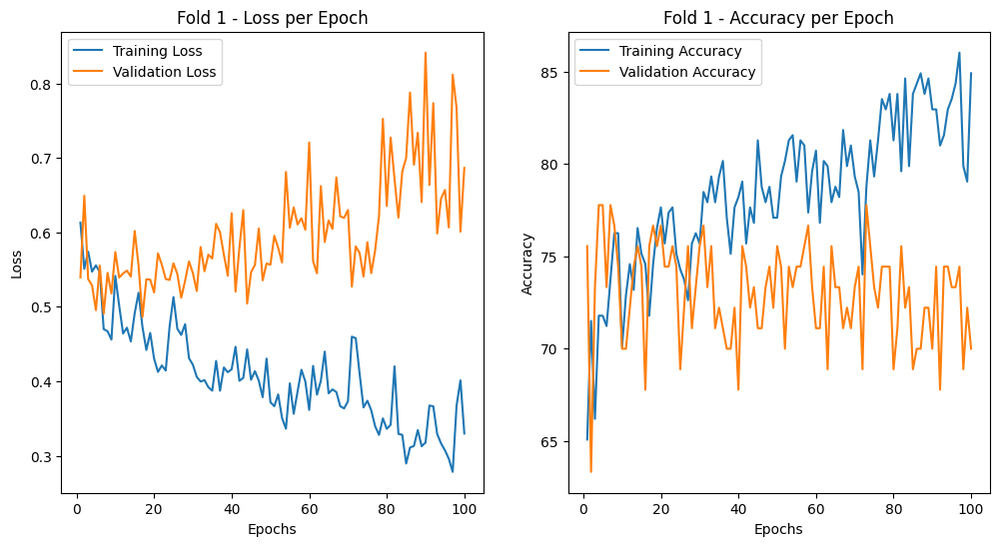

Fold 2


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/100, Loss: 0.6861, Accuracy: 64.80%, Validation Loss: 0.5713, Validation Accuracy: 70.00%
Epoch 2/100, Loss: 0.6154, Accuracy: 64.25%, Validation Loss: 0.5609, Validation Accuracy: 70.00%
Epoch 3/100, Loss: 0.5625, Accuracy: 68.16%, Validation Loss: 0.5583, Validation Accuracy: 73.33%
Epoch 4/100, Loss: 0.5510, Accuracy: 71.79%, Validation Loss: 0.5583, Validation Accuracy: 72.22%
Epoch 5/100, Loss: 0.5239, Accuracy: 74.30%, Validation Loss: 0.5239, Validation Accuracy: 70.00%
Epoch 6/100, Loss: 0.5550, Accuracy: 68.44%, Validation Loss: 0.5923, Validation Accuracy: 68.89%
Epoch 7/100, Loss: 0.5421, Accuracy: 71.51%, Validation Loss: 0.5232, Validation Accuracy: 75.56%
Epoch 8/100, Loss: 0.5086, Accuracy: 72.07%, Validation Loss: 0.5588, Validation Accuracy: 68.89%
Epoch 9/100, Loss: 0.5044, Accuracy: 74.02%, Validation Loss: 0.5239, Validation Accuracy: 71.11%
Epoch 10/100, Loss: 0.5104, Accuracy: 72.63%, Validation Loss: 0.4792, Validation Accuracy: 81.11%
Epoch 11/100, Loss:

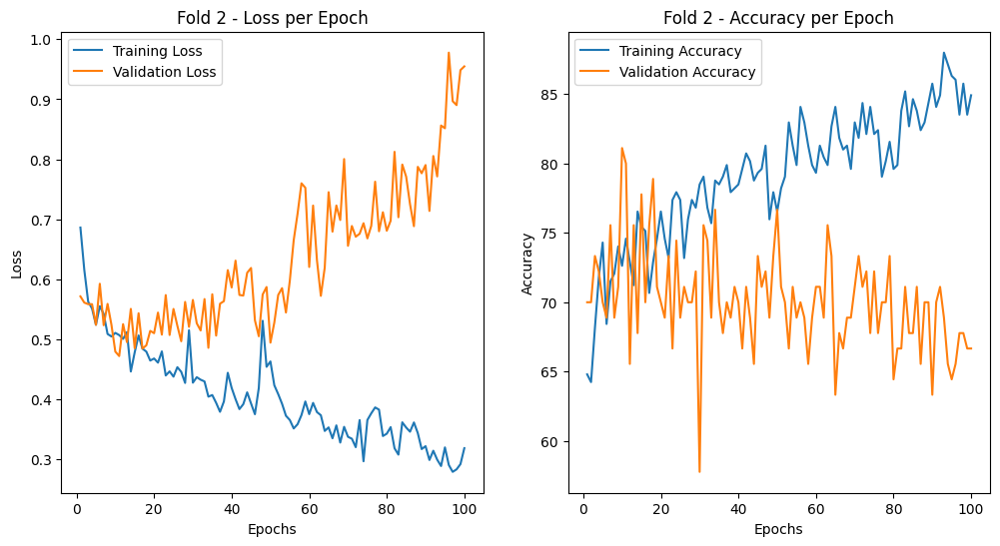

Fold 3
Epoch 1/100, Loss: 0.6119, Accuracy: 64.53%, Validation Loss: 0.6240, Validation Accuracy: 66.67%
Epoch 2/100, Loss: 0.5226, Accuracy: 72.35%, Validation Loss: 0.6219, Validation Accuracy: 64.44%
Epoch 3/100, Loss: 0.5130, Accuracy: 73.74%, Validation Loss: 0.5995, Validation Accuracy: 65.56%
Epoch 4/100, Loss: 0.5016, Accuracy: 74.58%, Validation Loss: 0.6490, Validation Accuracy: 68.89%
Epoch 5/100, Loss: 0.5050, Accuracy: 78.21%, Validation Loss: 0.6059, Validation Accuracy: 65.56%
Epoch 6/100, Loss: 0.4891, Accuracy: 75.70%, Validation Loss: 0.6229, Validation Accuracy: 66.67%
Epoch 7/100, Loss: 0.4714, Accuracy: 77.65%, Validation Loss: 0.6197, Validation Accuracy: 67.78%
Epoch 8/100, Loss: 0.4957, Accuracy: 75.42%, Validation Loss: 0.6261, Validation Accuracy: 68.89%
Epoch 9/100, Loss: 0.4725, Accuracy: 74.02%, Validation Loss: 0.6654, Validation Accuracy: 70.00%
Epoch 10/100, Loss: 0.4905, Accuracy: 75.70%, Validation Loss: 0.6613, Validation Accuracy: 64.44%
Epoch 11/100

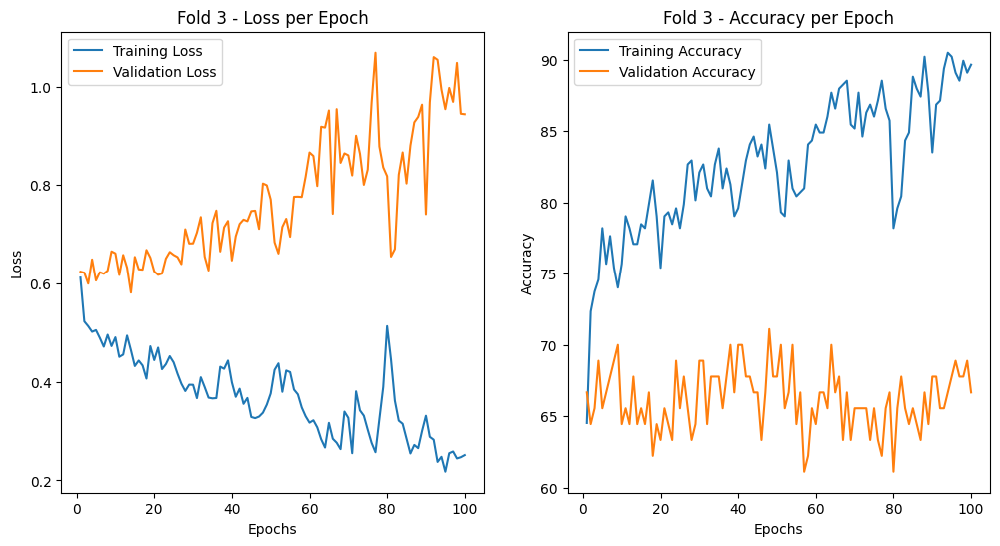

Fold 4
Epoch 1/100, Loss: 0.6544, Accuracy: 61.00%, Validation Loss: 0.5741, Validation Accuracy: 64.04%
Epoch 2/100, Loss: 0.5654, Accuracy: 66.02%, Validation Loss: 0.5436, Validation Accuracy: 71.91%
Epoch 3/100, Loss: 0.5336, Accuracy: 69.92%, Validation Loss: 0.5661, Validation Accuracy: 69.66%
Epoch 4/100, Loss: 0.5341, Accuracy: 72.98%, Validation Loss: 0.5683, Validation Accuracy: 74.16%
Epoch 5/100, Loss: 0.4839, Accuracy: 72.70%, Validation Loss: 0.5550, Validation Accuracy: 69.66%
Epoch 6/100, Loss: 0.4961, Accuracy: 76.32%, Validation Loss: 0.5532, Validation Accuracy: 66.29%
Epoch 7/100, Loss: 0.4679, Accuracy: 76.88%, Validation Loss: 0.5475, Validation Accuracy: 73.03%
Epoch 8/100, Loss: 0.5044, Accuracy: 73.26%, Validation Loss: 0.6548, Validation Accuracy: 60.67%
Epoch 9/100, Loss: 0.5035, Accuracy: 71.87%, Validation Loss: 0.5211, Validation Accuracy: 73.03%
Epoch 10/100, Loss: 0.4963, Accuracy: 73.82%, Validation Loss: 0.6050, Validation Accuracy: 68.54%
Epoch 11/100

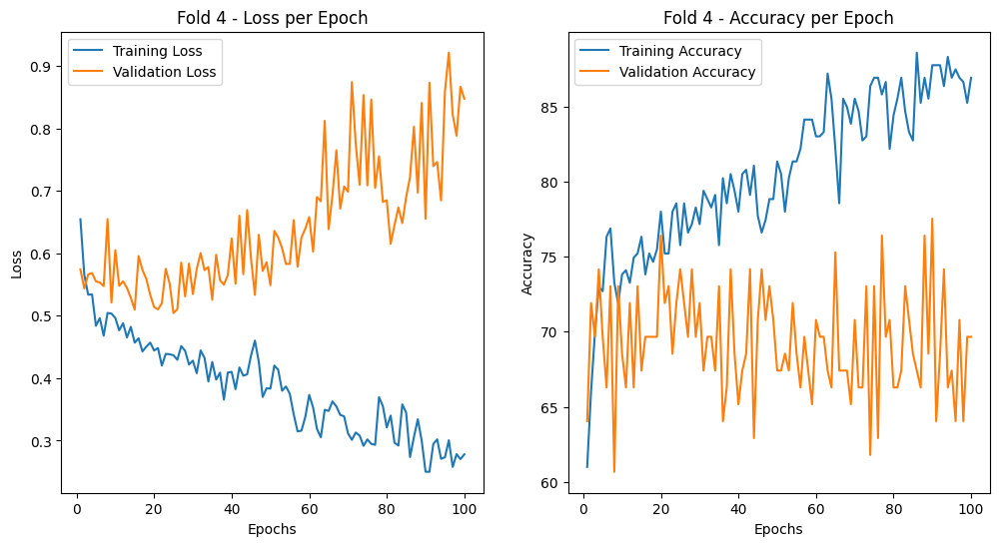

Fold 5
Epoch 1/100, Loss: 0.6599, Accuracy: 64.90%, Validation Loss: 0.5391, Validation Accuracy: 70.79%
Epoch 2/100, Loss: 0.5438, Accuracy: 72.70%, Validation Loss: 0.5787, Validation Accuracy: 69.66%
Epoch 3/100, Loss: 0.5269, Accuracy: 70.47%, Validation Loss: 0.6689, Validation Accuracy: 66.29%
Epoch 4/100, Loss: 0.4917, Accuracy: 74.65%, Validation Loss: 0.5333, Validation Accuracy: 74.16%
Epoch 5/100, Loss: 0.5149, Accuracy: 73.54%, Validation Loss: 0.6325, Validation Accuracy: 66.29%
Epoch 6/100, Loss: 0.4902, Accuracy: 71.31%, Validation Loss: 0.6921, Validation Accuracy: 66.29%
Epoch 7/100, Loss: 0.5183, Accuracy: 71.87%, Validation Loss: 0.6138, Validation Accuracy: 76.40%
Epoch 8/100, Loss: 0.5210, Accuracy: 72.98%, Validation Loss: 0.6892, Validation Accuracy: 71.91%
Epoch 9/100, Loss: 0.4930, Accuracy: 72.70%, Validation Loss: 0.5824, Validation Accuracy: 69.66%
Epoch 10/100, Loss: 0.4587, Accuracy: 76.32%, Validation Loss: 0.5891, Validation Accuracy: 71.91%
Epoch 11/100

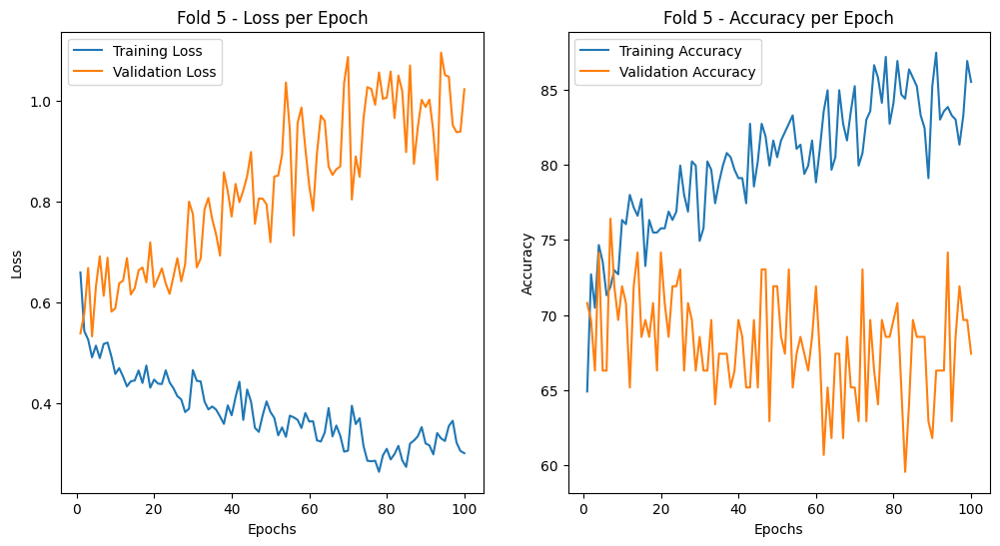

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.3299 - Train Accuracy: 84.92%
           - Validation Loss: 0.6866 - Validation Accuracy: 70.00%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.3181 - Train Accuracy: 84.92%
           - Validation Loss: 0.9548 - Validation Accuracy: 66.67%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.2514 - Train Accuracy: 89.66%
           - Validation Loss: 0.9438 - Validation Accuracy: 66.67%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.2780 - Train Accuracy: 86.91%
           - Validation Loss: 0.8475 - Validation Accuracy: 69.66%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.3016 - Train Accuracy: 85.52%
    

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('tuning_spectral_transformer_encoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=32, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 100
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'tuning_spectral_transformer_encoder/transformer_encoder_model_tuning_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [13]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_spectral_transformer_encoder/transformer_encoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\4163667791.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.71      0.72      0.72        47
      Normal       0.69      0.67      0.68        43

    accuracy                           0.70        90
   macro avg       0.70      0.70      0.70        90
weighted avg       0.70      0.70      0.70        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.66      0.74      0.70        47
      Normal       0.68      0.58      0.62        43

    accuracy                           0.67        90
   macro avg       0.67      0.66      0.66        90
weighted avg       0.67      0.67      0.66        90

--------------------------------------------------------------------------------
Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.63      0

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\4163667791.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

In [17]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_spectral_transformer_encoder/transformer_encoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3376505012.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Metrics for Fold 1
Accuracy: 0.7000
Precision: 0.6994
F1-Score: 0.6991
Sensitivity (Recall for MI): 0.6744
Specificity (True Negative Rate): 0.7234
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.6667
Precision: 0.6680
F1-Score: 0.6625
Sensitivity (Recall for MI): 0.5814
Specificity (True Negative Rate): 0.7447
--------------------------------------------------------------------------------
Metrics for Fold 3
Accuracy: 0.6667
Precision: 0.6675
F1-Score: 0.6665
Sensitivity (Recall for MI): 0.6458
Specificity (True Negative Rate): 0.6905
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.6966
Precision: 0.6956
F1-Score: 0.6952
Sensitivity (Recall for MI): 0.7234
Specificity (True Negative Rate): 0.6667
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.6742
Precision: 0.6776
F1-Score: 0.6740
Sensitivity (

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3376505012.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2056979385.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

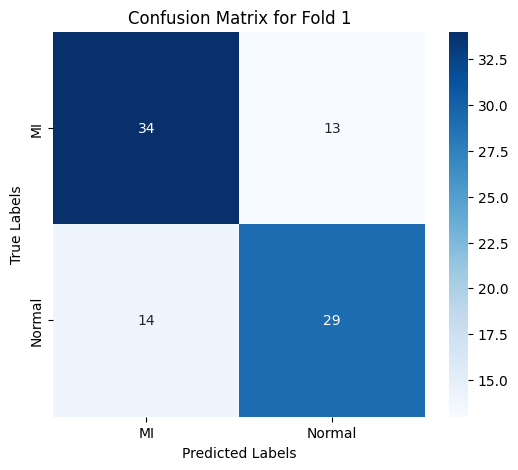

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2056979385.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

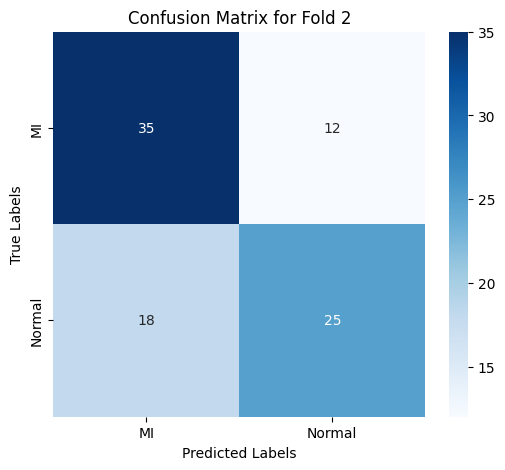

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2056979385.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

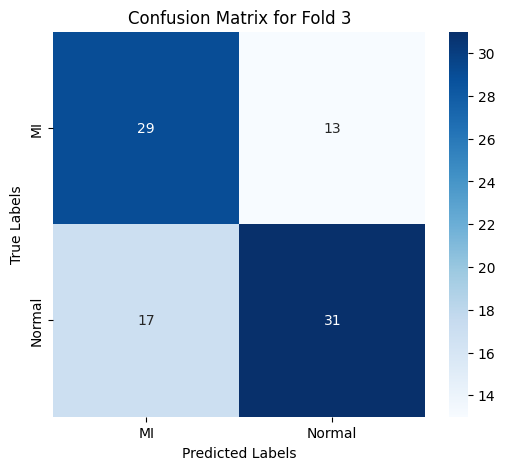

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2056979385.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

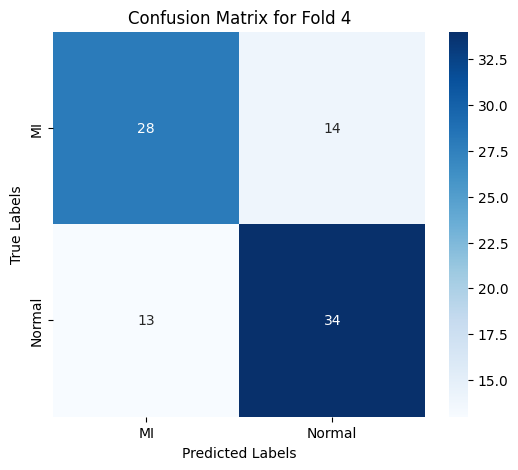

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2056979385.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

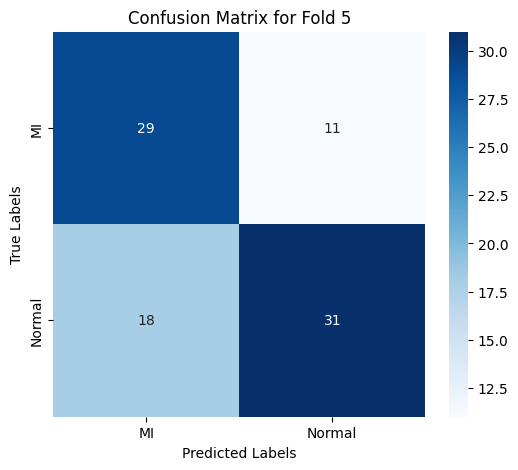

--------------------------------------------------------------------------------


In [16]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_spectral_transformer_encoder/transformer_encoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## (Tuning) Temporal with Transformer Encoder

In [18]:
selected_columns = ['Entropy', 'Wavelet Means', 'Wavelet std', 'Wavelet max', 'Wavelet min', 'Med_wavelet', 'Var_wavelet', 'Skew_wavelet', 'Q1_wavelet', 'Q3_wavelet', 'IQR_wavelet', 'MinMax_wavelet', 'Kurt_wavelet', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_temporal = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_temporal.head())

    Entropy  Wavelet Means  Wavelet std  Wavelet max  Wavelet min  \
0  0.063608      -1.137174    -0.430682     0.024031     0.004692   
1  0.064888      -0.388901    -0.565070    -0.549047     0.441349   
2  0.063367       0.180394    -0.112938    -0.376300     0.355416   
3  0.068559       0.408853     1.567008     1.825143    -0.973889   
4  0.062193      -0.404628    -0.506024    -0.423697     0.363664   

   Med_wavelet  Var_wavelet  Skew_wavelet  Q1_wavelet  Q3_wavelet  \
0    -0.889833    -0.218548      1.146071   -0.076698    0.026616   
1    -0.241600    -0.239203     -0.594643    0.178925   -0.172615   
2     1.042363    -0.151908     -0.491310   -0.838081    0.944422   
3     0.205136     0.616326      2.953232   -0.848416    0.973499   
4     0.454240    -0.230679     -0.101673   -0.313961    0.340572   

   IQR_wavelet  MinMax_wavelet  Kurt_wavelet Label  
0     0.051833        0.226780      1.470453    MI  
1    -0.176615       -0.536473     -0.367429    MI  
2     0.895

In [19]:
X = df_temporal.drop('Label', axis=1).values
y = df_temporal['Label'].values

In [20]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class TransformerModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerModel, self).__init__()
        self.embedding = nn.Linear(input_dim, dim_feedforward)
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(0)  # Transformer expects a sequence, so add a sequence dimension
        x = self.transformer_encoder(x)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/100, Loss: 0.7247, Accuracy: 57.82%, Validation Loss: 0.6699, Validation Accuracy: 63.33%


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 2/100, Loss: 0.6657, Accuracy: 59.22%, Validation Loss: 0.6879, Validation Accuracy: 63.33%
Epoch 3/100, Loss: 0.6363, Accuracy: 64.25%, Validation Loss: 0.6239, Validation Accuracy: 63.33%
Epoch 4/100, Loss: 0.5950, Accuracy: 69.55%, Validation Loss: 0.6428, Validation Accuracy: 56.67%
Epoch 5/100, Loss: 0.5205, Accuracy: 72.91%, Validation Loss: 0.5893, Validation Accuracy: 62.22%
Epoch 6/100, Loss: 0.4613, Accuracy: 77.65%, Validation Loss: 0.5187, Validation Accuracy: 76.67%
Epoch 7/100, Loss: 0.3964, Accuracy: 82.40%, Validation Loss: 0.4243, Validation Accuracy: 78.89%
Epoch 8/100, Loss: 0.3531, Accuracy: 84.36%, Validation Loss: 0.6163, Validation Accuracy: 73.33%
Epoch 9/100, Loss: 0.4232, Accuracy: 82.12%, Validation Loss: 0.4425, Validation Accuracy: 78.89%
Epoch 10/100, Loss: 0.3095, Accuracy: 86.03%, Validation Loss: 0.4613, Validation Accuracy: 77.78%
Epoch 11/100, Loss: 0.3586, Accuracy: 85.47%, Validation Loss: 0.5073, Validation Accuracy: 73.33%
Epoch 12/100, Loss

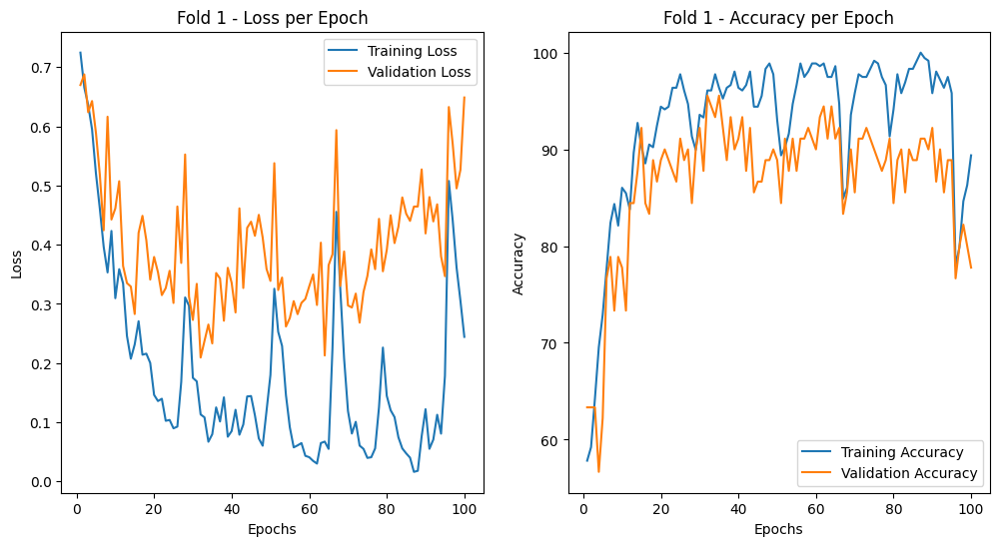

Fold 2
Epoch 1/100, Loss: 0.7769, Accuracy: 51.68%, Validation Loss: 0.7309, Validation Accuracy: 47.78%
Epoch 2/100, Loss: 0.6657, Accuracy: 60.34%, Validation Loss: 0.5984, Validation Accuracy: 68.89%
Epoch 3/100, Loss: 0.5935, Accuracy: 66.76%, Validation Loss: 0.6121, Validation Accuracy: 62.22%
Epoch 4/100, Loss: 0.5264, Accuracy: 71.79%, Validation Loss: 0.5460, Validation Accuracy: 73.33%
Epoch 5/100, Loss: 0.4760, Accuracy: 78.49%, Validation Loss: 0.4545, Validation Accuracy: 81.11%
Epoch 6/100, Loss: 0.3876, Accuracy: 82.12%, Validation Loss: 0.4555, Validation Accuracy: 75.56%
Epoch 7/100, Loss: 0.3523, Accuracy: 84.92%, Validation Loss: 0.4957, Validation Accuracy: 77.78%
Epoch 8/100, Loss: 0.3083, Accuracy: 85.20%, Validation Loss: 0.4434, Validation Accuracy: 86.67%
Epoch 9/100, Loss: 0.3210, Accuracy: 83.24%, Validation Loss: 0.3694, Validation Accuracy: 84.44%
Epoch 10/100, Loss: 0.2728, Accuracy: 87.43%, Validation Loss: 0.4351, Validation Accuracy: 83.33%
Epoch 11/100

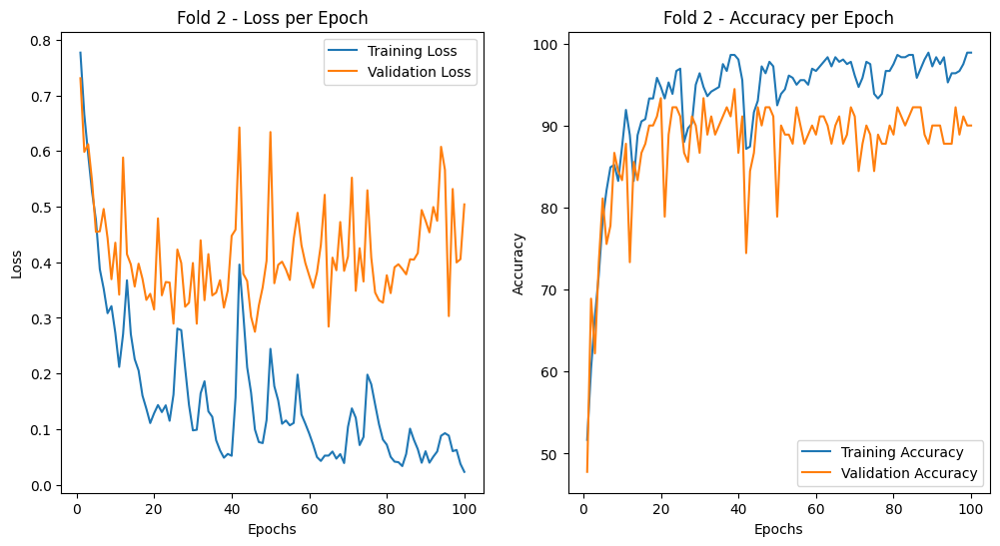

Fold 3
Epoch 1/100, Loss: 0.7279, Accuracy: 56.70%, Validation Loss: 0.6986, Validation Accuracy: 56.67%
Epoch 2/100, Loss: 0.6512, Accuracy: 62.01%, Validation Loss: 0.6401, Validation Accuracy: 57.78%
Epoch 3/100, Loss: 0.6066, Accuracy: 67.32%, Validation Loss: 0.5772, Validation Accuracy: 66.67%
Epoch 4/100, Loss: 0.5653, Accuracy: 68.99%, Validation Loss: 0.5326, Validation Accuracy: 74.44%
Epoch 5/100, Loss: 0.4686, Accuracy: 79.61%, Validation Loss: 0.4506, Validation Accuracy: 78.89%
Epoch 6/100, Loss: 0.3986, Accuracy: 81.56%, Validation Loss: 0.3653, Validation Accuracy: 83.33%
Epoch 7/100, Loss: 0.4324, Accuracy: 82.68%, Validation Loss: 0.3958, Validation Accuracy: 77.78%
Epoch 8/100, Loss: 0.2993, Accuracy: 87.43%, Validation Loss: 0.3010, Validation Accuracy: 91.11%
Epoch 9/100, Loss: 0.3312, Accuracy: 86.59%, Validation Loss: 0.2786, Validation Accuracy: 87.78%
Epoch 10/100, Loss: 0.2631, Accuracy: 88.55%, Validation Loss: 0.4361, Validation Accuracy: 84.44%
Epoch 11/100

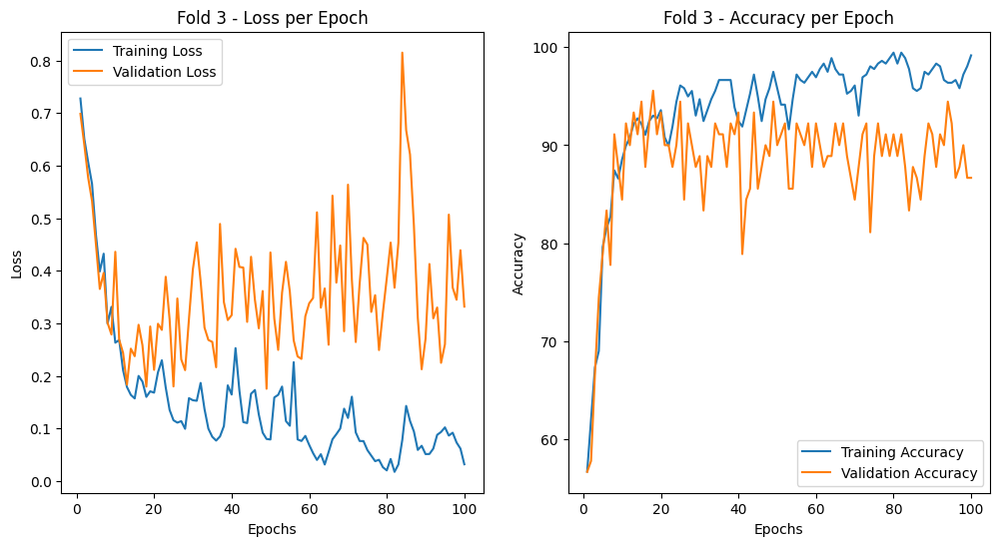

Fold 4
Epoch 1/100, Loss: 0.7461, Accuracy: 57.94%, Validation Loss: 0.7838, Validation Accuracy: 48.31%
Epoch 2/100, Loss: 0.6442, Accuracy: 61.28%, Validation Loss: 0.6633, Validation Accuracy: 57.30%
Epoch 3/100, Loss: 0.6078, Accuracy: 63.23%, Validation Loss: 0.6426, Validation Accuracy: 56.18%
Epoch 4/100, Loss: 0.5371, Accuracy: 70.75%, Validation Loss: 0.6151, Validation Accuracy: 62.92%
Epoch 5/100, Loss: 0.4427, Accuracy: 77.99%, Validation Loss: 0.5225, Validation Accuracy: 71.91%
Epoch 6/100, Loss: 0.3393, Accuracy: 84.68%, Validation Loss: 0.4807, Validation Accuracy: 79.78%
Epoch 7/100, Loss: 0.3077, Accuracy: 86.07%, Validation Loss: 0.5673, Validation Accuracy: 75.28%
Epoch 8/100, Loss: 0.3634, Accuracy: 84.12%, Validation Loss: 0.6679, Validation Accuracy: 66.29%
Epoch 9/100, Loss: 0.4336, Accuracy: 80.50%, Validation Loss: 0.5404, Validation Accuracy: 66.29%
Epoch 10/100, Loss: 0.3757, Accuracy: 81.06%, Validation Loss: 0.4590, Validation Accuracy: 83.15%
Epoch 11/100

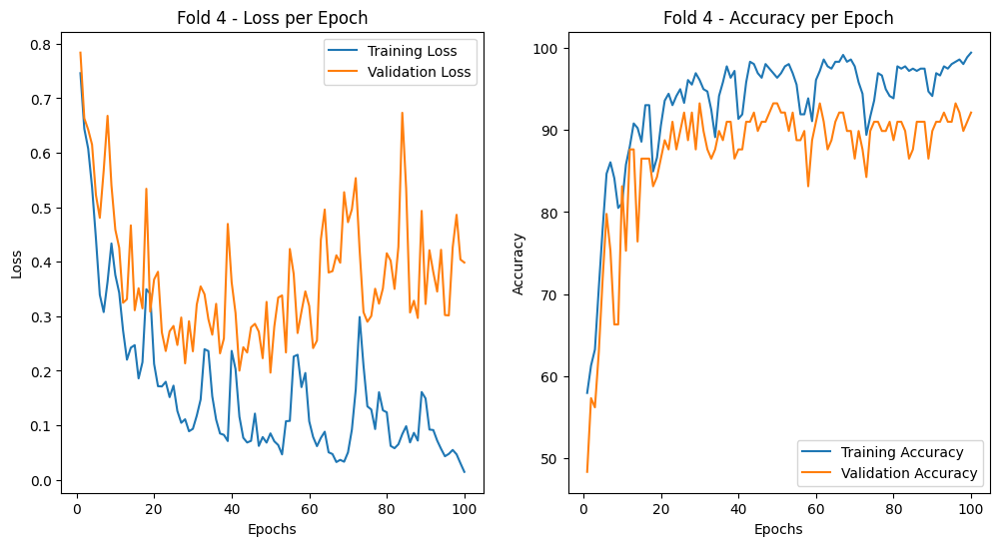

Fold 5
Epoch 1/100, Loss: 0.7311, Accuracy: 57.38%, Validation Loss: 0.6987, Validation Accuracy: 58.43%
Epoch 2/100, Loss: 0.6460, Accuracy: 61.84%, Validation Loss: 0.6470, Validation Accuracy: 65.17%
Epoch 3/100, Loss: 0.5861, Accuracy: 68.52%, Validation Loss: 0.5815, Validation Accuracy: 64.04%
Epoch 4/100, Loss: 0.5043, Accuracy: 71.59%, Validation Loss: 0.5043, Validation Accuracy: 73.03%
Epoch 5/100, Loss: 0.4044, Accuracy: 83.57%, Validation Loss: 0.3957, Validation Accuracy: 78.65%
Epoch 6/100, Loss: 0.3532, Accuracy: 84.12%, Validation Loss: 0.3429, Validation Accuracy: 80.90%
Epoch 7/100, Loss: 0.3473, Accuracy: 86.35%, Validation Loss: 0.4081, Validation Accuracy: 83.15%
Epoch 8/100, Loss: 0.3147, Accuracy: 83.57%, Validation Loss: 0.3346, Validation Accuracy: 83.15%
Epoch 9/100, Loss: 0.2891, Accuracy: 84.68%, Validation Loss: 0.3630, Validation Accuracy: 78.65%
Epoch 10/100, Loss: 0.2543, Accuracy: 89.14%, Validation Loss: 0.3171, Validation Accuracy: 85.39%
Epoch 11/100

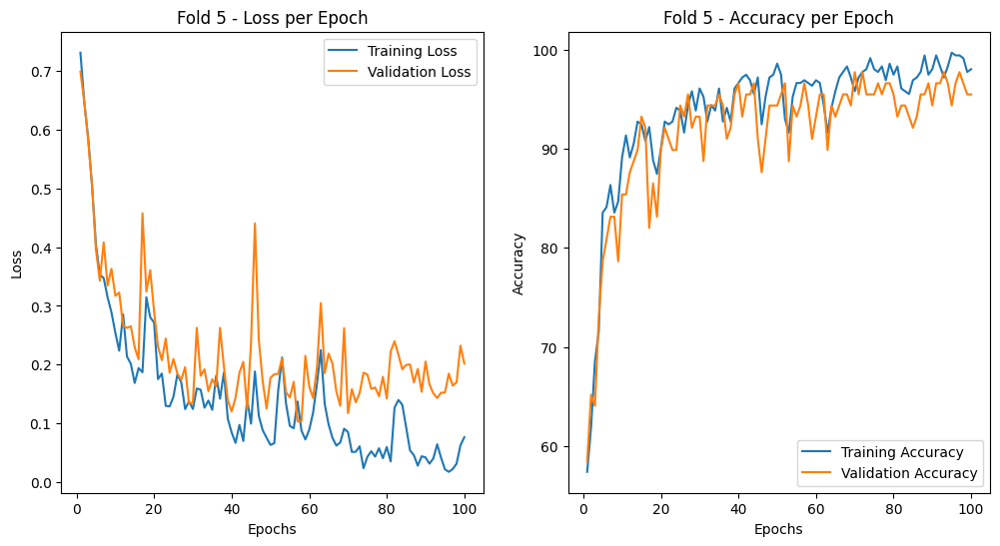

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.2442 - Train Accuracy: 89.39%
           - Validation Loss: 0.6488 - Validation Accuracy: 77.78%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.0229 - Train Accuracy: 98.88%
           - Validation Loss: 0.5040 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.0317 - Train Accuracy: 99.16%
           - Validation Loss: 0.3318 - Validation Accuracy: 86.67%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.0145 - Train Accuracy: 99.44%
           - Validation Loss: 0.3986 - Validation Accuracy: 92.13%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.0764 - Train Accuracy: 98.05%
    

In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('tuning_temporal_transformer_encoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=32, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 100
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'tuning_temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [24]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2083368824.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.78      0.81      0.79        47
      Normal       0.78      0.74      0.76        43

    accuracy                           0.78        90
   macro avg       0.78      0.78      0.78        90
weighted avg       0.78      0.78      0.78        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.84      1.00      0.91        47
      Normal       1.00      0.79      0.88        43

    accuracy                           0.90        90
   macro avg       0.92      0.90      0.90        90
weighted avg       0.92      0.90      0.90        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2083368824.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.86      0.86      0.86        42
      Normal       0.88      0.88      0.88        48

    accuracy                           0.87        90
   macro avg       0.87      0.87      0.87        90
weighted avg       0.87      0.87      0.87        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.86      1.00      0.92        42
      Normal       1.00      0.85      0.92        47

    accuracy                           0.92        89
   macro avg       0.93      0.93      0.92        89
weighted avg       0.93      0.92      0.92        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.95      0

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2083368824.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

In [25]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2032434859.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

Metrics for Fold 1
Accuracy: 0.7778
Precision: 0.7780
F1-Score: 0.7768
Sensitivity (Recall for MI): 0.7442
Specificity (True Negative Rate): 0.8085
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.9000
Precision: 0.9196
F1-Score: 0.8979
Sensitivity (Recall for MI): 0.7907
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 3
Accuracy: 0.8667
Precision: 0.8661
F1-Score: 0.8661
Sensitivity (Recall for MI): 0.8750
Specificity (True Negative Rate): 0.8571
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.9213
Precision: 0.9286
F1-Score: 0.9213
Sensitivity (Recall for MI): 0.8511
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.9551
Precision: 0.9546
F1-Score: 0.9546
Sensitivity (

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2032434859.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1447014641.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

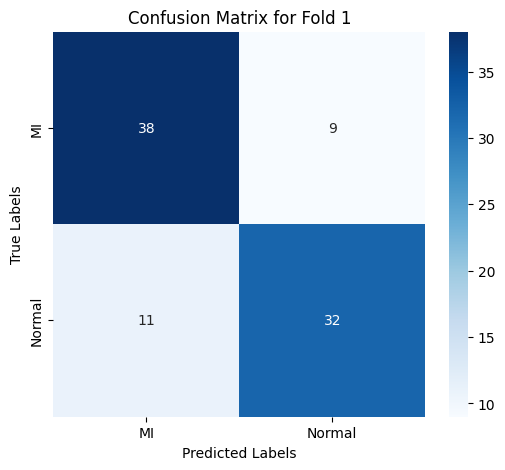

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1447014641.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

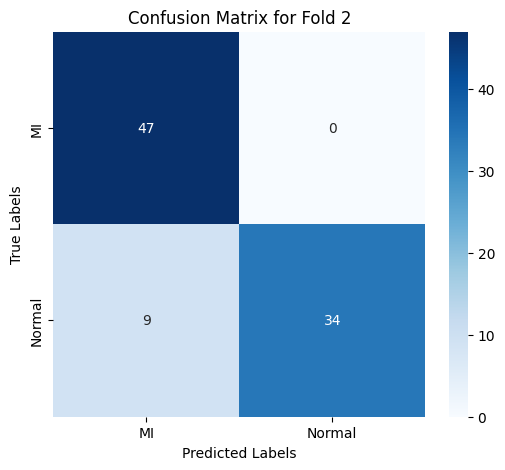

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1447014641.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

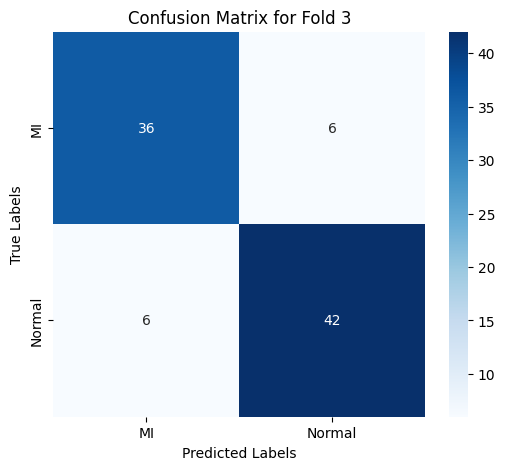

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1447014641.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

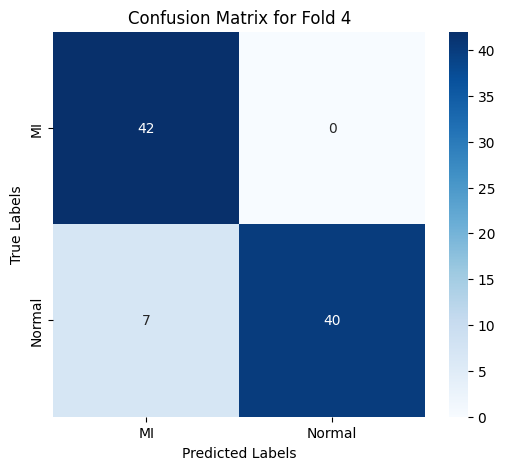

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1447014641.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

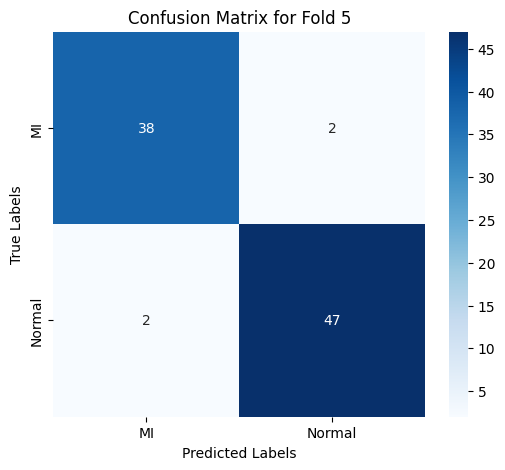

--------------------------------------------------------------------------------


In [26]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_temporal_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## (Tuning) Multi Scale with Transformer Encoder

In [27]:
X = df_combine_scaled.drop('Label', axis=1).values
y = df_combine_scaled['Label'].values

In [28]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [30]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class TransformerModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerModel, self).__init__()
        self.embedding = nn.Linear(input_dim, dim_feedforward)
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(0)  # Transformer expects a sequence, so add a sequence dimension
        x = self.transformer_encoder(x)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/100, Loss: 0.6232, Accuracy: 65.64%, Validation Loss: 0.5462, Validation Accuracy: 72.22%


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 2/100, Loss: 0.4916, Accuracy: 74.58%, Validation Loss: 0.4458, Validation Accuracy: 80.00%
Epoch 3/100, Loss: 0.3748, Accuracy: 82.12%, Validation Loss: 0.4398, Validation Accuracy: 78.89%
Epoch 4/100, Loss: 0.3275, Accuracy: 86.03%, Validation Loss: 0.4328, Validation Accuracy: 78.89%
Epoch 5/100, Loss: 0.2544, Accuracy: 90.50%, Validation Loss: 0.4151, Validation Accuracy: 80.00%
Epoch 6/100, Loss: 0.2519, Accuracy: 89.11%, Validation Loss: 0.4933, Validation Accuracy: 82.22%
Epoch 7/100, Loss: 0.2439, Accuracy: 89.39%, Validation Loss: 0.3759, Validation Accuracy: 84.44%
Epoch 8/100, Loss: 0.1920, Accuracy: 92.46%, Validation Loss: 0.3863, Validation Accuracy: 84.44%
Epoch 9/100, Loss: 0.1952, Accuracy: 92.18%, Validation Loss: 0.3513, Validation Accuracy: 87.78%
Epoch 10/100, Loss: 0.1883, Accuracy: 92.74%, Validation Loss: 0.5118, Validation Accuracy: 78.89%
Epoch 11/100, Loss: 0.1747, Accuracy: 91.62%, Validation Loss: 0.4083, Validation Accuracy: 86.67%
Epoch 12/100, Loss

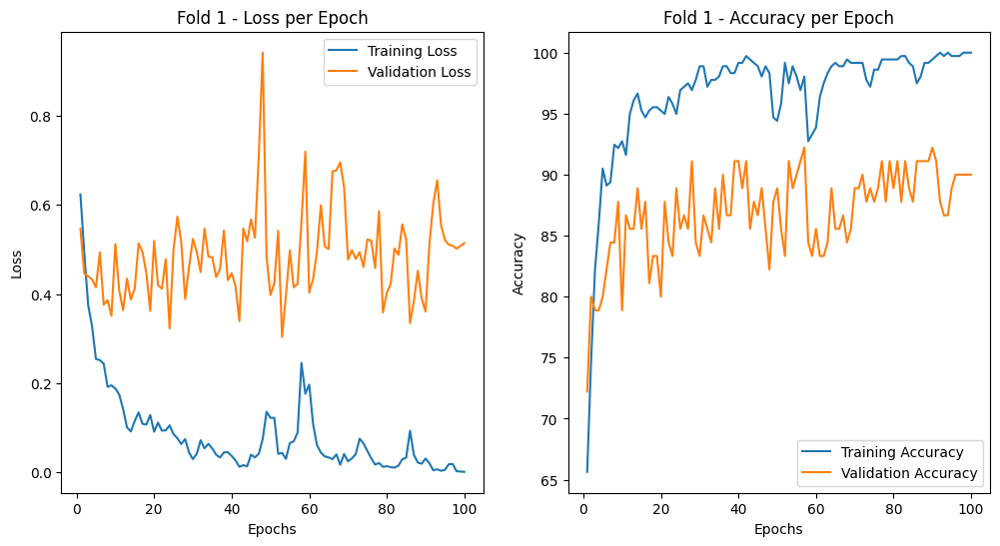

Fold 2
Epoch 1/100, Loss: 0.6556, Accuracy: 67.60%, Validation Loss: 0.6283, Validation Accuracy: 62.22%
Epoch 2/100, Loss: 0.5654, Accuracy: 70.11%, Validation Loss: 0.4851, Validation Accuracy: 81.11%
Epoch 3/100, Loss: 0.4368, Accuracy: 76.82%, Validation Loss: 0.4590, Validation Accuracy: 81.11%
Epoch 4/100, Loss: 0.4139, Accuracy: 80.45%, Validation Loss: 0.4035, Validation Accuracy: 83.33%
Epoch 5/100, Loss: 0.3327, Accuracy: 86.87%, Validation Loss: 0.3894, Validation Accuracy: 84.44%
Epoch 6/100, Loss: 0.2733, Accuracy: 88.83%, Validation Loss: 0.3518, Validation Accuracy: 82.22%
Epoch 7/100, Loss: 0.2302, Accuracy: 91.90%, Validation Loss: 0.3002, Validation Accuracy: 86.67%
Epoch 8/100, Loss: 0.1840, Accuracy: 93.58%, Validation Loss: 0.3160, Validation Accuracy: 86.67%
Epoch 9/100, Loss: 0.2025, Accuracy: 91.06%, Validation Loss: 0.3560, Validation Accuracy: 85.56%
Epoch 10/100, Loss: 0.1655, Accuracy: 94.41%, Validation Loss: 0.3310, Validation Accuracy: 84.44%
Epoch 11/100

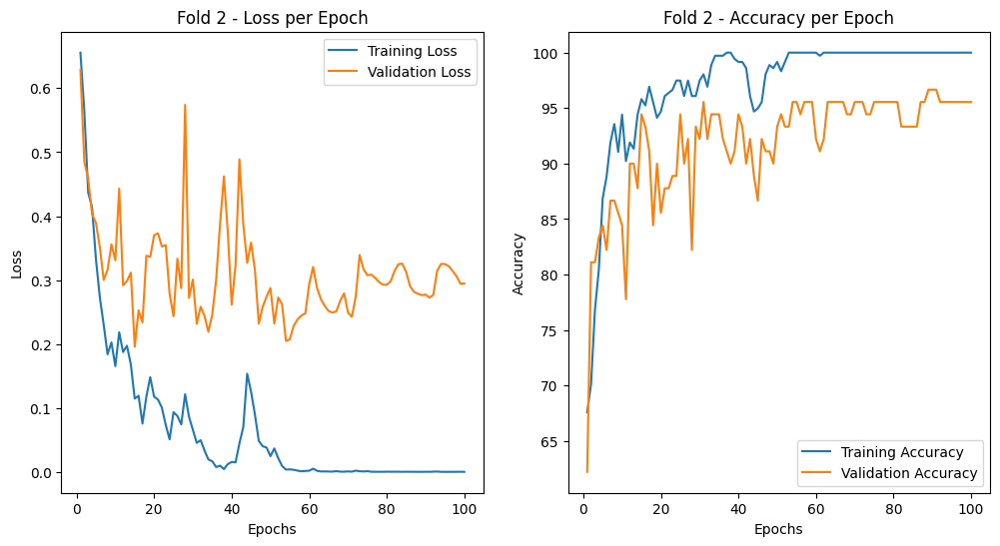

Fold 3
Epoch 1/100, Loss: 0.6131, Accuracy: 62.85%, Validation Loss: 0.5569, Validation Accuracy: 73.33%
Epoch 2/100, Loss: 0.5248, Accuracy: 73.74%, Validation Loss: 0.5465, Validation Accuracy: 72.22%
Epoch 3/100, Loss: 0.4389, Accuracy: 77.93%, Validation Loss: 0.4678, Validation Accuracy: 81.11%
Epoch 4/100, Loss: 0.3526, Accuracy: 82.96%, Validation Loss: 0.4232, Validation Accuracy: 78.89%
Epoch 5/100, Loss: 0.3044, Accuracy: 89.39%, Validation Loss: 0.4441, Validation Accuracy: 81.11%
Epoch 6/100, Loss: 0.3169, Accuracy: 86.59%, Validation Loss: 0.4707, Validation Accuracy: 81.11%
Epoch 7/100, Loss: 0.3061, Accuracy: 85.47%, Validation Loss: 0.2944, Validation Accuracy: 87.78%
Epoch 8/100, Loss: 0.2271, Accuracy: 91.62%, Validation Loss: 0.3482, Validation Accuracy: 84.44%
Epoch 9/100, Loss: 0.1774, Accuracy: 93.30%, Validation Loss: 0.3359, Validation Accuracy: 82.22%
Epoch 10/100, Loss: 0.1920, Accuracy: 93.02%, Validation Loss: 0.3487, Validation Accuracy: 82.22%
Epoch 11/100

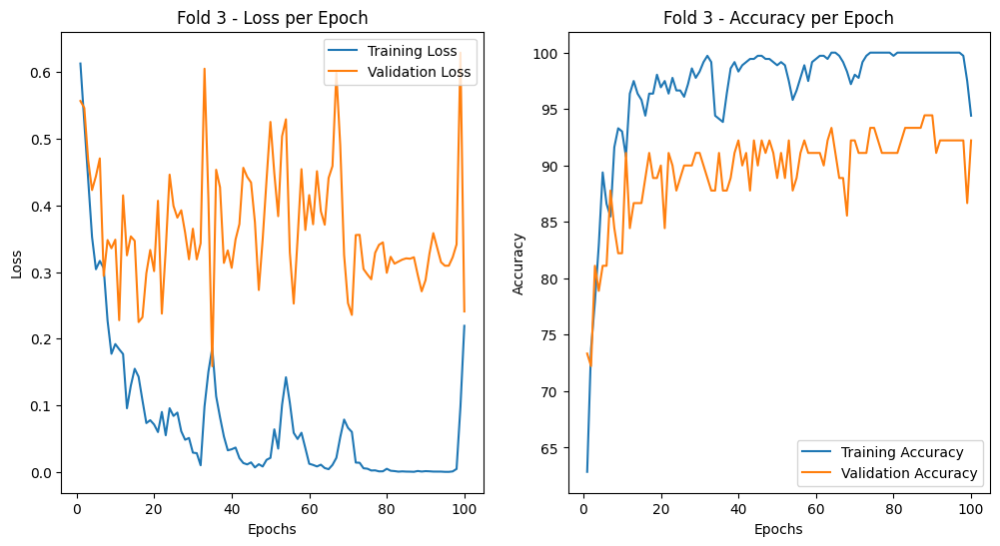

Fold 4
Epoch 1/100, Loss: 0.6290, Accuracy: 68.80%, Validation Loss: 0.6839, Validation Accuracy: 65.17%
Epoch 2/100, Loss: 0.5585, Accuracy: 68.80%, Validation Loss: 0.4791, Validation Accuracy: 75.28%
Epoch 3/100, Loss: 0.4616, Accuracy: 76.88%, Validation Loss: 0.4955, Validation Accuracy: 70.79%
Epoch 4/100, Loss: 0.3604, Accuracy: 82.17%, Validation Loss: 0.4508, Validation Accuracy: 75.28%
Epoch 5/100, Loss: 0.3027, Accuracy: 86.63%, Validation Loss: 0.4410, Validation Accuracy: 80.90%
Epoch 6/100, Loss: 0.2618, Accuracy: 88.86%, Validation Loss: 0.4491, Validation Accuracy: 80.90%
Epoch 7/100, Loss: 0.2619, Accuracy: 88.86%, Validation Loss: 0.4852, Validation Accuracy: 84.27%
Epoch 8/100, Loss: 0.2733, Accuracy: 87.47%, Validation Loss: 0.4622, Validation Accuracy: 84.27%
Epoch 9/100, Loss: 0.2122, Accuracy: 91.92%, Validation Loss: 0.4963, Validation Accuracy: 82.02%
Epoch 10/100, Loss: 0.1791, Accuracy: 92.76%, Validation Loss: 0.3635, Validation Accuracy: 85.39%
Epoch 11/100

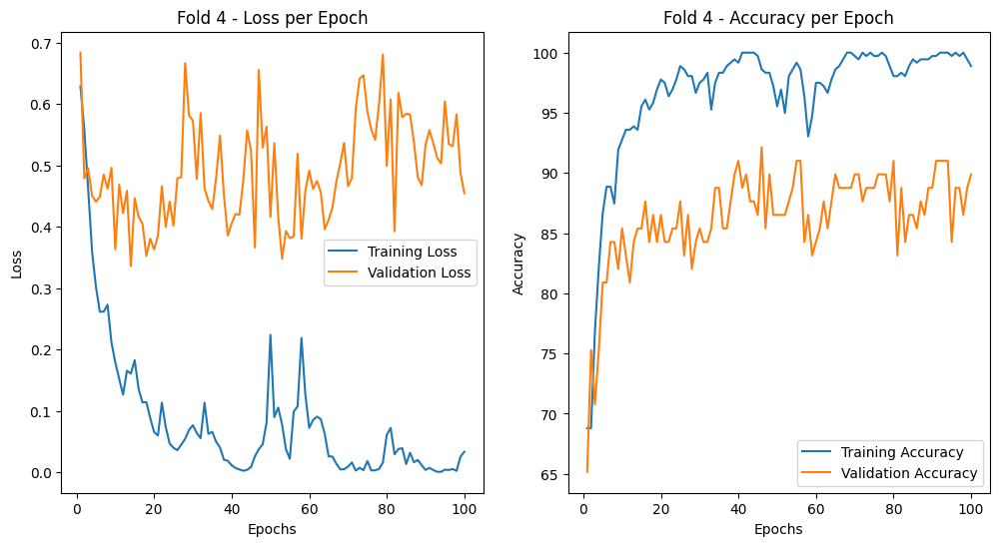

Fold 5
Epoch 1/100, Loss: 0.6285, Accuracy: 64.62%, Validation Loss: 0.5712, Validation Accuracy: 65.17%
Epoch 2/100, Loss: 0.4942, Accuracy: 76.88%, Validation Loss: 0.5110, Validation Accuracy: 70.79%
Epoch 3/100, Loss: 0.4290, Accuracy: 78.55%, Validation Loss: 0.4382, Validation Accuracy: 78.65%
Epoch 4/100, Loss: 0.3516, Accuracy: 85.24%, Validation Loss: 0.4777, Validation Accuracy: 79.78%
Epoch 5/100, Loss: 0.3410, Accuracy: 88.30%, Validation Loss: 0.4808, Validation Accuracy: 78.65%
Epoch 6/100, Loss: 0.2649, Accuracy: 87.74%, Validation Loss: 0.3930, Validation Accuracy: 80.90%
Epoch 7/100, Loss: 0.1992, Accuracy: 92.20%, Validation Loss: 0.4314, Validation Accuracy: 86.52%
Epoch 8/100, Loss: 0.1671, Accuracy: 92.48%, Validation Loss: 0.4060, Validation Accuracy: 83.15%
Epoch 9/100, Loss: 0.1644, Accuracy: 93.31%, Validation Loss: 0.4233, Validation Accuracy: 86.52%
Epoch 10/100, Loss: 0.1201, Accuracy: 95.82%, Validation Loss: 0.3675, Validation Accuracy: 87.64%
Epoch 11/100

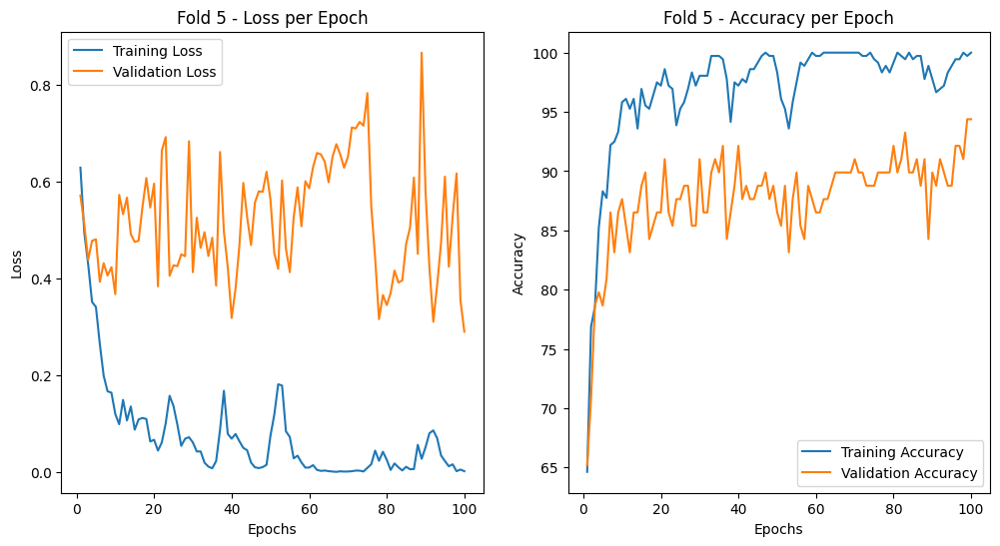

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.0013 - Train Accuracy: 100.00%
           - Validation Loss: 0.5141 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.0002 - Train Accuracy: 100.00%
           - Validation Loss: 0.2948 - Validation Accuracy: 95.56%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.2194 - Train Accuracy: 94.41%
           - Validation Loss: 0.2410 - Validation Accuracy: 92.22%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.0336 - Train Accuracy: 98.89%
           - Validation Loss: 0.4546 - Validation Accuracy: 89.89%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.0024 - Train Accuracy: 100.00%
 

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('tuning_multi_scale_transformer_encoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=32, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 100
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'tuning_multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [32]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3424377679.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.93      0.87      0.90        47
      Normal       0.87      0.93      0.90        43

    accuracy                           0.90        90
   macro avg       0.90      0.90      0.90        90
weighted avg       0.90      0.90      0.90        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.94      0.98      0.96        47
      Normal       0.98      0.93      0.95        43

    accuracy                           0.96        90
   macro avg       0.96      0.95      0.96        90
weighted avg       0.96      0.96      0.96        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3424377679.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.87      0.98      0.92        42
      Normal       0.98      0.88      0.92        48

    accuracy                           0.92        90
   macro avg       0.92      0.93      0.92        90
weighted avg       0.93      0.92      0.92        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.88      0.90      0.89        42
      Normal       0.91      0.89      0.90        47

    accuracy                           0.90        89
   macro avg       0.90      0.90      0.90        89
weighted avg       0.90      0.90      0.90        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.95      0

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3424377679.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

In [33]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\419627132.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Metrics for Fold 1
Accuracy: 0.9000
Precision: 0.9007
F1-Score: 0.9000
Sensitivity (Recall for MI): 0.9302
Specificity (True Negative Rate): 0.8723
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.9556
Precision: 0.9572
F1-Score: 0.9554
Sensitivity (Recall for MI): 0.9302
Specificity (True Negative Rate): 0.9787
--------------------------------------------------------------------------------
Metrics for Fold 3
Accuracy: 0.9222
Precision: 0.9245
F1-Score: 0.9222
Sensitivity (Recall for MI): 0.8750
Specificity (True Negative Rate): 0.9762
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.8989
Precision: 0.8984
F1-Score: 0.8987
Sensitivity (Recall for MI): 0.8936
Specificity (True Negative Rate): 0.9048
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.9438
Precision: 0.9444
F1-Score: 0.9431
Sensitivity (

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\419627132.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3762505994.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

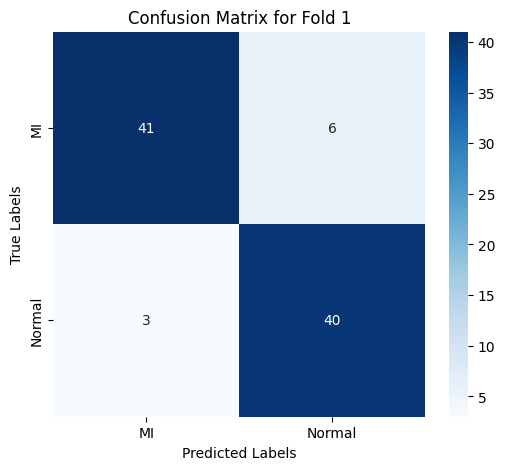

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3762505994.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

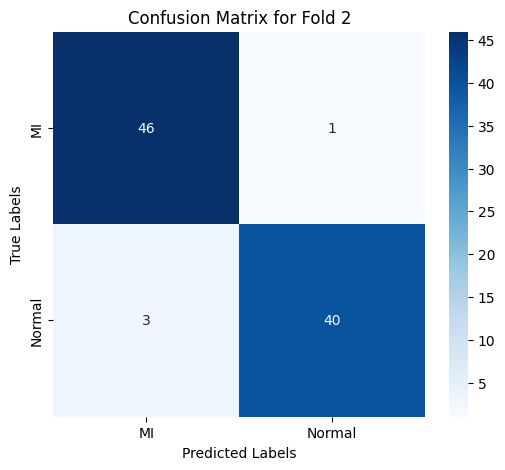

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3762505994.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

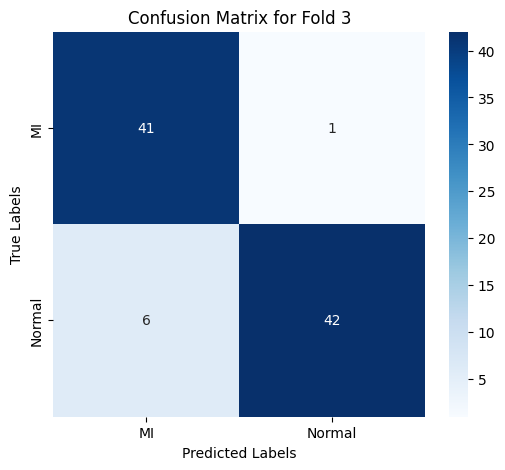

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3762505994.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

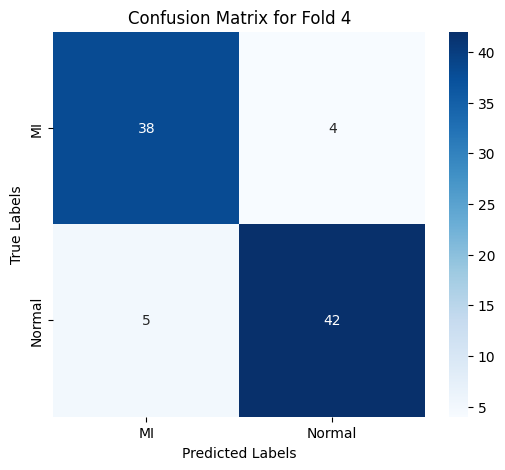

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3762505994.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

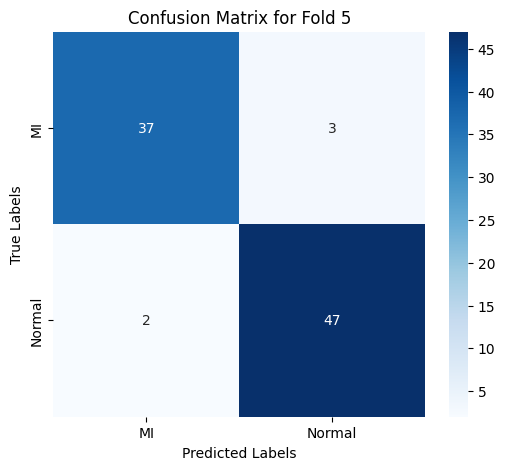

--------------------------------------------------------------------------------


In [34]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_multi_scale_transformer_encoder/transformer_encoder_model_fold_{fold_no}.pth'
    model = TransformerModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## (Tuning) Spectral with Transformer Decoder

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
import itertools

# Hyperparameter yang ingin dicoba
param_grid = {
    'batch_size': [8, 16, 32, 64],
    'num_epochs': [10, 20, 50, 100]
}

# Semua kombinasi hyperparameter
param_combinations = list(itertools.product(param_grid['batch_size'], param_grid['num_epochs']))

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Fungsi untuk training model
def train_and_evaluate_model(batch_size, num_epochs):
    fold_no = 1
    val_accuracy_per_fold = []

    for train_index, val_index in kf.split(X_train_tensor):
        print(f'Fold {fold_no}')

        # Membagi data
        X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
        y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

        # Membuat TensorDataset untuk train dan validation fold
        train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
        val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

        train_loader_fold = DataLoader(train_dataset_fold, batch_size=batch_size, shuffle=True)
        val_loader_fold = DataLoader(val_dataset_fold, batch_size=batch_size, shuffle=False)

        # Inisialisasi model dan optimizer
        model = TransformerDecoderModel(input_dim, num_classes)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)  # Tetap gunakan lr yang sama

        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for X_batch, y_batch in train_loader_fold:
                optimizer.zero_grad()
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                loss.backward()
                optimizer.step()

        # Evaluasi pada data validasi
        model.eval()
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_accuracy_per_fold.append(val_accuracy)
        fold_no += 1

    # Rata-rata akurasi validasi
    avg_val_accuracy = sum(val_accuracy_per_fold) / len(val_accuracy_per_fold)
    return avg_val_accuracy

# Melakukan Grid Search
best_accuracy = 0
best_params = None

for (batch_size, num_epochs) in param_combinations:
    print(f'Trying hyperparameters: batch_size={batch_size}, num_epochs={num_epochs}')
    val_accuracy = train_and_evaluate_model(batch_size, num_epochs)
    print(f'Validation Accuracy: {val_accuracy:.2f}%')

    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = (batch_size, num_epochs)

print('Best Hyperparameters:')
print(f'Batch Size: {best_params[0]}, Epochs: {best_params[1]}')
print(f'Best Validation Accuracy: {best_accuracy:.2f}%')


Trying hyperparameters: batch_size=8, num_epochs=10
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 86.40%
Trying hyperparameters: batch_size=8, num_epochs=20
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 87.48%
Trying hyperparameters: batch_size=8, num_epochs=50
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 88.61%
Trying hyperparameters: batch_size=8, num_epochs=100
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 88.39%
Trying hyperparameters: batch_size=16, num_epochs=10
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 85.92%
Trying hyperparameters: batch_size=16, num_epochs=20
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 88.61%
Trying hyperparameters: batch_size=16, num_epochs=50
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 91.52%
Trying hyperparameters: batch_size=16, num_epochs=100
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 91.07%
Trying hyperparameters: batch_size=32, num_epochs=10
Fold 1
Fold 2
Fold 3


In [35]:
selected_columns = ['MFCC Means', 'MFCC std', 'MFCC max', 'MFCC min', 'Med_mfcc', 'Var_mfcc', 'Skew_mfcc', 'Q1_mfcc', 'Q3_mfcc', 'IQR_mfcc', 'MinMax_mfcc', 'Kurt_mfcc', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_spectral = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_spectral.head())

   MFCC Means  MFCC std  MFCC max  MFCC min  Med_mfcc  Var_mfcc  Skew_mfcc  \
0    0.805298 -0.893321  0.727190  0.942132 -0.598371 -0.921706  -0.321473   
1   -0.228878  0.601932 -2.114222 -0.483793  1.257240  0.594724  -0.971689   
2    0.629472 -0.027778 -0.754010  0.036559  2.398342 -0.062456  -0.766293   
3    1.530227 -1.566485  1.255310  1.583813 -0.171921 -1.554723  -0.653024   
4   -0.680597  0.530428 -0.464613 -0.596863  0.842127  0.518742  -0.035472   

    Q1_mfcc   Q3_mfcc  IQR_mfcc  MinMax_mfcc  Kurt_mfcc Label  
0  0.734321 -0.816269 -1.060130    -0.538695   0.334547    MI  
1  0.669311  0.773221  0.321963    -0.347450   0.964492    MI  
2  0.749218  1.135122  0.589301    -0.301331   0.758335    MI  
3  0.715255 -0.219460 -0.543864    -0.893826   0.690955    MI  
4 -0.499815  0.770667  0.904191     0.339870   0.007908    MI  


In [36]:
X = df_spectral.drop('Label', axis=1).values
y = df_spectral['Label'].values

In [37]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [41]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


class TransformerDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerDecoderModel, self).__init__()
        # Embed input sesuai dengan input_dim yang sesuai dari data
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Adding an encoder representation as memory for the decoder
        self.memory_projection = nn.Linear(dim_feedforward, dim_feedforward)

        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        # Embed input
        x = self.embedding(x)

        # Ensure proper shape for sequence dimension
        x = x.unsqueeze(0)  # Adding sequence dimension

        # Prepare memory
        memory = self.memory_projection(x)

        # Forward through TransformerDecoder with memory
        x = self.transformer_decoder(x, memory)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x



# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/50, Loss: 0.7483, Accuracy: 61.73%, Validation Loss: 0.7120, Validation Accuracy: 57.78%
Epoch 2/50, Loss: 0.5915, Accuracy: 68.44%, Validation Loss: 0.5804, Validation Accuracy: 75.56%
Epoch 3/50, Loss: 0.5505, Accuracy: 68.72%, Validation Loss: 0.5698, Validation Accuracy: 71.11%
Epoch 4/50, Loss: 0.5135, Accuracy: 71.23%, Validation Loss: 0.5801, Validation Accuracy: 71.11%
Epoch 5/50, Loss: 0.5277, Accuracy: 71.23%, Validation Loss: 0.5567, Validation Accuracy: 72.22%
Epoch 6/50, Loss: 0.5253, Accuracy: 72.91%, Validation Loss: 0.5830, Validation Accuracy: 65.56%
Epoch 7/50, Loss: 0.5182, Accuracy: 72.63%, Validation Loss: 0.5661, Validation Accuracy: 67.78%
Epoch 8/50, Loss: 0.4652, Accuracy: 73.74%, Validation Loss: 0.5898, Validation Accuracy: 73.33%
Epoch 9/50, Loss: 0.4704, Accuracy: 75.14%, Validation Loss: 0.6210, Validation Accuracy: 68.89%
Epoch 10/50, Loss: 0.4993, Accuracy: 72.35%, Validation Loss: 0.5750, Validation Accuracy: 72.22%
Epoch 11/50, Loss: 0.4

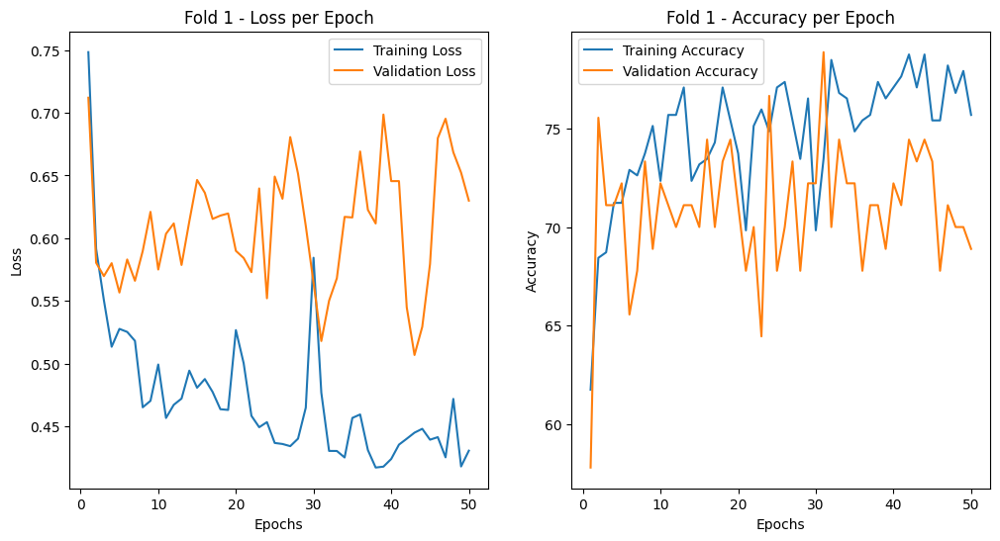

Fold 2
Epoch 1/50, Loss: 0.7166, Accuracy: 58.10%, Validation Loss: 0.6565, Validation Accuracy: 64.44%
Epoch 2/50, Loss: 0.5862, Accuracy: 65.92%, Validation Loss: 0.5360, Validation Accuracy: 73.33%
Epoch 3/50, Loss: 0.5520, Accuracy: 71.79%, Validation Loss: 0.5357, Validation Accuracy: 75.56%
Epoch 4/50, Loss: 0.5554, Accuracy: 68.99%, Validation Loss: 0.5797, Validation Accuracy: 67.78%
Epoch 5/50, Loss: 0.5461, Accuracy: 71.23%, Validation Loss: 0.5041, Validation Accuracy: 75.56%
Epoch 6/50, Loss: 0.5138, Accuracy: 71.79%, Validation Loss: 0.5253, Validation Accuracy: 76.67%
Epoch 7/50, Loss: 0.5140, Accuracy: 72.63%, Validation Loss: 0.5331, Validation Accuracy: 72.22%
Epoch 8/50, Loss: 0.4862, Accuracy: 73.74%, Validation Loss: 0.5367, Validation Accuracy: 74.44%
Epoch 9/50, Loss: 0.4980, Accuracy: 73.18%, Validation Loss: 0.5333, Validation Accuracy: 74.44%
Epoch 10/50, Loss: 0.4937, Accuracy: 72.91%, Validation Loss: 0.6066, Validation Accuracy: 68.89%
Epoch 11/50, Loss: 0.5

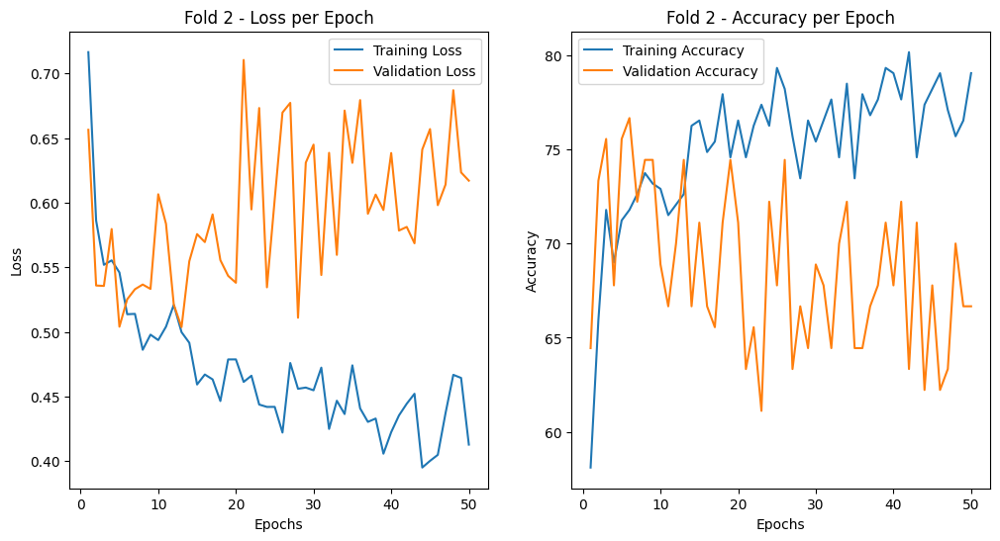

Fold 3
Epoch 1/50, Loss: 0.5706, Accuracy: 72.07%, Validation Loss: 0.7689, Validation Accuracy: 63.33%
Epoch 2/50, Loss: 0.5339, Accuracy: 72.91%, Validation Loss: 0.7357, Validation Accuracy: 64.44%
Epoch 3/50, Loss: 0.5815, Accuracy: 69.55%, Validation Loss: 0.6349, Validation Accuracy: 62.22%
Epoch 4/50, Loss: 0.5098, Accuracy: 72.35%, Validation Loss: 0.6620, Validation Accuracy: 66.67%
Epoch 5/50, Loss: 0.4941, Accuracy: 75.42%, Validation Loss: 0.6420, Validation Accuracy: 67.78%
Epoch 6/50, Loss: 0.4894, Accuracy: 76.82%, Validation Loss: 0.6180, Validation Accuracy: 67.78%
Epoch 7/50, Loss: 0.4845, Accuracy: 75.42%, Validation Loss: 0.6046, Validation Accuracy: 66.67%
Epoch 8/50, Loss: 0.4543, Accuracy: 78.49%, Validation Loss: 0.6253, Validation Accuracy: 66.67%
Epoch 9/50, Loss: 0.4587, Accuracy: 76.26%, Validation Loss: 0.6802, Validation Accuracy: 65.56%
Epoch 10/50, Loss: 0.4793, Accuracy: 74.02%, Validation Loss: 0.6435, Validation Accuracy: 63.33%
Epoch 11/50, Loss: 0.4

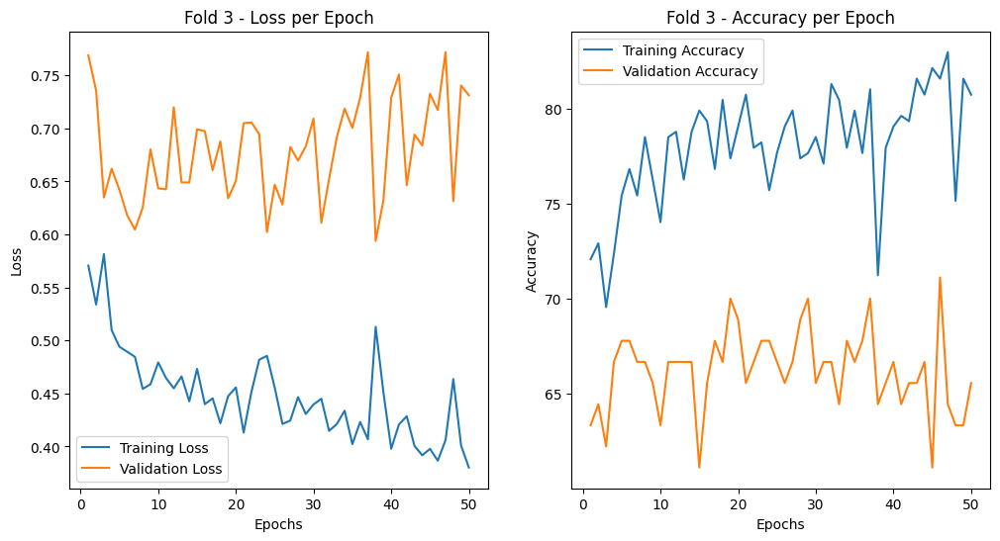

Fold 4
Epoch 1/50, Loss: 0.6471, Accuracy: 66.57%, Validation Loss: 0.5275, Validation Accuracy: 69.66%
Epoch 2/50, Loss: 0.6249, Accuracy: 62.95%, Validation Loss: 0.6058, Validation Accuracy: 64.04%
Epoch 3/50, Loss: 0.5536, Accuracy: 71.03%, Validation Loss: 0.6099, Validation Accuracy: 65.17%
Epoch 4/50, Loss: 0.5147, Accuracy: 72.42%, Validation Loss: 0.6002, Validation Accuracy: 68.54%
Epoch 5/50, Loss: 0.5174, Accuracy: 73.54%, Validation Loss: 0.6474, Validation Accuracy: 66.29%
Epoch 6/50, Loss: 0.5045, Accuracy: 72.42%, Validation Loss: 0.5445, Validation Accuracy: 66.29%
Epoch 7/50, Loss: 0.5086, Accuracy: 72.98%, Validation Loss: 0.7029, Validation Accuracy: 60.67%
Epoch 8/50, Loss: 0.4931, Accuracy: 74.37%, Validation Loss: 0.5787, Validation Accuracy: 73.03%
Epoch 9/50, Loss: 0.4829, Accuracy: 75.49%, Validation Loss: 0.6083, Validation Accuracy: 69.66%
Epoch 10/50, Loss: 0.4793, Accuracy: 74.09%, Validation Loss: 0.5650, Validation Accuracy: 70.79%
Epoch 11/50, Loss: 0.4

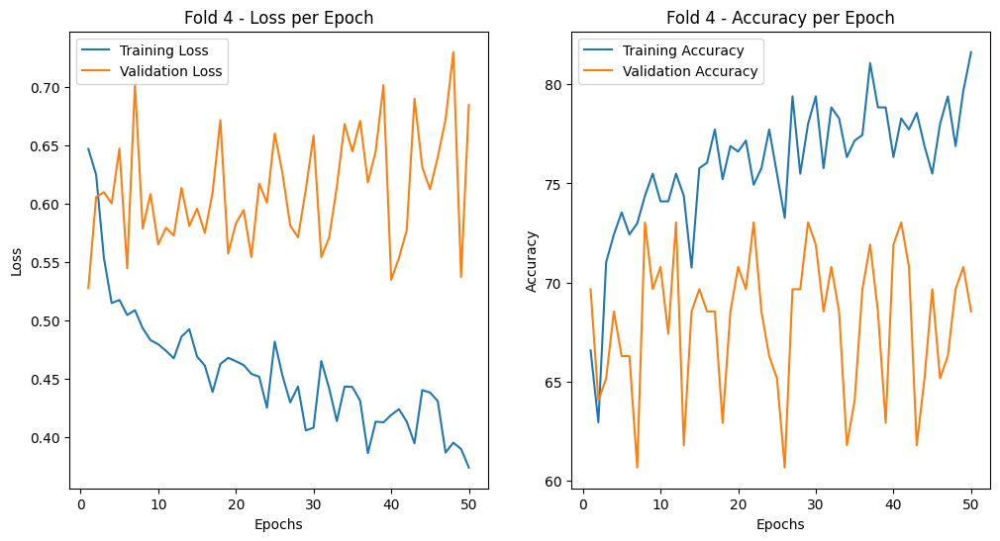

Fold 5
Epoch 1/50, Loss: 0.6829, Accuracy: 63.23%, Validation Loss: 0.6124, Validation Accuracy: 69.66%
Epoch 2/50, Loss: 0.5579, Accuracy: 71.59%, Validation Loss: 0.6092, Validation Accuracy: 59.55%
Epoch 3/50, Loss: 0.5350, Accuracy: 70.19%, Validation Loss: 0.6003, Validation Accuracy: 69.66%
Epoch 4/50, Loss: 0.5105, Accuracy: 72.70%, Validation Loss: 0.5891, Validation Accuracy: 69.66%
Epoch 5/50, Loss: 0.4904, Accuracy: 74.65%, Validation Loss: 0.6288, Validation Accuracy: 66.29%
Epoch 6/50, Loss: 0.4938, Accuracy: 72.70%, Validation Loss: 0.6654, Validation Accuracy: 68.54%
Epoch 7/50, Loss: 0.5195, Accuracy: 69.92%, Validation Loss: 0.5608, Validation Accuracy: 73.03%
Epoch 8/50, Loss: 0.4829, Accuracy: 73.26%, Validation Loss: 0.5963, Validation Accuracy: 61.80%
Epoch 9/50, Loss: 0.5482, Accuracy: 70.75%, Validation Loss: 0.6391, Validation Accuracy: 66.29%
Epoch 10/50, Loss: 0.4778, Accuracy: 72.98%, Validation Loss: 0.6284, Validation Accuracy: 67.42%
Epoch 11/50, Loss: 0.4

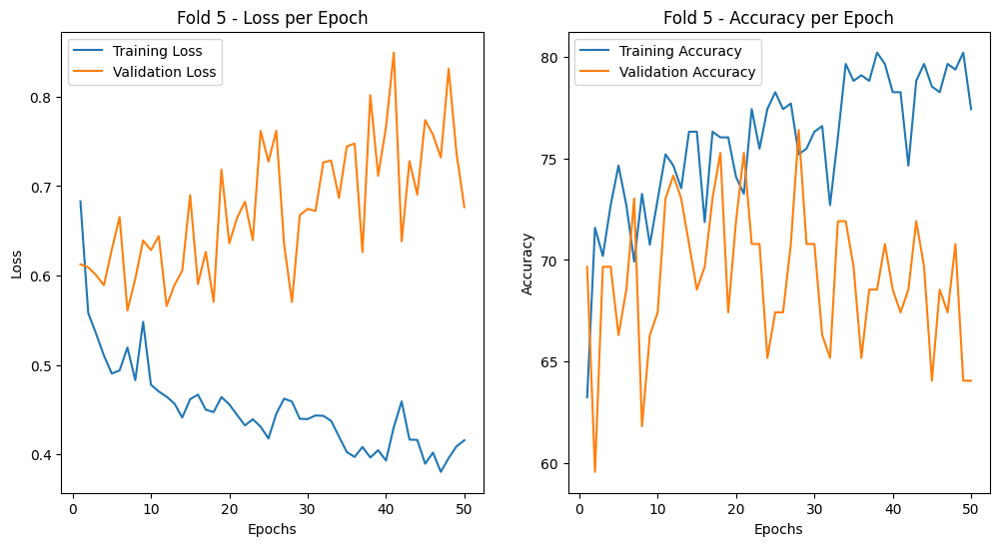

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.4306 - Train Accuracy: 75.70%
           - Validation Loss: 0.6299 - Validation Accuracy: 68.89%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.4128 - Train Accuracy: 79.05%
           - Validation Loss: 0.6171 - Validation Accuracy: 66.67%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.3802 - Train Accuracy: 80.73%
           - Validation Loss: 0.7313 - Validation Accuracy: 65.56%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.3735 - Train Accuracy: 81.62%
           - Validation Loss: 0.6848 - Validation Accuracy: 68.54%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.4158 - Train Accuracy: 77.44%
    

In [42]:
# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Store results for each fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Create directory to save models if not exists
os.makedirs('tuning_spectral_transformer_decoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Split data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Create TensorDataset for train and validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=16, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=16, shuffle=False)

    # Initialize model and optimizer for each fold
    model = TransformerDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Store loss and accuracy per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop for this fold
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluate on validation data
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Save loss and accuracy per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Save model
    model_filename = f'tuning_spectral_transformer_decoder/transformer_decoder_model_tuning_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot loss and accuracy graphs
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Display final results
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')

In [43]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_spectral_transformer_decoder/transformer_decoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1895158883.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.68      0.77      0.72        47
      Normal       0.70      0.60      0.65        43

    accuracy                           0.69        90
   macro avg       0.69      0.69      0.69        90
weighted avg       0.69      0.69      0.69        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.71      0.62      0.66        47
      Normal       0.63      0.72      0.67        43

    accuracy                           0.67        90
   macro avg       0.67      0.67      0.67        90
weighted avg       0.67      0.67      0.67        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1895158883.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.63      0.64      0.64        42
      Normal       0.68      0.67      0.67        48

    accuracy                           0.66        90
   macro avg       0.65      0.65      0.65        90
weighted avg       0.66      0.66      0.66        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.65      0.74      0.69        42
      Normal       0.73      0.64      0.68        47

    accuracy                           0.69        89
   macro avg       0.69      0.69      0.69        89
weighted avg       0.69      0.69      0.69        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1895158883.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.60      0.62      0.61        40
      Normal       0.68      0.65      0.67        49

    accuracy                           0.64        89
   macro avg       0.64      0.64      0.64        89
weighted avg       0.64      0.64      0.64        89

--------------------------------------------------------------------------------


In [46]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_spectral_transformer_decoder/transformer_decoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3145115796.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Metrics for Fold 1
Accuracy: 0.6889
Precision: 0.6910
F1-Score: 0.6850
Sensitivity (Recall for MI): 0.6047
Specificity (True Negative Rate): 0.7660
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3145115796.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Metrics for Fold 2
Accuracy: 0.6667
Precision: 0.6700
F1-Score: 0.6665
Sensitivity (Recall for MI): 0.7209
Specificity (True Negative Rate): 0.6170
--------------------------------------------------------------------------------
Metrics for Fold 3
Accuracy: 0.6556
Precision: 0.6544
F1-Score: 0.6545
Sensitivity (Recall for MI): 0.6667
Specificity (True Negative Rate): 0.6429
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3145115796.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 4
Accuracy: 0.6854
Precision: 0.6888
F1-Score: 0.6854
Sensitivity (Recall for MI): 0.6383
Specificity (True Negative Rate): 0.7381
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.6404
Precision: 0.6380
F1-Score: 0.6382
Sensitivity (Recall for MI): 0.6531
Specificity (True Negative Rate): 0.6250
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3145115796.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\541155724.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


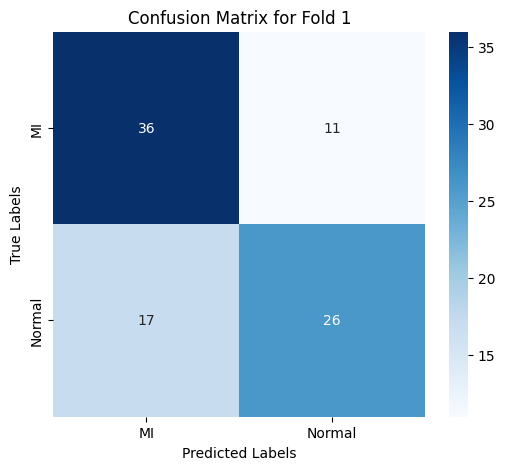

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\541155724.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


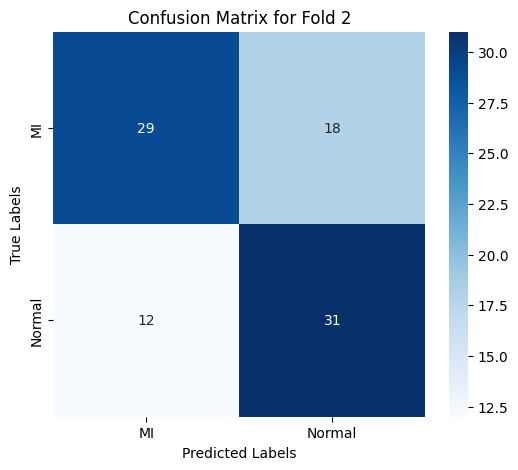

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\541155724.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


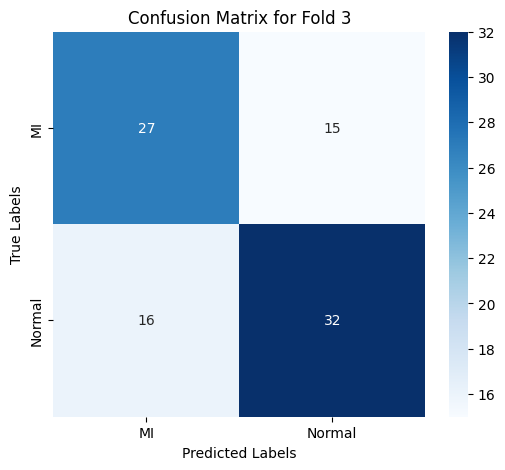

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\541155724.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


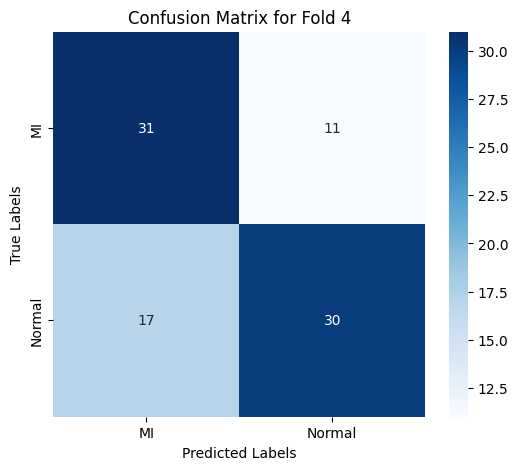

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\541155724.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


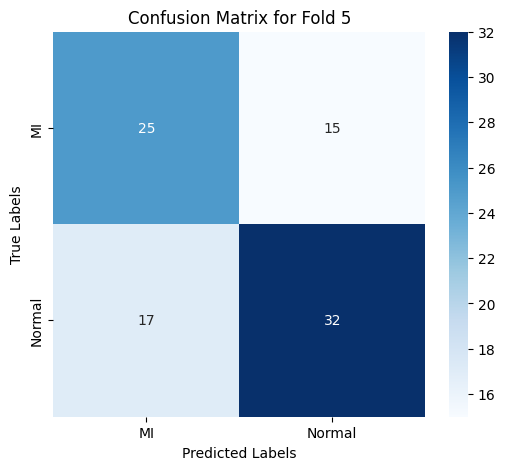

--------------------------------------------------------------------------------


In [45]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_spectral_transformer_decoder/transformer_decoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)

## (Tuning) Temporal with Transformer Decoder

In [47]:
selected_columns = ['Entropy', 'Wavelet Means', 'Wavelet std', 'Wavelet max', 'Wavelet min', 'Med_wavelet', 'Var_wavelet', 'Skew_wavelet', 'Q1_wavelet', 'Q3_wavelet', 'IQR_wavelet', 'MinMax_wavelet', 'Kurt_wavelet', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_temporal = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_temporal.head())

    Entropy  Wavelet Means  Wavelet std  Wavelet max  Wavelet min  \
0  0.063608      -1.137174    -0.430682     0.024031     0.004692   
1  0.064888      -0.388901    -0.565070    -0.549047     0.441349   
2  0.063367       0.180394    -0.112938    -0.376300     0.355416   
3  0.068559       0.408853     1.567008     1.825143    -0.973889   
4  0.062193      -0.404628    -0.506024    -0.423697     0.363664   

   Med_wavelet  Var_wavelet  Skew_wavelet  Q1_wavelet  Q3_wavelet  \
0    -0.889833    -0.218548      1.146071   -0.076698    0.026616   
1    -0.241600    -0.239203     -0.594643    0.178925   -0.172615   
2     1.042363    -0.151908     -0.491310   -0.838081    0.944422   
3     0.205136     0.616326      2.953232   -0.848416    0.973499   
4     0.454240    -0.230679     -0.101673   -0.313961    0.340572   

   IQR_wavelet  MinMax_wavelet  Kurt_wavelet Label  
0     0.051833        0.226780      1.470453    MI  
1    -0.176615       -0.536473     -0.367429    MI  
2     0.895

In [48]:
X = df_temporal.drop('Label', axis=1).values
y = df_temporal['Label'].values

In [49]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [51]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


class TransformerDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerDecoderModel, self).__init__()
        # Embed input sesuai dengan input_dim yang sesuai dari data
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Adding an encoder representation as memory for the decoder
        self.memory_projection = nn.Linear(dim_feedforward, dim_feedforward)

        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        # Embed input
        x = self.embedding(x)

        # Ensure proper shape for sequence dimension
        x = x.unsqueeze(0)  # Adding sequence dimension

        # Prepare memory
        memory = self.memory_projection(x)

        # Forward through TransformerDecoder with memory
        x = self.transformer_decoder(x, memory)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x



# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/50, Loss: 0.7458, Accuracy: 56.15%, Validation Loss: 0.6214, Validation Accuracy: 63.33%
Epoch 2/50, Loss: 0.5893, Accuracy: 68.72%, Validation Loss: 0.5580, Validation Accuracy: 64.44%
Epoch 3/50, Loss: 0.4908, Accuracy: 73.18%, Validation Loss: 0.3690, Validation Accuracy: 81.11%
Epoch 4/50, Loss: 0.3552, Accuracy: 83.24%, Validation Loss: 0.4651, Validation Accuracy: 80.00%
Epoch 5/50, Loss: 0.5315, Accuracy: 73.46%, Validation Loss: 0.3687, Validation Accuracy: 83.33%
Epoch 6/50, Loss: 0.3506, Accuracy: 82.68%, Validation Loss: 0.3278, Validation Accuracy: 84.44%
Epoch 7/50, Loss: 0.2829, Accuracy: 88.55%, Validation Loss: 0.3191, Validation Accuracy: 86.67%
Epoch 8/50, Loss: 0.2855, Accuracy: 88.27%, Validation Loss: 0.4625, Validation Accuracy: 77.78%
Epoch 9/50, Loss: 0.3381, Accuracy: 85.75%, Validation Loss: 0.3724, Validation Accuracy: 90.00%
Epoch 10/50, Loss: 0.3233, Accuracy: 85.47%, Validation Loss: 0.2963, Validation Accuracy: 86.67%
Epoch 11/50, Loss: 0.3

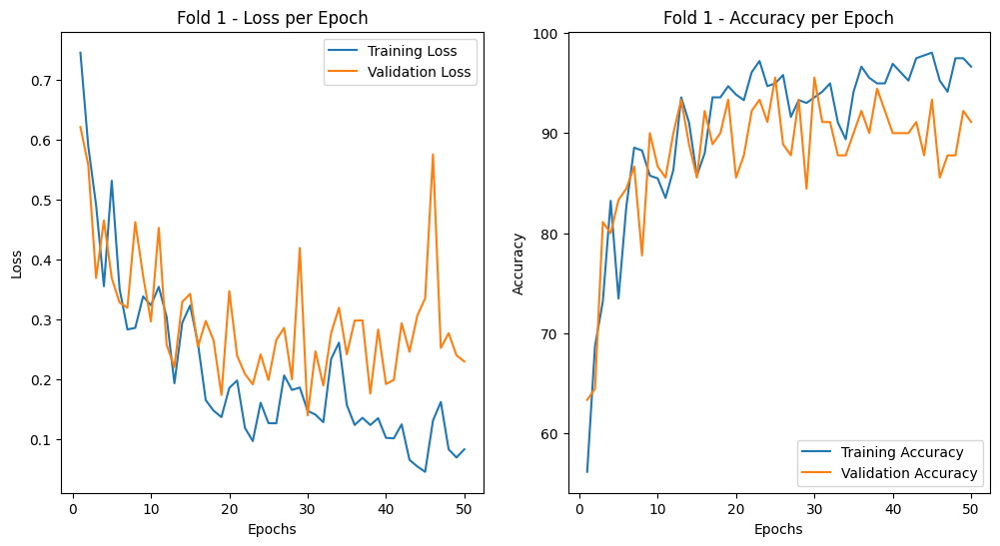

Fold 2
Epoch 1/50, Loss: 0.7526, Accuracy: 52.79%, Validation Loss: 0.6814, Validation Accuracy: 64.44%
Epoch 2/50, Loss: 0.6559, Accuracy: 63.41%, Validation Loss: 0.6245, Validation Accuracy: 66.67%
Epoch 3/50, Loss: 0.5129, Accuracy: 72.07%, Validation Loss: 0.5034, Validation Accuracy: 73.33%
Epoch 4/50, Loss: 0.4446, Accuracy: 78.77%, Validation Loss: 0.7138, Validation Accuracy: 55.56%
Epoch 5/50, Loss: 0.4103, Accuracy: 78.21%, Validation Loss: 0.3976, Validation Accuracy: 83.33%
Epoch 6/50, Loss: 0.3321, Accuracy: 86.03%, Validation Loss: 0.4271, Validation Accuracy: 82.22%
Epoch 7/50, Loss: 0.3698, Accuracy: 84.36%, Validation Loss: 0.4519, Validation Accuracy: 82.22%
Epoch 8/50, Loss: 0.2953, Accuracy: 88.55%, Validation Loss: 0.3567, Validation Accuracy: 84.44%
Epoch 9/50, Loss: 0.2190, Accuracy: 91.34%, Validation Loss: 0.4908, Validation Accuracy: 81.11%
Epoch 10/50, Loss: 0.3072, Accuracy: 87.43%, Validation Loss: 0.3593, Validation Accuracy: 83.33%
Epoch 11/50, Loss: 0.2

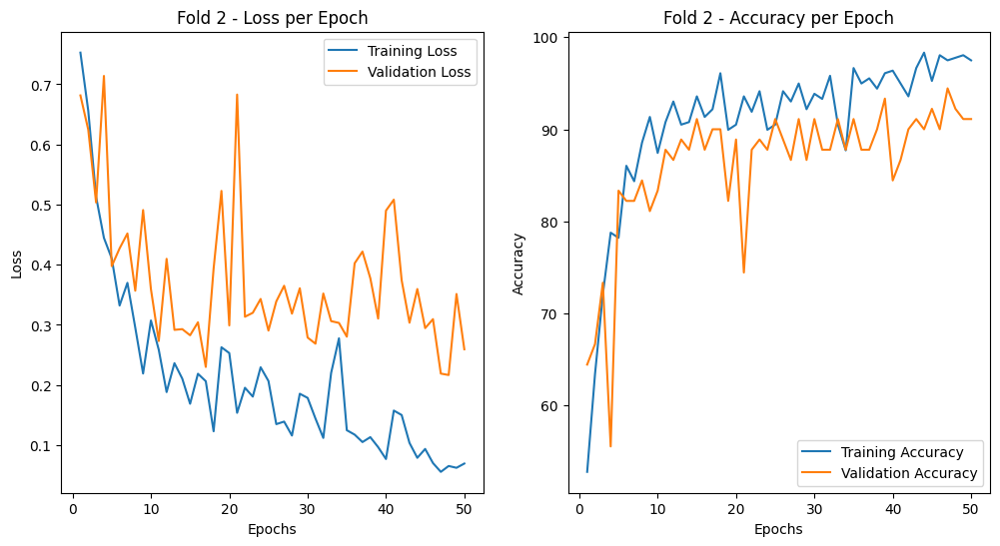

Fold 3
Epoch 1/50, Loss: 0.7971, Accuracy: 52.79%, Validation Loss: 0.6954, Validation Accuracy: 53.33%
Epoch 2/50, Loss: 0.6382, Accuracy: 61.73%, Validation Loss: 0.6088, Validation Accuracy: 66.67%
Epoch 3/50, Loss: 0.5243, Accuracy: 74.02%, Validation Loss: 0.4747, Validation Accuracy: 78.89%
Epoch 4/50, Loss: 0.4740, Accuracy: 78.49%, Validation Loss: 0.6962, Validation Accuracy: 63.33%
Epoch 5/50, Loss: 0.5796, Accuracy: 72.07%, Validation Loss: 0.4930, Validation Accuracy: 74.44%
Epoch 6/50, Loss: 0.3962, Accuracy: 81.84%, Validation Loss: 0.3586, Validation Accuracy: 84.44%
Epoch 7/50, Loss: 0.4136, Accuracy: 81.28%, Validation Loss: 0.5281, Validation Accuracy: 77.78%
Epoch 8/50, Loss: 0.3837, Accuracy: 81.56%, Validation Loss: 0.5355, Validation Accuracy: 76.67%
Epoch 9/50, Loss: 0.2893, Accuracy: 88.27%, Validation Loss: 0.3027, Validation Accuracy: 88.89%
Epoch 10/50, Loss: 0.2144, Accuracy: 91.34%, Validation Loss: 0.3678, Validation Accuracy: 90.00%
Epoch 11/50, Loss: 0.2

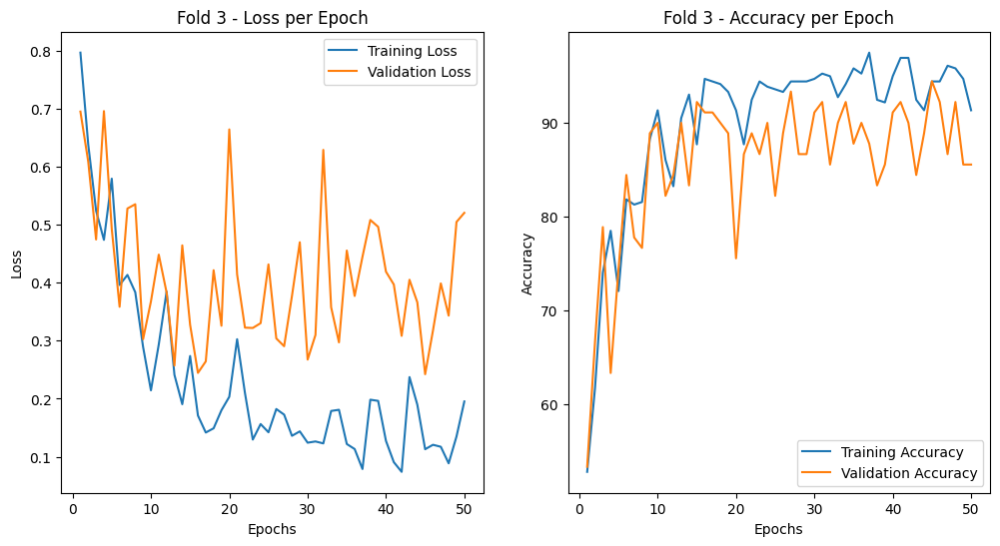

Fold 4
Epoch 1/50, Loss: 0.7340, Accuracy: 52.65%, Validation Loss: 0.7076, Validation Accuracy: 50.56%
Epoch 2/50, Loss: 0.6044, Accuracy: 66.02%, Validation Loss: 0.7119, Validation Accuracy: 59.55%
Epoch 3/50, Loss: 0.5138, Accuracy: 72.42%, Validation Loss: 0.5688, Validation Accuracy: 69.66%
Epoch 4/50, Loss: 0.4794, Accuracy: 76.04%, Validation Loss: 0.5682, Validation Accuracy: 66.29%
Epoch 5/50, Loss: 0.3983, Accuracy: 82.73%, Validation Loss: 0.5063, Validation Accuracy: 75.28%
Epoch 6/50, Loss: 0.2971, Accuracy: 87.74%, Validation Loss: 0.3687, Validation Accuracy: 84.27%
Epoch 7/50, Loss: 0.3392, Accuracy: 86.07%, Validation Loss: 0.4215, Validation Accuracy: 83.15%
Epoch 8/50, Loss: 0.3056, Accuracy: 87.47%, Validation Loss: 0.5110, Validation Accuracy: 82.02%
Epoch 9/50, Loss: 0.3682, Accuracy: 83.84%, Validation Loss: 0.6951, Validation Accuracy: 73.03%
Epoch 10/50, Loss: 0.3692, Accuracy: 84.96%, Validation Loss: 0.3365, Validation Accuracy: 86.52%
Epoch 11/50, Loss: 0.1

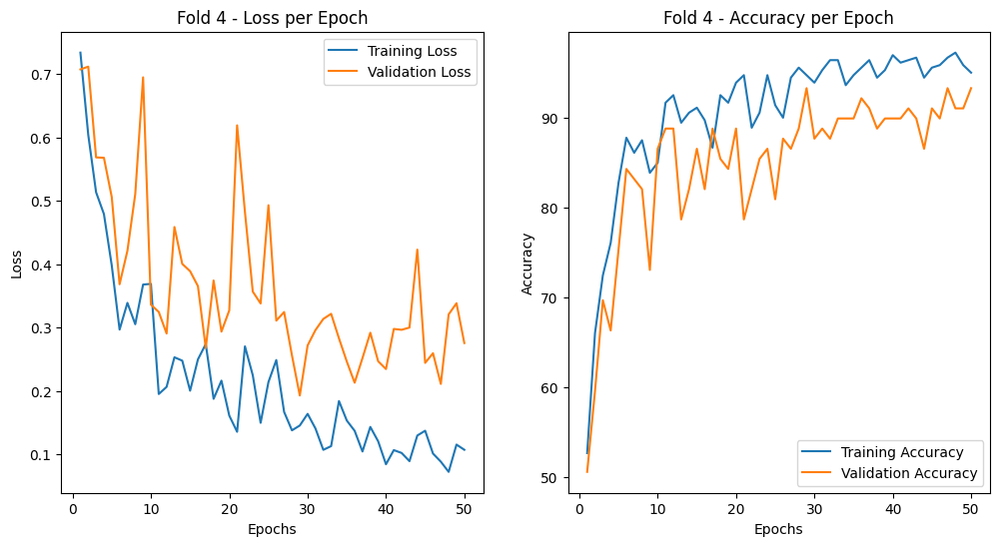

Fold 5
Epoch 1/50, Loss: 0.7845, Accuracy: 54.87%, Validation Loss: 0.6909, Validation Accuracy: 64.04%
Epoch 2/50, Loss: 0.6696, Accuracy: 60.45%, Validation Loss: 0.6244, Validation Accuracy: 56.18%
Epoch 3/50, Loss: 0.5672, Accuracy: 70.47%, Validation Loss: 0.5505, Validation Accuracy: 71.91%
Epoch 4/50, Loss: 0.4497, Accuracy: 77.44%, Validation Loss: 0.4563, Validation Accuracy: 78.65%
Epoch 5/50, Loss: 0.4438, Accuracy: 79.11%, Validation Loss: 0.5124, Validation Accuracy: 77.53%
Epoch 6/50, Loss: 0.4699, Accuracy: 77.99%, Validation Loss: 0.4804, Validation Accuracy: 75.28%
Epoch 7/50, Loss: 0.3978, Accuracy: 82.17%, Validation Loss: 0.4261, Validation Accuracy: 84.27%
Epoch 8/50, Loss: 0.3628, Accuracy: 84.68%, Validation Loss: 0.3125, Validation Accuracy: 86.52%
Epoch 9/50, Loss: 0.2398, Accuracy: 89.42%, Validation Loss: 0.2756, Validation Accuracy: 85.39%
Epoch 10/50, Loss: 0.2682, Accuracy: 86.91%, Validation Loss: 0.2687, Validation Accuracy: 87.64%
Epoch 11/50, Loss: 0.3

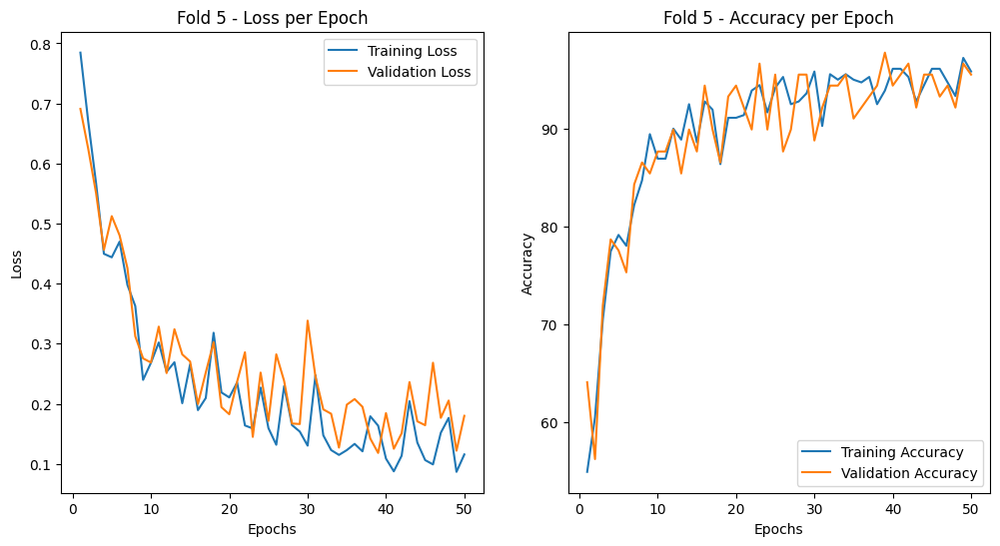

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.0825 - Train Accuracy: 96.65%
           - Validation Loss: 0.2293 - Validation Accuracy: 91.11%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.0693 - Train Accuracy: 97.49%
           - Validation Loss: 0.2593 - Validation Accuracy: 91.11%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.1952 - Train Accuracy: 91.34%
           - Validation Loss: 0.5207 - Validation Accuracy: 85.56%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.1075 - Train Accuracy: 94.99%
           - Validation Loss: 0.2759 - Validation Accuracy: 93.26%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.1157 - Train Accuracy: 95.82%
    

In [52]:
# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Store results for each fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Create directory to save models if not exists
os.makedirs('tuning_temporal_transformer_decoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Split data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Create TensorDataset for train and validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=16, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=16, shuffle=False)

    # Initialize model and optimizer for each fold
    model = TransformerDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Store loss and accuracy per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop for this fold
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluate on validation data
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Save loss and accuracy per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Save model
    model_filename = f'tuning_temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot loss and accuracy graphs
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Display final results
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')

In [53]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1883553945.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.93      0.89      0.91        47
      Normal       0.89      0.93      0.91        43

    accuracy                           0.91        90
   macro avg       0.91      0.91      0.91        90
weighted avg       0.91      0.91      0.91        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.88      0.96      0.92        47
      Normal       0.95      0.86      0.90        43

    accuracy                           0.91        90
   macro avg       0.92      0.91      0.91        90
weighted avg       0.91      0.91      0.91        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1883553945.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.84      0.86      0.85        42
      Normal       0.87      0.85      0.86        48

    accuracy                           0.86        90
   macro avg       0.85      0.86      0.86        90
weighted avg       0.86      0.86      0.86        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.88      1.00      0.93        42
      Normal       1.00      0.87      0.93        47

    accuracy                           0.93        89
   macro avg       0.94      0.94      0.93        89
weighted avg       0.94      0.93      0.93        89

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1883553945.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.95      0.95      0.95        40
      Normal       0.96      0.96      0.96        49

    accuracy                           0.96        89
   macro avg       0.95      0.95      0.95        89
weighted avg       0.96      0.96      0.96        89

--------------------------------------------------------------------------------


In [54]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1237479810.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 1
Accuracy: 0.9111
Precision: 0.9111
F1-Score: 0.9111
Sensitivity (Recall for MI): 0.9302
Specificity (True Negative Rate): 0.8936
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.9111
Precision: 0.9155
F1-Score: 0.9104
Sensitivity (Recall for MI): 0.8605
Specificity (True Negative Rate): 0.9574
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1237479810.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 3
Accuracy: 0.8556
Precision: 0.8548
F1-Score: 0.8551
Sensitivity (Recall for MI): 0.8542
Specificity (True Negative Rate): 0.8571
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.9326
Precision: 0.9375
F1-Score: 0.9326
Sensitivity (Recall for MI): 0.8723
Specificity (True Negative Rate): 1.0000
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.9551
Precision: 0.9546
F1-Score: 0.9546
Sensitivity (Recall for MI): 0.9592
Specificity (True Negative Rate): 0.9500
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1237479810.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3567692133.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


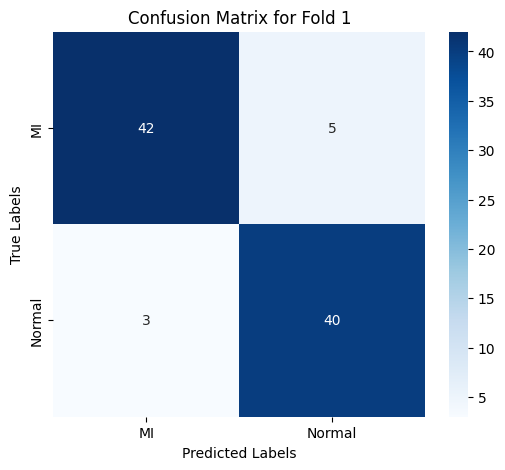

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3567692133.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


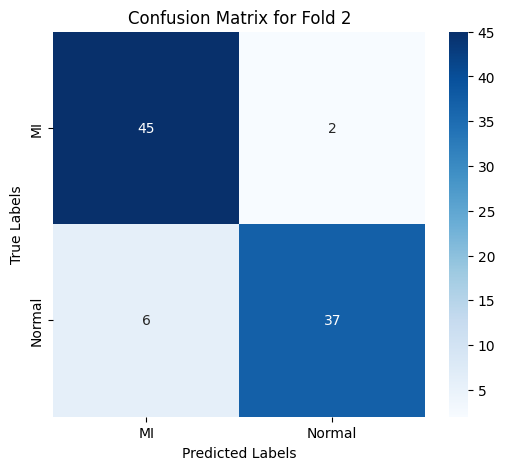

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3567692133.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


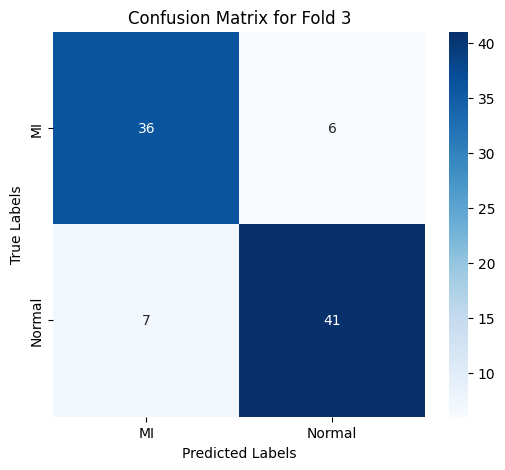

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3567692133.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


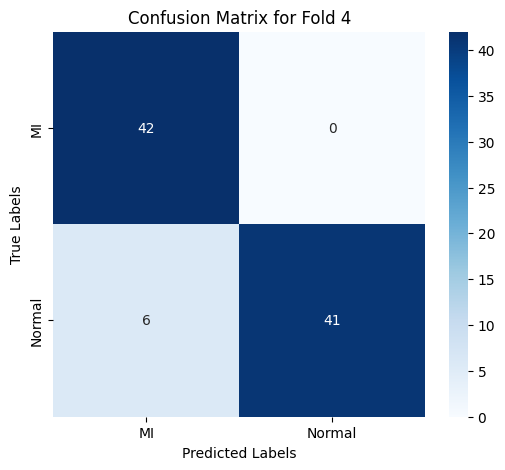

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3567692133.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


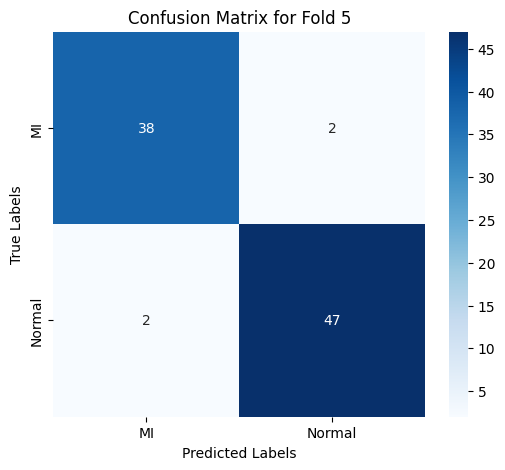

--------------------------------------------------------------------------------


In [55]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_temporal_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)


## (Tuning) Multi Scale with Transformer Decoder 

In [56]:
X = df_combine_scaled.drop('Label', axis=1).values
y = df_combine_scaled['Label'].values

In [57]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [58]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [59]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [60]:
# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


class TransformerDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_layers=2, dim_feedforward=128):
        super(TransformerDecoderModel, self).__init__()
        # Embed input sesuai dengan input_dim yang sesuai dari data
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Adding an encoder representation as memory for the decoder
        self.memory_projection = nn.Linear(dim_feedforward, dim_feedforward)

        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_layers
        )
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, x):
        # Embed input
        x = self.embedding(x)

        # Ensure proper shape for sequence dimension
        x = x.unsqueeze(0)  # Adding sequence dimension

        # Prepare memory
        memory = self.memory_projection(x)

        # Forward through TransformerDecoder with memory
        x = self.transformer_decoder(x, memory)
        x = x.squeeze(0)  # Remove the sequence dimension after processing
        x = self.fc(x)
        return x



# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1
Epoch 1/50, Loss: 0.7127, Accuracy: 60.89%, Validation Loss: 0.5252, Validation Accuracy: 72.22%
Epoch 2/50, Loss: 0.4676, Accuracy: 77.09%, Validation Loss: 0.4505, Validation Accuracy: 80.00%
Epoch 3/50, Loss: 0.3822, Accuracy: 82.68%, Validation Loss: 0.4075, Validation Accuracy: 78.89%
Epoch 4/50, Loss: 0.2925, Accuracy: 89.39%, Validation Loss: 0.4124, Validation Accuracy: 80.00%
Epoch 5/50, Loss: 0.2857, Accuracy: 86.31%, Validation Loss: 0.3846, Validation Accuracy: 84.44%
Epoch 6/50, Loss: 0.2615, Accuracy: 89.39%, Validation Loss: 0.4279, Validation Accuracy: 82.22%
Epoch 7/50, Loss: 0.2267, Accuracy: 90.22%, Validation Loss: 0.3164, Validation Accuracy: 85.56%
Epoch 8/50, Loss: 0.1773, Accuracy: 94.41%, Validation Loss: 0.3282, Validation Accuracy: 81.11%
Epoch 9/50, Loss: 0.1812, Accuracy: 93.58%, Validation Loss: 0.3909, Validation Accuracy: 83.33%
Epoch 10/50, Loss: 0.1442, Accuracy: 94.13%, Validation Loss: 0.3131, Validation Accuracy: 88.89%
Epoch 11/50, Loss: 0.1

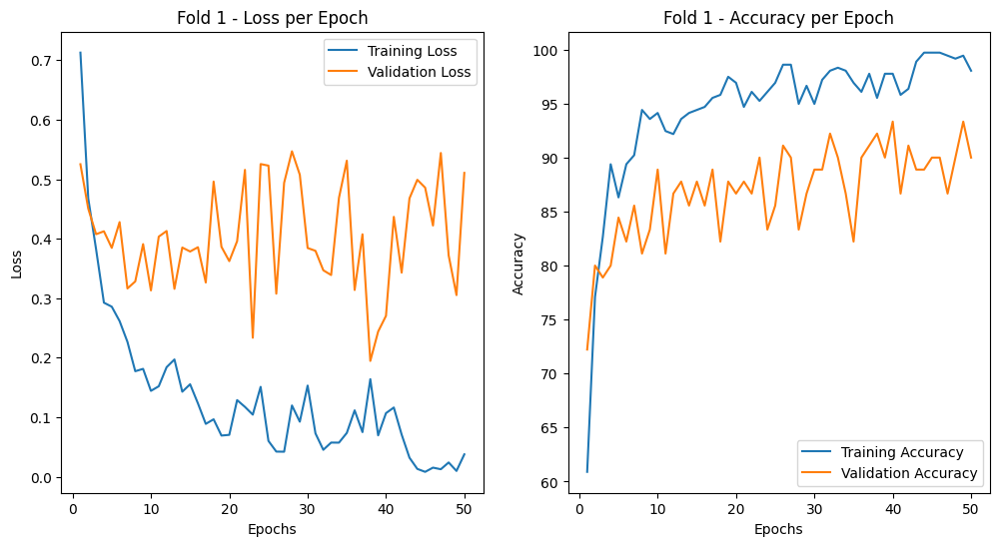

Fold 2
Epoch 1/50, Loss: 0.6699, Accuracy: 61.45%, Validation Loss: 0.6078, Validation Accuracy: 63.33%
Epoch 2/50, Loss: 0.5450, Accuracy: 70.39%, Validation Loss: 0.5717, Validation Accuracy: 75.56%
Epoch 3/50, Loss: 0.4534, Accuracy: 76.54%, Validation Loss: 0.4878, Validation Accuracy: 78.89%
Epoch 4/50, Loss: 0.3844, Accuracy: 82.12%, Validation Loss: 0.4411, Validation Accuracy: 82.22%
Epoch 5/50, Loss: 0.3201, Accuracy: 86.31%, Validation Loss: 0.3747, Validation Accuracy: 85.56%
Epoch 6/50, Loss: 0.3273, Accuracy: 86.03%, Validation Loss: 0.3588, Validation Accuracy: 85.56%
Epoch 7/50, Loss: 0.2476, Accuracy: 90.78%, Validation Loss: 0.3268, Validation Accuracy: 86.67%
Epoch 8/50, Loss: 0.2211, Accuracy: 90.78%, Validation Loss: 0.3500, Validation Accuracy: 85.56%
Epoch 9/50, Loss: 0.1837, Accuracy: 92.74%, Validation Loss: 0.2824, Validation Accuracy: 91.11%
Epoch 10/50, Loss: 0.1822, Accuracy: 92.74%, Validation Loss: 0.3310, Validation Accuracy: 87.78%
Epoch 11/50, Loss: 0.1

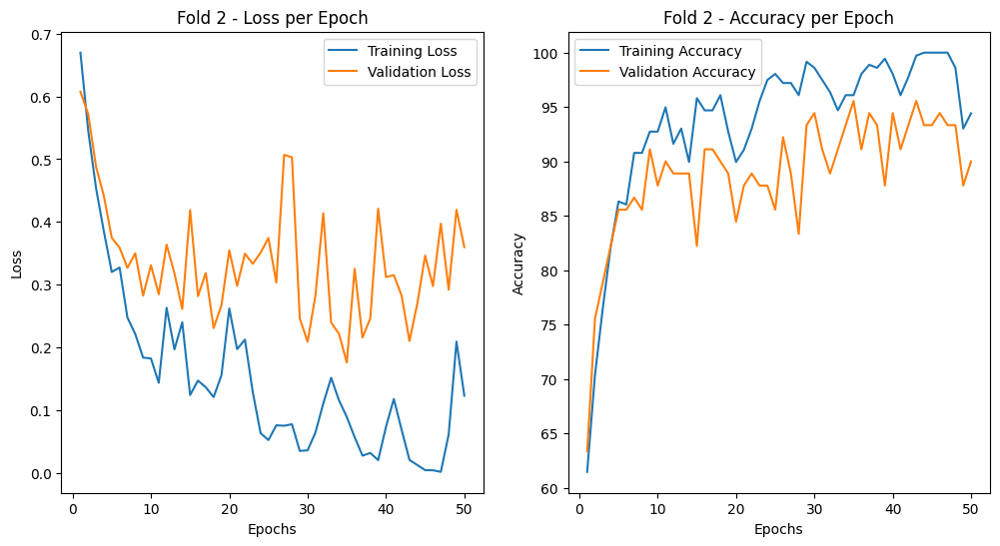

Fold 3
Epoch 1/50, Loss: 0.6154, Accuracy: 66.76%, Validation Loss: 0.6748, Validation Accuracy: 65.56%
Epoch 2/50, Loss: 0.4823, Accuracy: 75.14%, Validation Loss: 0.5311, Validation Accuracy: 75.56%
Epoch 3/50, Loss: 0.3917, Accuracy: 80.45%, Validation Loss: 0.4331, Validation Accuracy: 76.67%
Epoch 4/50, Loss: 0.3203, Accuracy: 84.08%, Validation Loss: 0.5099, Validation Accuracy: 76.67%
Epoch 5/50, Loss: 0.3721, Accuracy: 84.08%, Validation Loss: 0.2877, Validation Accuracy: 88.89%
Epoch 6/50, Loss: 0.2690, Accuracy: 91.62%, Validation Loss: 0.2408, Validation Accuracy: 91.11%
Epoch 7/50, Loss: 0.2295, Accuracy: 91.34%, Validation Loss: 0.2550, Validation Accuracy: 88.89%
Epoch 8/50, Loss: 0.1881, Accuracy: 92.74%, Validation Loss: 0.3219, Validation Accuracy: 84.44%
Epoch 9/50, Loss: 0.2005, Accuracy: 90.50%, Validation Loss: 0.2568, Validation Accuracy: 86.67%
Epoch 10/50, Loss: 0.1839, Accuracy: 92.46%, Validation Loss: 0.4089, Validation Accuracy: 86.67%
Epoch 11/50, Loss: 0.1

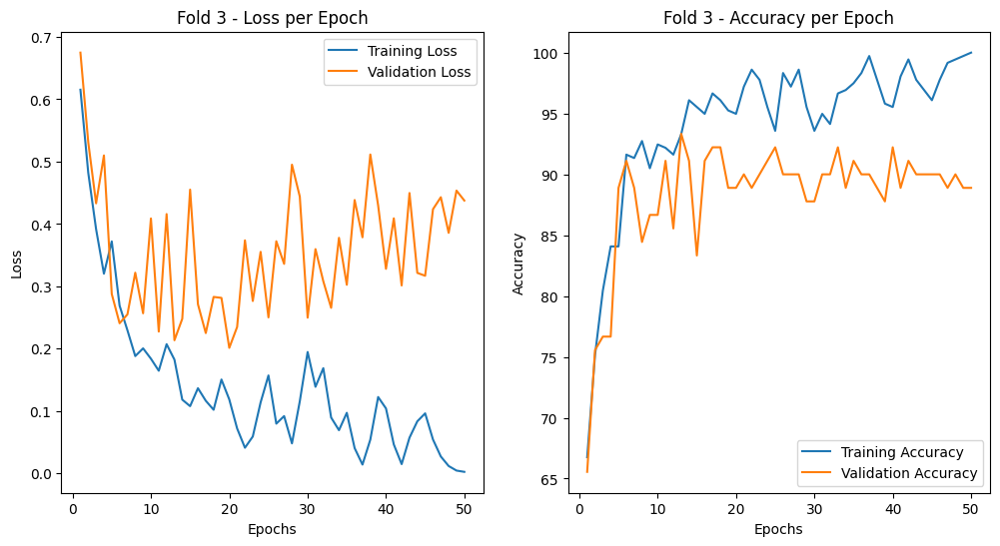

Fold 4
Epoch 1/50, Loss: 0.6624, Accuracy: 61.84%, Validation Loss: 0.6690, Validation Accuracy: 65.17%
Epoch 2/50, Loss: 0.5256, Accuracy: 77.16%, Validation Loss: 0.5204, Validation Accuracy: 68.54%
Epoch 3/50, Loss: 0.3982, Accuracy: 78.27%, Validation Loss: 0.5156, Validation Accuracy: 77.53%
Epoch 4/50, Loss: 0.3673, Accuracy: 82.73%, Validation Loss: 0.5177, Validation Accuracy: 75.28%
Epoch 5/50, Loss: 0.2934, Accuracy: 86.35%, Validation Loss: 0.5435, Validation Accuracy: 76.40%
Epoch 6/50, Loss: 0.2499, Accuracy: 89.97%, Validation Loss: 0.6267, Validation Accuracy: 70.79%
Epoch 7/50, Loss: 0.2566, Accuracy: 89.14%, Validation Loss: 0.5352, Validation Accuracy: 82.02%
Epoch 8/50, Loss: 0.2097, Accuracy: 93.04%, Validation Loss: 0.5722, Validation Accuracy: 84.27%
Epoch 9/50, Loss: 0.2856, Accuracy: 87.74%, Validation Loss: 0.4676, Validation Accuracy: 82.02%
Epoch 10/50, Loss: 0.1637, Accuracy: 93.87%, Validation Loss: 0.4810, Validation Accuracy: 84.27%
Epoch 11/50, Loss: 0.1

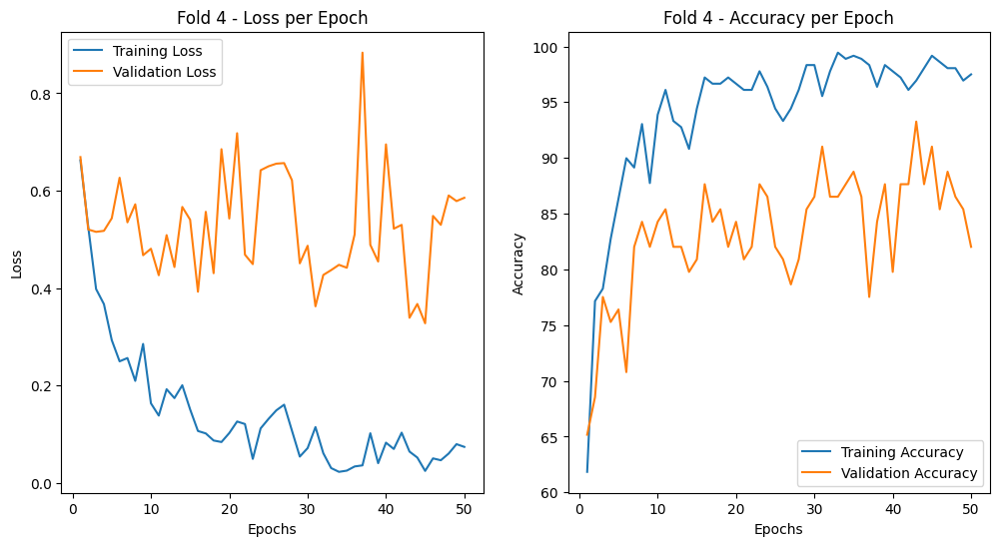

Fold 5
Epoch 1/50, Loss: 0.6459, Accuracy: 65.74%, Validation Loss: 0.6207, Validation Accuracy: 61.80%
Epoch 2/50, Loss: 0.5227, Accuracy: 72.98%, Validation Loss: 0.5080, Validation Accuracy: 76.40%
Epoch 3/50, Loss: 0.4498, Accuracy: 78.83%, Validation Loss: 0.4224, Validation Accuracy: 77.53%
Epoch 4/50, Loss: 0.3687, Accuracy: 84.96%, Validation Loss: 0.4308, Validation Accuracy: 76.40%
Epoch 5/50, Loss: 0.3088, Accuracy: 86.91%, Validation Loss: 0.4003, Validation Accuracy: 83.15%
Epoch 6/50, Loss: 0.2755, Accuracy: 88.30%, Validation Loss: 0.4710, Validation Accuracy: 80.90%
Epoch 7/50, Loss: 0.2346, Accuracy: 90.53%, Validation Loss: 0.5517, Validation Accuracy: 82.02%
Epoch 8/50, Loss: 0.2449, Accuracy: 90.53%, Validation Loss: 0.3819, Validation Accuracy: 86.52%
Epoch 9/50, Loss: 0.2212, Accuracy: 91.64%, Validation Loss: 0.4370, Validation Accuracy: 86.52%
Epoch 10/50, Loss: 0.1837, Accuracy: 93.04%, Validation Loss: 0.3211, Validation Accuracy: 86.52%
Epoch 11/50, Loss: 0.2

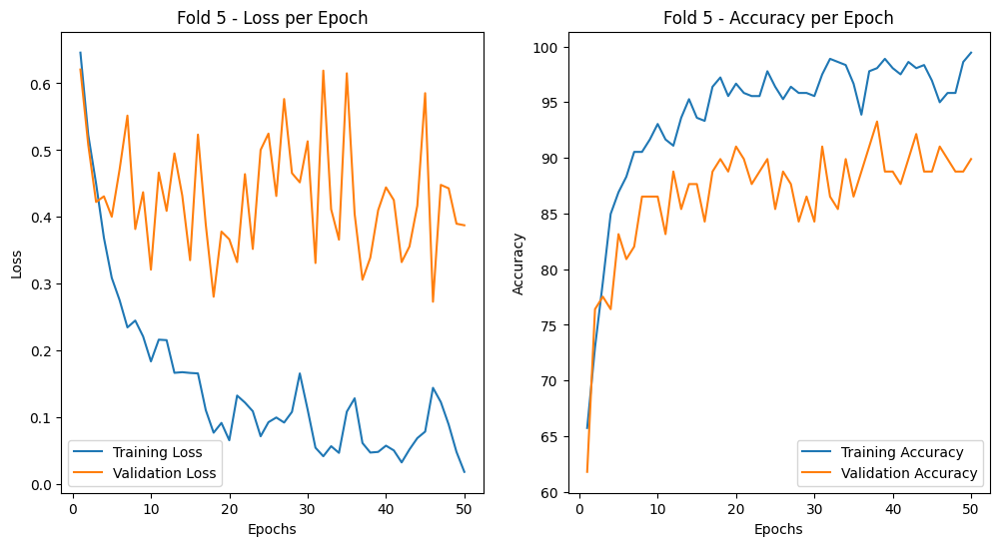

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.0376 - Train Accuracy: 98.04%
           - Validation Loss: 0.5106 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.1228 - Train Accuracy: 94.41%
           - Validation Loss: 0.3598 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.0024 - Train Accuracy: 100.00%
           - Validation Loss: 0.4376 - Validation Accuracy: 88.89%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.0743 - Train Accuracy: 97.49%
           - Validation Loss: 0.5855 - Validation Accuracy: 82.02%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.0184 - Train Accuracy: 99.44%
   

In [61]:
# Initialize KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Store results for each fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Create directory to save models if not exists
os.makedirs('tuning_multi_scale_transformer_decoder', exist_ok=True)

for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Split data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Create TensorDataset for train and validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=16, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=16, shuffle=False)

    # Initialize model and optimizer for each fold
    model = TransformerDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Store loss and accuracy per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop for this fold
    num_epochs = 50
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluate on validation data
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Save loss and accuracy per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Save model
    model_filename = f'tuning_multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot loss and accuracy graphs
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Display final results
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')

In [62]:
import torch
from sklearn.metrics import classification_report

# Menampilkan classification report untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1984727263.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 1
              precision    recall  f1-score   support

          MI       0.93      0.87      0.90        47
      Normal       0.87      0.93      0.90        43

    accuracy                           0.90        90
   macro avg       0.90      0.90      0.90        90
weighted avg       0.90      0.90      0.90        90

--------------------------------------------------------------------------------
Classification Report for Fold 2
              precision    recall  f1-score   support

          MI       0.91      0.89      0.90        47
      Normal       0.89      0.91      0.90        43

    accuracy                           0.90        90
   macro avg       0.90      0.90      0.90        90
weighted avg       0.90      0.90      0.90        90

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1984727263.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\as

Classification Report for Fold 3
              precision    recall  f1-score   support

          MI       0.82      0.98      0.89        42
      Normal       0.97      0.81      0.89        48

    accuracy                           0.89        90
   macro avg       0.90      0.89      0.89        90
weighted avg       0.90      0.89      0.89        90

--------------------------------------------------------------------------------
Classification Report for Fold 4
              precision    recall  f1-score   support

          MI       0.80      0.83      0.81        42
      Normal       0.84      0.81      0.83        47

    accuracy                           0.82        89
   macro avg       0.82      0.82      0.82        89
weighted avg       0.82      0.82      0.82        89

--------------------------------------------------------------------------------
Classification Report for Fold 5
              precision    recall  f1-score   support

          MI       0.92      0

C:\Users\asus\AppData\Local\Temp\ipykernel_16932\1984727263.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


In [63]:
import torch
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Menampilkan metrik untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3145425574.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 1
Accuracy: 0.9000
Precision: 0.9007
F1-Score: 0.9000
Sensitivity (Recall for MI): 0.9302
Specificity (True Negative Rate): 0.8723
--------------------------------------------------------------------------------
Metrics for Fold 2
Accuracy: 0.9000
Precision: 0.8997
F1-Score: 0.8999
Sensitivity (Recall for MI): 0.9070
Specificity (True Negative Rate): 0.8936
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3145425574.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Metrics for Fold 3
Accuracy: 0.8889
Precision: 0.8975
F1-Score: 0.8888
Sensitivity (Recall for MI): 0.8125
Specificity (True Negative Rate): 0.9762
--------------------------------------------------------------------------------
Metrics for Fold 4
Accuracy: 0.8202
Precision: 0.8199
F1-Score: 0.8200
Sensitivity (Recall for MI): 0.8085
Specificity (True Negative Rate): 0.8333
--------------------------------------------------------------------------------
Metrics for Fold 5
Accuracy: 0.8989
Precision: 0.9018
F1-Score: 0.8970
Sensitivity (Recall for MI): 0.9388
Specificity (True Negative Rate): 0.8500
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3145425574.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2706575696.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


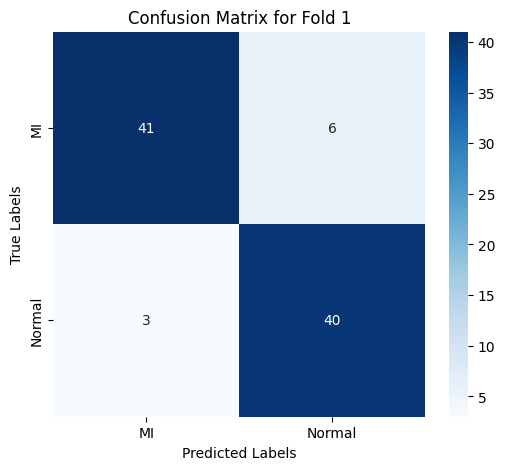

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2706575696.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


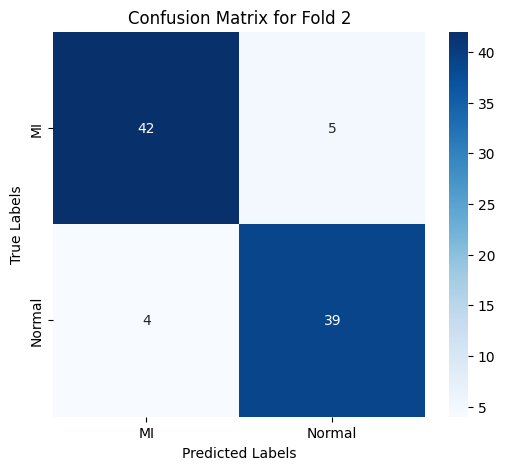

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2706575696.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


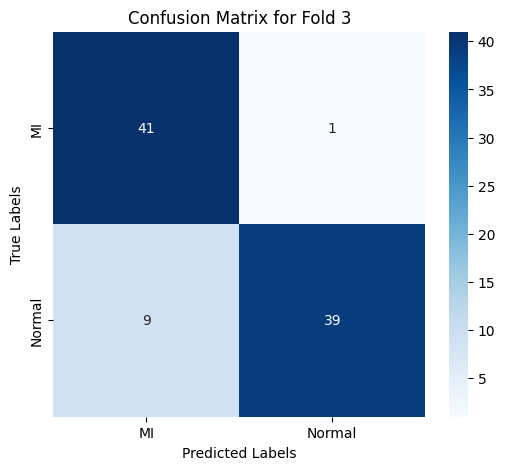

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2706575696.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


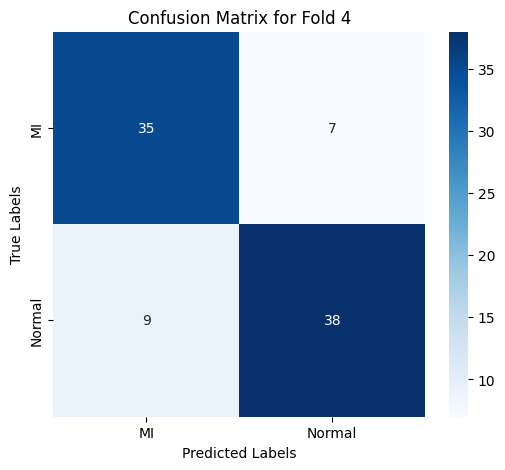

--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2706575696.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


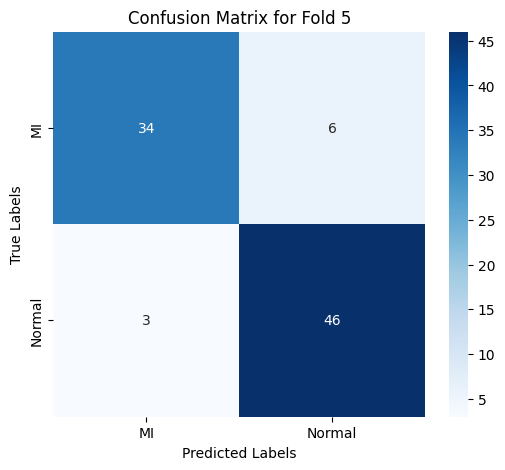

--------------------------------------------------------------------------------


In [64]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, kf.get_n_splits() + 1):
    # Load model yang telah disimpan
    model_filename = f'tuning_multi_scale_transformer_decoder/transformer_decoder_model_fold_{fold_no}.pth'
    model = TransformerDecoderModel(input_dim, num_classes)
    model.load_state_dict(torch.load(model_filename))
    model.eval()

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Inference untuk data validasi
    val_outputs = []
    val_labels = []
    with torch.no_grad():
        for i in range(len(X_val_fold)):
            output = model(X_val_fold[i].unsqueeze(0))  # Tambahkan dimensi batch
            val_outputs.append(torch.argmax(output, dim=1).item())
            val_labels.append(y_val_fold[i].item())

    # Menampilkan confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['MI', 'Normal'], yticklabels=['MI', 'Normal'])
    plt.title(f'Confusion Matrix for Fold {fold_no}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    print('-' * 80)

## (Tuning) Spectral with Transformer Encoder Decoder 

In [ ]:
# Hyperparameter yang ingin dicoba
param_grid = {
    'batch_size': [8, 16, 32, 64],
    'num_epochs': [10, 20, 50, 100]
}

# Semua kombinasi hyperparameter
param_combinations = list(itertools.product(param_grid['batch_size'], param_grid['num_epochs']))

# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Fungsi untuk training dan evaluasi model
def train_and_evaluate_model(batch_size, num_epochs):
    fold_no = 1
    val_accuracy_per_fold = []

    for train_index, val_index in kf.split(X_train_tensor):
        print(f'Fold {fold_no}')

        # Membagi data
        X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
        y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

        # Membuat TensorDataset untuk train dan validation fold
        train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
        val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

        # DataLoader
        train_loader_fold = DataLoader(train_dataset_fold, batch_size=batch_size, shuffle=True)
        val_loader_fold = DataLoader(val_dataset_fold, batch_size=batch_size, shuffle=False)

        # Inisialisasi model dan optimizer untuk setiap fold
        model = TransformerEncoderDecoderModel(input_dim, num_classes)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        # Training loop untuk fold ini
        for epoch in range(num_epochs):
            model.train()
            running_loss = 0.0
            correct_train = 0
            total_train = 0

            for X_batch, y_batch in train_loader_fold:
                optimizer.zero_grad()
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_train += y_batch.size(0)
                correct_train += (predicted == y_batch).sum().item()

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_accuracy = 100 * correct_val / total_val
        val_accuracy_per_fold.append(val_accuracy)
        fold_no += 1

    # Rata-rata akurasi validasi per fold
    avg_val_accuracy = np.mean(val_accuracy_per_fold)

    return avg_val_accuracy

# Melakukan Grid Search
best_accuracy = 0
best_params = None

start_time = time.time()

for (batch_size, num_epochs) in param_combinations:
    print(f'Trying hyperparameters: batch_size={batch_size}, num_epochs={num_epochs}')
    val_accuracy = train_and_evaluate_model(batch_size, num_epochs)
    print(f'Validation Accuracy: {val_accuracy:.2f}%')

    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = (batch_size, num_epochs)

end_time = time.time()

print('Best Hyperparameters:')
print(f'Batch Size: {best_params[0]}, Epochs: {best_params[1]}')
print(f'Best Validation Accuracy: {best_accuracy:.2f}%')
print(f'Total Time Taken: {end_time - start_time:.2f} seconds')

Trying hyperparameters: batch_size=8, num_epochs=10
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 77.00%
Trying hyperparameters: batch_size=8, num_epochs=20
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 77.88%
Trying hyperparameters: batch_size=8, num_epochs=50
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 87.05%
Trying hyperparameters: batch_size=8, num_epochs=100
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 87.50%
Trying hyperparameters: batch_size=16, num_epochs=10
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 82.14%
Trying hyperparameters: batch_size=16, num_epochs=20
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 84.83%
Trying hyperparameters: batch_size=16, num_epochs=50
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 86.82%
Trying hyperparameters: batch_size=16, num_epochs=100
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Validation Accuracy: 89.28%
Trying hyperparameters: batch_size=32, num_epochs=10
Fold 1
Fold 2
Fold 3


In [65]:
selected_columns = ['MFCC Means', 'MFCC std', 'MFCC max', 'MFCC min', 'Med_mfcc', 'Var_mfcc', 'Skew_mfcc', 'Q1_mfcc', 'Q3_mfcc', 'IQR_mfcc', 'MinMax_mfcc', 'Kurt_mfcc', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_spectral = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_spectral.head())

   MFCC Means  MFCC std  MFCC max  MFCC min  Med_mfcc  Var_mfcc  Skew_mfcc  \
0    0.805298 -0.893321  0.727190  0.942132 -0.598371 -0.921706  -0.321473   
1   -0.228878  0.601932 -2.114222 -0.483793  1.257240  0.594724  -0.971689   
2    0.629472 -0.027778 -0.754010  0.036559  2.398342 -0.062456  -0.766293   
3    1.530227 -1.566485  1.255310  1.583813 -0.171921 -1.554723  -0.653024   
4   -0.680597  0.530428 -0.464613 -0.596863  0.842127  0.518742  -0.035472   

    Q1_mfcc   Q3_mfcc  IQR_mfcc  MinMax_mfcc  Kurt_mfcc Label  
0  0.734321 -0.816269 -1.060130    -0.538695   0.334547    MI  
1  0.669311  0.773221  0.321963    -0.347450   0.964492    MI  
2  0.749218  1.135122  0.589301    -0.301331   0.758335    MI  
3  0.715255 -0.219460 -0.543864    -0.893826   0.690955    MI  
4 -0.499815  0.770667  0.904191     0.339870   0.007908    MI  


In [66]:
X = df_spectral.drop('Label', axis=1).values
y = df_spectral['Label'].values

In [67]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [69]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt


# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [70]:
# Definisikan Model dengan Encoder dan Decoder
class TransformerEncoderDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_encoder_layers=3, num_decoder_layers=3, dim_feedforward=128):
        super(TransformerEncoderDecoderModel, self).__init__()

        # Embedding untuk input dan target
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Transformer Encoder
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_encoder_layers
        )

        # Transformer Decoder
        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_decoder_layers
        )

        # Linear layer untuk mengubah output decoder menjadi logits
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, src, tgt):
        # src: input data (e.g., features or sequences)
        # tgt: target sequence (e.g., labels or tokens)

        # Encode the source input
        src = self.embedding(src)
        memory = self.transformer_encoder(src.unsqueeze(1))  # Add sequence dim if needed

        # Decode the target input
        tgt = self.embedding(tgt)
        output = self.transformer_decoder(tgt.unsqueeze(1), memory)  # Pass tgt and memory to decoder

        # Final output layer (logits)
        output = self.fc(output.squeeze(1))  # Squeeze sequence dimension

        return output

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/100, Loss: 0.7800, Accuracy: 58.66%, Validation Loss: 0.5824, Validation Accuracy: 70.00%
Epoch 2/100, Loss: 0.6206, Accuracy: 67.04%, Validation Loss: 0.5730, Validation Accuracy: 71.11%
Epoch 3/100, Loss: 0.6193, Accuracy: 64.80%, Validation Loss: 0.5758, Validation Accuracy: 71.11%
Epoch 4/100, Loss: 0.5983, Accuracy: 67.60%, Validation Loss: 0.5805, Validation Accuracy: 64.44%
Epoch 5/100, Loss: 0.5545, Accuracy: 70.11%, Validation Loss: 0.5881, Validation Accuracy: 71.11%
Epoch 6/100, Loss: 0.5601, Accuracy: 67.32%, Validation Loss: 0.5612, Validation Accuracy: 74.44%
Epoch 7/100, Loss: 0.5475, Accuracy: 72.07%, Validation Loss: 0.5414, Validation Accuracy: 74.44%
Epoch 8/100, Loss: 0.5274, Accuracy: 71.51%, Validation Loss: 0.6461, Validation Accuracy: 70.00%
Epoch 9/100, Loss: 0.5428, Accuracy: 68.99%, Validation Loss: 0.5473, Validation Accuracy: 74.44%
Epoch 10/100, Loss: 0.4954, Accuracy: 75.42%, Validation Loss: 0.6056, Validation Accuracy: 67.78%
Epoch 11/100, Loss:

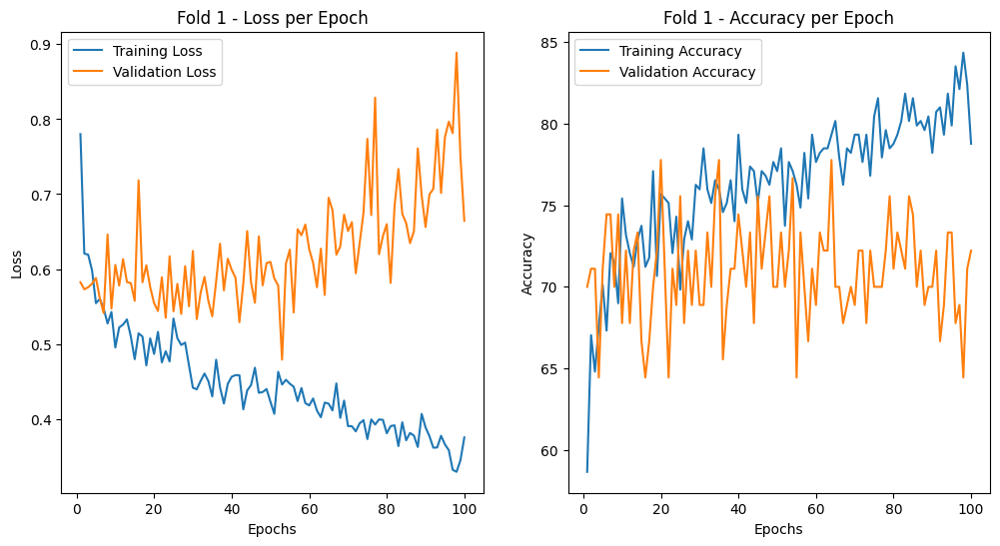

Fold 2
Epoch 1/100, Loss: 0.8286, Accuracy: 48.04%, Validation Loss: 0.6994, Validation Accuracy: 47.78%
Epoch 2/100, Loss: 0.6760, Accuracy: 59.50%, Validation Loss: 0.7364, Validation Accuracy: 48.89%
Epoch 3/100, Loss: 0.6321, Accuracy: 63.41%, Validation Loss: 0.5924, Validation Accuracy: 71.11%
Epoch 4/100, Loss: 0.6106, Accuracy: 65.92%, Validation Loss: 0.5515, Validation Accuracy: 73.33%
Epoch 5/100, Loss: 0.5493, Accuracy: 71.51%, Validation Loss: 0.5617, Validation Accuracy: 75.56%
Epoch 6/100, Loss: 0.5608, Accuracy: 69.55%, Validation Loss: 0.5632, Validation Accuracy: 68.89%
Epoch 7/100, Loss: 0.5782, Accuracy: 68.99%, Validation Loss: 0.5612, Validation Accuracy: 71.11%
Epoch 8/100, Loss: 0.5496, Accuracy: 69.27%, Validation Loss: 0.5653, Validation Accuracy: 68.89%
Epoch 9/100, Loss: 0.5626, Accuracy: 69.83%, Validation Loss: 0.5299, Validation Accuracy: 75.56%
Epoch 10/100, Loss: 0.5286, Accuracy: 72.35%, Validation Loss: 0.5493, Validation Accuracy: 70.00%
Epoch 11/100

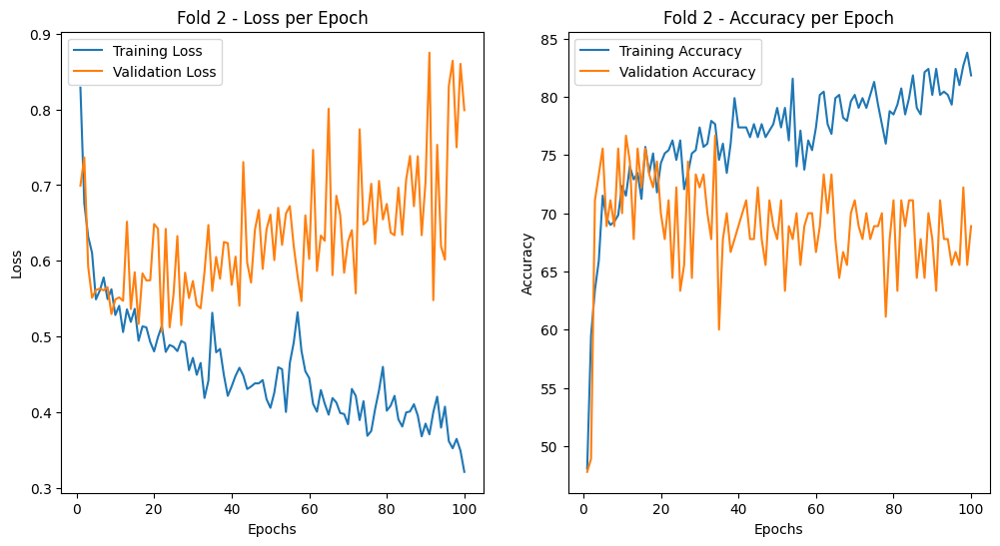

Fold 3
Epoch 1/100, Loss: 0.8883, Accuracy: 48.88%, Validation Loss: 0.6675, Validation Accuracy: 56.67%
Epoch 2/100, Loss: 0.6622, Accuracy: 57.26%, Validation Loss: 0.6397, Validation Accuracy: 62.22%
Epoch 3/100, Loss: 0.6236, Accuracy: 67.04%, Validation Loss: 0.6738, Validation Accuracy: 63.33%
Epoch 4/100, Loss: 0.5828, Accuracy: 68.44%, Validation Loss: 0.5940, Validation Accuracy: 57.78%
Epoch 5/100, Loss: 0.5751, Accuracy: 71.51%, Validation Loss: 0.6117, Validation Accuracy: 67.78%
Epoch 6/100, Loss: 0.5859, Accuracy: 70.11%, Validation Loss: 0.6014, Validation Accuracy: 62.22%
Epoch 7/100, Loss: 0.5422, Accuracy: 73.46%, Validation Loss: 0.6540, Validation Accuracy: 66.67%
Epoch 8/100, Loss: 0.5361, Accuracy: 73.46%, Validation Loss: 0.6208, Validation Accuracy: 65.56%
Epoch 9/100, Loss: 0.5321, Accuracy: 70.39%, Validation Loss: 0.5806, Validation Accuracy: 66.67%
Epoch 10/100, Loss: 0.5183, Accuracy: 74.86%, Validation Loss: 0.6586, Validation Accuracy: 62.22%
Epoch 11/100

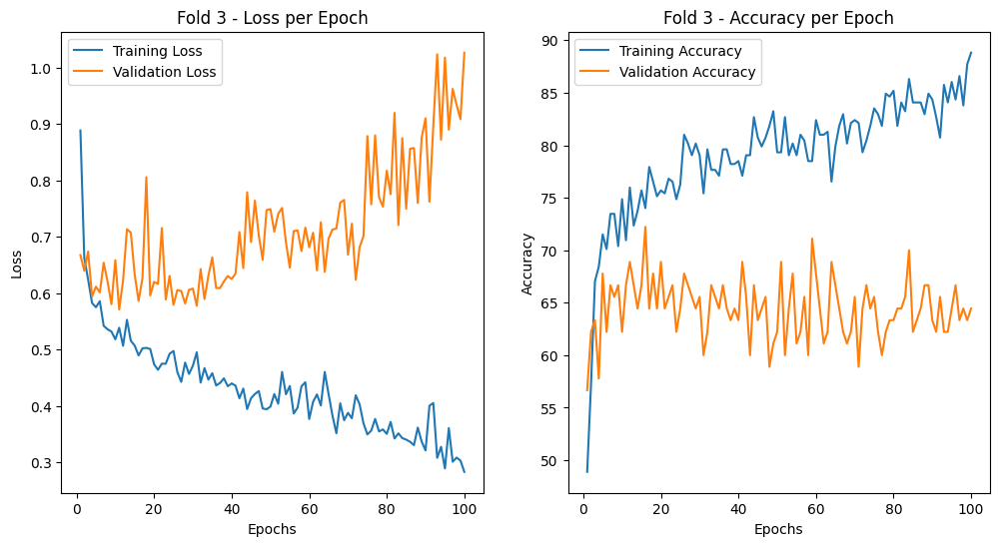

Fold 4
Epoch 1/100, Loss: 0.8005, Accuracy: 55.15%, Validation Loss: 0.6236, Validation Accuracy: 64.04%
Epoch 2/100, Loss: 0.6062, Accuracy: 64.90%, Validation Loss: 0.6197, Validation Accuracy: 70.79%
Epoch 3/100, Loss: 0.5812, Accuracy: 68.80%, Validation Loss: 0.6000, Validation Accuracy: 66.29%
Epoch 4/100, Loss: 0.6083, Accuracy: 66.02%, Validation Loss: 0.5474, Validation Accuracy: 66.29%
Epoch 5/100, Loss: 0.6072, Accuracy: 67.13%, Validation Loss: 0.6416, Validation Accuracy: 67.42%
Epoch 6/100, Loss: 0.5837, Accuracy: 70.47%, Validation Loss: 0.5618, Validation Accuracy: 67.42%
Epoch 7/100, Loss: 0.5321, Accuracy: 72.98%, Validation Loss: 0.5371, Validation Accuracy: 68.54%
Epoch 8/100, Loss: 0.5355, Accuracy: 70.75%, Validation Loss: 0.5878, Validation Accuracy: 66.29%
Epoch 9/100, Loss: 0.5373, Accuracy: 69.64%, Validation Loss: 0.5890, Validation Accuracy: 74.16%
Epoch 10/100, Loss: 0.5385, Accuracy: 72.14%, Validation Loss: 0.5022, Validation Accuracy: 79.78%
Epoch 11/100

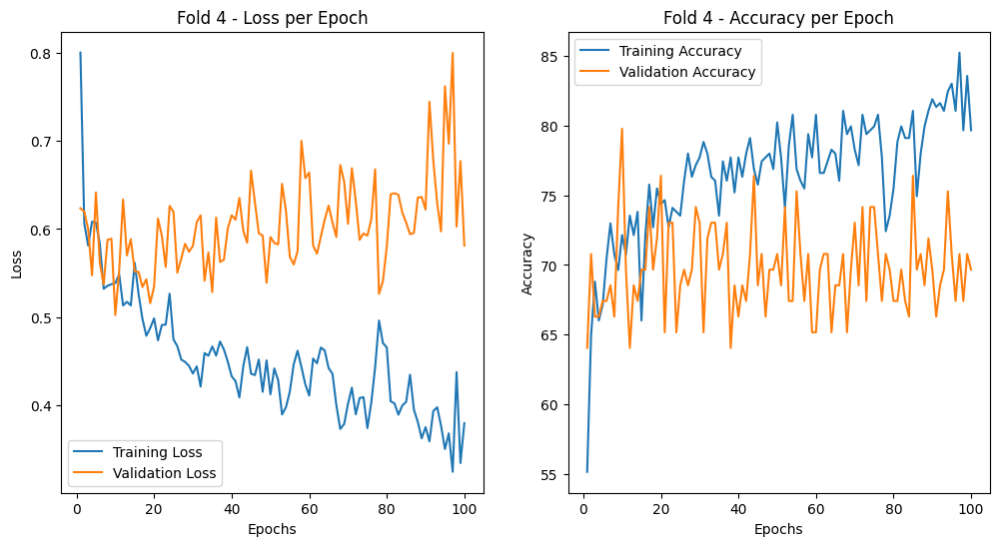

Fold 5
Epoch 1/100, Loss: 0.6719, Accuracy: 61.56%, Validation Loss: 0.7463, Validation Accuracy: 65.17%
Epoch 2/100, Loss: 0.6305, Accuracy: 62.40%, Validation Loss: 0.7365, Validation Accuracy: 62.92%
Epoch 3/100, Loss: 0.5782, Accuracy: 71.31%, Validation Loss: 0.6355, Validation Accuracy: 64.04%
Epoch 4/100, Loss: 0.5574, Accuracy: 70.19%, Validation Loss: 0.5820, Validation Accuracy: 70.79%
Epoch 5/100, Loss: 0.5482, Accuracy: 69.36%, Validation Loss: 0.5881, Validation Accuracy: 65.17%
Epoch 6/100, Loss: 0.5302, Accuracy: 70.19%, Validation Loss: 0.5811, Validation Accuracy: 69.66%
Epoch 7/100, Loss: 0.5406, Accuracy: 71.31%, Validation Loss: 0.6758, Validation Accuracy: 68.54%
Epoch 8/100, Loss: 0.5169, Accuracy: 70.47%, Validation Loss: 0.6448, Validation Accuracy: 62.92%
Epoch 9/100, Loss: 0.5169, Accuracy: 69.64%, Validation Loss: 0.6599, Validation Accuracy: 68.54%
Epoch 10/100, Loss: 0.4879, Accuracy: 74.09%, Validation Loss: 0.6886, Validation Accuracy: 62.92%
Epoch 11/100

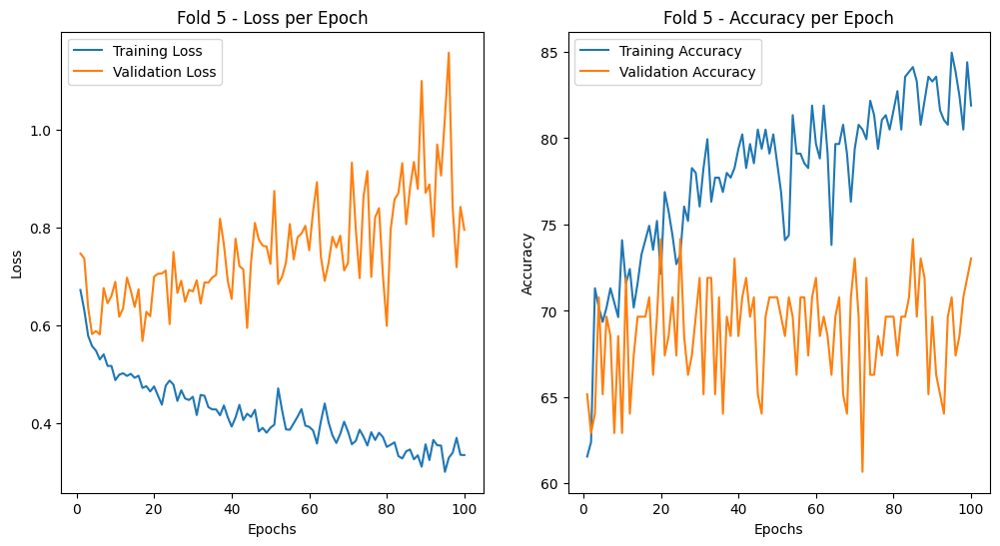

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.3754 - Train Accuracy: 78.77%
           - Validation Loss: 0.6644 - Validation Accuracy: 72.22%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.3217 - Train Accuracy: 81.84%
           - Validation Loss: 0.7989 - Validation Accuracy: 68.89%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.2835 - Train Accuracy: 88.83%
           - Validation Loss: 1.0263 - Validation Accuracy: 64.44%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.3794 - Train Accuracy: 79.67%
           - Validation Loss: 0.5813 - Validation Accuracy: 69.66%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.3349 - Train Accuracy: 81.89%
    

In [71]:
# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('tuning_spectral_transformer_encoder_decoder', exist_ok=True)

# Data Dummy (untuk mengganti dengan data asli)
# input_dim = 128  # Misal jumlah fitur
# num_classes = 10  # Misal jumlah kelas
input_dim = X_train.shape[1]
num_classes = len(set(y_train))
# X_train_tensor = torch.randn(500, input_dim)  # 500 sampel training
# y_train_tensor = torch.randint(0, num_classes, (500,))  # 500 label training

# Loop KFold
for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    # DataLoader
    train_loader_fold = DataLoader(train_dataset_fold, batch_size=16, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=16, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerEncoderDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 100
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
            outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'tuning_spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_tuning_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [72]:
from sklearn.metrics import classification_report
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan classification report untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}:')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2341805054.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Classification Report for Fold 1:
              precision    recall  f1-score   support

          MI       0.70      0.79      0.74        47
      Normal       0.73      0.63      0.68        43

    accuracy                           0.71        90
   macro avg       0.71      0.71      0.71        90
weighted avg       0.71      0.71      0.71        90

--------------------------------------------------------------------------------
Classification Report for Fold 2:
              precision    recall  f1-score   support

          MI       0.69      0.72      0.71        47
      Normal       0.68      0.65      0.67        43

    accuracy                           0.69        90
   macro avg       0.69      0.69      0.69        90
weighted avg       0.69      0.69      0.69        90

--------------------------------------------------------------------------------
Classification Report for Fold 3:
              precision    recall  f1-score   support

          MI       0.60    

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2341805054.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

In [75]:
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix
import torch
from torch.utils.data import DataLoader, TensorDataset

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Loop untuk menampilkan metrik untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)  # Forward pass
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\79907921.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

Metrics for Fold 1:
Accuracy: 0.7111
Precision: 0.7139
F1-Score: 0.7075
Sensitivity (Recall for MI): 0.6279
Specificity (True Negative Rate): 0.7872
--------------------------------------------------------------------------------
Metrics for Fold 2:
Accuracy: 0.6889
Precision: 0.6884
F1-Score: 0.6875
Sensitivity (Recall for MI): 0.6512
Specificity (True Negative Rate): 0.7234
--------------------------------------------------------------------------------
Metrics for Fold 3:
Accuracy: 0.6333
Precision: 0.6351
F1-Score: 0.6333
Sensitivity (Recall for MI): 0.6042
Specificity (True Negative Rate): 0.6667
--------------------------------------------------------------------------------
Metrics for Fold 4:
Accuracy: 0.6966
Precision: 0.6997
F1-Score: 0.6910
Sensitivity (Recall for MI): 0.7872
Specificity (True Negative Rate): 0.5952
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\79907921.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lon

Metrics for Fold 5:
Accuracy: 0.6966
Precision: 0.6947
F1-Score: 0.6889
Sensitivity (Recall for MI): 0.7755
Specificity (True Negative Rate): 0.6000
--------------------------------------------------------------------------------


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3834644881.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

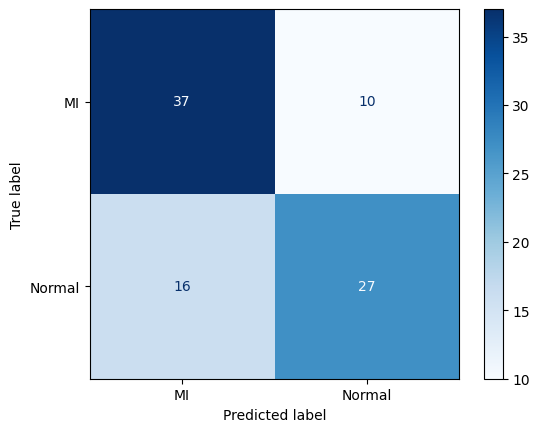

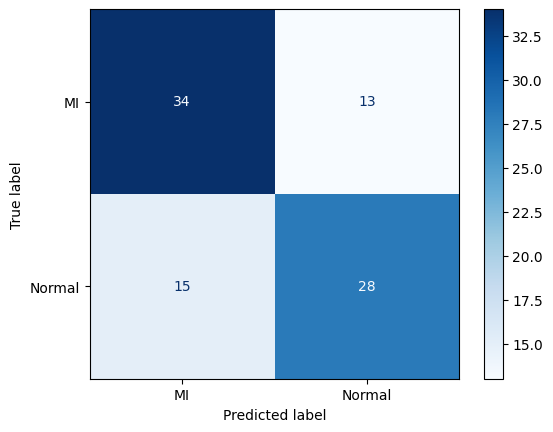

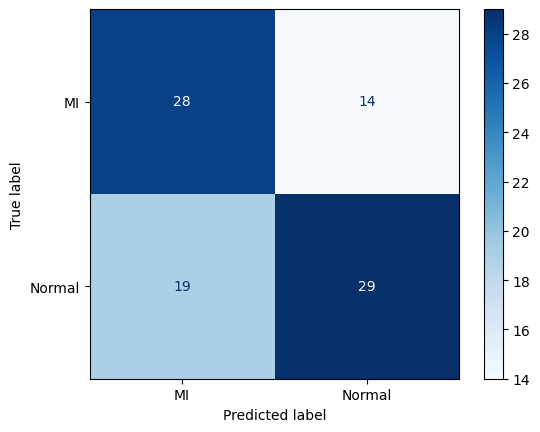

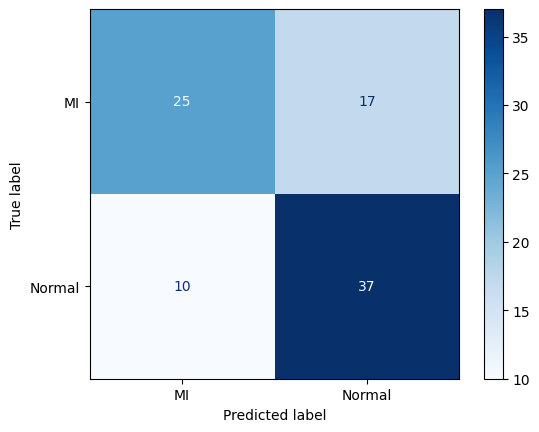

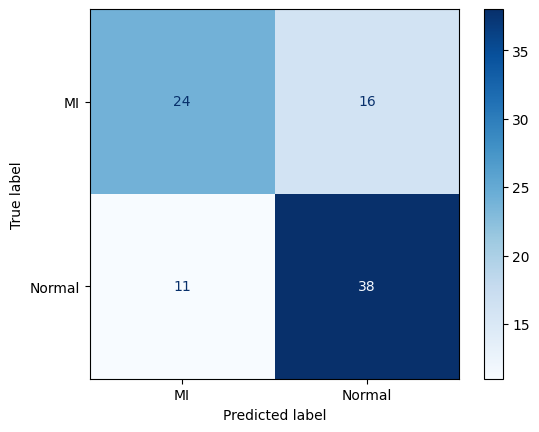

In [74]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_spectral_transformer_encoder_decoder/transformer_encoder_decoder_model_tuning_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs, labels=[0, 1])  # Misalnya label 0 dan 1 untuk 'MI' dan 'Normal'

    # Menampilkan confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['MI', 'Normal'])
    disp.plot(cmap=plt.cm.Blues, values_format='d')


## (Tuning) Temporal with Transformer Encoder Decoder

In [76]:
selected_columns = ['Entropy', 'Wavelet Means', 'Wavelet std', 'Wavelet max', 'Wavelet min', 'Med_wavelet', 'Var_wavelet', 'Skew_wavelet', 'Q1_wavelet', 'Q3_wavelet', 'IQR_wavelet', 'MinMax_wavelet', 'Kurt_wavelet', 'Label']
# Membuat dataframe baru dengan kolom pilihan
df_temporal = df_combine_scaled[selected_columns]

# Menampilkan dataframe baru
print(df_temporal.head())

    Entropy  Wavelet Means  Wavelet std  Wavelet max  Wavelet min  \
0  0.063608      -1.137174    -0.430682     0.024031     0.004692   
1  0.064888      -0.388901    -0.565070    -0.549047     0.441349   
2  0.063367       0.180394    -0.112938    -0.376300     0.355416   
3  0.068559       0.408853     1.567008     1.825143    -0.973889   
4  0.062193      -0.404628    -0.506024    -0.423697     0.363664   

   Med_wavelet  Var_wavelet  Skew_wavelet  Q1_wavelet  Q3_wavelet  \
0    -0.889833    -0.218548      1.146071   -0.076698    0.026616   
1    -0.241600    -0.239203     -0.594643    0.178925   -0.172615   
2     1.042363    -0.151908     -0.491310   -0.838081    0.944422   
3     0.205136     0.616326      2.953232   -0.848416    0.973499   
4     0.454240    -0.230679     -0.101673   -0.313961    0.340572   

   IQR_wavelet  MinMax_wavelet  Kurt_wavelet Label  
0     0.051833        0.226780      1.470453    MI  
1    -0.176615       -0.536473     -0.367429    MI  
2     0.895

In [77]:
X = df_temporal.drop('Label', axis=1).values
y = df_temporal['Label'].values

In [78]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [80]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt


# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [81]:
# Definisikan Model dengan Encoder dan Decoder
class TransformerEncoderDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_encoder_layers=3, num_decoder_layers=3, dim_feedforward=128):
        super(TransformerEncoderDecoderModel, self).__init__()

        # Embedding untuk input dan target
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Transformer Encoder
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_encoder_layers
        )

        # Transformer Decoder
        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_decoder_layers
        )

        # Linear layer untuk mengubah output decoder menjadi logits
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, src, tgt):
        # src: input data (e.g., features or sequences)
        # tgt: target sequence (e.g., labels or tokens)

        # Encode the source input
        src = self.embedding(src)
        memory = self.transformer_encoder(src.unsqueeze(1))  # Add sequence dim if needed

        # Decode the target input
        tgt = self.embedding(tgt)
        output = self.transformer_decoder(tgt.unsqueeze(1), memory)  # Pass tgt and memory to decoder

        # Final output layer (logits)
        output = self.fc(output.squeeze(1))  # Squeeze sequence dimension

        return output

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/100, Loss: 0.8835, Accuracy: 52.23%, Validation Loss: 0.6958, Validation Accuracy: 52.22%
Epoch 2/100, Loss: 0.7126, Accuracy: 49.72%, Validation Loss: 0.7164, Validation Accuracy: 47.78%
Epoch 3/100, Loss: 0.7221, Accuracy: 46.93%, Validation Loss: 0.7094, Validation Accuracy: 47.78%
Epoch 4/100, Loss: 0.6856, Accuracy: 55.87%, Validation Loss: 0.6716, Validation Accuracy: 54.44%
Epoch 5/100, Loss: 0.6765, Accuracy: 59.50%, Validation Loss: 0.6436, Validation Accuracy: 58.89%
Epoch 6/100, Loss: 0.6427, Accuracy: 62.01%, Validation Loss: 0.5980, Validation Accuracy: 66.67%
Epoch 7/100, Loss: 0.6448, Accuracy: 58.94%, Validation Loss: 0.6533, Validation Accuracy: 51.11%
Epoch 8/100, Loss: 0.6238, Accuracy: 61.17%, Validation Loss: 0.5892, Validation Accuracy: 63.33%
Epoch 9/100, Loss: 0.5585, Accuracy: 68.99%, Validation Loss: 0.5675, Validation Accuracy: 66.67%
Epoch 10/100, Loss: 0.5612, Accuracy: 69.55%, Validation Loss: 0.6566, Validation Accuracy: 48.89%
Epoch 11/100, Loss:

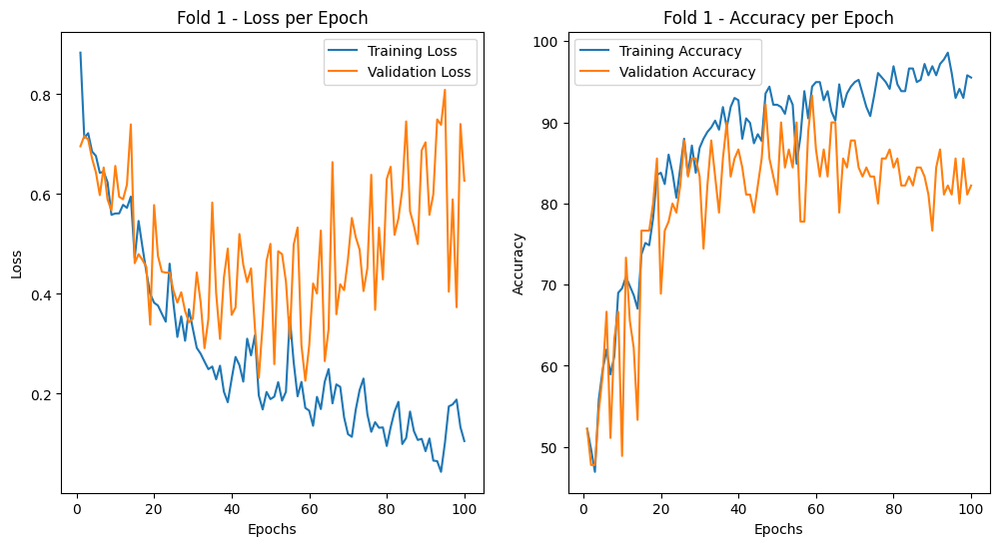

Fold 2
Epoch 1/100, Loss: 0.7999, Accuracy: 51.40%, Validation Loss: 0.7295, Validation Accuracy: 52.22%
Epoch 2/100, Loss: 0.6959, Accuracy: 54.47%, Validation Loss: 0.7183, Validation Accuracy: 47.78%
Epoch 3/100, Loss: 0.7043, Accuracy: 54.75%, Validation Loss: 0.6836, Validation Accuracy: 63.33%
Epoch 4/100, Loss: 0.6612, Accuracy: 60.61%, Validation Loss: 0.8566, Validation Accuracy: 47.78%
Epoch 5/100, Loss: 0.6892, Accuracy: 59.78%, Validation Loss: 0.7042, Validation Accuracy: 47.78%
Epoch 6/100, Loss: 0.6676, Accuracy: 61.73%, Validation Loss: 0.6891, Validation Accuracy: 60.00%
Epoch 7/100, Loss: 0.6662, Accuracy: 61.17%, Validation Loss: 0.6666, Validation Accuracy: 67.78%
Epoch 8/100, Loss: 0.6778, Accuracy: 57.82%, Validation Loss: 0.6654, Validation Accuracy: 55.56%
Epoch 9/100, Loss: 0.6526, Accuracy: 61.45%, Validation Loss: 0.6674, Validation Accuracy: 65.56%
Epoch 10/100, Loss: 0.6903, Accuracy: 53.63%, Validation Loss: 0.6817, Validation Accuracy: 57.78%
Epoch 11/100

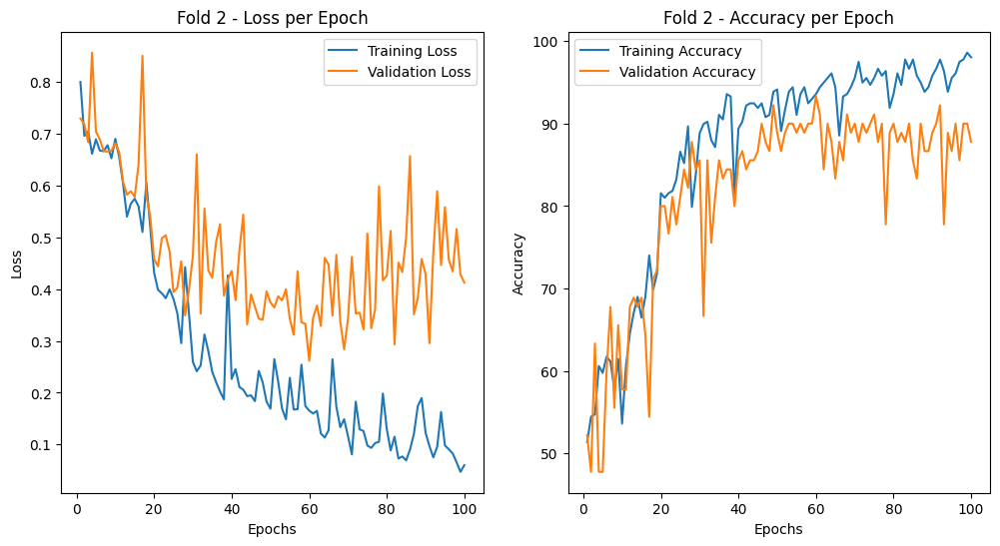

Fold 3
Epoch 1/100, Loss: 0.7674, Accuracy: 51.96%, Validation Loss: 0.6863, Validation Accuracy: 56.67%
Epoch 2/100, Loss: 0.7046, Accuracy: 56.42%, Validation Loss: 0.6731, Validation Accuracy: 61.11%
Epoch 3/100, Loss: 0.6986, Accuracy: 56.42%, Validation Loss: 0.7390, Validation Accuracy: 53.33%
Epoch 4/100, Loss: 0.6992, Accuracy: 54.75%, Validation Loss: 0.6974, Validation Accuracy: 57.78%
Epoch 5/100, Loss: 0.6520, Accuracy: 63.41%, Validation Loss: 0.6744, Validation Accuracy: 57.78%
Epoch 6/100, Loss: 0.6351, Accuracy: 61.45%, Validation Loss: 0.6397, Validation Accuracy: 56.67%
Epoch 7/100, Loss: 0.6580, Accuracy: 61.45%, Validation Loss: 0.7292, Validation Accuracy: 50.00%
Epoch 8/100, Loss: 0.6978, Accuracy: 57.54%, Validation Loss: 0.6741, Validation Accuracy: 55.56%
Epoch 9/100, Loss: 0.6152, Accuracy: 66.20%, Validation Loss: 0.6552, Validation Accuracy: 55.56%
Epoch 10/100, Loss: 0.5766, Accuracy: 67.04%, Validation Loss: 0.5785, Validation Accuracy: 65.56%
Epoch 11/100

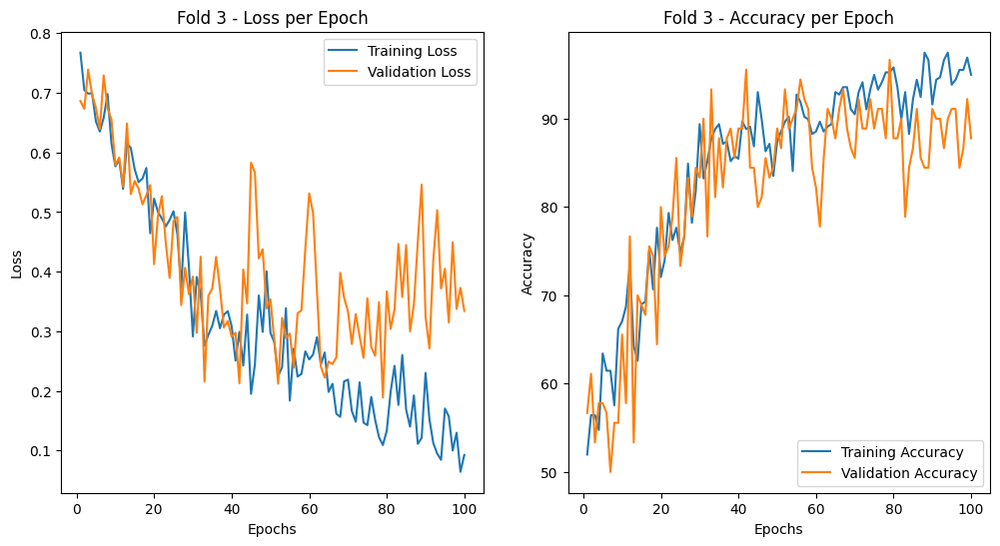

Fold 4
Epoch 1/100, Loss: 0.7877, Accuracy: 53.20%, Validation Loss: 0.6965, Validation Accuracy: 43.82%
Epoch 2/100, Loss: 0.6991, Accuracy: 53.20%, Validation Loss: 0.6983, Validation Accuracy: 52.81%
Epoch 3/100, Loss: 0.6483, Accuracy: 57.94%, Validation Loss: 0.7227, Validation Accuracy: 49.44%
Epoch 4/100, Loss: 0.6566, Accuracy: 61.00%, Validation Loss: 0.9393, Validation Accuracy: 42.70%
Epoch 5/100, Loss: 0.6501, Accuracy: 61.00%, Validation Loss: 0.7478, Validation Accuracy: 53.93%
Epoch 6/100, Loss: 0.6344, Accuracy: 65.18%, Validation Loss: 0.6743, Validation Accuracy: 56.18%
Epoch 7/100, Loss: 0.6091, Accuracy: 64.07%, Validation Loss: 0.6727, Validation Accuracy: 59.55%
Epoch 8/100, Loss: 0.6395, Accuracy: 61.00%, Validation Loss: 0.6376, Validation Accuracy: 62.92%
Epoch 9/100, Loss: 0.5967, Accuracy: 61.56%, Validation Loss: 0.5920, Validation Accuracy: 62.92%
Epoch 10/100, Loss: 0.5664, Accuracy: 68.52%, Validation Loss: 0.6729, Validation Accuracy: 60.67%
Epoch 11/100

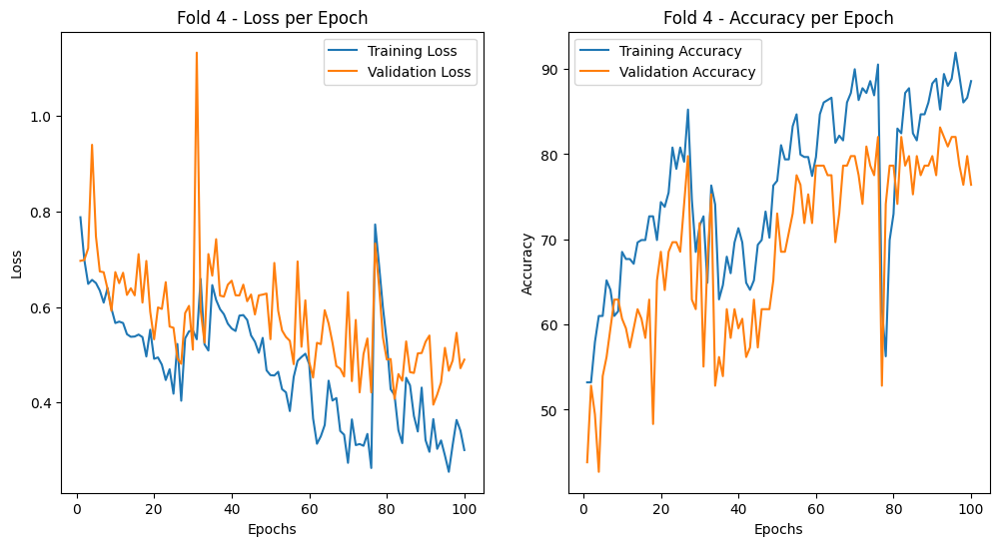

Fold 5
Epoch 1/100, Loss: 0.7994, Accuracy: 49.30%, Validation Loss: 0.6957, Validation Accuracy: 55.06%
Epoch 2/100, Loss: 0.7186, Accuracy: 50.14%, Validation Loss: 0.6887, Validation Accuracy: 55.06%
Epoch 3/100, Loss: 0.7133, Accuracy: 49.86%, Validation Loss: 0.6929, Validation Accuracy: 52.81%
Epoch 4/100, Loss: 0.7140, Accuracy: 44.01%, Validation Loss: 0.6884, Validation Accuracy: 55.06%
Epoch 5/100, Loss: 0.7044, Accuracy: 52.65%, Validation Loss: 0.6958, Validation Accuracy: 43.82%
Epoch 6/100, Loss: 0.6870, Accuracy: 56.55%, Validation Loss: 0.6698, Validation Accuracy: 57.30%
Epoch 7/100, Loss: 0.6920, Accuracy: 57.38%, Validation Loss: 0.6972, Validation Accuracy: 55.06%
Epoch 8/100, Loss: 0.6964, Accuracy: 51.81%, Validation Loss: 0.6886, Validation Accuracy: 56.18%
Epoch 9/100, Loss: 0.6877, Accuracy: 56.55%, Validation Loss: 0.6796, Validation Accuracy: 58.43%
Epoch 10/100, Loss: 0.6839, Accuracy: 58.50%, Validation Loss: 0.6755, Validation Accuracy: 57.30%
Epoch 11/100

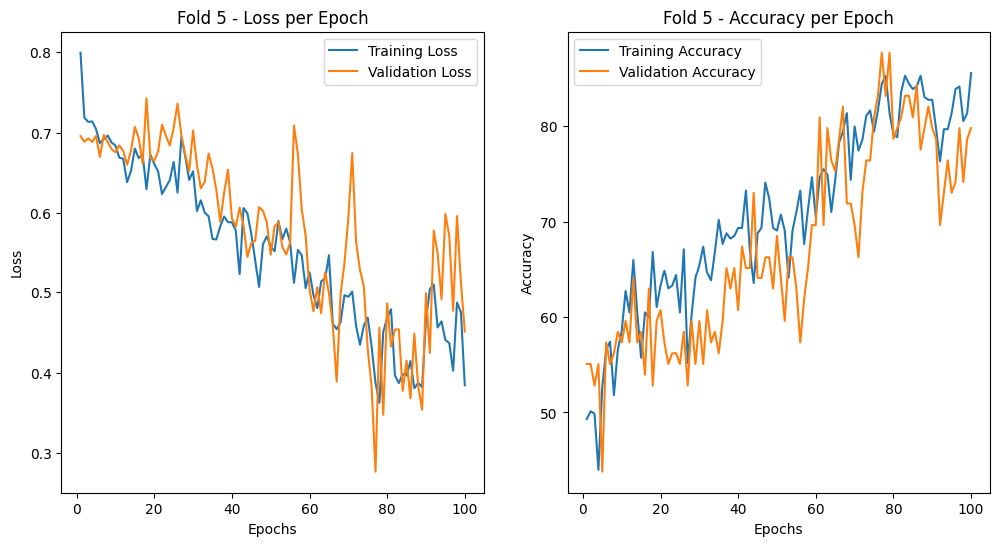

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.1053 - Train Accuracy: 95.53%
           - Validation Loss: 0.6268 - Validation Accuracy: 82.22%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.0600 - Train Accuracy: 98.04%
           - Validation Loss: 0.4126 - Validation Accuracy: 87.78%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.0925 - Train Accuracy: 94.97%
           - Validation Loss: 0.3340 - Validation Accuracy: 87.78%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.3006 - Train Accuracy: 88.58%
           - Validation Loss: 0.4898 - Validation Accuracy: 76.40%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.3843 - Train Accuracy: 85.52%
    

In [82]:
# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('tuning_temporal_transformer_encoder_decoder', exist_ok=True)

# Data Dummy (untuk mengganti dengan data asli)
# input_dim = 128  # Misal jumlah fitur
# num_classes = 10  # Misal jumlah kelas
input_dim = X_train.shape[1]
num_classes = len(set(y_train))
# X_train_tensor = torch.randn(500, input_dim)  # 500 sampel training
# y_train_tensor = torch.randint(0, num_classes, (500,))  # 500 label training

# Loop KFold
for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    # DataLoader
    train_loader_fold = DataLoader(train_dataset_fold, batch_size=16, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=16, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerEncoderDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 100
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
            outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'tuning_temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [83]:
from sklearn.metrics import classification_report
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan classification report untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}:')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3862489237.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Classification Report for Fold 1:
              precision    recall  f1-score   support

          MI       0.83      0.64      0.72        47
      Normal       0.69      0.86      0.76        43

    accuracy                           0.74        90
   macro avg       0.76      0.75      0.74        90
weighted avg       0.76      0.74      0.74        90

--------------------------------------------------------------------------------
Classification Report for Fold 2:
              precision    recall  f1-score   support

          MI       0.86      0.91      0.89        47
      Normal       0.90      0.84      0.87        43

    accuracy                           0.88        90
   macro avg       0.88      0.88      0.88        90
weighted avg       0.88      0.88      0.88        90

--------------------------------------------------------------------------------
Classification Report for Fold 3:
              precision    recall  f1-score   support

          MI       0.90    

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\3862489237.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

In [84]:
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix
import torch
from torch.utils.data import DataLoader, TensorDataset

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Loop untuk menampilkan metrik untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)  # Forward pass
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\292545102.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no lo

Metrics for Fold 1:
Accuracy: 0.7444
Precision: 0.7593
F1-Score: 0.7429
Sensitivity (Recall for MI): 0.8605
Specificity (True Negative Rate): 0.6383
--------------------------------------------------------------------------------
Metrics for Fold 2:
Accuracy: 0.8778
Precision: 0.8800
F1-Score: 0.8770
Sensitivity (Recall for MI): 0.8372
Specificity (True Negative Rate): 0.9149
--------------------------------------------------------------------------------
Metrics for Fold 3:
Accuracy: 0.9000
Precision: 0.9002
F1-Score: 0.8994
Sensitivity (Recall for MI): 0.9167
Specificity (True Negative Rate): 0.8810
--------------------------------------------------------------------------------
Metrics for Fold 4:
Accuracy: 0.7865
Precision: 0.7970
F1-Score: 0.7861
Sensitivity (Recall for MI): 0.7021
Specificity (True Negative Rate): 0.8810
--------------------------------------------------------------------------------
Metrics for Fold 5:
Accuracy: 0.7865
Precision: 0.8265
F1-Score: 0.7848
Sensitiv

C:\Users\asus\AppData\Local\Temp\ipykernel_16932\292545102.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2918483147.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

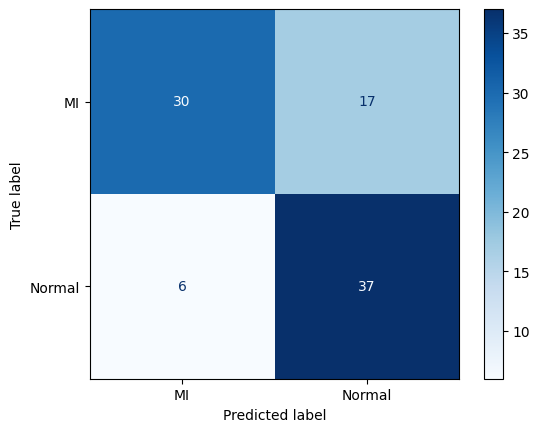

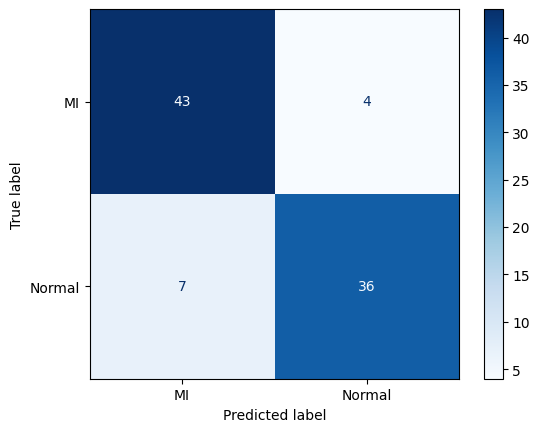

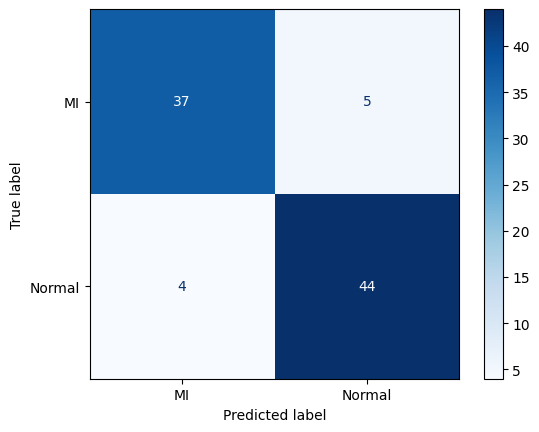

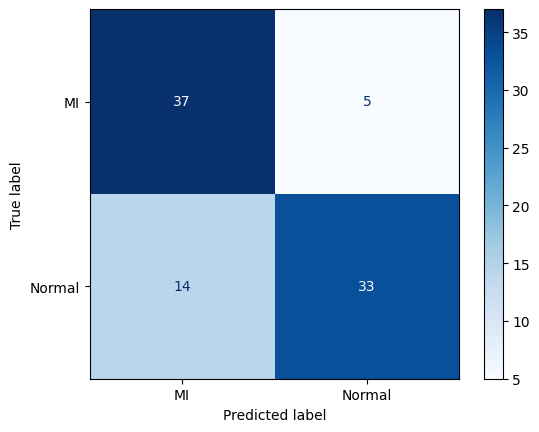

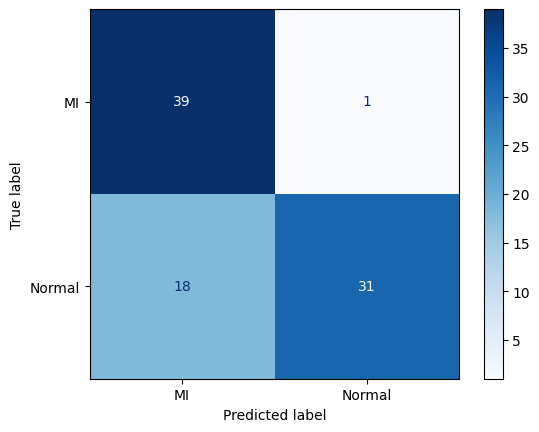

In [85]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_temporal_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs, labels=[0, 1])  # Misalnya label 0 dan 1 untuk 'MI' dan 'Normal'

    # Menampilkan confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['MI', 'Normal'])
    disp.plot(cmap=plt.cm.Blues, values_format='d')


## (Tuning) Multi Scale with Transformer Encoder Decoder 

In [86]:
X = df_combine_scaled.drop('Label', axis=1).values
y = df_combine_scaled['Label'].values

In [87]:
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [89]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt

In [90]:
# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Dataset and DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [91]:
# Definisikan Model dengan Encoder dan Decoder
class TransformerEncoderDecoderModel(nn.Module):
    def __init__(self, input_dim, num_classes, nhead=4, num_encoder_layers=3, num_decoder_layers=3, dim_feedforward=128):
        super(TransformerEncoderDecoderModel, self).__init__()

        # Embedding untuk input dan target
        self.embedding = nn.Linear(input_dim, dim_feedforward)

        # Transformer Encoder
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_encoder_layers
        )

        # Transformer Decoder
        self.transformer_decoder = nn.TransformerDecoder(
            nn.TransformerDecoderLayer(d_model=dim_feedforward, nhead=nhead, dim_feedforward=dim_feedforward),
            num_layers=num_decoder_layers
        )

        # Linear layer untuk mengubah output decoder menjadi logits
        self.fc = nn.Linear(dim_feedforward, num_classes)

    def forward(self, src, tgt):
        # src: input data (e.g., features or sequences)
        # tgt: target sequence (e.g., labels or tokens)

        # Encode the source input
        src = self.embedding(src)
        memory = self.transformer_encoder(src.unsqueeze(1))  # Add sequence dim if needed

        # Decode the target input
        tgt = self.embedding(tgt)
        output = self.transformer_decoder(tgt.unsqueeze(1), memory)  # Pass tgt and memory to decoder

        # Final output layer (logits)
        output = self.fc(output.squeeze(1))  # Squeeze sequence dimension

        return output

# Model initialization
input_dim = X_train.shape[1]
num_classes = len(set(y_train))

Fold 1


C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch 1/100, Loss: 0.7195, Accuracy: 56.42%, Validation Loss: 0.6584, Validation Accuracy: 58.89%
Epoch 2/100, Loss: 0.6233, Accuracy: 65.92%, Validation Loss: 0.7011, Validation Accuracy: 47.78%
Epoch 3/100, Loss: 0.5901, Accuracy: 65.64%, Validation Loss: 0.5266, Validation Accuracy: 72.22%
Epoch 4/100, Loss: 0.5792, Accuracy: 70.67%, Validation Loss: 0.4935, Validation Accuracy: 76.67%
Epoch 5/100, Loss: 0.4769, Accuracy: 75.42%, Validation Loss: 0.5494, Validation Accuracy: 66.67%
Epoch 6/100, Loss: 0.4333, Accuracy: 78.21%, Validation Loss: 0.4650, Validation Accuracy: 80.00%
Epoch 7/100, Loss: 0.4028, Accuracy: 82.68%, Validation Loss: 0.5667, Validation Accuracy: 73.33%
Epoch 8/100, Loss: 0.4332, Accuracy: 80.17%, Validation Loss: 0.4958, Validation Accuracy: 74.44%
Epoch 9/100, Loss: 0.3732, Accuracy: 84.64%, Validation Loss: 0.4895, Validation Accuracy: 80.00%
Epoch 10/100, Loss: 0.3636, Accuracy: 85.75%, Validation Loss: 0.4598, Validation Accuracy: 78.89%
Epoch 11/100, Loss:

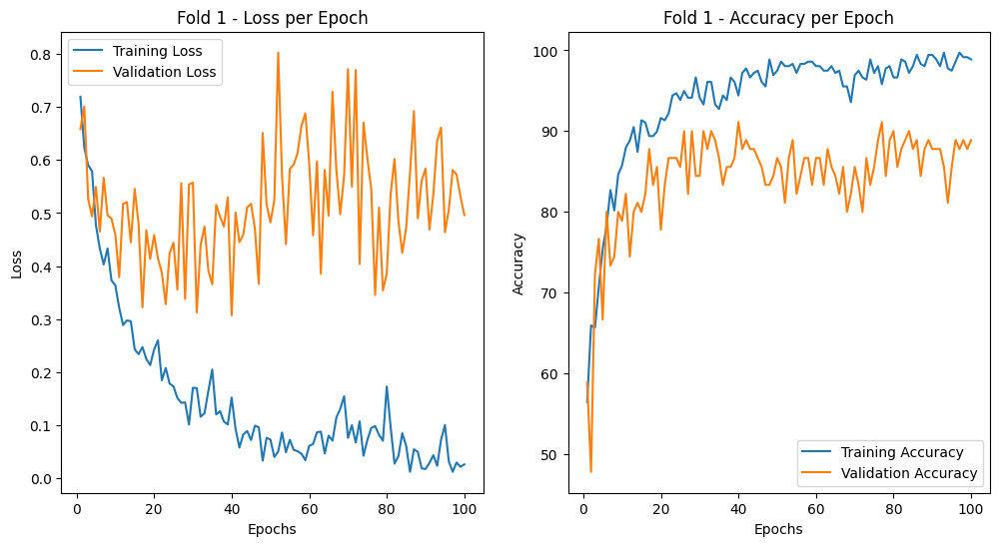

Fold 2
Epoch 1/100, Loss: 0.8013, Accuracy: 58.94%, Validation Loss: 0.5919, Validation Accuracy: 71.11%
Epoch 2/100, Loss: 0.5931, Accuracy: 67.32%, Validation Loss: 0.5933, Validation Accuracy: 64.44%
Epoch 3/100, Loss: 0.5598, Accuracy: 71.51%, Validation Loss: 0.5163, Validation Accuracy: 75.56%
Epoch 4/100, Loss: 0.4703, Accuracy: 76.54%, Validation Loss: 0.4906, Validation Accuracy: 74.44%
Epoch 5/100, Loss: 0.4606, Accuracy: 76.54%, Validation Loss: 0.4113, Validation Accuracy: 81.11%
Epoch 6/100, Loss: 0.3978, Accuracy: 82.68%, Validation Loss: 0.3916, Validation Accuracy: 81.11%
Epoch 7/100, Loss: 0.3438, Accuracy: 85.20%, Validation Loss: 0.4526, Validation Accuracy: 81.11%
Epoch 8/100, Loss: 0.3641, Accuracy: 84.64%, Validation Loss: 0.3856, Validation Accuracy: 84.44%
Epoch 9/100, Loss: 0.3380, Accuracy: 83.80%, Validation Loss: 0.3447, Validation Accuracy: 85.56%
Epoch 10/100, Loss: 0.3100, Accuracy: 86.59%, Validation Loss: 0.4470, Validation Accuracy: 80.00%
Epoch 11/100

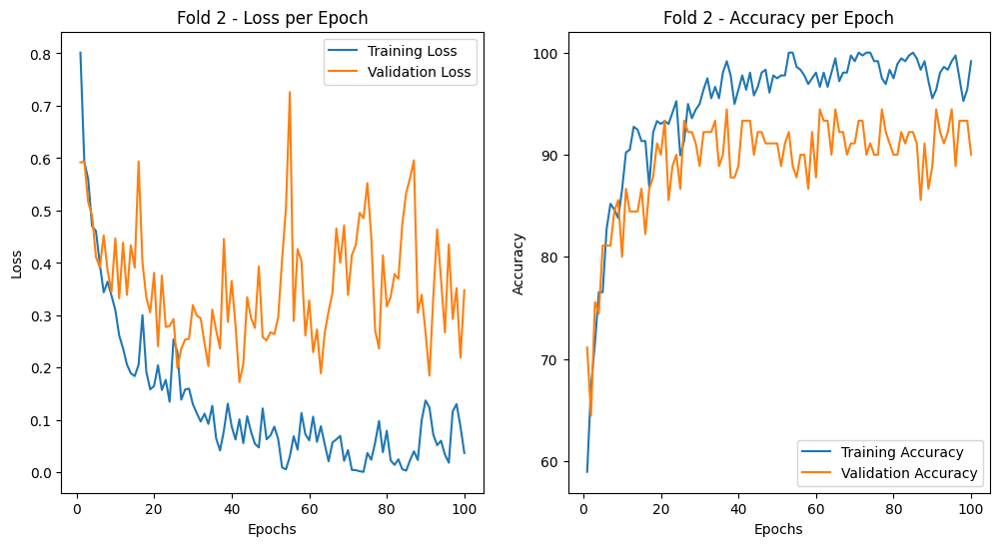

Fold 3
Epoch 1/100, Loss: 0.7126, Accuracy: 60.34%, Validation Loss: 0.7006, Validation Accuracy: 57.78%
Epoch 2/100, Loss: 0.5932, Accuracy: 67.88%, Validation Loss: 0.5510, Validation Accuracy: 67.78%
Epoch 3/100, Loss: 0.5313, Accuracy: 72.35%, Validation Loss: 0.5957, Validation Accuracy: 65.56%
Epoch 4/100, Loss: 0.4678, Accuracy: 76.82%, Validation Loss: 0.6027, Validation Accuracy: 66.67%
Epoch 5/100, Loss: 0.4570, Accuracy: 78.49%, Validation Loss: 0.5671, Validation Accuracy: 68.89%
Epoch 6/100, Loss: 0.5340, Accuracy: 74.30%, Validation Loss: 0.5223, Validation Accuracy: 72.22%
Epoch 7/100, Loss: 0.4493, Accuracy: 77.65%, Validation Loss: 0.6027, Validation Accuracy: 77.78%
Epoch 8/100, Loss: 0.4165, Accuracy: 81.56%, Validation Loss: 0.3851, Validation Accuracy: 83.33%
Epoch 9/100, Loss: 0.4009, Accuracy: 83.24%, Validation Loss: 0.4556, Validation Accuracy: 77.78%
Epoch 10/100, Loss: 0.3657, Accuracy: 84.36%, Validation Loss: 0.4956, Validation Accuracy: 78.89%
Epoch 11/100

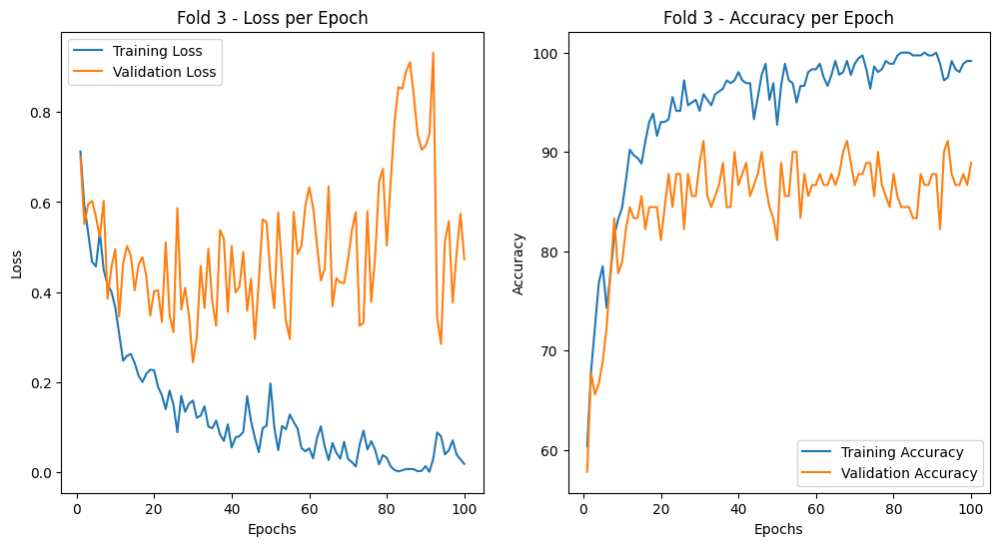

Fold 4
Epoch 1/100, Loss: 0.7697, Accuracy: 53.20%, Validation Loss: 0.6421, Validation Accuracy: 66.29%
Epoch 2/100, Loss: 0.5999, Accuracy: 64.62%, Validation Loss: 0.5638, Validation Accuracy: 68.54%
Epoch 3/100, Loss: 0.5042, Accuracy: 72.70%, Validation Loss: 0.7233, Validation Accuracy: 66.29%
Epoch 4/100, Loss: 0.6429, Accuracy: 67.69%, Validation Loss: 0.5269, Validation Accuracy: 69.66%
Epoch 5/100, Loss: 0.4330, Accuracy: 78.27%, Validation Loss: 0.5315, Validation Accuracy: 68.54%
Epoch 6/100, Loss: 0.4085, Accuracy: 80.22%, Validation Loss: 0.4876, Validation Accuracy: 75.28%
Epoch 7/100, Loss: 0.3697, Accuracy: 83.84%, Validation Loss: 0.4946, Validation Accuracy: 79.78%
Epoch 8/100, Loss: 0.3078, Accuracy: 87.47%, Validation Loss: 0.5990, Validation Accuracy: 78.65%
Epoch 9/100, Loss: 0.2952, Accuracy: 87.47%, Validation Loss: 0.5187, Validation Accuracy: 80.90%
Epoch 10/100, Loss: 0.3324, Accuracy: 84.96%, Validation Loss: 0.3843, Validation Accuracy: 89.89%
Epoch 11/100

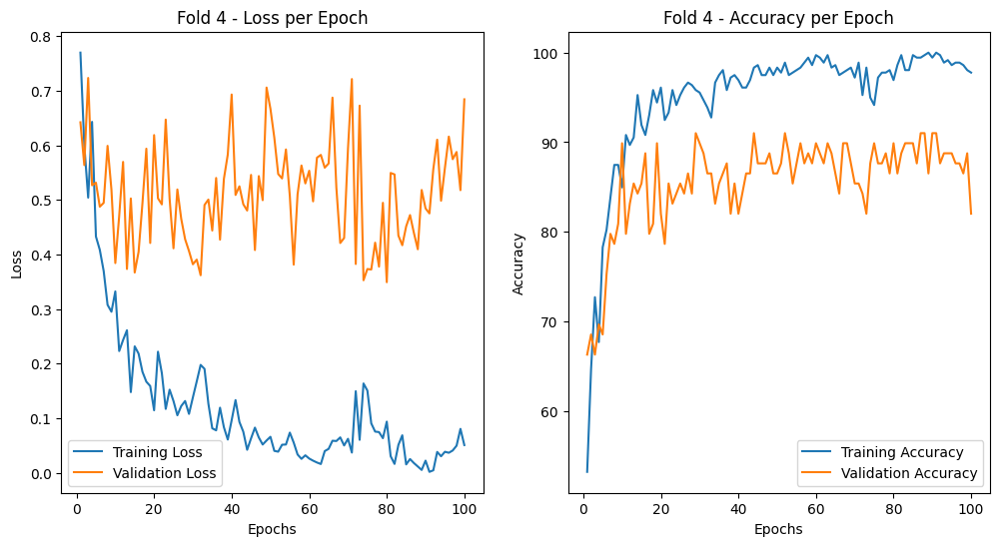

Fold 5
Epoch 1/100, Loss: 0.6603, Accuracy: 63.23%, Validation Loss: 0.7934, Validation Accuracy: 55.06%
Epoch 2/100, Loss: 0.6854, Accuracy: 62.95%, Validation Loss: 0.5219, Validation Accuracy: 68.54%
Epoch 3/100, Loss: 0.5028, Accuracy: 73.82%, Validation Loss: 0.6284, Validation Accuracy: 65.17%
Epoch 4/100, Loss: 0.4629, Accuracy: 77.44%, Validation Loss: 0.4639, Validation Accuracy: 77.53%
Epoch 5/100, Loss: 0.4538, Accuracy: 77.44%, Validation Loss: 0.5099, Validation Accuracy: 71.91%
Epoch 6/100, Loss: 0.3940, Accuracy: 81.89%, Validation Loss: 0.3692, Validation Accuracy: 82.02%
Epoch 7/100, Loss: 0.3513, Accuracy: 84.12%, Validation Loss: 0.3324, Validation Accuracy: 84.27%
Epoch 8/100, Loss: 0.3422, Accuracy: 85.79%, Validation Loss: 0.3900, Validation Accuracy: 86.52%
Epoch 9/100, Loss: 0.3076, Accuracy: 86.35%, Validation Loss: 0.5026, Validation Accuracy: 78.65%
Epoch 10/100, Loss: 0.2506, Accuracy: 90.53%, Validation Loss: 0.4676, Validation Accuracy: 82.02%
Epoch 11/100

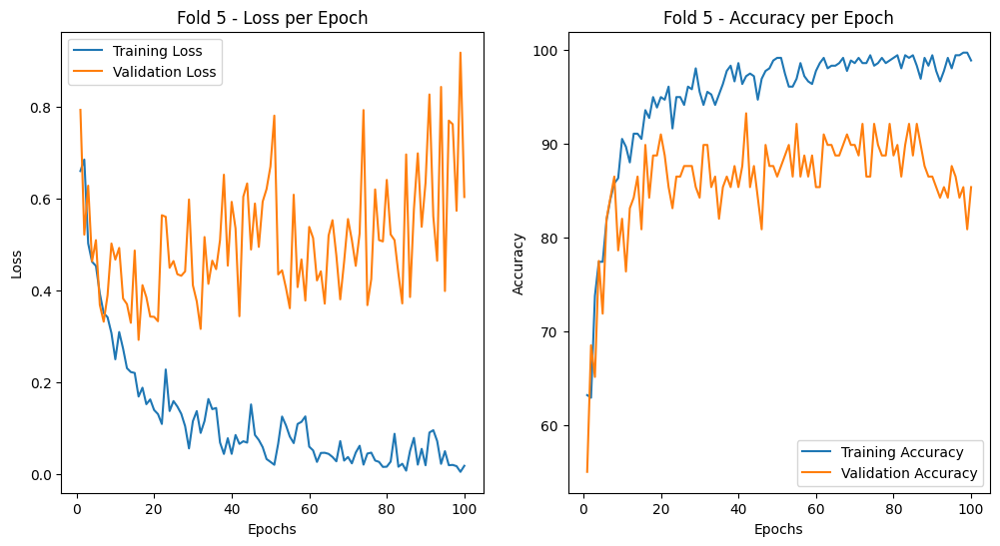

------------------------------------------------------------------------
Score per fold
------------------------------------------------------------------------
> Fold 1 - Train Loss: 0.0259 - Train Accuracy: 98.88%
           - Validation Loss: 0.4961 - Validation Accuracy: 88.89%
------------------------------------------------------------------------
> Fold 2 - Train Loss: 0.0371 - Train Accuracy: 99.16%
           - Validation Loss: 0.3479 - Validation Accuracy: 90.00%
------------------------------------------------------------------------
> Fold 3 - Train Loss: 0.0185 - Train Accuracy: 99.16%
           - Validation Loss: 0.4729 - Validation Accuracy: 88.89%
------------------------------------------------------------------------
> Fold 4 - Train Loss: 0.0510 - Train Accuracy: 97.77%
           - Validation Loss: 0.6842 - Validation Accuracy: 82.02%
------------------------------------------------------------------------
> Fold 5 - Train Loss: 0.0188 - Train Accuracy: 98.89%
    

In [92]:
# Inisialisasi KFold Cross-Validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Menyimpan hasil setiap fold
fold_no = 1
train_loss_per_fold = []
train_accuracy_per_fold = []
val_loss_per_fold = []
val_accuracy_per_fold = []

# Membuat direktori untuk menyimpan model jika belum ada
os.makedirs('tuning_multi_scale_transformer_encoder_decoder', exist_ok=True)

# Data Dummy (untuk mengganti dengan data asli)
# input_dim = 128  # Misal jumlah fitur
# num_classes = 10  # Misal jumlah kelas
input_dim = X_train.shape[1]
num_classes = len(set(y_train))
# X_train_tensor = torch.randn(500, input_dim)  # 500 sampel training
# y_train_tensor = torch.randint(0, num_classes, (500,))  # 500 label training

# Loop KFold
for train_index, val_index in kf.split(X_train_tensor):
    print(f'Fold {fold_no}')

    # Membagi data
    X_train_fold, X_val_fold = X_train_tensor[train_index], X_train_tensor[val_index]
    y_train_fold, y_val_fold = y_train_tensor[train_index], y_train_tensor[val_index]

    # Membuat TensorDataset untuk train dan validation fold
    train_dataset_fold = TensorDataset(X_train_fold, y_train_fold)
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)

    # DataLoader
    train_loader_fold = DataLoader(train_dataset_fold, batch_size=16, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=16, shuffle=False)

    # Inisialisasi model dan optimizer untuk setiap fold
    model = TransformerEncoderDecoderModel(input_dim, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Menyimpan loss dan akurasi per epoch
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    # Training loop untuk fold ini
    num_epochs = 100
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for X_batch, y_batch in train_loader_fold:
            optimizer.zero_grad()
            # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
            outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_train += y_batch.size(0)
            correct_train += (predicted == y_batch).sum().item()

        train_loss = running_loss / len(train_loader_fold)
        train_accuracy = 100 * correct_train / total_train

        # Evaluasi pada data validasi
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        with torch.no_grad():
            for X_batch, y_batch in val_loader_fold:
                # Untuk decoder, kita perlu target juga. Kita gunakan y_batch sebagai target untuk decoder di sini.
                outputs = model(X_batch, X_batch)  # X_batch sebagai input dan target untuk contoh ini
                loss = criterion(outputs, y_batch)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total_val += y_batch.size(0)
                correct_val += (predicted == y_batch).sum().item()

        val_loss /= len(val_loader_fold)
        val_accuracy = 100 * correct_val / total_val

        # Simpan loss dan akurasi per epoch
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, '
              f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%')

    train_loss_per_fold.append(train_loss)
    train_accuracy_per_fold.append(train_accuracy)
    val_loss_per_fold.append(val_loss)
    val_accuracy_per_fold.append(val_accuracy)

    # Simpan model
    model_filename = f'tuning_multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    torch.save(model.state_dict(), model_filename)
    print(f'Model for fold {fold_no} saved as {model_filename}')

    # Plot grafik loss dan akurasi
    epochs_range = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_losses, label='Training Loss')
    plt.plot(epochs_range, val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Fold {fold_no} - Loss per Epoch')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
    plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy per Epoch')
    plt.legend()

    plt.show()

    fold_no += 1

# Menampilkan hasil akhir
print('------------------------------------------------------------------------')
print('Score per fold')
for i in range(len(train_loss_per_fold)):
    print('------------------------------------------------------------------------')
    print(f'> Fold {i+1} - Train Loss: {train_loss_per_fold[i]:.4f} - Train Accuracy: {train_accuracy_per_fold[i]:.2f}%')
    print(f'           - Validation Loss: {val_loss_per_fold[i]:-.4f} - Validation Accuracy: {val_accuracy_per_fold[i]:.2f}%')
print('------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Average Train Accuracy: {np.mean(train_accuracy_per_fold):.2f} (+- {np.std(train_accuracy_per_fold):.2f})')
print(f'> Average Train Loss: {np.mean(train_loss_per_fold):.4f}')
print(f'> Average Validation Accuracy: {np.mean(val_accuracy_per_fold):.2f} (+- {np.std(val_accuracy_per_fold):.2f})')
print(f'> Average Validation Loss: {np.mean(val_loss_per_fold):.4f}')
print('------------------------------------------------------------------------')


In [93]:
from sklearn.metrics import classification_report
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan classification report untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menampilkan classification report untuk fold ini
    print(f'Classification Report for Fold {fold_no}:')
    print(classification_report(val_labels, val_outputs, target_names=['MI', 'Normal']))
    print('-' * 80)


C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2749979047.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_filename))
C:\Users\a

Classification Report for Fold 1:
              precision    recall  f1-score   support

          MI       0.91      0.91      0.91        47
      Normal       0.91      0.91      0.91        43

    accuracy                           0.91        90
   macro avg       0.91      0.91      0.91        90
weighted avg       0.91      0.91      0.91        90

--------------------------------------------------------------------------------
Classification Report for Fold 2:
              precision    recall  f1-score   support

          MI       0.95      0.87      0.91        47
      Normal       0.87      0.95      0.91        43

    accuracy                           0.91        90
   macro avg       0.91      0.91      0.91        90
weighted avg       0.91      0.91      0.91        90

--------------------------------------------------------------------------------
Classification Report for Fold 3:
              precision    recall  f1-score   support

          MI       0.87    

In [94]:
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix
import torch
from torch.utils.data import DataLoader, TensorDataset

# Fungsi untuk menghitung sensitivitas dan spesifisitas
def calculate_sensitivity_specificity(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()  # Ambil nilai dari confusion matrix
    sensitivity = tp / (tp + fn)  # Sensitivitas sama dengan recall untuk kelas positif (MI)
    specificity = tn / (tn + fp)  # Spesifisitas adalah true negative rate
    return sensitivity, specificity

# Loop untuk menampilkan metrik untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)  # Forward pass
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung metrik
    accuracy = accuracy_score(val_labels, val_outputs)
    precision = precision_score(val_labels, val_outputs, average='macro')
    f1 = f1_score(val_labels, val_outputs, average='macro')
    sensitivity, specificity = calculate_sensitivity_specificity(val_labels, val_outputs)

    # Menampilkan metrik untuk fold ini
    print(f'Metrics for Fold {fold_no}:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Sensitivity (Recall for MI): {sensitivity:.4f}')
    print(f'Specificity (True Negative Rate): {specificity:.4f}')
    print('-' * 80)


Metrics for Fold 1:
Accuracy: 0.9111
Precision: 0.9109
F1-Score: 0.9109
Sensitivity (Recall for MI): 0.9070
Specificity (True Negative Rate): 0.9149
--------------------------------------------------------------------------------
Metrics for Fold 2:
Accuracy: 0.9111
Precision: 0.9129
F1-Score: 0.9111
Sensitivity (Recall for MI): 0.9535
Specificity (True Negative Rate): 0.8723
--------------------------------------------------------------------------------
Metrics for Fold 3:
Accuracy: 0.9000
Precision: 0.9000
F1-Score: 0.8999
Sensitivity (Recall for MI): 0.8750
Specificity (True Negative Rate): 0.9286
--------------------------------------------------------------------------------
Metrics for Fold 4:
Accuracy: 0.8090
Precision: 0.8131
F1-Score: 0.8065
Sensitivity (Recall for MI): 0.8723
Specificity (True Negative Rate): 0.7381
--------------------------------------------------------------------------------
Metrics for Fold 5:
Accuracy: 0.8539
Precision: 0.8653
F1-Score: 0.8491
Sensitiv

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\4032449768.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

C:\Users\asus\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
C:\Users\asus\AppData\Local\Temp\ipykernel_16932\2169921349.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no l

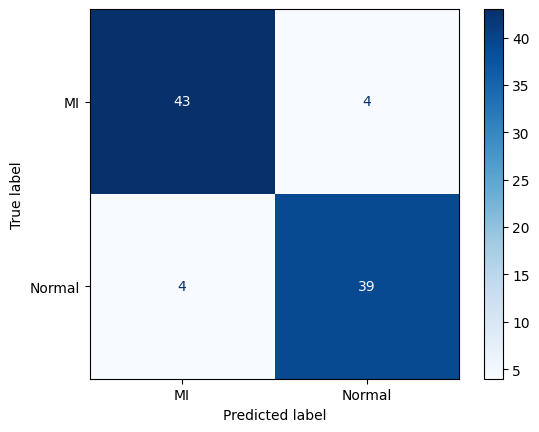

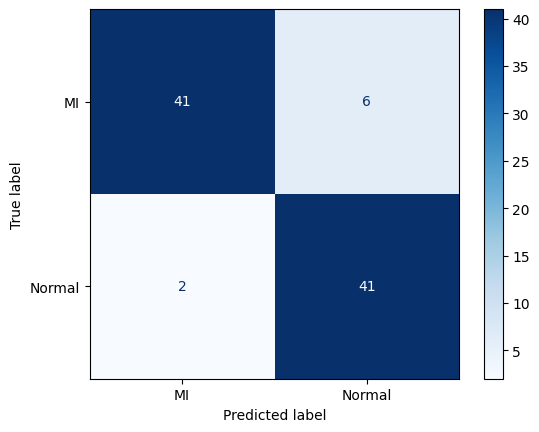

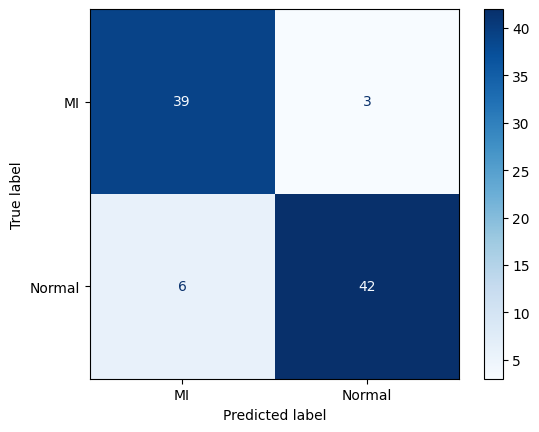

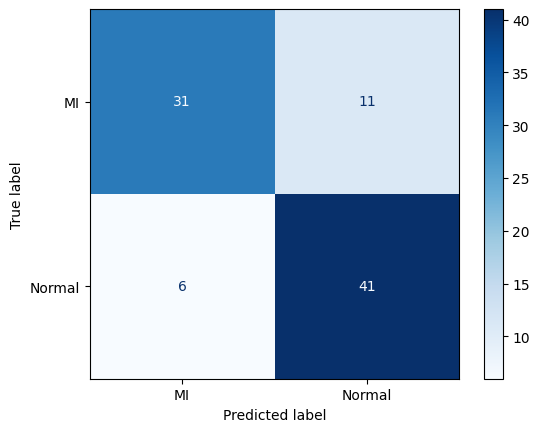

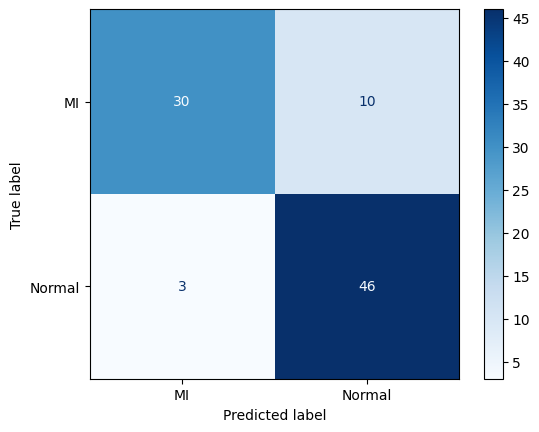

In [95]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset

# Loop untuk menampilkan confusion matrix untuk setiap fold
for fold_no in range(1, 6):  # Jika Anda menggunakan 5 fold
    # Load model untuk fold ini
    model_filename = f'tuning_multi_scale_transformer_encoder_decoder/transformer_encoder_decoder_model_fold_{fold_no}.pth'
    model = TransformerEncoderDecoderModel(input_dim, num_classes)  # Inisialisasi model yang sama
    model.load_state_dict(torch.load(model_filename))

    # Mengambil data validasi untuk fold ini
    _, val_index = list(kf.split(X_train_tensor))[fold_no - 1]
    X_val_fold = X_train_tensor[val_index]
    y_val_fold = y_train_tensor[val_index]

    # Membuat DataLoader untuk fold ini
    val_dataset_fold = TensorDataset(X_val_fold, y_val_fold)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=32, shuffle=False)

    # Evaluasi pada data validasi untuk fold ini
    model.eval()
    val_outputs = []
    val_labels = []

    with torch.no_grad():
        for X_batch, y_batch in val_loader_fold:
            outputs = model(X_batch, X_batch)
            _, predicted = torch.max(outputs.data, 1)

            # Simpan prediksi dan label asli
            val_outputs.extend(predicted.tolist())
            val_labels.extend(y_batch.tolist())

    # Menghitung confusion matrix untuk fold ini
    cm = confusion_matrix(val_labels, val_outputs, labels=[0, 1])  # Misalnya label 0 dan 1 untuk 'MI' dan 'Normal'

    # Menampilkan confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['MI', 'Normal'])
    disp.plot(cmap=plt.cm.Blues, values_format='d')
